# Problem Statement
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn.

In this competition, your goal is to build a machine learning model that is able to predict churning customers based on the features provided for their usage.

## Importing Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [2]:
# import libraries
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime

import warnings
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline

pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 300)

## Loading Test Data

In [3]:
# read data
churn = pd.read_csv("train.csv")

## Data information and Description

In [4]:
# look at initial rows of the data
churn.head(10)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.00,0.00,0.00,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,

In [5]:
# feature type summary
churn.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [6]:
# look at data statistics
churn.describe(include='all')

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999,69600,69266,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,68898,68765,67538,69999.000000,69999.000000

In [7]:
# create backup of data
original = churn.copy()

## Loading data description and eloborate the column name

In [8]:
#loading the data dictionary
data_dictionary = pd.read_csv("data_dictionary.csv")

In [9]:
#removing the extra spaces
data_dictionary.Acronyms = data_dictionary.Acronyms.apply(lambda x : x.lower().strip())
data_dictionary.Description = data_dictionary.Description.apply(lambda x : x.lower().strip())
data_dictionary.set_index("Acronyms").head()

,Description
Acronyms,
circle_id,telecom circle area to which the customer belo...
loc,local calls within same telecom circle
std,std calls outside the calling circle
ic,incoming calls
og,outgoing calls


In [10]:
def eloborate(col):
    arr = col.split("_")
    new_col = ""
    for i in arr:
        if i in list(data_dictionary.Acronyms):
            new_col+=data_dictionary[data_dictionary.Acronyms == i].Description.values[0]+"_"
        else:
            new_col+=i+"_"
    return new_col[0:-1]

In [11]:
for col in churn.columns:
    eloborate(col)

'id'

'circle_id'

'local calls  within same telecom circle_outgoing calls_operator t to other operator fixed line_minutes of usage  voice calls'

'std calls  outside the calling circle_outgoing calls_operator t to other operator fixed line_minutes of usage  voice calls'

'local calls  within same telecom circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls'

'last_date_of_month_6'

'last_date_of_month_7'

'last_date_of_month_8'

'average revenue per user_6'

'average revenue per user_7'

'average revenue per user_8'

'all kind of calls within the same operator network_minutes of usage  voice calls_6'

'all kind of calls within the same operator network_minutes of usage  voice calls_7'

'all kind of calls within the same operator network_minutes of usage  voice calls_8'

'all kind of calls outside the operator t network_minutes of usage  voice calls_6'

'all kind of calls outside the operator t network_minutes of usage  voice calls_7'

'all kind of calls outside the operator t network_minutes of usage  voice calls_8'

'indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_6'

'indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_7'

'indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_8'

'indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_6'

'indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_7'

'indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_8'

'local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_6'

'local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_7'

'local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_8'

'std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_6'

'std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_7'

'std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_8'

'isd calls_outgoing calls_minutes of usage  voice calls_6'

'isd calls_outgoing calls_minutes of usage  voice calls_7'

'isd calls_outgoing calls_minutes of usage  voice calls_8'

'special calls_outgoing calls_minutes of usage  voice calls_6'

'special calls_outgoing calls_minutes of usage  voice calls_7'

'special calls_outgoing calls_minutes of usage  voice calls_8'

'outgoing calls_others_6'

'outgoing calls_others_7'

'outgoing calls_others_8'

'total_outgoing calls_minutes of usage  voice calls_6'

'total_outgoing calls_minutes of usage  voice calls_7'

'total_outgoing calls_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_6'

'local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_7'

'local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_operator t to other operator fixed line_minutes of usage  voice calls_8'

'std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_6'

'std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_7'

'std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_8'

'total_incoming calls_minutes of usage  voice calls_6'

'total_incoming calls_minutes of usage  voice calls_7'

'total_incoming calls_minutes of usage  voice calls_8'

'special calls_incoming calls_minutes of usage  voice calls_6'

'special calls_incoming calls_minutes of usage  voice calls_7'

'special calls_incoming calls_minutes of usage  voice calls_8'

'isd calls_incoming calls_minutes of usage  voice calls_6'

'isd calls_incoming calls_minutes of usage  voice calls_7'

'isd calls_incoming calls_minutes of usage  voice calls_8'

'incoming calls_others_6'

'incoming calls_others_7'

'incoming calls_others_8'

'total_recharge_number_6'

'total_recharge_number_7'

'total_recharge_number_8'

'total_recharge_amount in local currency_6'

'total_recharge_amount in local currency_7'

'total_recharge_amount in local currency_8'

'maximum_recharge_amount in local currency_6'

'maximum_recharge_amount in local currency_7'

'maximum_recharge_amount in local currency_8'

'date_of_last_recharge_6'

'date_of_last_recharge_7'

'date_of_last_recharge_8'

'last_day_rch_amount in local currency_6'

'last_day_rch_amount in local currency_7'

'last_day_rch_amount in local currency_8'

'date_of_last_recharge_mobile internet_6'

'date_of_last_recharge_mobile internet_7'

'date_of_last_recharge_mobile internet_8'

'total_recharge_mobile internet_6'

'total_recharge_mobile internet_7'

'total_recharge_mobile internet_8'

'maximum_recharge_mobile internet_6'

'maximum_recharge_mobile internet_7'

'maximum_recharge_mobile internet_8'

'count_recharge_g network_6'

'count_recharge_g network_7'

'count_recharge_g network_8'

'count_recharge_g network_6'

'count_recharge_g network_7'

'count_recharge_g network_8'

'average_recharge_amount in local currency_mobile internet_6'

'average_recharge_amount in local currency_mobile internet_7'

'average_recharge_amount in local currency_mobile internet_8'

'mobile internet usage volume in mb_g network_mb_6'

'mobile internet usage volume in mb_g network_mb_7'

'mobile internet usage volume in mb_g network_mb_8'

'mobile internet usage volume in mb_g network_mb_6'

'mobile internet usage volume in mb_g network_mb_7'

'mobile internet usage volume in mb_g network_mb_8'

'average revenue per user_g network_6'

'average revenue per user_g network_7'

'average revenue per user_g network_8'

'average revenue per user_g network_6'

'average revenue per user_g network_7'

'average revenue per user_g network_8'

'scheme to use during specific night hours only_prepaid service schemes called  packs_user_6'

'scheme to use during specific night hours only_prepaid service schemes called  packs_user_7'

'scheme to use during specific night hours only_prepaid service schemes called  packs_user_8'

'service schemes with validity equivalent to a month_g network_6'

'service schemes with validity equivalent to a month_g network_7'

'service schemes with validity equivalent to a month_g network_8'

'service schemes with validity smaller than a month_g network_6'

'service schemes with validity smaller than a month_g network_7'

'service schemes with validity smaller than a month_g network_8'

'service schemes with validity equivalent to a month_g network_6'

'service schemes with validity equivalent to a month_g network_7'

'service schemes with validity equivalent to a month_g network_8'

'service schemes with validity smaller than a month_g network_6'

'service schemes with validity smaller than a month_g network_7'

'service schemes with validity smaller than a month_g network_8'

'fb_user_6'

'fb_user_7'

'fb_user_8'

'age on network  number of days the customer is using the operator t network'

'aug_volume based cost  when no specific scheme is not purchased and paid as per usage_g network'

'jul_volume based cost  when no specific scheme is not purchased and paid as per usage_g network'

'jun_volume based cost  when no specific scheme is not purchased and paid as per usage_g network'

'churn_probability'

In [12]:
#lets see the dimensions i.e. number of rows and columns of the loan dataset
churn.shape

(69999, 172)

## Categorizing Columns

In [13]:
date_cols = ['last_date_of_month_6',
             'last_date_of_month_7',
             'last_date_of_month_8',
             'date_of_last_rech_6',
             'date_of_last_rech_7',
             'date_of_last_rech_8',
             'date_of_last_rech_data_6',
             'date_of_last_rech_data_7',
             'date_of_last_rech_data_8']

churn_col = ["churn_probability"]

In [14]:
#lets get the continuous variables from the list
num_cols =  []
for col in churn.columns:
    if col not in date_cols + churn_col and churn[col].nunique() > 30 and (churn[col].dtype == np.int64 or churn[col].dtype == np.float64):
        num_cols.append(col)
        #print('"',col,'"',end=",",sep="")
        #print("Name :",col,"- >", df[col].nunique(),"- >", df[col].dtype)

#lets get the categorical variables from the list
cat_cols = []
for col in churn.columns:
    if col not in date_cols + churn_col and churn[col].nunique() <= 30 :
        cat_cols.append(col)
        #print('"',col,'"',end=",",sep="")
        #print("Name :",col,"- >", df[col].nunique()
        
# print the number of columns in each list
print("Date Columns :",len(date_cols))
print("Categorical Columns :",len(cat_cols))
print("Numerical Columns :",len(num_cols))
print("Total",len(date_cols)+len(cat_cols)+len(num_cols)+len(churn_col))

Date Columns : 9
Categorical Columns : 30
Numerical Columns : 132
Total 172


In [15]:
date_cols

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

In [16]:
cat_cols

['circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8',
 'count_rech_2g_6',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'sachet_2g_6',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8']

In [17]:
num_cols

['id',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'l

## Imputing missing values

In [18]:
# look at missing value ratio in each column
churn.isnull().mean()*100

id                           0.000000
circle_id                    0.000000
loc_og_t2o_mou               1.002871
std_og_t2o_mou               1.002871
loc_ic_t2o_mou               1.002871
last_date_of_month_6         0.000000
last_date_of_month_7         0.570008
last_date_of_month_8         1.047158
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  3.954342
onnet_mou_7                  3.838626
onnet_mou_8                  5.290076
offnet_mou_6                 3.954342
offnet_mou_7                 3.838626
offnet_mou_8                 5.290076
roam_ic_mou_6                3.954342
roam_ic_mou_7                3.838626
roam_ic_mou_8                5.290076
roam_og_mou_6                3.954342
roam_og_mou_7                3.838626
roam_og_mou_8                5.290076
loc_og_t2t_mou_6             3.954342
loc_og_t2t_mou_7             3.838626
loc_og_t2t_mou_8             5.290076
loc_og_t2m_m

In [19]:
#methods to remove or rename cols in the list
def remove_col(col):
    if col in cat_cols:
        cat_cols.remove(col)
    elif col in date_cols:
        date_cols.remove(col)
    elif col in num_cols:
        num_cols.remove(col)
    else:
        print(col," not present")
def rename_col(original,new):
    for i,col in enumerate(cat_cols):
        if col == original:
            cat_cols[i] = new
            return
    for i,col in enumerate(date_cols):
        if col == original:
            date_cols[i] = new
            return
    for i,col in enumerate(num_cols):
        if col == original:
            num_cols[i] = new
            return

In [20]:
#method to get difference in two dates in days fomart
def diffdates(date_str,lastdate_str):
    if pd.isnull(date_str):
        return -1
    else:
        date = datetime.strptime(date_str, "%m/%d/%Y")
        lastdate = datetime.strptime(lastdate_str, "%m/%d/%Y")
        return (lastdate - date).days

In [21]:
#method to get impute data preprocessing
def impute_churn_data(df):
    # create a list of recharge columns where we will impute missing values with zeroes
    print("Imputing data with 0")
    zero_impute = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
                   'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 
                   'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8']
    df[zero_impute] = df[zero_impute].apply(lambda x: x.fillna(0))
    
    # replace missing values with '-1' in categorical columns
    print("Imputing data with -1")
    negative_impute = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']
    df[negative_impute] = df[negative_impute].apply(lambda x: x.fillna(-1))
    
    # Converting the date columns to number of days from last date of the month
    print("Converting date columns to days from last date of the month")
    last_date_of_month_6 = "6/30/2014"
    last_date_of_month_7 = "7/31/2014"
    last_date_of_month_8 = "8/31/2014"
    
    df.date_of_last_rech_6 = df.date_of_last_rech_6.apply(lambda date : diffdates(date,last_date_of_month_6))
    df.date_of_last_rech_7 = df.date_of_last_rech_7.apply(lambda date : diffdates(date,last_date_of_month_7))
    df.date_of_last_rech_8 = df.date_of_last_rech_8.apply(lambda date : diffdates(date,last_date_of_month_8))
    df.date_of_last_rech_data_6 = df.date_of_last_rech_data_6.apply(lambda date : diffdates(date,last_date_of_month_6))
    df.date_of_last_rech_data_7 = df.date_of_last_rech_data_7.apply(lambda date : diffdates(date,last_date_of_month_7))
    df.date_of_last_rech_data_8 = df.date_of_last_rech_data_8.apply(lambda date : diffdates(date,last_date_of_month_8))
    
    #Few columns have more than 70% missing data lets drop these columns too due to too little data
    print("Dropping columns with more than 70% missing data")
    for col in df.columns:
        if df[col].isnull().mean()*100 >= 70:
            print("Droping ",col)
            remove_col(col)
            df.drop(col,axis=1,inplace=True)
            
    #lets drop the columns with only one value as they will have no impact on the analysis
    print("Dropping columns with only one unique value in the column")
    for col in df.columns:
        if df[col].value_counts().count() == 1:
            print("Droping ",col)
            remove_col(col)
            df.drop(col,axis=1,inplace=True)
            
    #lets look at columns with missing data for month 6,7 and 8 and impute with zero
    print("Imputing the other columns of the month with 0")
    for col in df.columns:
        if df[col].isnull().sum() > 0 and (col[-1] == '6' or col[-1] == '7' or col[-1] == '8'):
            df[col] = df[col].fillna(0)
            
    #renaming columns
    print("renaming columns")
    df.rename(columns = {'aug_vbc_3g':'vbc_3g_6','jul_vbc_3g':'vbc_3g_7','jun_vbc_3g':'vbc_3g_8'}, inplace = True)
    rename_col('aug_vbc_3g','vbc_3g_6')
    rename_col('jul_vbc_3g','vbc_3g_7')
    rename_col('jun_vbc_3g','vbc_3g_8')
    
    return df

In [22]:
churn_imputed = impute_churn_data(churn)

Imputing data with 0
Imputing data with -1
Converting date columns to days from last date of the month
Dropping columns with more than 70% missing data
Droping  count_rech_2g_6
Droping  count_rech_2g_7
Droping  count_rech_2g_8
Droping  count_rech_3g_6
Droping  count_rech_3g_7
Droping  count_rech_3g_8
Droping  arpu_3g_6
Droping  arpu_3g_7
Droping  arpu_3g_8
Droping  arpu_2g_6
Droping  arpu_2g_7
Droping  arpu_2g_8
Dropping columns with only one unique value in the column
Droping  circle_id
Droping  loc_og_t2o_mou
Droping  std_og_t2o_mou
Droping  loc_ic_t2o_mou
Droping  last_date_of_month_6
Droping  last_date_of_month_7
Droping  last_date_of_month_8
Droping  std_og_t2c_mou_6
Droping  std_og_t2c_mou_7
Droping  std_og_t2c_mou_8
Droping  std_ic_t2o_mou_6
Droping  std_ic_t2o_mou_7
Droping  std_ic_t2o_mou_8
Imputing the other columns of the month with 0
renaming columns


In [23]:
# look at total number of missing values
churn_imputed.isnull().sum().sum()

0

In [24]:
churn_imputed.shape

(69999, 147)

In [25]:
print("Total",len(date_cols)+len(cat_cols)+len(num_cols)+len(churn_col))

Total 147


## Filtering High Value Customers

In [26]:
def get_high_value_customers(df):
    df['total_data_rech_6'] = df.total_rech_data_6 * churn.av_rech_amt_data_6
    df['total_data_rech_7'] = df.total_rech_data_7 * churn.av_rech_amt_data_7
    df['total_data_rech_8'] = df.total_rech_data_8 * churn.av_rech_amt_data_8
    
    # calculate total recharge amount for June, July and August--> call recharge amount + data recharge amount
    df['amt_data_6'] = df.total_rech_amt_6 + churn.total_data_rech_6
    df['amt_data_7'] = df.total_rech_amt_7 + churn.total_data_rech_7
    df['amt_data_8'] = df.total_rech_amt_8 + churn.total_data_rech_8
    
    total_amt = (df.amt_data_6 + df.amt_data_7+df.amt_data_8).sum()
    
    # calculate average recharge done by customer in June and July
    df['av_amt_data_6_7_8'] = (df.amt_data_6 + df.amt_data_7+df.amt_data_8)/3
    
    # look at the 70th percentile recharge amount
    print("Recharge amount at 70th percentile: {0}".format(churn.av_amt_data_6_7_8.quantile(0.70)))
    
    # retain only those customers who have recharged their mobiles with more than or equal to 70th percentile amount
    df_filtered = df.loc[df.av_amt_data_6_7_8 >= df.av_amt_data_6_7_8.quantile(0.70), :]
    df_filtered = df_filtered.reset_index(drop=True)
    
    print("Total amount : ",total_amt)
    print("Total amount for high value customers : ",total_amt)
    print("Percent : ",(df_filtered.amt_data_6 + df_filtered.amt_data_7+df_filtered.amt_data_8).sum()/total_amt*100)
    
    # delete variables created to filter high-value customers
    df_filtered = df_filtered.drop(['total_data_rech_6', 'total_data_rech_7', 'total_data_rech_8', 'amt_data_6', 'amt_data_7', 'amt_data_8', 'av_amt_data_6_7_8'], axis=1)
    df = df.drop(['total_data_rech_6', 'total_data_rech_7', 'total_data_rech_8', 'amt_data_6', 'amt_data_7', 'amt_data_8', 'av_amt_data_6_7_8'], axis=1)
    
    return df,df_filtered

In [27]:
churn_imputed,churn_filtered = get_high_value_customers(churn_imputed)

Recharge amount at 70th percentile: 484.3333333333333
Total amount :  102871412.69999999
Total amount for high value customers :  102871412.69999999
Percent :  70.12202329753757


In [28]:
churn_imputed.shape

(69999, 147)

In [29]:
churn_filtered.shape

(21001, 147)

## EDA - Exploratory data analysis

In [30]:
#methods to remove outliers when necessary
def remove_outliers_df(dataframe):
    outlier_df = dataframe
    for col in dataframe.columns:
        Q1 = np.percentile(dataframe[col], 25,interpolation = 'midpoint')#First Quartile 25%
        Q3 = np.percentile(dataframe[col], 75,interpolation = 'midpoint')#Third Quartile 75%
        IQR = Q3 - Q1#Inter Quartile range
        #print(col,Q1,Q3,IQR)
        if IQR > 0:
            outlier_df = dataframe[(dataframe[col] > (Q1-1.5*IQR)) & (dataframe[col] < (Q3+1.5*IQR))]#Standard folmular
            #print("Removing outliers for",col)
    return outlier_df

def remove_outliers_series(series):
    outlier_series = series
    Q1 = np.percentile(series, 25,interpolation = 'midpoint')#First Quartile 25%
    Q3 = np.percentile(series, 75,interpolation = 'midpoint')#Third Quartile 75%
    IQR = Q3 - Q1#Inter Quartile range
    #print(col,Q1,Q3,IQR)
    if IQR > 0:
        outlier_series = series[(series > (Q1-1.5*IQR)) & (series < (Q3+1.5*IQR))]#Standard folmular
        #print("Removing outliers for",col)
    return outlier_series

In [31]:
# create plotting functions
def data_type(variable):
    if variable.name in num_cols:
        return 'numerical'
    else:
        return 'categorical'

### Univariate Analysis

In [32]:
def univariate(variable,stats = True):
    if data_type(variable) == 'numerical':
        sns.set_theme(color_codes=True)
        plt.figure(figsize=(30,10))
        plt.subplot(1,2,1)
        sns.boxplot(variable)
        plt.title("Boxplot for "+variable.name)
        plt.subplot(1,2,2)
        sns.distplot(variable)#distribution plot
        plt.title("Density Histogram for "+variable.name)
        plt.show()
        if stats == True:
            print(eloborate(variable.name))
            print(variable.describe())#Data metrics for the column selected
        print("******************************************************************************************")
    
    elif data_type(variable) == 'categorical':
        plt.figure(figsize=(10,5))
        sns.countplot(variable,order=sorted(variable.unique()))
        plt.title("Countplot for "+variable.name)
        plt.xticks(rotation=90)
        plt.show()
        if stats == True:
            print(eloborate(variable.name))
            print(variable.value_counts())
        print("*****************************************************************************************")
            
    else:
        print("Invalid variable passed: either pass a numeric variable or a categorical vairable.")

In [33]:
col_group_name = set()

In [34]:
for col in churn_filtered.columns:
    if col[-1] == '6' or col[-1] == '7' or col[-1] == '8':
        col_group_name.add(col[0:-2])
col_group_name

{'arpu',
 'av_rech_amt_data',
 'date_of_last_rech',
 'date_of_last_rech_data',
 'fb_user',
 'ic_others',
 'isd_ic_mou',
 'isd_og_mou',
 'last_day_rch_amt',
 'loc_ic_mou',
 'loc_ic_t2f_mou',
 'loc_ic_t2m_mou',
 'loc_ic_t2t_mou',
 'loc_og_mou',
 'loc_og_t2c_mou',
 'loc_og_t2f_mou',
 'loc_og_t2m_mou',
 'loc_og_t2t_mou',
 'max_rech_amt',
 'max_rech_data',
 'monthly_2g',
 'monthly_3g',
 'night_pck_user',
 'offnet_mou',
 'og_others',
 'onnet_mou',
 'roam_ic_mou',
 'roam_og_mou',
 'sachet_2g',
 'sachet_3g',
 'spl_ic_mou',
 'spl_og_mou',
 'std_ic_mou',
 'std_ic_t2f_mou',
 'std_ic_t2m_mou',
 'std_ic_t2t_mou',
 'std_og_mou',
 'std_og_t2f_mou',
 'std_og_t2m_mou',
 'std_og_t2t_mou',
 'total_ic_mou',
 'total_og_mou',
 'total_rech_amt',
 'total_rech_data',
 'total_rech_num',
 'vbc_3g',
 'vol_2g_mb',
 'vol_3g_mb'}

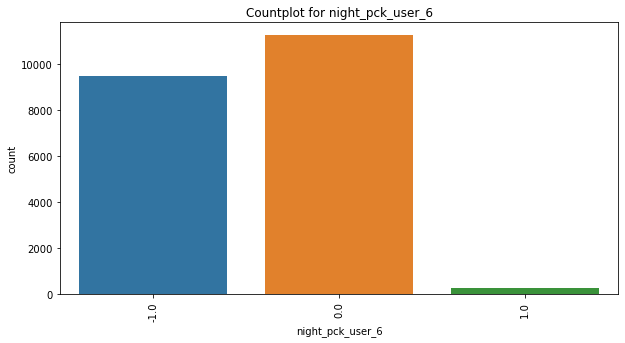

scheme to use during specific night hours only_prepaid service schemes called  packs_user_6
 0.0    11237
-1.0     9496
 1.0      268
Name: night_pck_user_6, dtype: int64
*****************************************************************************************


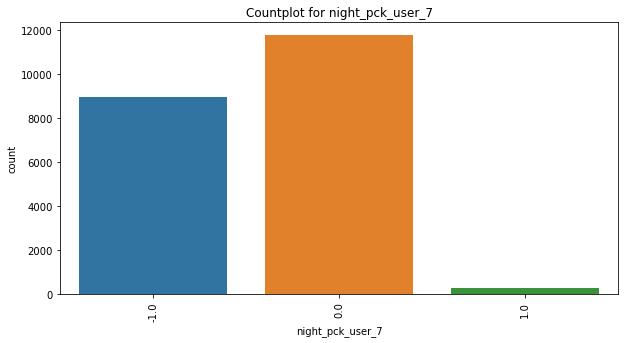

scheme to use during specific night hours only_prepaid service schemes called  packs_user_7
 0.0    11768
-1.0     8956
 1.0      277
Name: night_pck_user_7, dtype: int64
*****************************************************************************************


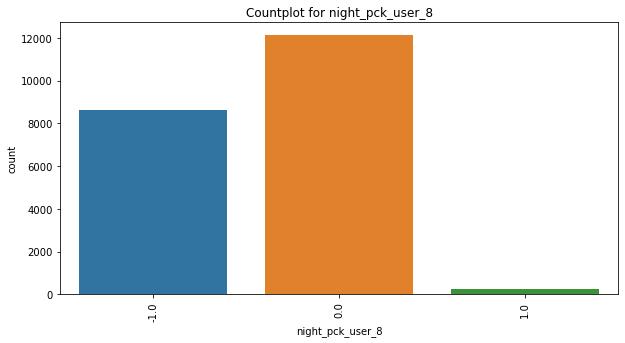

scheme to use during specific night hours only_prepaid service schemes called  packs_user_8
 0.0    12123
-1.0     8614
 1.0      264
Name: night_pck_user_8, dtype: int64
*****************************************************************************************


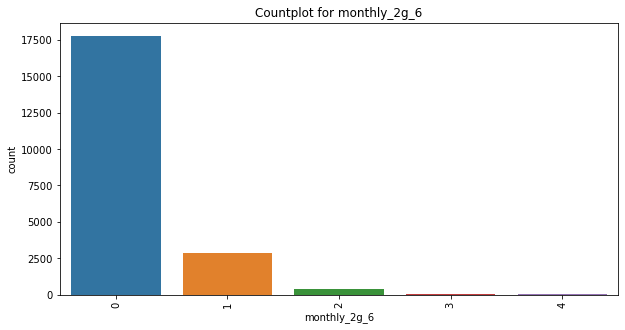

service schemes with validity equivalent to a month_g network_6
0    17792
1     2829
2      355
3       19
4        6
Name: monthly_2g_6, dtype: int64
*****************************************************************************************


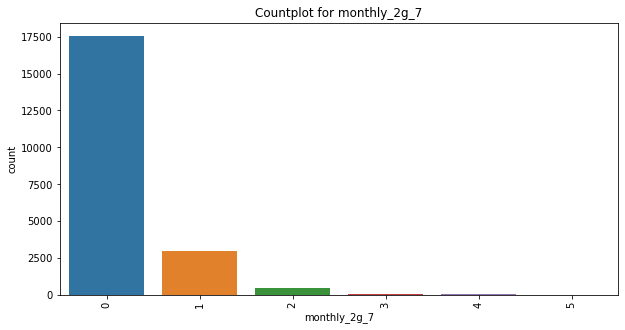

service schemes with validity equivalent to a month_g network_7
0    17577
1     2963
2      430
3       27
4        3
5        1
Name: monthly_2g_7, dtype: int64
*****************************************************************************************


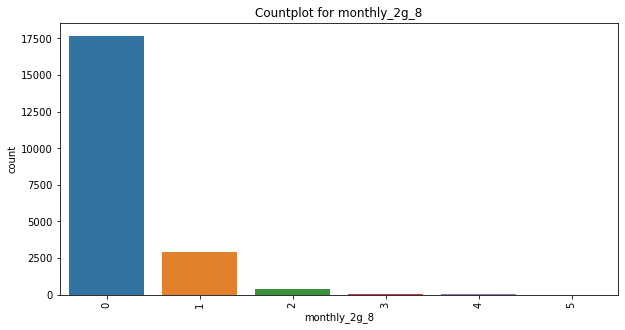

service schemes with validity equivalent to a month_g network_8
0    17689
1     2893
2      388
3       24
4        6
5        1
Name: monthly_2g_8, dtype: int64
*****************************************************************************************


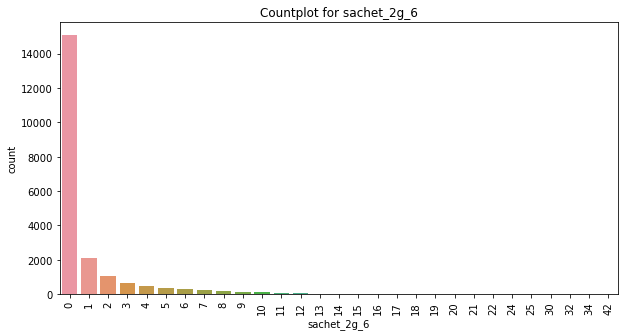

service schemes with validity smaller than a month_g network_6
0     15061
1      2115
2      1045
3       631
4       480
5       346
6       285
7       227
8       211
9       151
10      132
11       89
12       80
13       37
14       33
15       20
16       14
17       11
19        8
22        5
18        5
21        4
20        3
25        3
42        1
30        1
24        1
32        1
34        1
Name: sachet_2g_6, dtype: int64
*****************************************************************************************


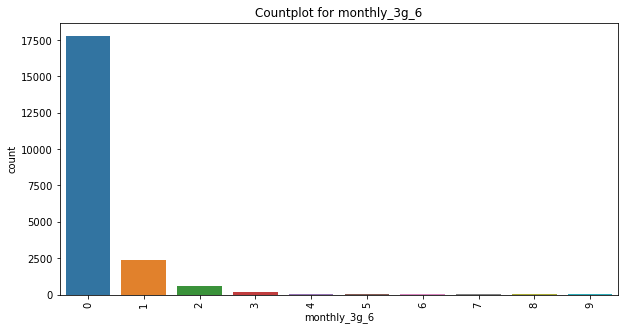

service schemes with validity equivalent to a month_g network_6
0    17803
1     2352
2      582
3      167
4       59
5       16
6       10
7        8
8        2
9        2
Name: monthly_3g_6, dtype: int64
*****************************************************************************************


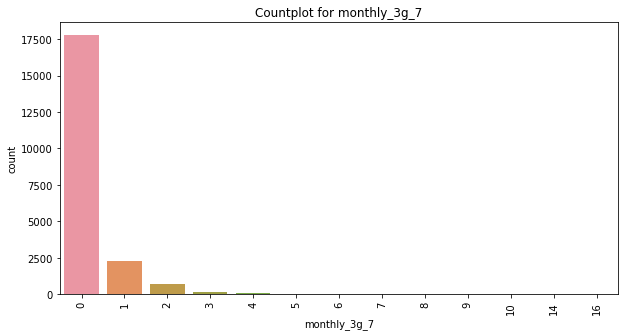

service schemes with validity equivalent to a month_g network_7
0     17763
1      2271
2       695
3       163
4        48
5        27
6        18
7         6
8         4
9         3
16        1
14        1
10        1
Name: monthly_3g_7, dtype: int64
*****************************************************************************************


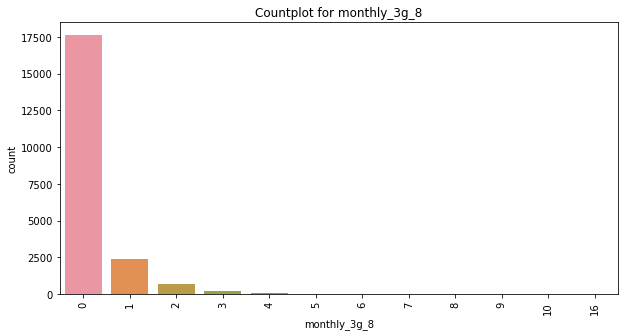

service schemes with validity equivalent to a month_g network_8
0     17604
1      2385
2       720
3       183
4        65
5        24
6         7
7         6
8         3
9         2
16        1
10        1
Name: monthly_3g_8, dtype: int64
*****************************************************************************************


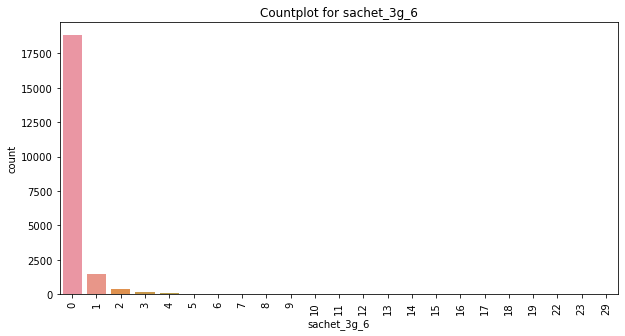

service schemes with validity smaller than a month_g network_6
0     18814
1      1452
2       357
3       126
4        71
5        42
7        36
6        30
8        17
9        15
11        8
10        7
15        4
13        3
14        3
19        3
23        3
12        3
22        2
29        2
17        1
16        1
18        1
Name: sachet_3g_6, dtype: int64
*****************************************************************************************


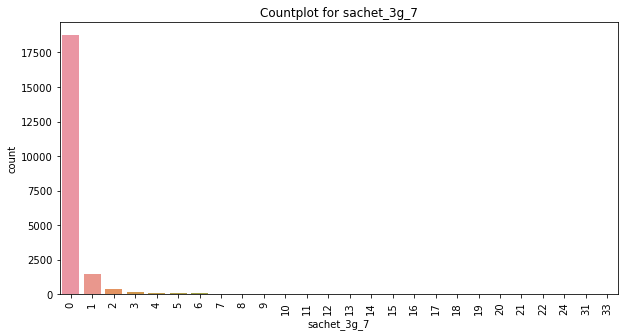

service schemes with validity smaller than a month_g network_7
0     18744
1      1425
2       380
3       146
4        77
5        70
6        49
7        25
8        13
9        11
10       11
11       11
12        9
15        5
14        5
22        3
18        3
20        3
13        2
17        2
24        2
33        1
31        1
19        1
16        1
21        1
Name: sachet_3g_7, dtype: int64
*****************************************************************************************


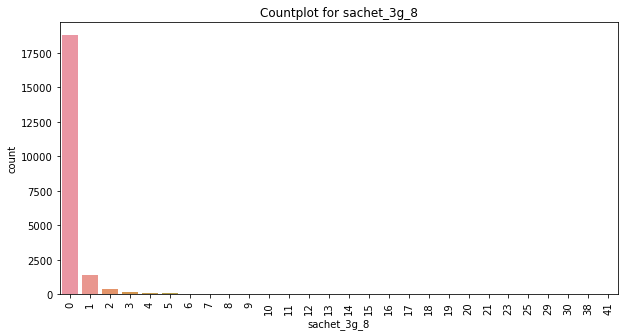

service schemes with validity smaller than a month_g network_8
0     18782
1      1379
2       348
3       165
4        87
5        71
6        35
7        29
8        24
9        16
10       11
11        9
13        9
12        9
15        4
18        3
20        3
14        3
17        2
16        2
23        2
21        2
25        1
30        1
29        1
19        1
41        1
38        1
Name: sachet_3g_8, dtype: int64
*****************************************************************************************


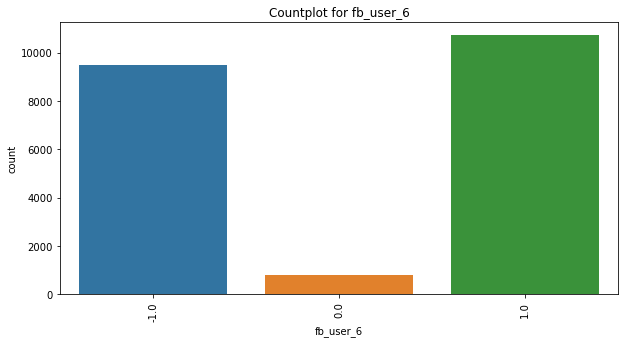

fb_user_6
 1.0    10717
-1.0     9496
 0.0      788
Name: fb_user_6, dtype: int64
*****************************************************************************************


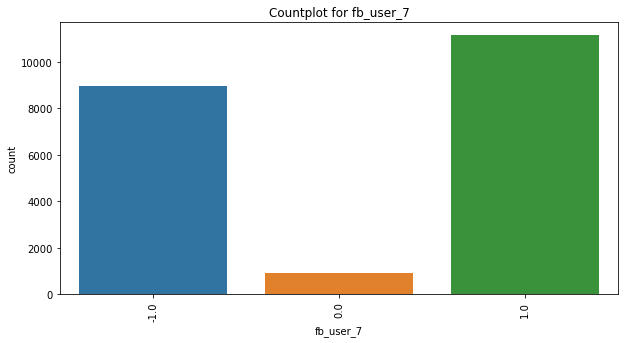

fb_user_7
 1.0    11145
-1.0     8956
 0.0      900
Name: fb_user_7, dtype: int64
*****************************************************************************************


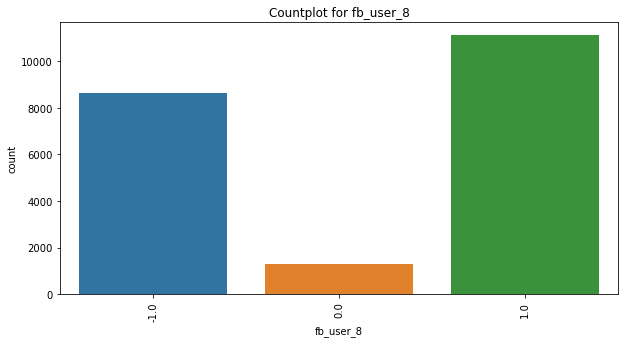

fb_user_8
 1.0    11106
-1.0     8614
 0.0     1281
Name: fb_user_8, dtype: int64
*****************************************************************************************


In [35]:
for col in cat_cols:
    univariate(churn_filtered[col])

In [36]:
print("Findings")
#Univariate Analysis on Categorical Variable:
df2 = pd.DataFrame()
for i,col in enumerate(cat_cols):
    df2[col] = [churn_filtered[col].mode()[0]]
df2.T

Findings


,0
night_pck_user_6,0.0
night_pck_user_7,0.0
night_pck_user_8,0.0
monthly_2g_6,0.0
monthly_2g_7,0.0
monthly_2g_8,0.0
sachet_2g_6,0.0
monthly_3g_6,0.0
monthly_3g_7,0.0
monthly_3g_8,0.0


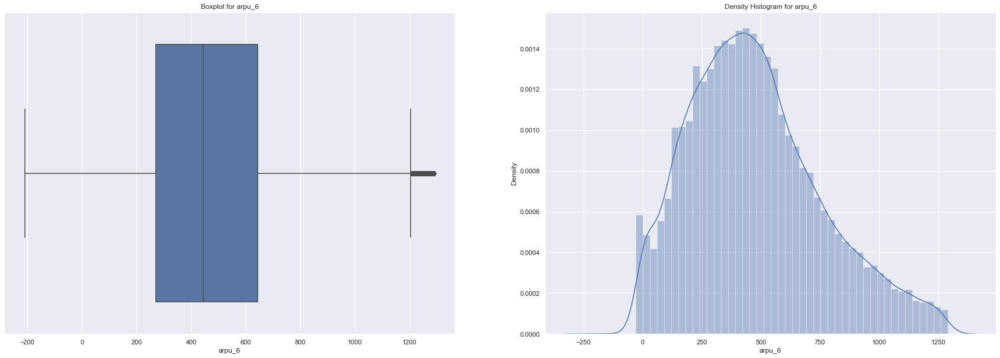

average revenue per user_6
count    20080.000000
mean       477.891021
std        280.345683
min       -209.465000
25%        270.373750
50%        444.559500
75%        644.238000
max       1291.828000
Name: arpu_6, dtype: float64
******************************************************************************************


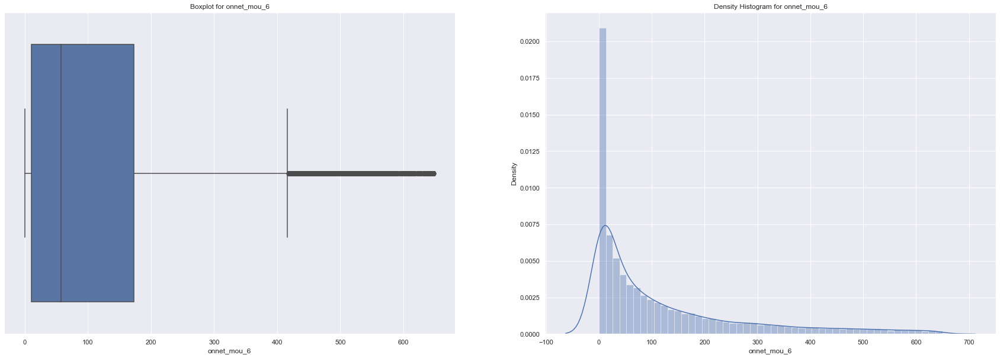

all kind of calls within the same operator network_minutes of usage  voice calls_6
count    18644.000000
mean       120.059721
std        149.706582
min          0.000000
25%         10.525000
50%         57.650000
75%        172.645000
max        649.560000
Name: onnet_mou_6, dtype: float64
******************************************************************************************


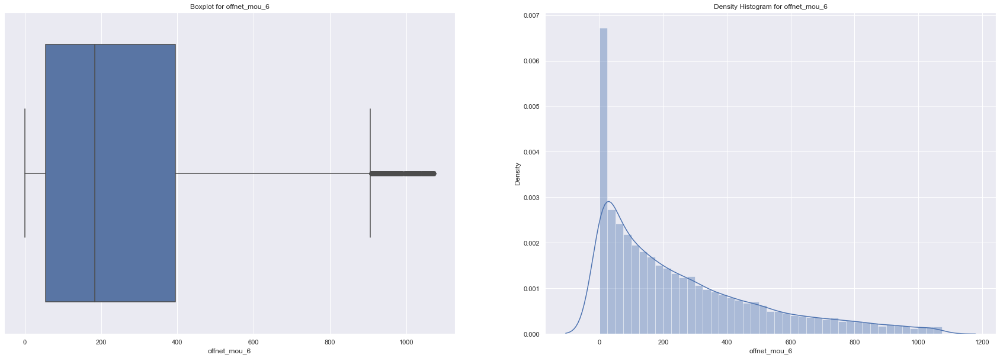

all kind of calls outside the operator t network_minutes of usage  voice calls_6
count    19579.000000
mean       260.846359
std        254.113962
min          0.000000
25%         55.410000
50%        182.790000
75%        395.350000
max       1073.840000
Name: offnet_mou_6, dtype: float64
******************************************************************************************


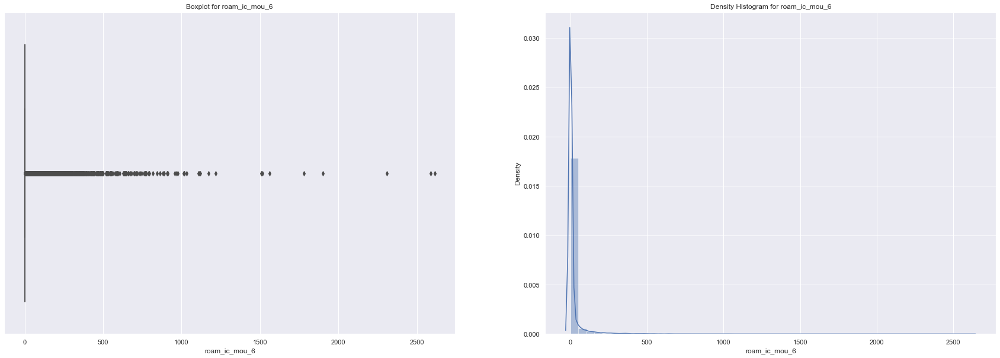

indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_6
count    21001.000000
mean        15.427095
std         74.713438
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2613.310000
Name: roam_ic_mou_6, dtype: float64
******************************************************************************************


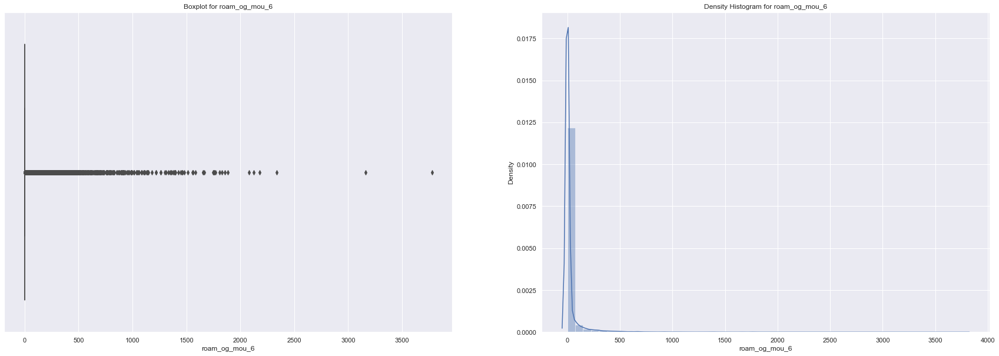

indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_6
count    21001.000000
mean        26.395951
std        117.986187
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       3775.110000
Name: roam_og_mou_6, dtype: float64
******************************************************************************************


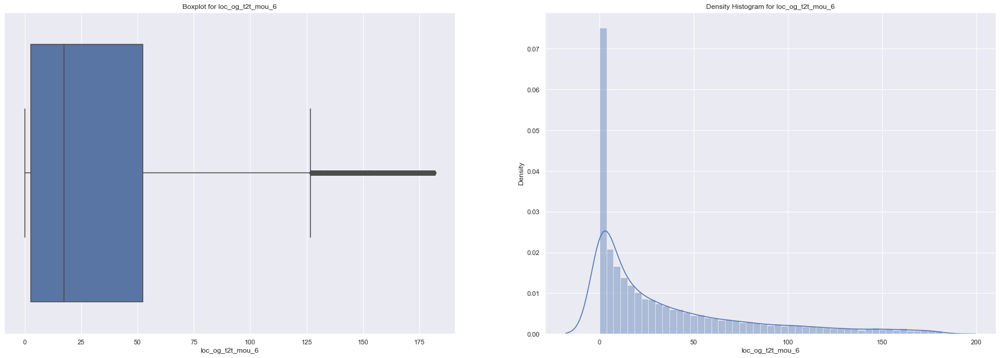

local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6
count    18886.000000
mean        35.119694
std         42.777425
min          0.000000
25%          2.640000
50%         17.410000
75%         52.260000
max        181.730000
Name: loc_og_t2t_mou_6, dtype: float64
******************************************************************************************


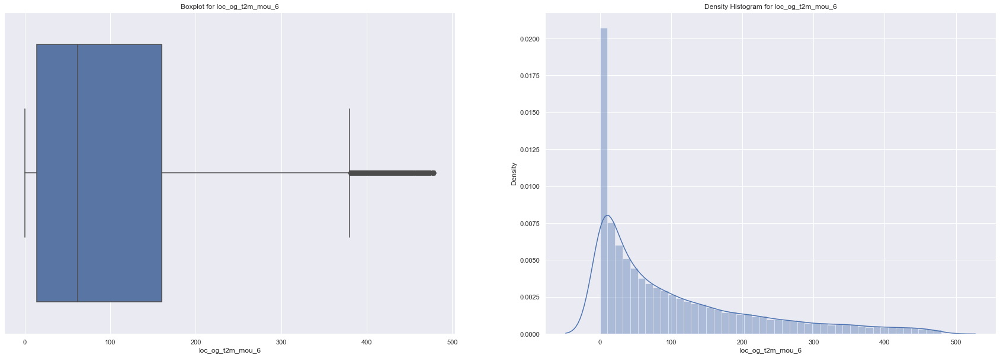

local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6
count    19417.000000
mean       105.210795
std        115.475032
min          0.000000
25%         14.230000
50%         61.780000
75%        160.390000
max        479.340000
Name: loc_og_t2m_mou_6, dtype: float64
******************************************************************************************


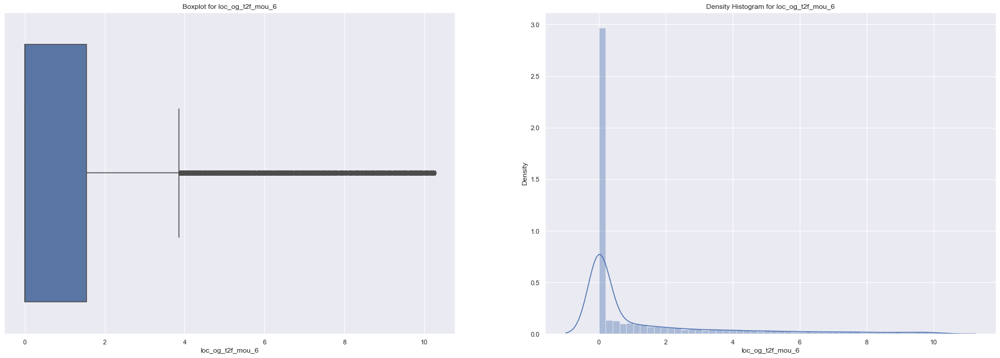

local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6
count    17985.000000
mean         1.288468
std          2.340331
min          0.000000
25%          0.000000
50%          0.000000
75%          1.550000
max         10.260000
Name: loc_og_t2f_mou_6, dtype: float64
******************************************************************************************


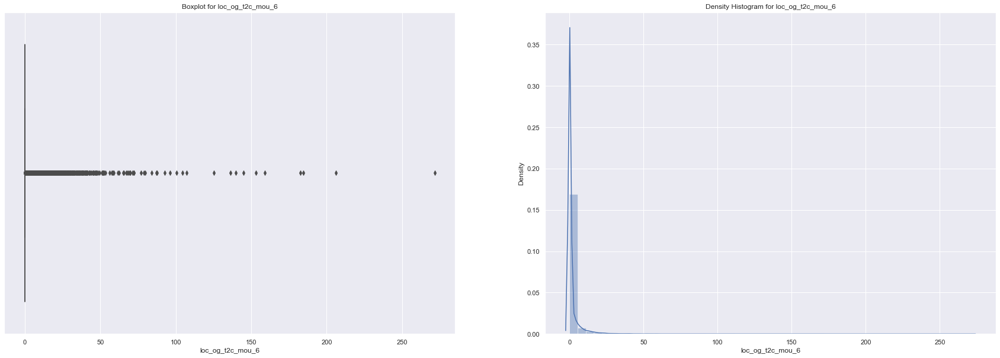

local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_6
count    21001.000000
mean         1.538283
std          6.435167
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        271.440000
Name: loc_og_t2c_mou_6, dtype: float64
******************************************************************************************


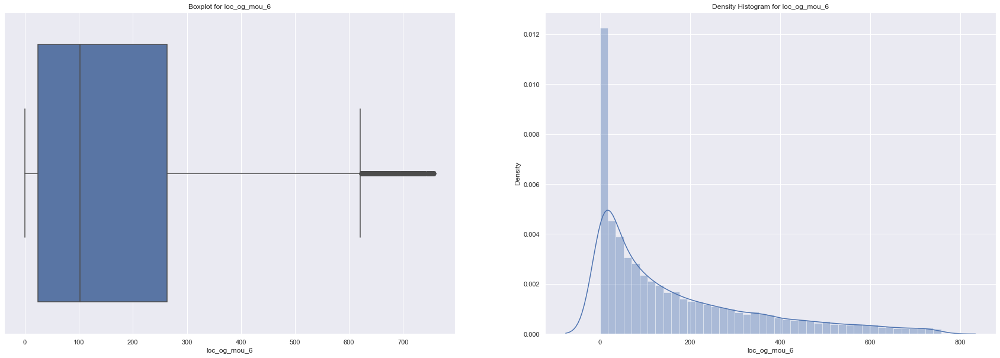

local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_6
count    19549.000000
mean       169.666181
std        182.676460
min          0.000000
25%         24.430000
50%        101.610000
75%        262.830000
max        758.110000
Name: loc_og_mou_6, dtype: float64
******************************************************************************************


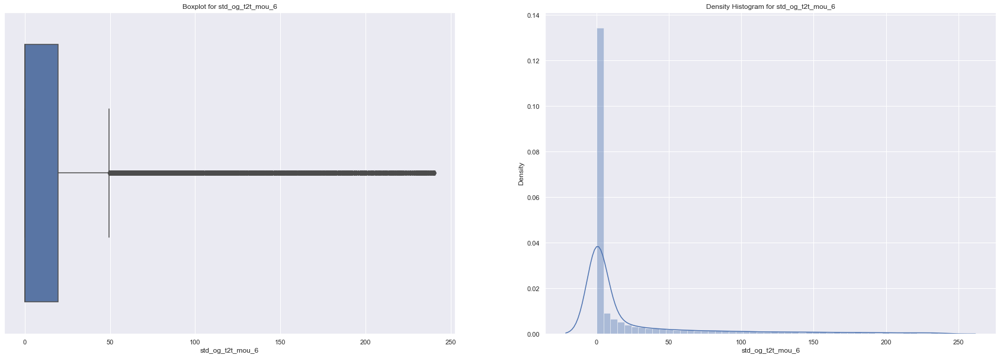

std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6
count    17492.000000
mean        24.509590
std         49.935306
min          0.000000
25%          0.000000
50%          0.000000
75%         19.717500
max        240.580000
Name: std_og_t2t_mou_6, dtype: float64
******************************************************************************************


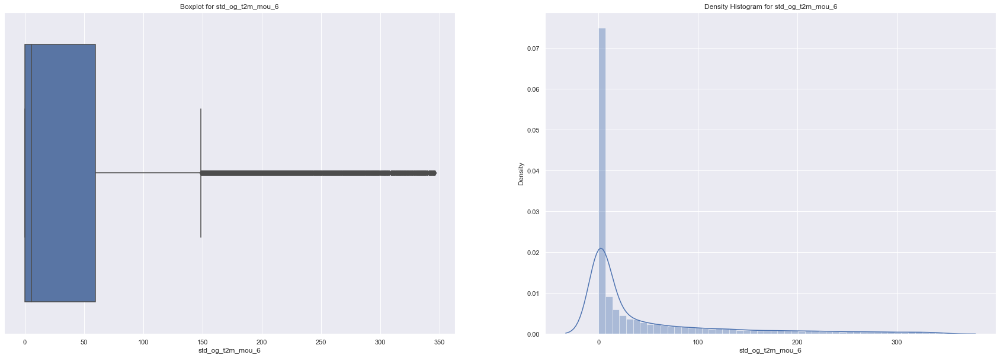

std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6
count    18068.000000
mean        46.965697
std         78.369466
min          0.000000
25%          0.000000
50%          5.590000
75%         59.480000
max        345.810000
Name: std_og_t2m_mou_6, dtype: float64
******************************************************************************************


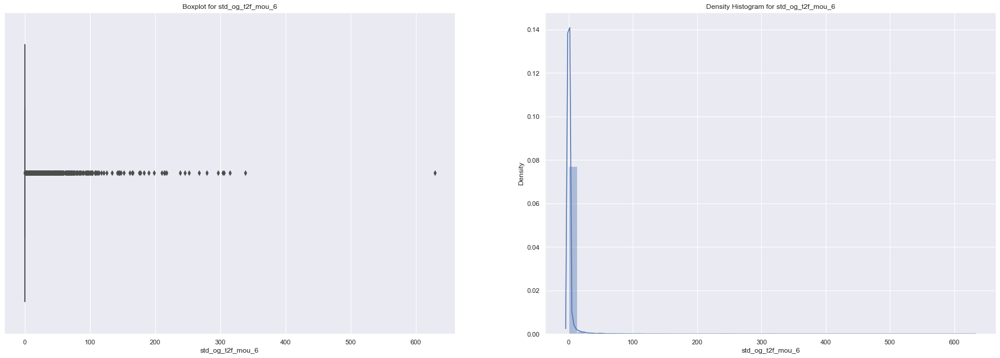

std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6
count    21001.000000
mean         1.682356
std         11.585660
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        628.560000
Name: std_og_t2f_mou_6, dtype: float64
******************************************************************************************


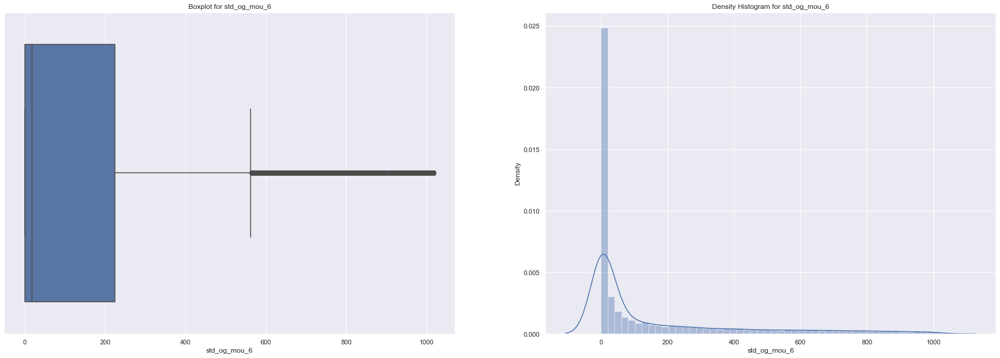

std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_6
count    18758.000000
mean       159.723694
std        252.963839
min          0.000000
25%          0.000000
50%         18.680000
75%        224.700000
max       1020.140000
Name: std_og_mou_6, dtype: float64
******************************************************************************************


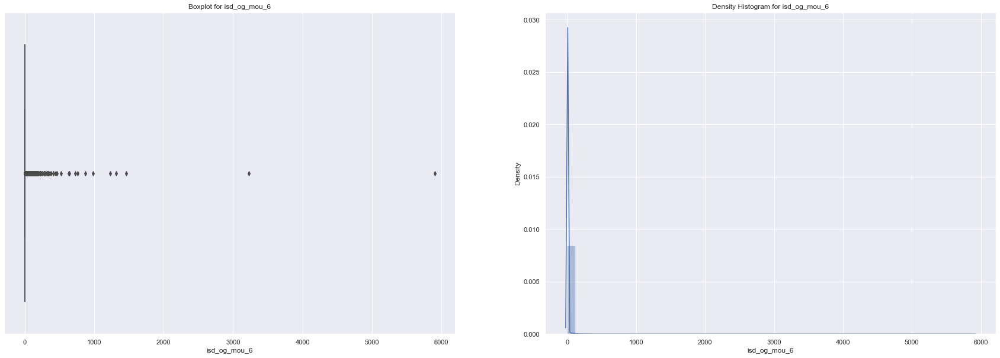

isd calls_outgoing calls_minutes of usage  voice calls_6
count    21001.000000
mean         2.285346
std         52.962467
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5900.660000
Name: isd_og_mou_6, dtype: float64
******************************************************************************************


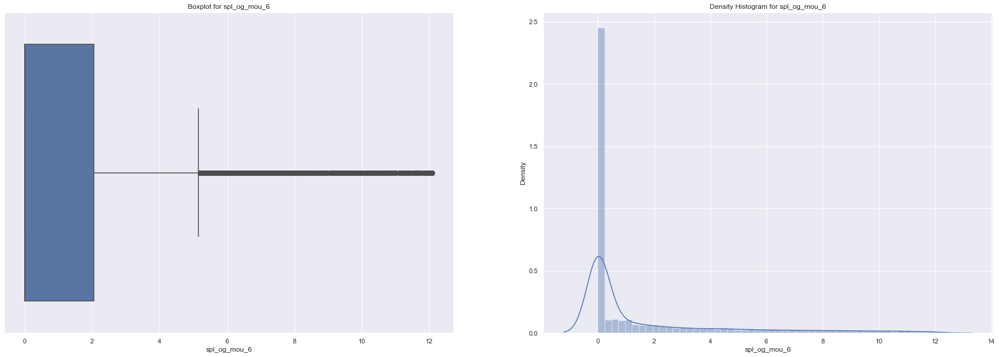

special calls_outgoing calls_minutes of usage  voice calls_6
count    18301.000000
mean         1.645287
std          2.872830
min          0.000000
25%          0.000000
50%          0.000000
75%          2.060000
max         12.110000
Name: spl_og_mou_6, dtype: float64
******************************************************************************************


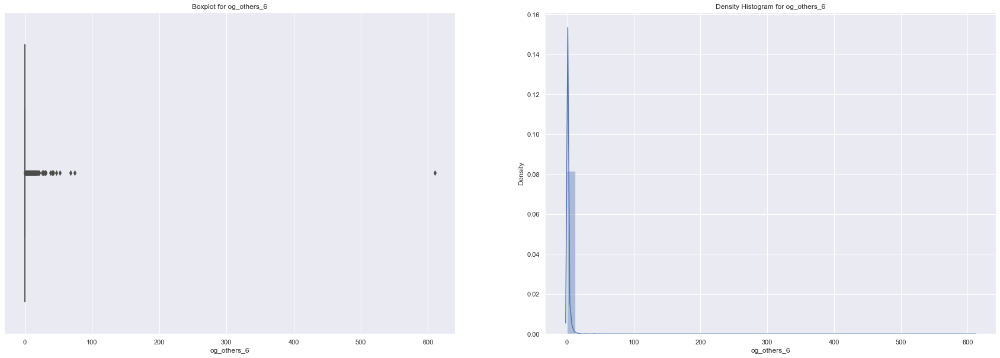

outgoing calls_others_6
count    21001.000000
mean         0.640629
std          4.695250
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        609.810000
Name: og_others_6, dtype: float64
******************************************************************************************


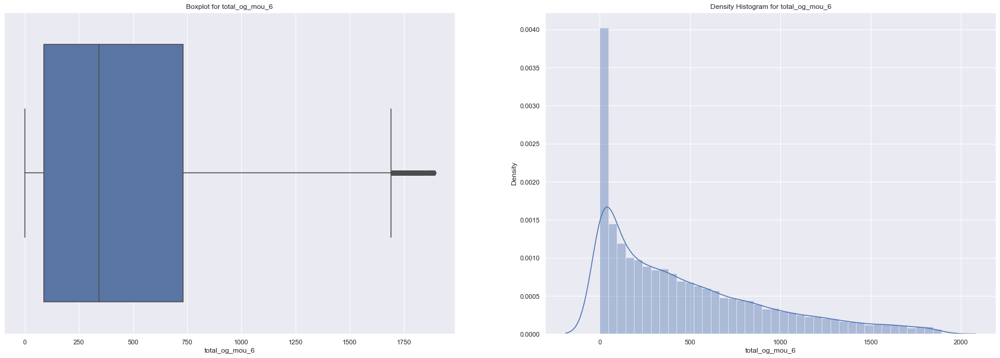

total_outgoing calls_minutes of usage  voice calls_6
count    19942.000000
mean       470.375529
std        454.624146
min          0.000000
25%         87.950000
50%        342.590000
75%        729.392500
max       1891.480000
Name: total_og_mou_6, dtype: float64
******************************************************************************************


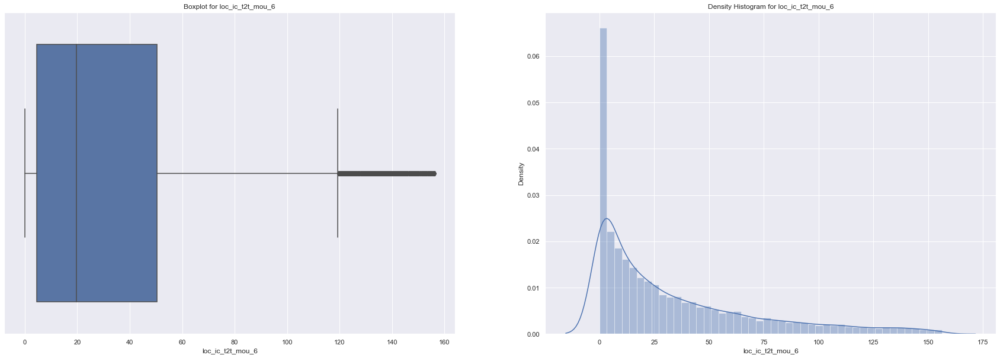

local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6
count    19120.000000
mean        33.376194
std         36.925255
min          0.000000
25%          4.537500
50%         19.740000
75%         50.490000
max        156.180000
Name: loc_ic_t2t_mou_6, dtype: float64
******************************************************************************************


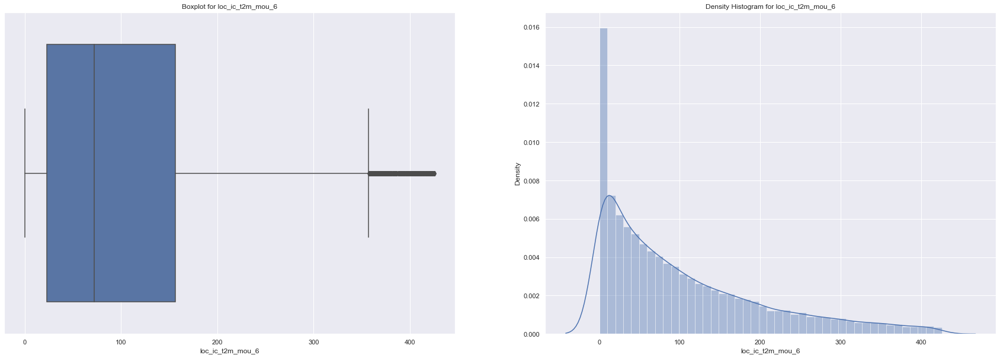

local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6
count    19536.000000
mean       103.638996
std        100.626553
min          0.000000
25%         23.005000
50%         72.340000
75%        156.715000
max        425.730000
Name: loc_ic_t2m_mou_6, dtype: float64
******************************************************************************************


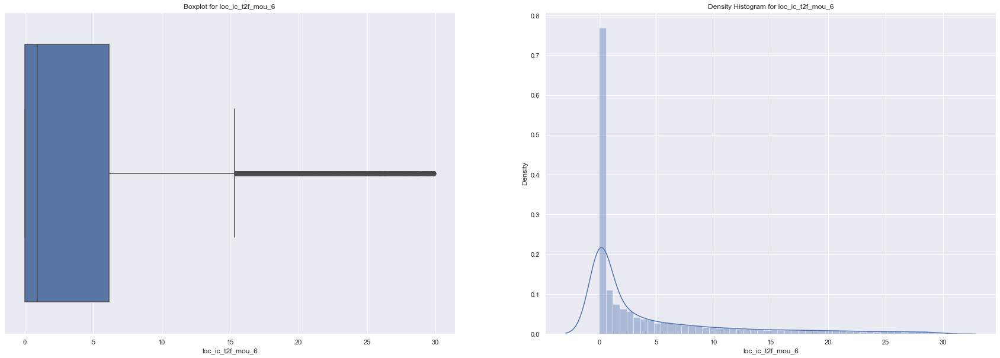

local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6
count    18310.000000
mean         4.463421
std          6.906702
min          0.000000
25%          0.000000
50%          0.930000
75%          6.140000
max         29.930000
Name: loc_ic_t2f_mou_6, dtype: float64
******************************************************************************************


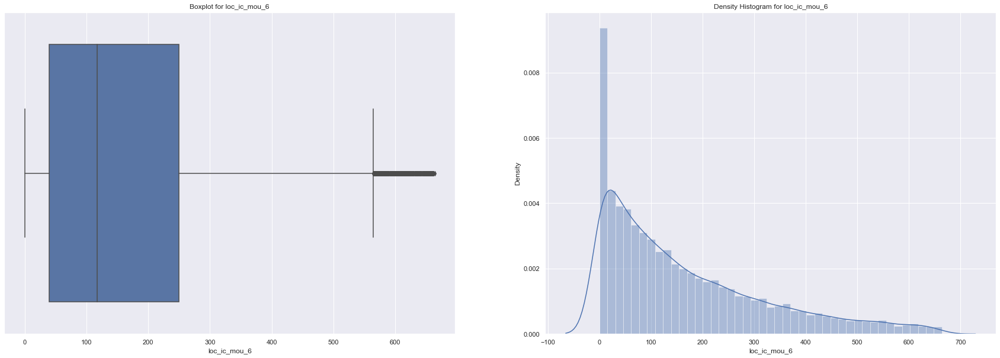

local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_6
count    19615.000000
mean       165.352111
std        156.876706
min          0.000000
25%         39.960000
50%        116.840000
75%        249.760000
max        663.930000
Name: loc_ic_mou_6, dtype: float64
******************************************************************************************


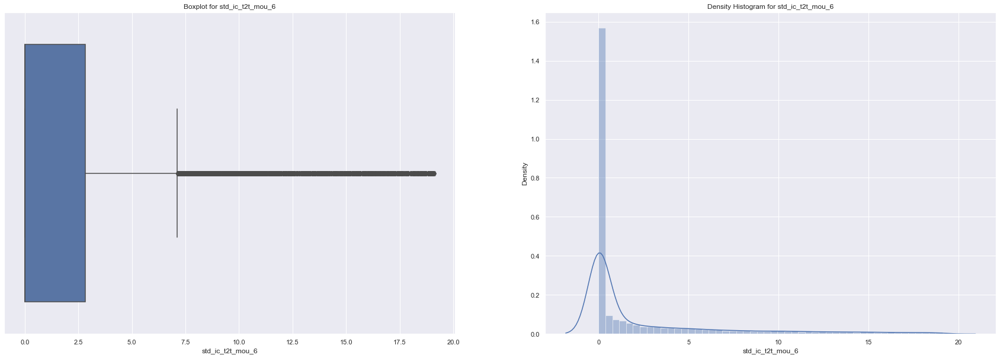

std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6
count    17975.000000
mean         2.387969
std          4.324472
min          0.000000
25%          0.000000
50%          0.000000
75%          2.840000
max         19.130000
Name: std_ic_t2t_mou_6, dtype: float64
******************************************************************************************


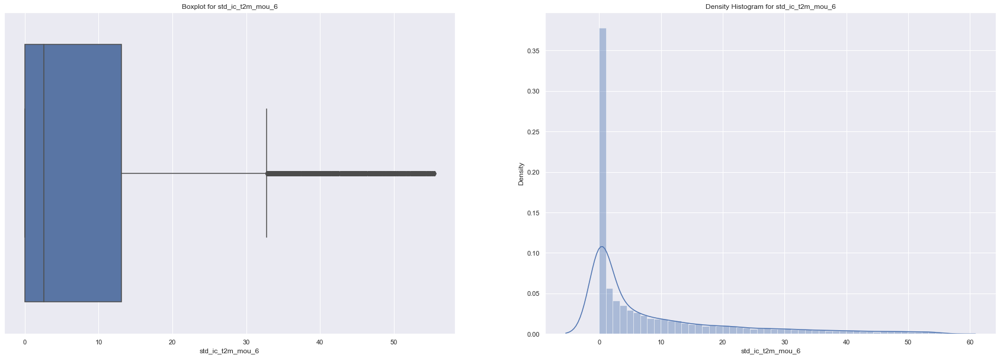

std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6
count    18513.000000
mean         8.955944
std         12.849648
min          0.000000
25%          0.000000
50%          2.610000
75%         13.090000
max         55.490000
Name: std_ic_t2m_mou_6, dtype: float64
******************************************************************************************


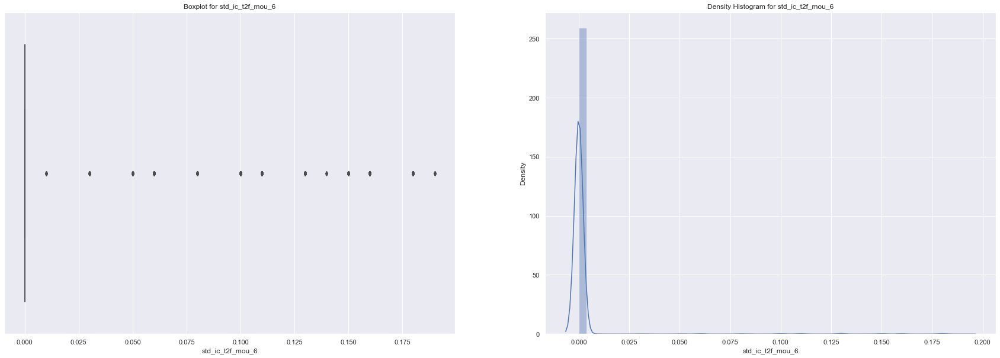

std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6
count    15930.000000
mean         0.001682
std          0.014934
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.190000
Name: std_ic_t2f_mou_6, dtype: float64
******************************************************************************************


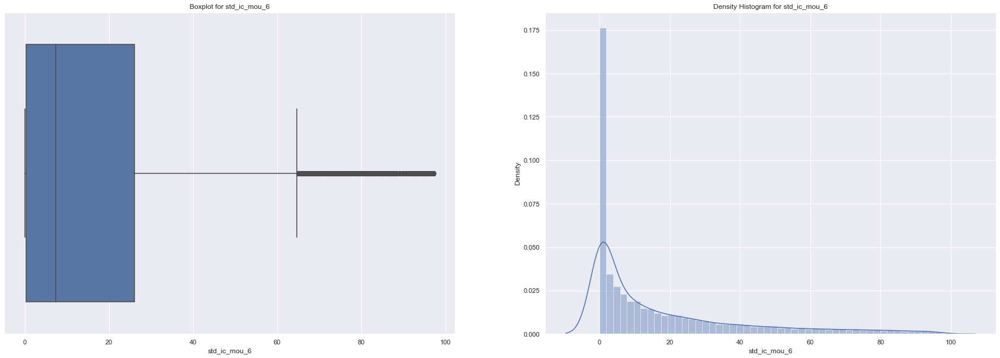

std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_6
count    18787.000000
mean        17.552220
std         22.934825
min          0.000000
25%          0.360000
50%          7.390000
75%         26.110000
max         97.380000
Name: std_ic_mou_6, dtype: float64
******************************************************************************************


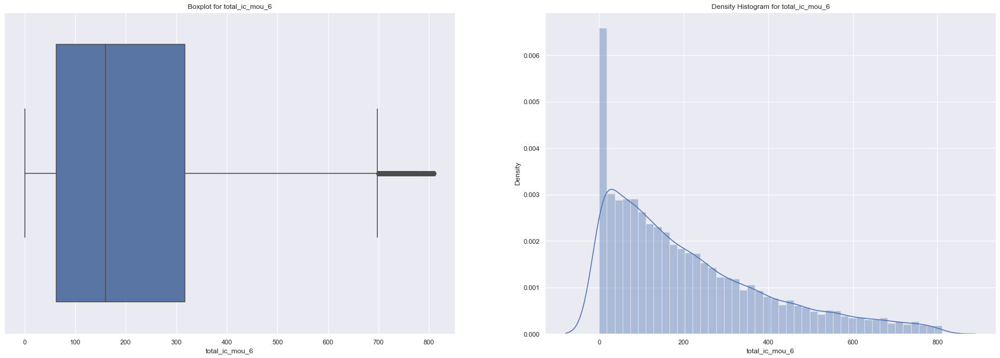

total_incoming calls_minutes of usage  voice calls_6
count    19646.000000
mean       212.537191
std        190.098601
min          0.000000
25%         62.015000
50%        159.780000
75%        316.320000
max        811.010000
Name: total_ic_mou_6, dtype: float64
******************************************************************************************


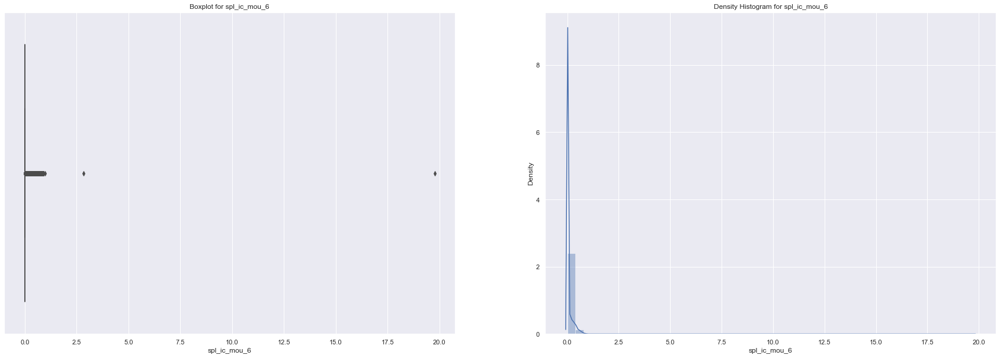

special calls_incoming calls_minutes of usage  voice calls_6
count    21001.000000
mean         0.060045
std          0.196494
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         19.760000
Name: spl_ic_mou_6, dtype: float64
******************************************************************************************


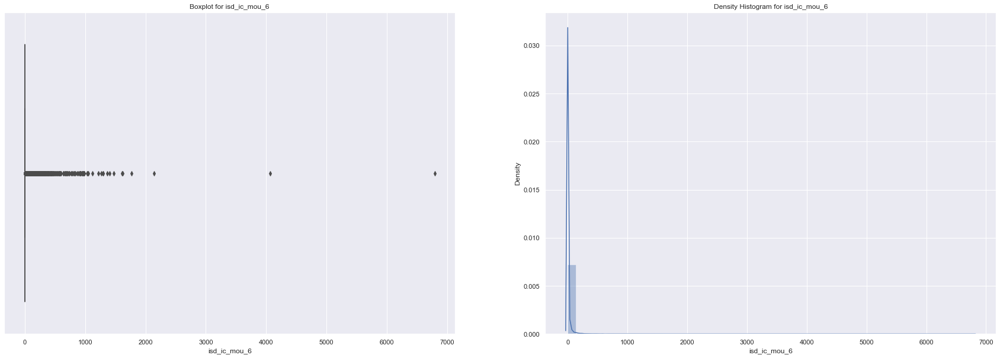

isd calls_incoming calls_minutes of usage  voice calls_6
count    21001.000000
mean        10.544175
std         82.654460
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       6789.410000
Name: isd_ic_mou_6, dtype: float64
******************************************************************************************


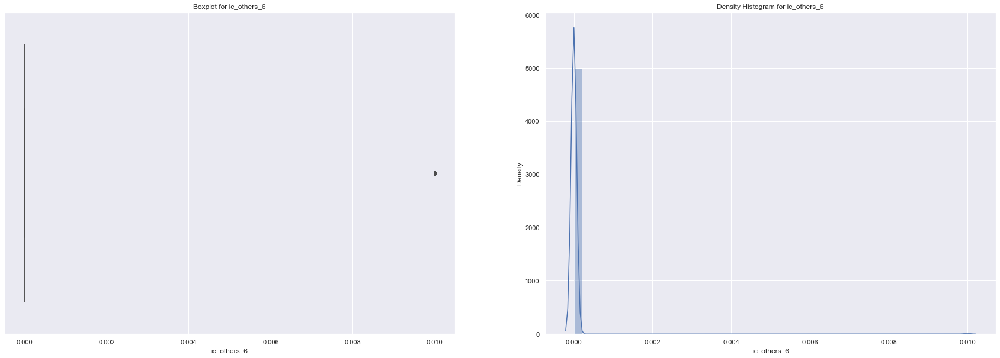

incoming calls_others_6
count    15774.000000
mean         0.000023
std          0.000477
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.010000
Name: ic_others_6, dtype: float64
******************************************************************************************


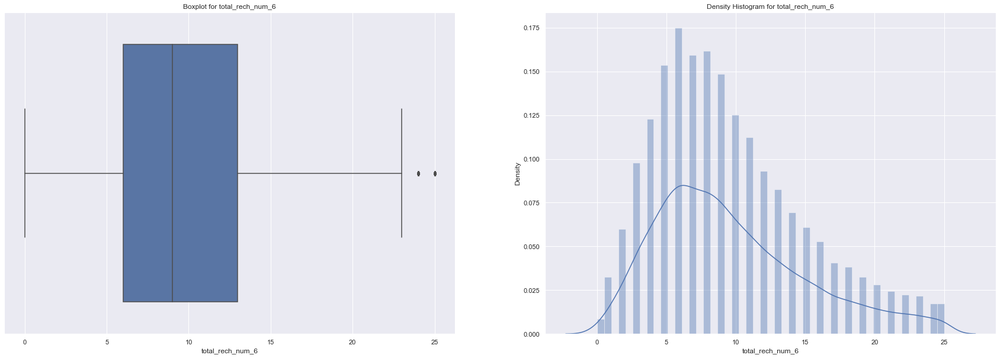

total_recharge_number_6
count    19605.000000
mean         9.615047
std          5.438325
min          0.000000
25%          6.000000
50%          9.000000
75%         13.000000
max         25.000000
Name: total_rech_num_6, dtype: float64
******************************************************************************************


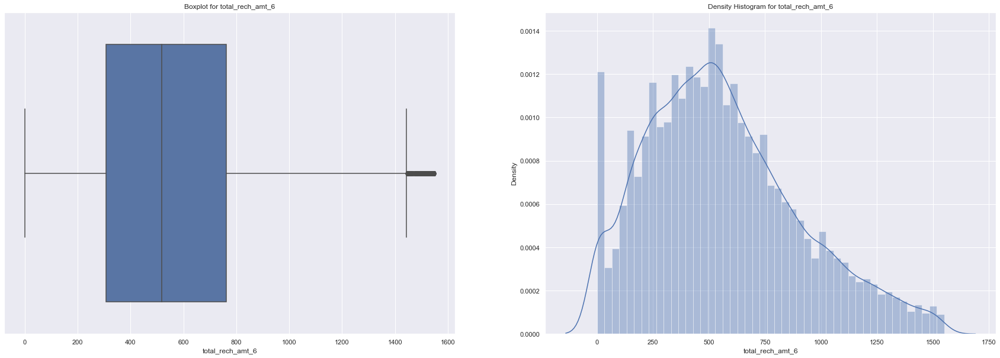

total_recharge_amount in local currency_6
count    20099.000000
mean       561.076272
std        339.272218
min          0.000000
25%        308.000000
50%        519.000000
75%        762.000000
max       1550.000000
Name: total_rech_amt_6, dtype: float64
******************************************************************************************


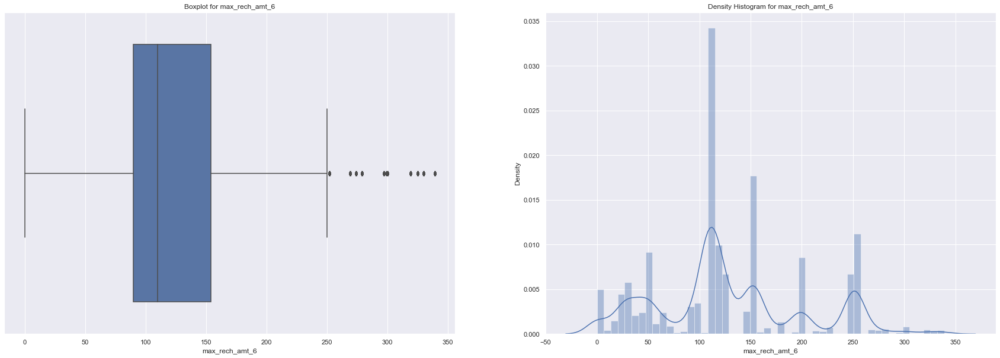

maximum_recharge_amount in local currency_6
count    19448.000000
mean       127.812834
std         73.223791
min          0.000000
25%         90.000000
50%        110.000000
75%        154.000000
max        339.000000
Name: max_rech_amt_6, dtype: float64
******************************************************************************************


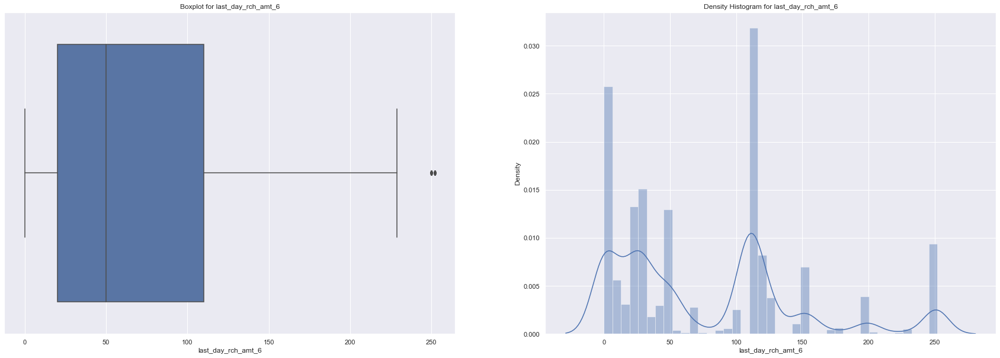

last_day_rch_amount in local currency_6
count    20118.000000
mean        77.427130
std         69.931715
min          0.000000
25%         20.000000
50%         50.000000
75%        110.000000
max        252.000000
Name: last_day_rch_amt_6, dtype: float64
******************************************************************************************


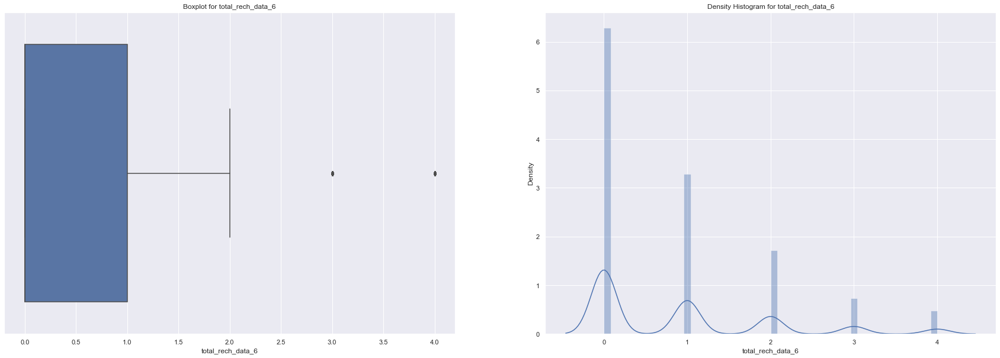

total_recharge_mobile internet_6
count    18865.000000
mean         0.864935
std          1.094599
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          4.000000
Name: total_rech_data_6, dtype: float64
******************************************************************************************


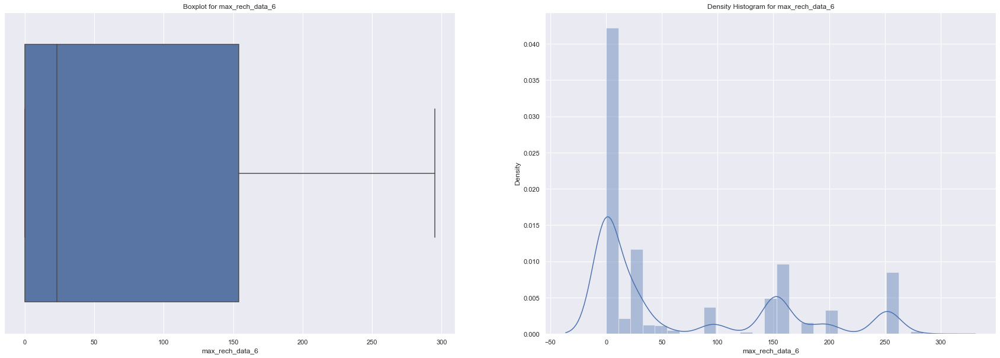

maximum_recharge_mobile internet_6
count    20675.000000
mean        68.443773
std         88.199152
min          0.000000
25%          0.000000
50%         23.000000
75%        154.000000
max        295.000000
Name: max_rech_data_6, dtype: float64
******************************************************************************************


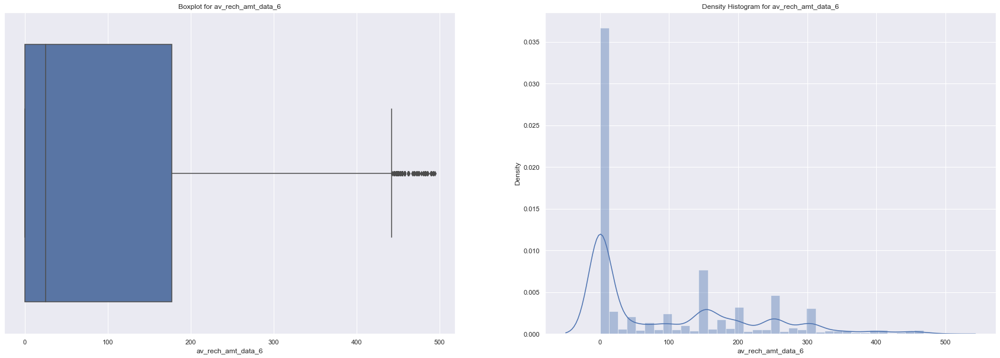

average_recharge_amount in local currency_mobile internet_6
count    19963.000000
mean        96.827016
std        119.475873
min          0.000000
25%          0.000000
50%         25.000000
75%        177.000000
max        494.000000
Name: av_rech_amt_data_6, dtype: float64
******************************************************************************************


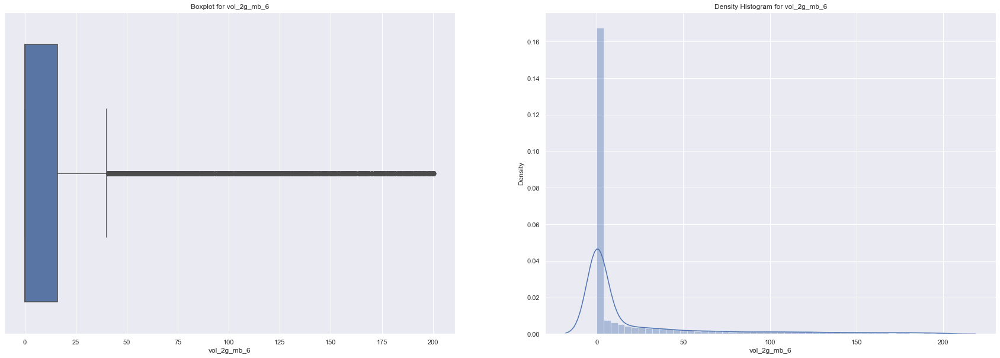

mobile internet usage volume in mb_g network_mb_6
count    17510.000000
mean        20.282756
std         42.219324
min          0.000000
25%          0.000000
50%          0.000000
75%         16.107500
max        200.810000
Name: vol_2g_mb_6, dtype: float64
******************************************************************************************


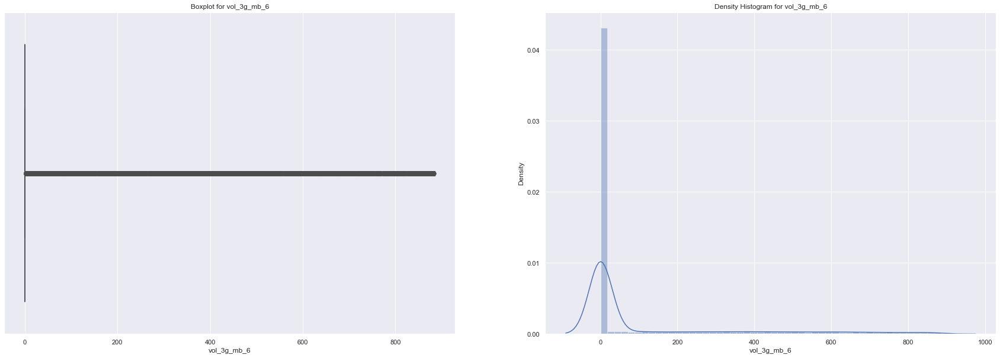

mobile internet usage volume in mb_g network_mb_6
count    18213.000000
mean        99.654356
std        214.657307
min          0.000000
25%          0.000000
50%          0.000000
75%          0.260000
max        884.480000
Name: vol_3g_mb_6, dtype: float64
******************************************************************************************


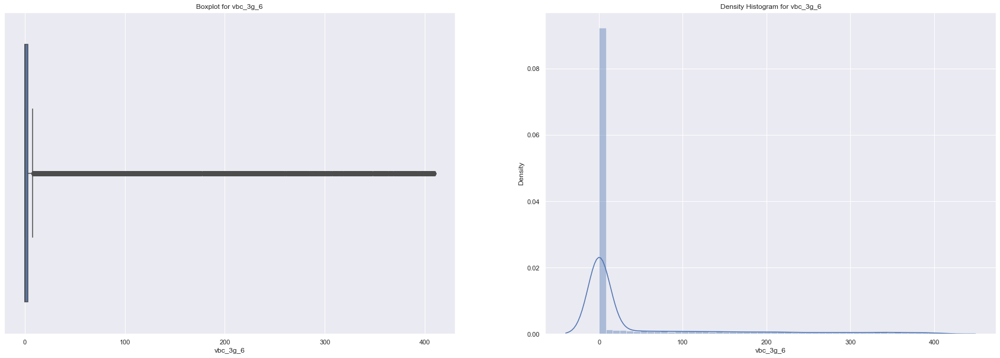

volume based cost  when no specific scheme is not purchased and paid as per usage_g network_6
count    17815.000000
mean        42.198922
std         93.791646
min          0.000000
25%          0.000000
50%          0.000000
75%          3.030000
max        409.670000
Name: vbc_3g_6, dtype: float64
******************************************************************************************


In [37]:
for col in num_cols:
    if col[-1] == '6':
        univariate(remove_outliers_series(churn_filtered[col]))

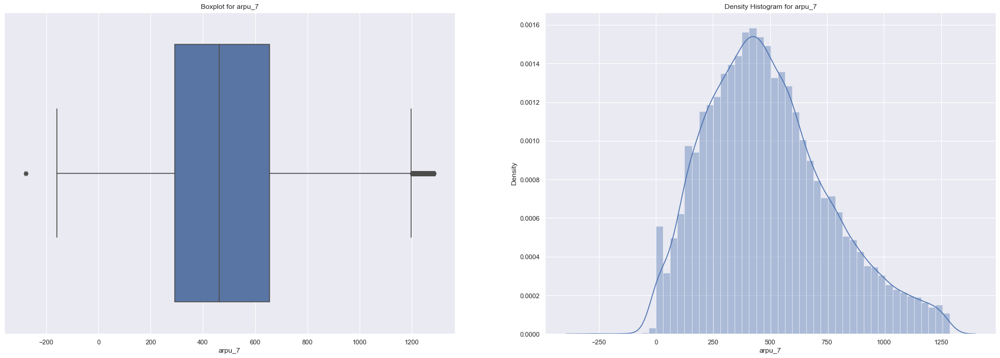

average revenue per user_7
count    20035.000000
mean       492.781047
std        271.213321
min       -282.788000
25%        293.083500
50%        461.694000
75%        655.293000
max       1287.916000
Name: arpu_7, dtype: float64
******************************************************************************************


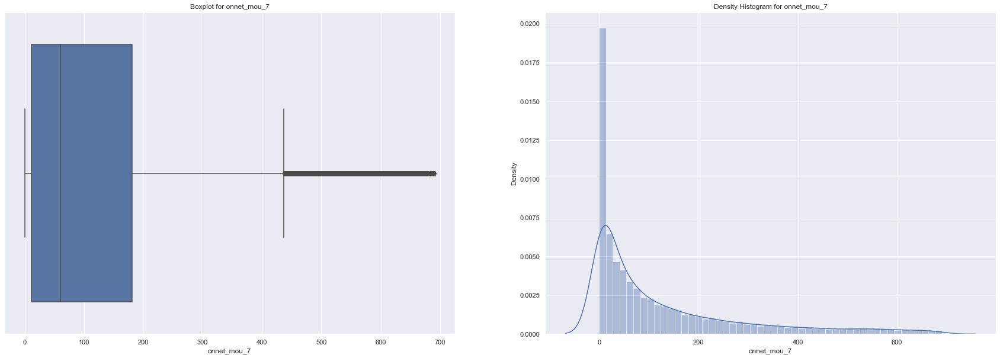

all kind of calls within the same operator network_minutes of usage  voice calls_7
count    18560.000000
mean       126.939393
std        159.720487
min          0.000000
25%         11.090000
50%         59.650000
75%        181.382500
max        690.830000
Name: onnet_mou_7, dtype: float64
******************************************************************************************


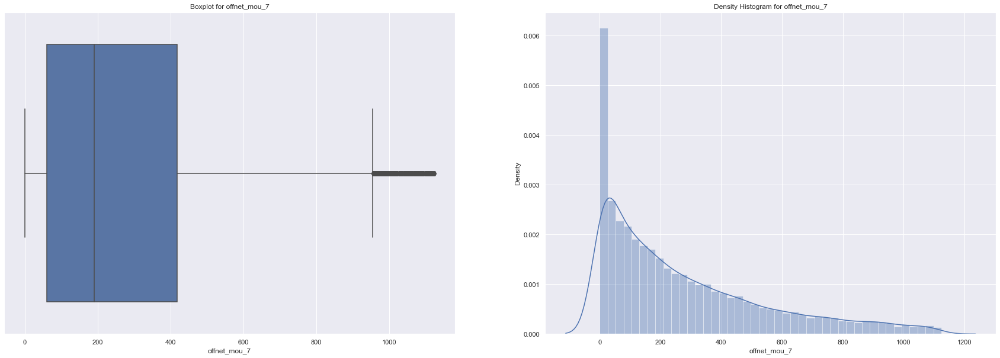

all kind of calls outside the operator t network_minutes of usage  voice calls_7
count    19621.000000
mean       276.637793
std        269.646590
min          0.000000
25%         59.890000
50%        191.240000
75%        417.730000
max       1124.660000
Name: offnet_mou_7, dtype: float64
******************************************************************************************


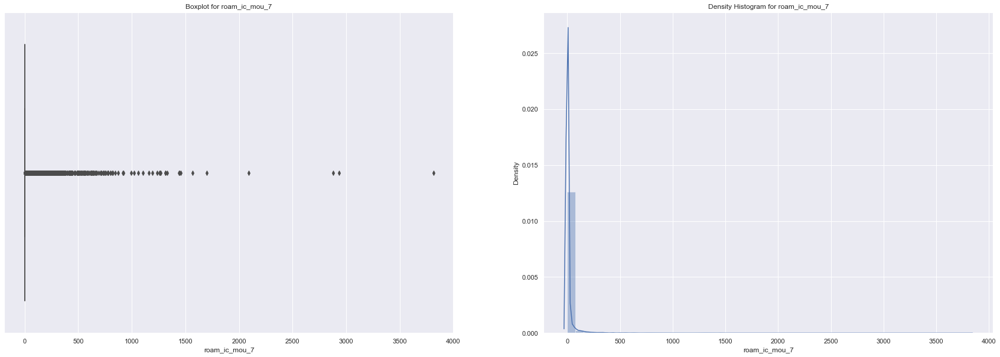

indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_7
count    21001.000000
mean        12.229543
std         76.499504
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       3813.290000
Name: roam_ic_mou_7, dtype: float64
******************************************************************************************


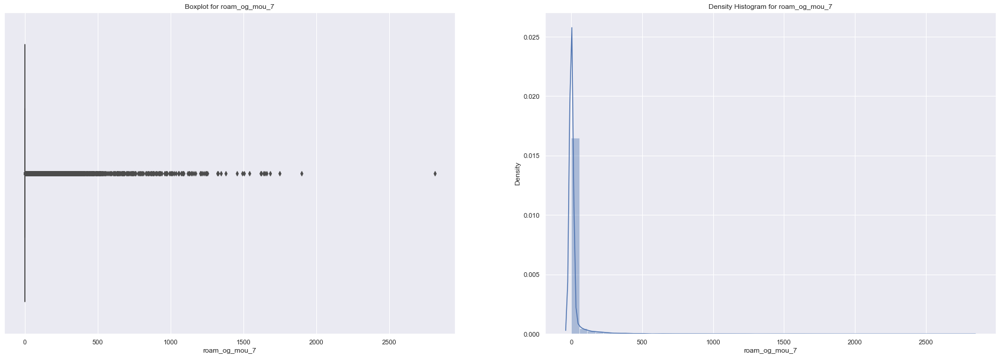

indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_7
count    21001.000000
mean        19.645080
std         95.954179
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2812.040000
Name: roam_og_mou_7, dtype: float64
******************************************************************************************


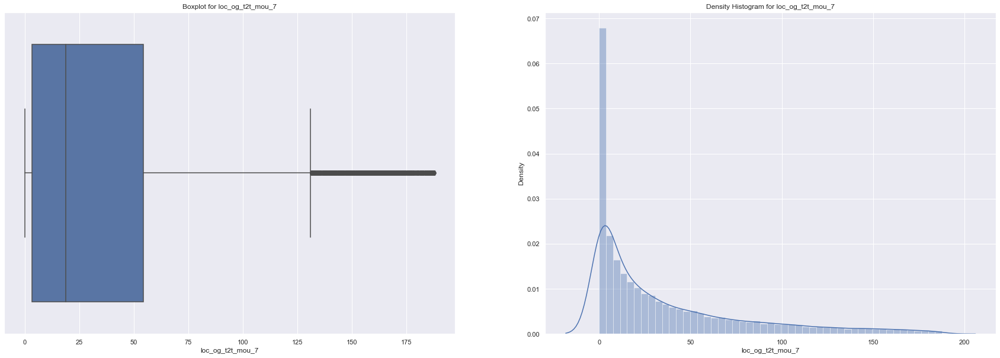

local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7
count    18874.000000
mean        36.553616
std         43.643323
min          0.000000
25%          3.360000
50%         18.880000
75%         54.432500
max        187.810000
Name: loc_og_t2t_mou_7, dtype: float64
******************************************************************************************


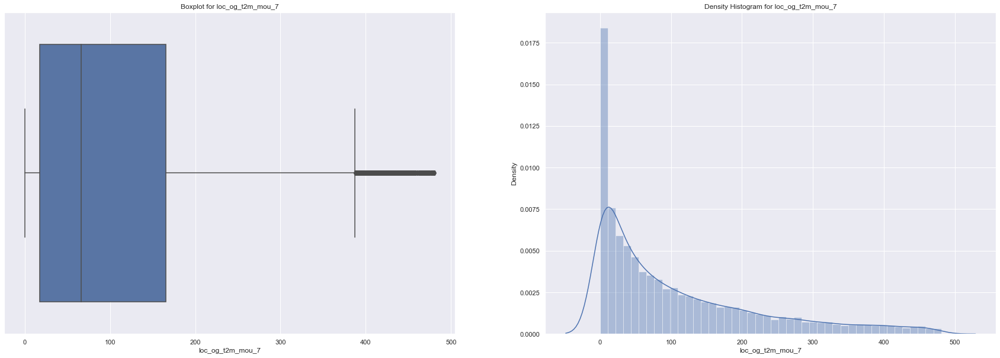

local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7
count    19406.000000
mean       108.577817
std        116.272779
min          0.000000
25%         17.360000
50%         66.020000
75%        165.305000
max        480.710000
Name: loc_og_t2m_mou_7, dtype: float64
******************************************************************************************


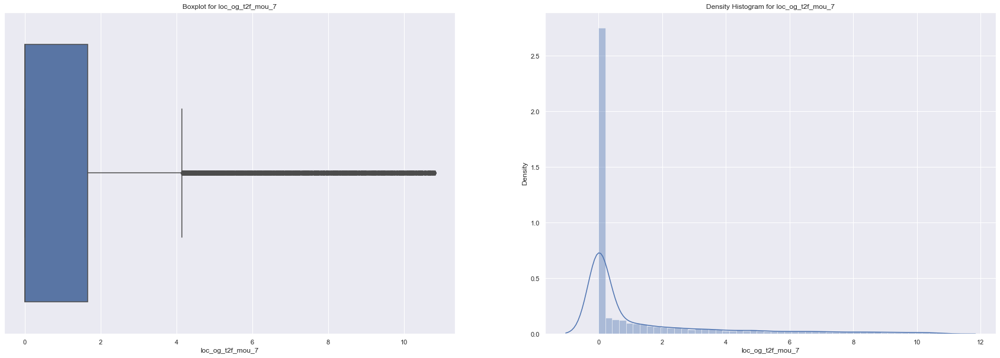

local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7
count    17993.000000
mean         1.361101
std          2.430517
min          0.000000
25%          0.000000
50%          0.000000
75%          1.660000
max         10.810000
Name: loc_og_t2f_mou_7, dtype: float64
******************************************************************************************


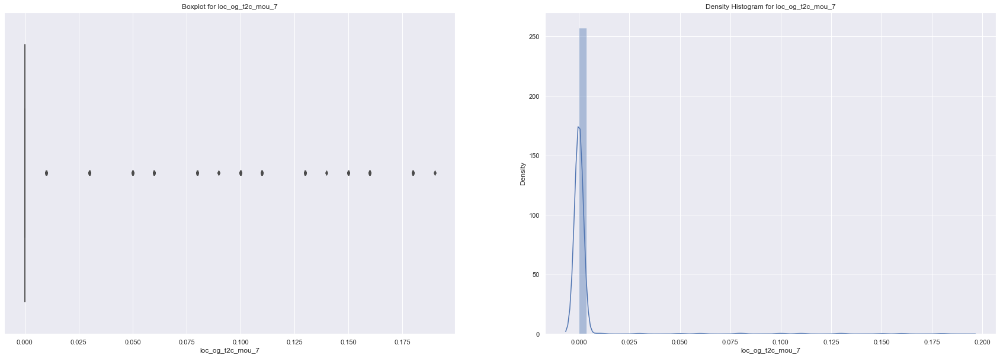

local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_7
count    15955.000000
mean         0.001964
std          0.015196
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.190000
Name: loc_og_t2c_mou_7, dtype: float64
******************************************************************************************


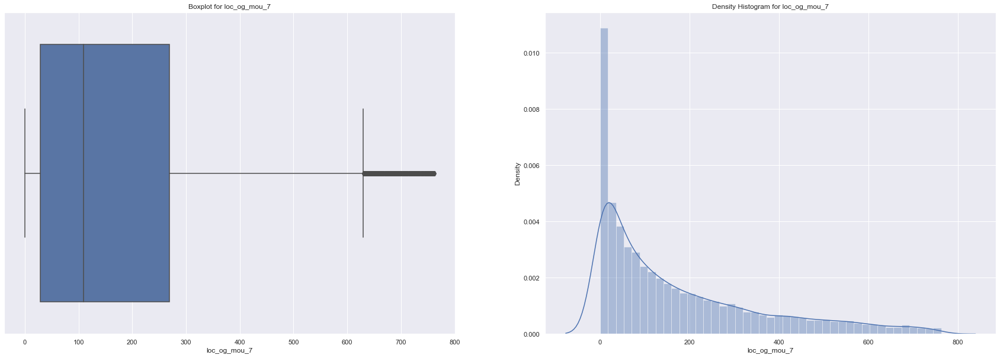

local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_7
count    19564.000000
mean       176.260690
std        185.030083
min          0.000000
25%         29.390000
50%        109.100000
75%        269.540000
max        762.380000
Name: loc_og_mou_7, dtype: float64
******************************************************************************************


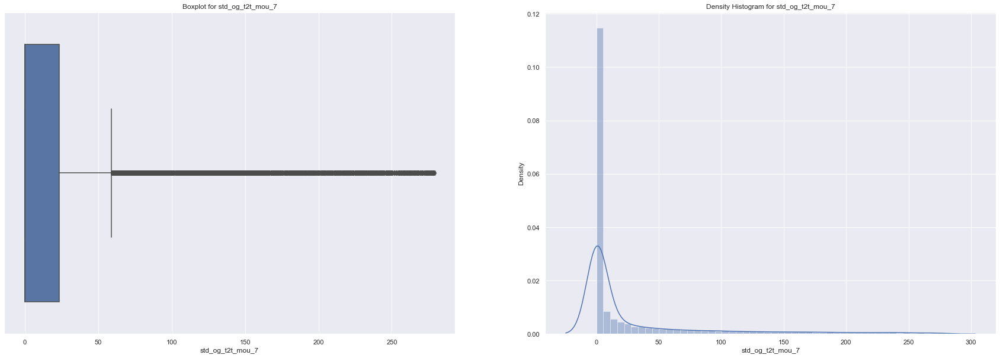

std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7
count    17468.000000
mean        28.454524
std         57.698718
min          0.000000
25%          0.000000
50%          0.000000
75%         23.682500
max        279.060000
Name: std_og_t2t_mou_7, dtype: float64
******************************************************************************************


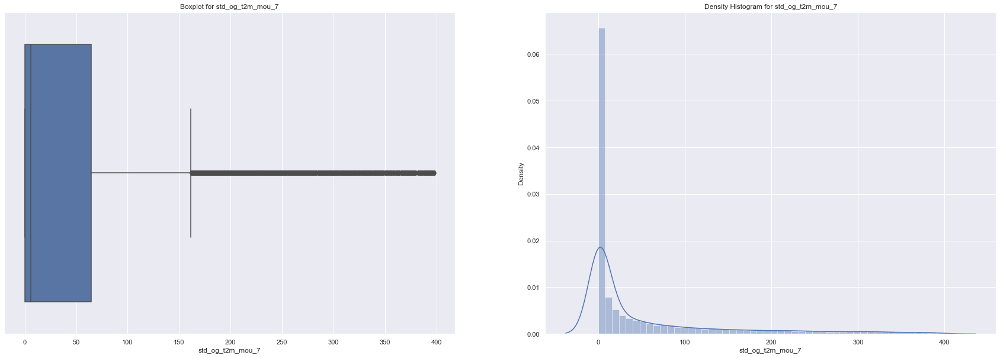

std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7
count    18014.000000
mean        52.641059
std         88.648718
min          0.000000
25%          0.000000
50%          5.940000
75%         64.577500
max        398.240000
Name: std_og_t2m_mou_7, dtype: float64
******************************************************************************************


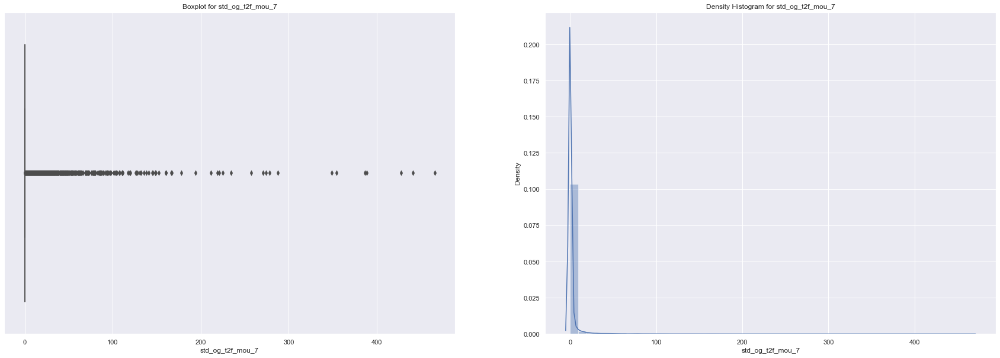

std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7
count    21001.000000
mean         1.693208
std         12.301786
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        465.790000
Name: std_og_t2f_mou_7, dtype: float64
******************************************************************************************


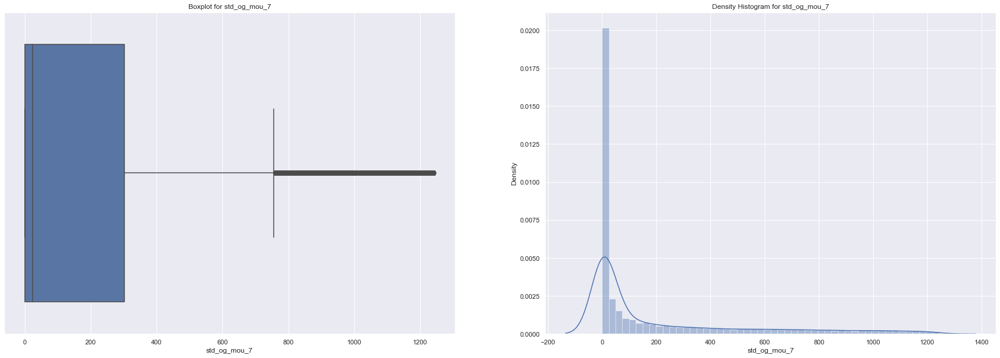

std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_7
count    19158.000000
mean       207.467033
std        321.474259
min          0.000000
25%          0.000000
50%         24.230000
75%        302.567500
max       1243.840000
Name: std_og_mou_7, dtype: float64
******************************************************************************************


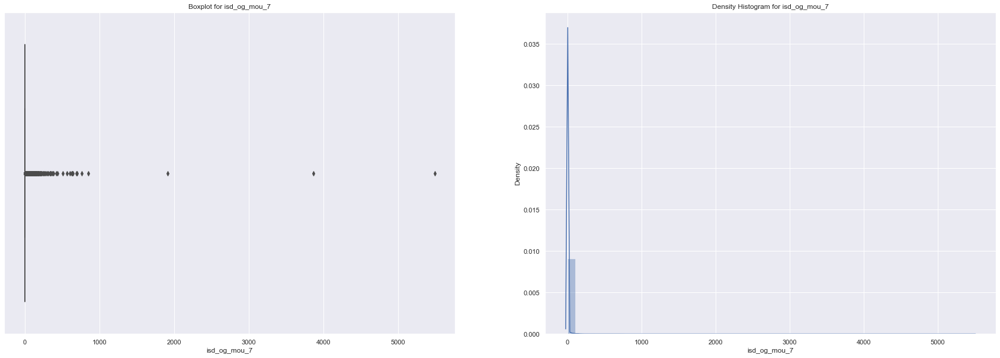

isd calls_outgoing calls_minutes of usage  voice calls_7
count    21001.000000
mean         2.247356
std         52.120893
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5490.280000
Name: isd_og_mou_7, dtype: float64
******************************************************************************************


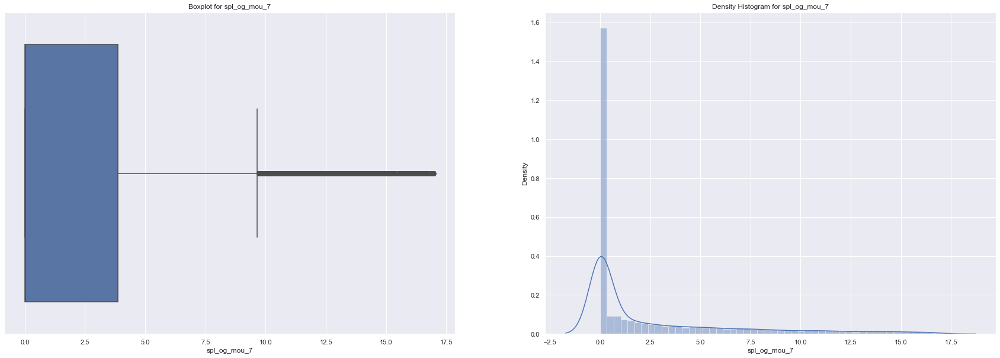

special calls_outgoing calls_minutes of usage  voice calls_7
count    18640.000000
mean         2.584279
std          4.089601
min          0.000000
25%          0.000000
50%          0.030000
75%          3.860000
max         17.010000
Name: spl_og_mou_7, dtype: float64
******************************************************************************************


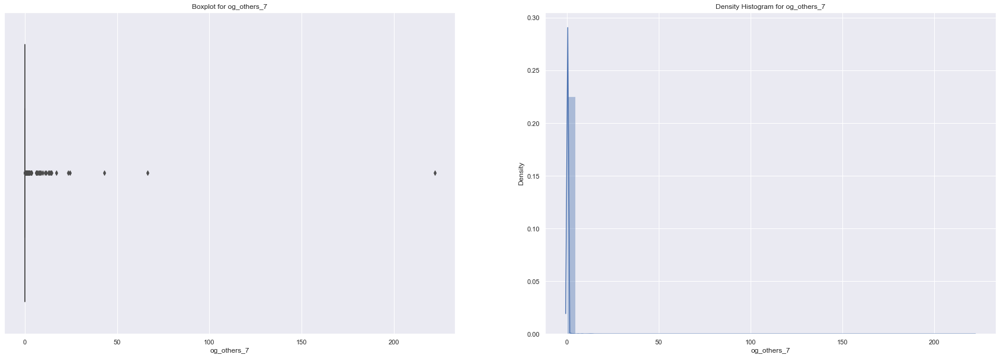

outgoing calls_others_7
count    21001.000000
mean         0.032346
std          1.678701
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        221.940000
Name: og_others_7, dtype: float64
******************************************************************************************


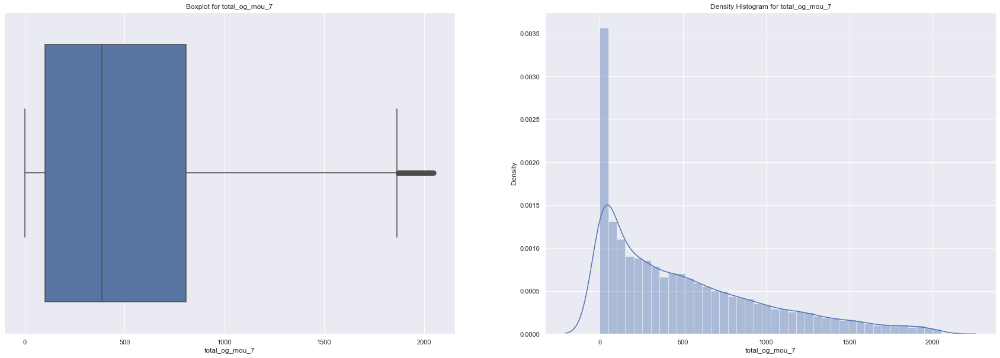

total_outgoing calls_minutes of usage  voice calls_7
count    20096.000000
mean       519.556980
std        492.832159
min          0.000000
25%        101.987500
50%        386.390000
75%        806.842500
max       2053.040000
Name: total_og_mou_7, dtype: float64
******************************************************************************************


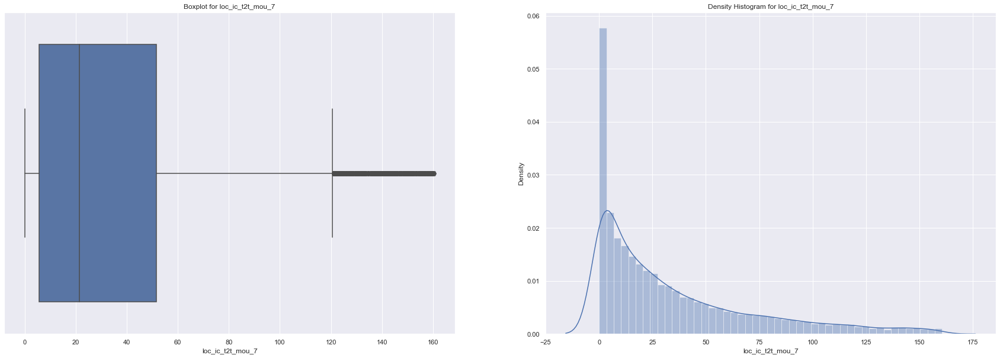

local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7
count    19123.000000
mean        34.701168
std         37.442913
min          0.000000
25%          5.590000
50%         21.380000
75%         51.610000
max        160.630000
Name: loc_ic_t2t_mou_7, dtype: float64
******************************************************************************************


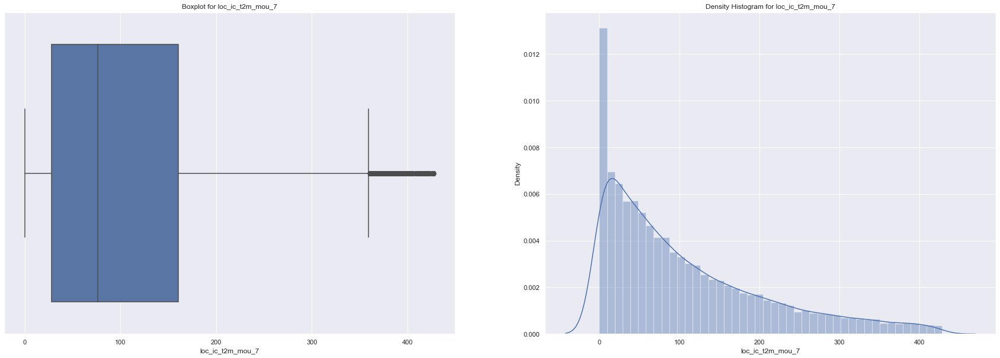

local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7
count    19563.000000
mean       107.365928
std        100.678119
min          0.000000
25%         27.860000
50%         76.310000
75%        160.475000
max        428.280000
Name: loc_ic_t2m_mou_7, dtype: float64
******************************************************************************************


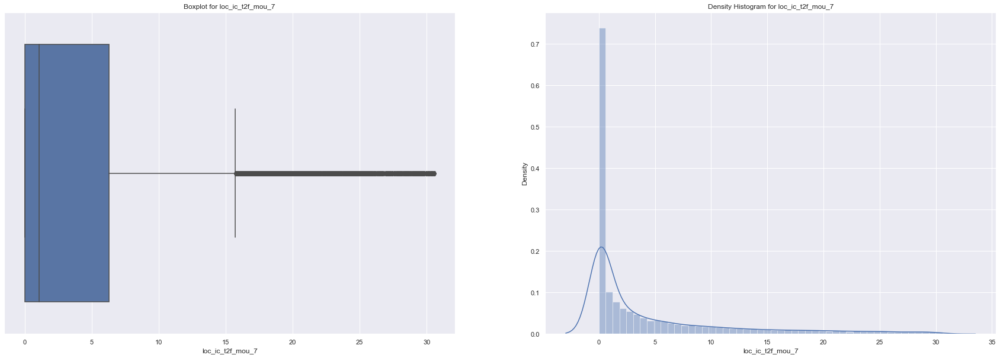

local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7
count    18263.000000
mean         4.581702
std          6.996084
min          0.000000
25%          0.000000
50%          1.050000
75%          6.280000
max         30.590000
Name: loc_ic_t2f_mou_7, dtype: float64
******************************************************************************************


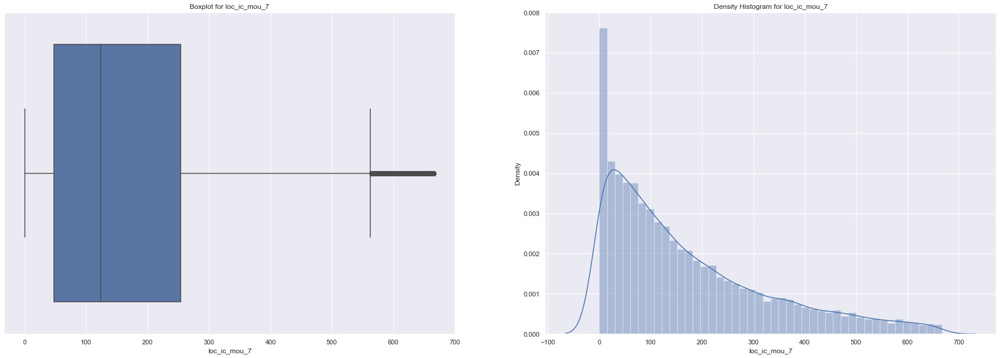

local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_7
count    19639.000000
mean       171.270566
std        157.151882
min          0.000000
25%         47.800000
50%        123.430000
75%        253.750000
max        667.180000
Name: loc_ic_mou_7, dtype: float64
******************************************************************************************


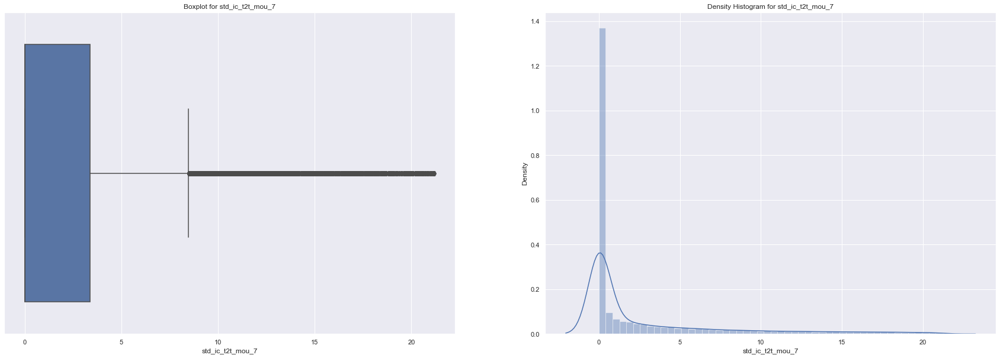

std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7
count    18044.000000
mean         2.742180
std          4.831126
min          0.000000
25%          0.000000
50%          0.000000
75%          3.380000
max         21.200000
Name: std_ic_t2t_mou_7, dtype: float64
******************************************************************************************


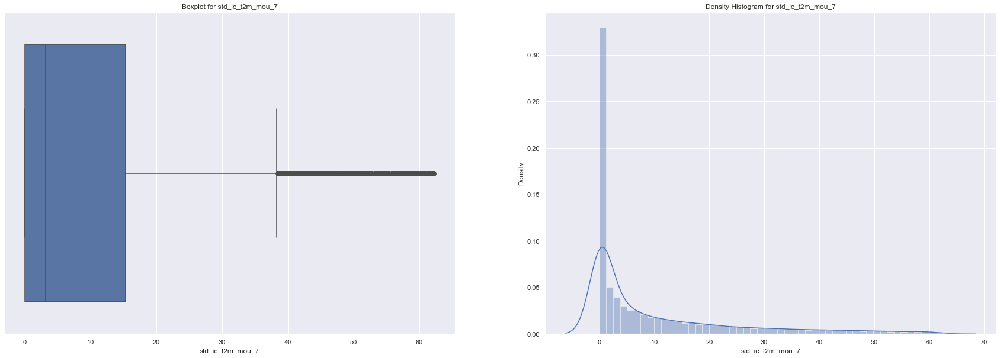

std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7
count    18646.000000
mean        10.348263
std         14.660400
min          0.000000
25%          0.000000
50%          3.180000
75%         15.330000
max         62.290000
Name: std_ic_t2m_mou_7, dtype: float64
******************************************************************************************


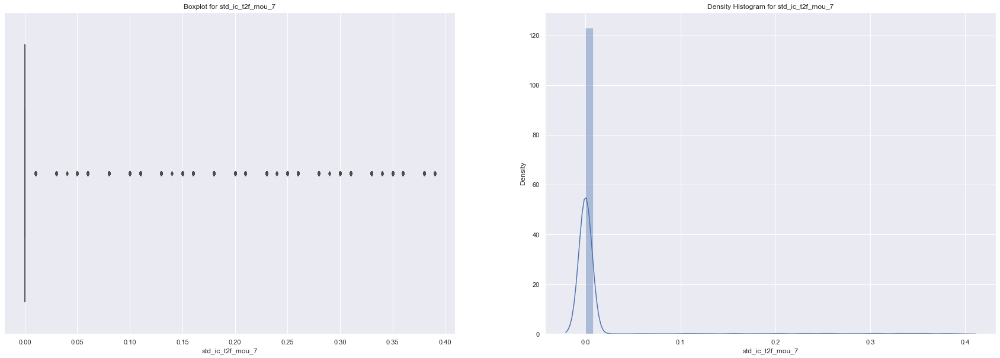

std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7
count    16193.000000
mean         0.008871
std          0.048308
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.390000
Name: std_ic_t2f_mou_7, dtype: float64
******************************************************************************************


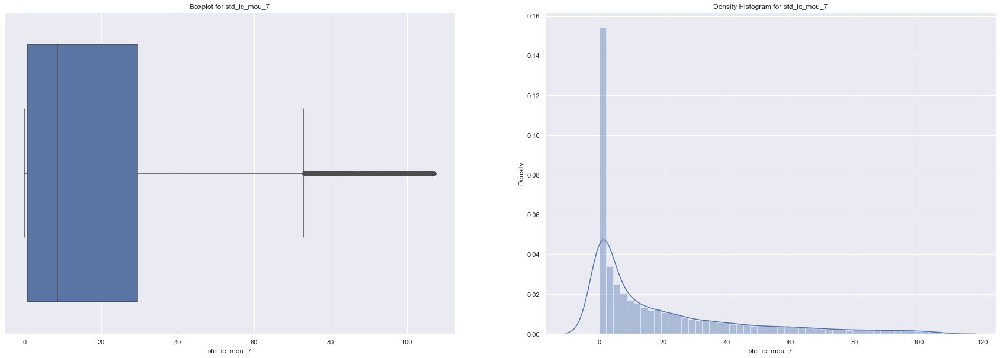

std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_7
count    18858.000000
mean        19.641990
std         25.180005
min          0.000000
25%          0.580000
50%          8.510000
75%         29.490000
max        107.210000
Name: std_ic_mou_7, dtype: float64
******************************************************************************************


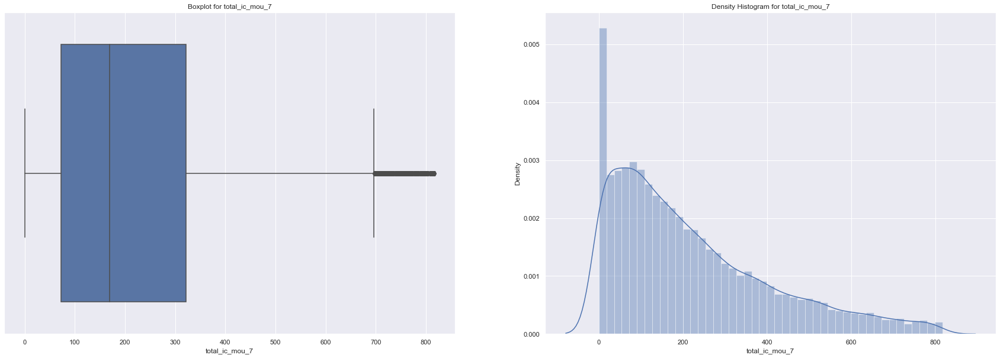

total_incoming calls_minutes of usage  voice calls_7
count    19602.000000
mean       220.288299
std        189.377833
min          0.000000
25%         72.795000
50%        169.290000
75%        322.152500
max        817.190000
Name: total_ic_mou_7, dtype: float64
******************************************************************************************


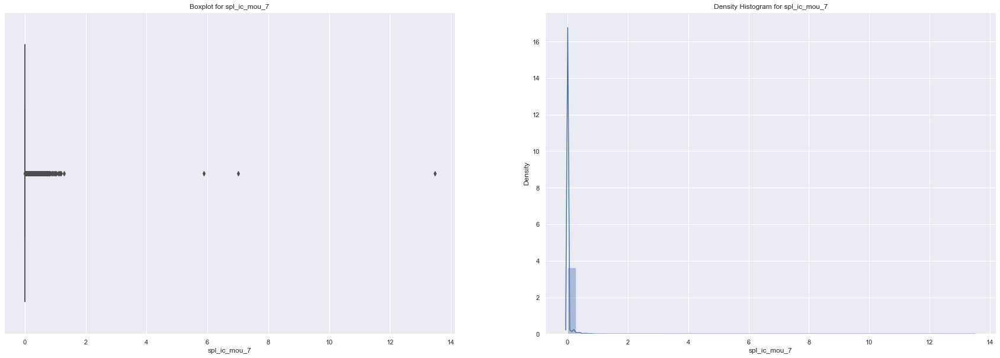

special calls_incoming calls_minutes of usage  voice calls_7
count    21001.000000
mean         0.019292
std          0.141535
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         13.460000
Name: spl_ic_mou_7, dtype: float64
******************************************************************************************


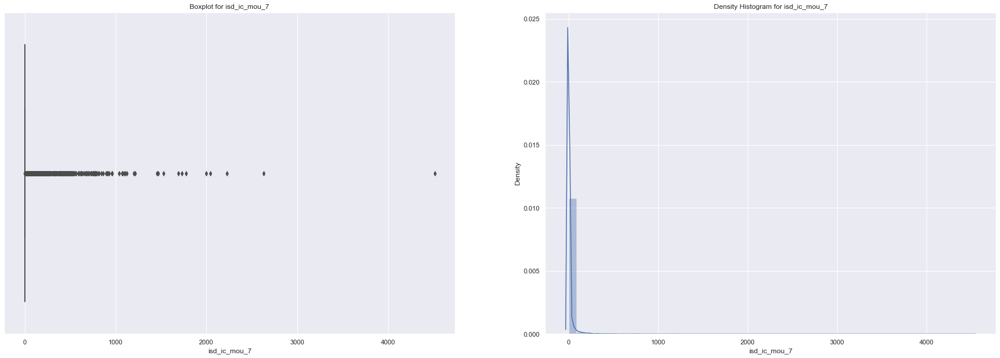

isd calls_incoming calls_minutes of usage  voice calls_7
count    21001.000000
mean        11.606375
std         75.931781
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4512.640000
Name: isd_ic_mou_7, dtype: float64
******************************************************************************************


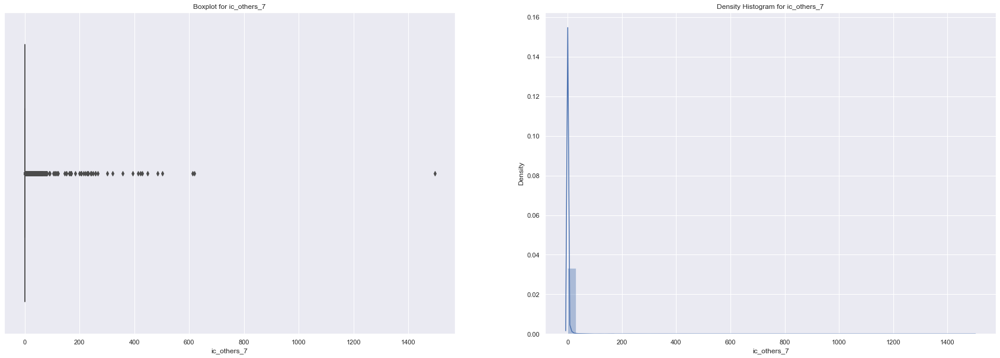

incoming calls_others_7
count    21001.000000
mean         1.552936
std         17.285992
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1495.940000
Name: ic_others_7, dtype: float64
******************************************************************************************


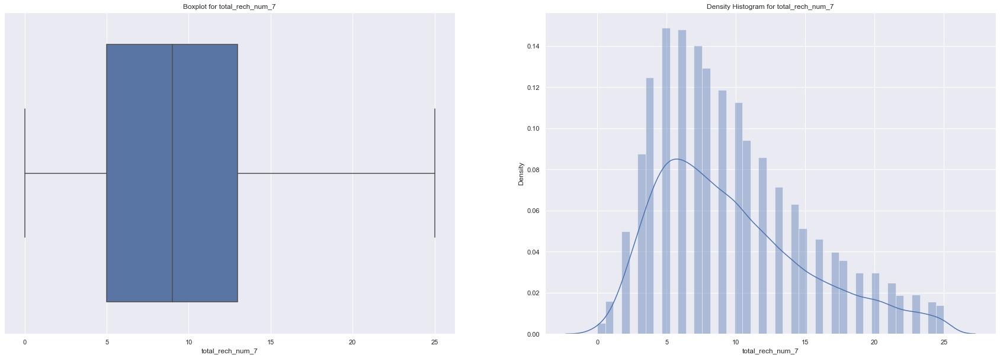

total_recharge_number_7
count    19450.00000
mean         9.69964
std          5.46825
min          0.00000
25%          5.00000
50%          9.00000
75%         13.00000
max         25.00000
Name: total_rech_num_7, dtype: float64
******************************************************************************************


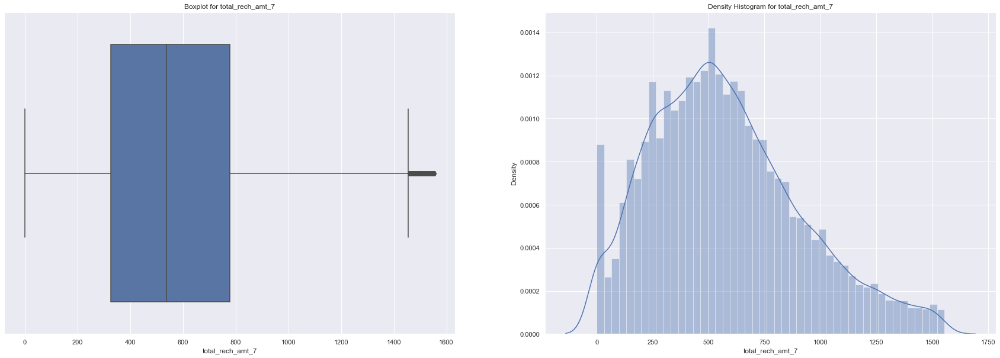

total_recharge_amount in local currency_7
count    20077.000000
mean       576.600887
std        334.694267
min          0.000000
25%        326.000000
50%        537.000000
75%        778.000000
max       1555.000000
Name: total_rech_amt_7, dtype: float64
******************************************************************************************


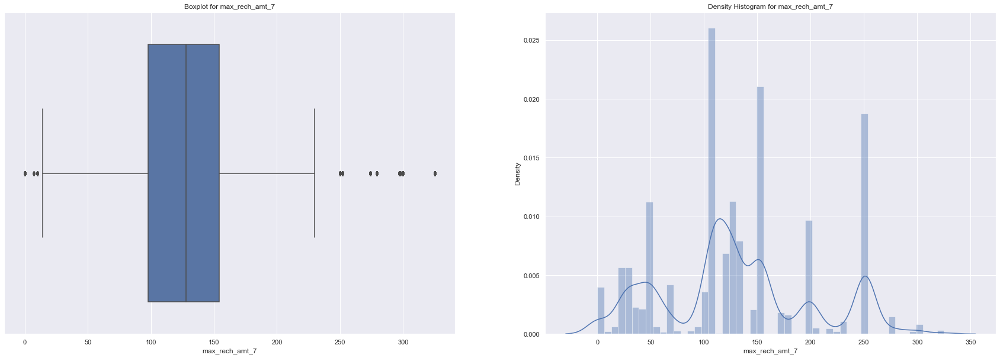

maximum_recharge_amount in local currency_7
count    19323.000000
mean       130.544688
std         71.132888
min          0.000000
25%         98.000000
50%        128.000000
75%        154.000000
max        325.000000
Name: max_rech_amt_7, dtype: float64
******************************************************************************************


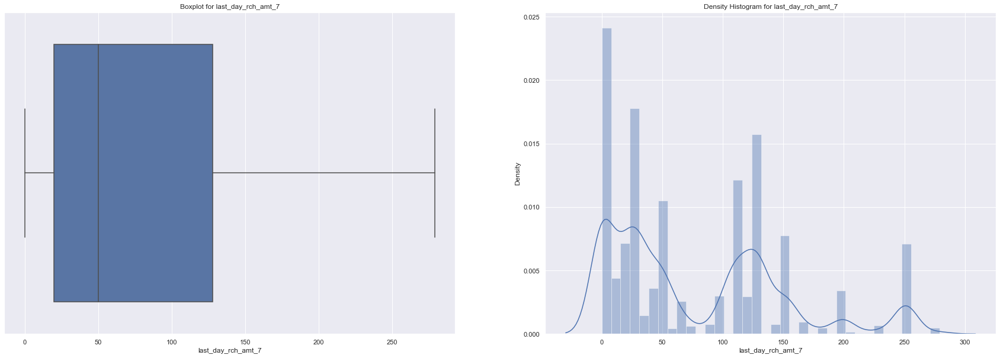

last_day_rch_amount in local currency_7
count    20188.000000
mean        78.087824
std         72.101215
min          0.000000
25%         20.000000
50%         50.000000
75%        128.000000
max        279.000000
Name: last_day_rch_amt_7, dtype: float64
******************************************************************************************


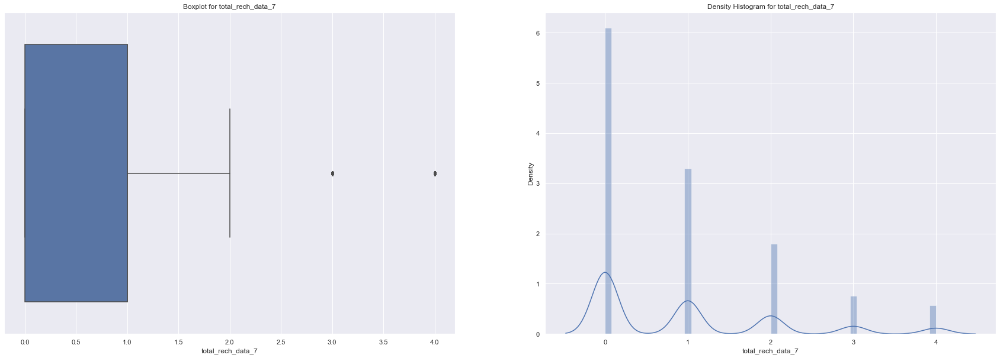

total_recharge_mobile internet_7
count    18352.000000
mean         0.912707
std          1.129271
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          4.000000
Name: total_rech_data_7, dtype: float64
******************************************************************************************


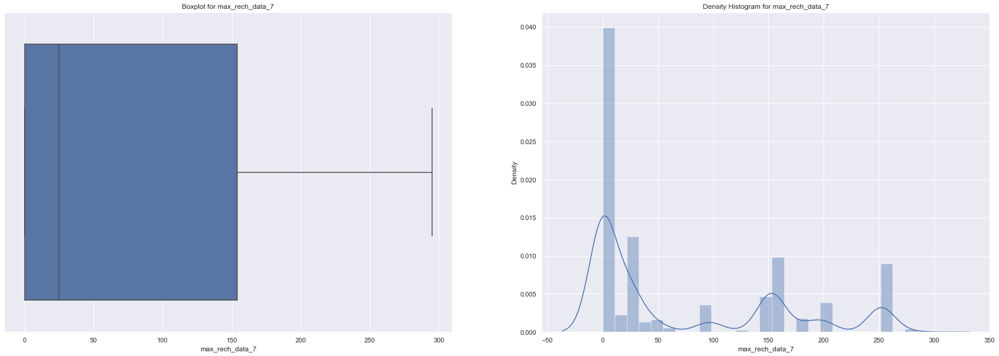

maximum_recharge_mobile internet_7
count    20673.000000
mean        71.474484
std         89.291526
min          0.000000
25%          0.000000
50%         25.000000
75%        154.000000
max        295.000000
Name: max_rech_data_7, dtype: float64
******************************************************************************************


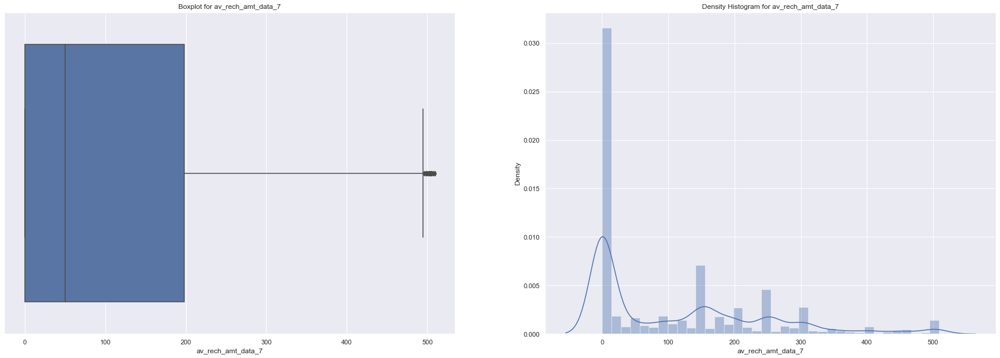

average_recharge_amount in local currency_mobile internet_7
count    20225.000000
mean       111.915239
std        133.098361
min          0.000000
25%          0.000000
50%         50.000000
75%        198.000000
max        509.000000
Name: av_rech_amt_data_7, dtype: float64
******************************************************************************************


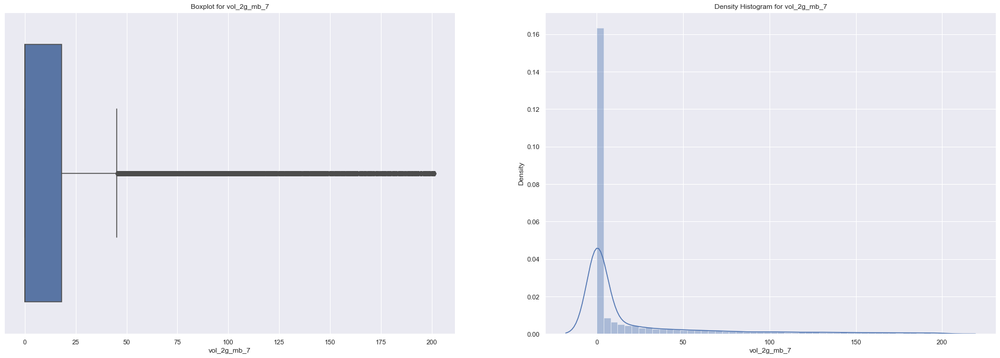

mobile internet usage volume in mb_g network_mb_7
count    17482.000000
mean        20.672479
std         42.150758
min          0.000000
25%          0.000000
50%          0.000000
75%         18.080000
max        201.380000
Name: vol_2g_mb_7, dtype: float64
******************************************************************************************


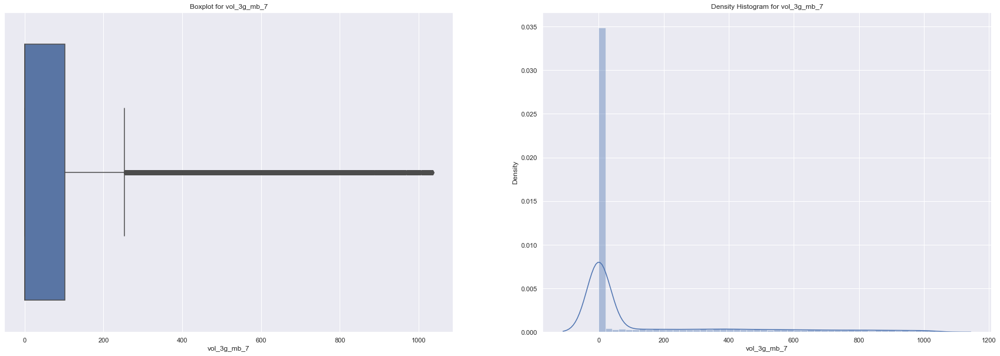

mobile internet usage volume in mb_g network_mb_7
count    18506.000000
mean       131.841215
std        259.911284
min          0.000000
25%          0.000000
50%          0.000000
75%        101.585000
max       1035.110000
Name: vol_3g_mb_7, dtype: float64
******************************************************************************************


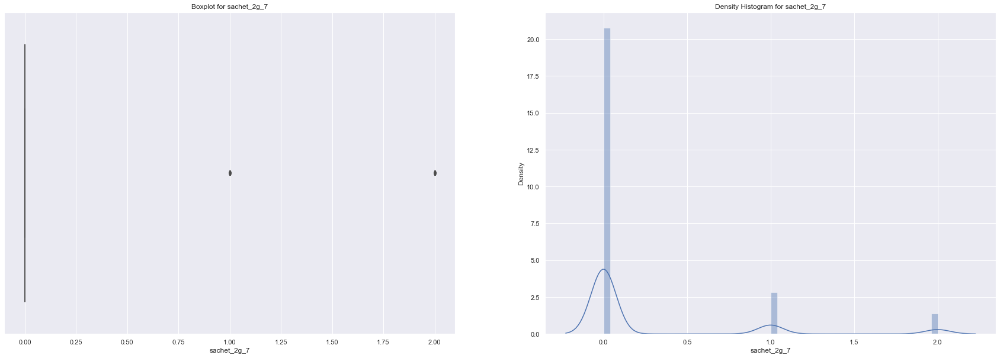

service schemes with validity smaller than a month_g network_7
count    17650.000000
mean         0.223683
std          0.533054
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: sachet_2g_7, dtype: float64
******************************************************************************************


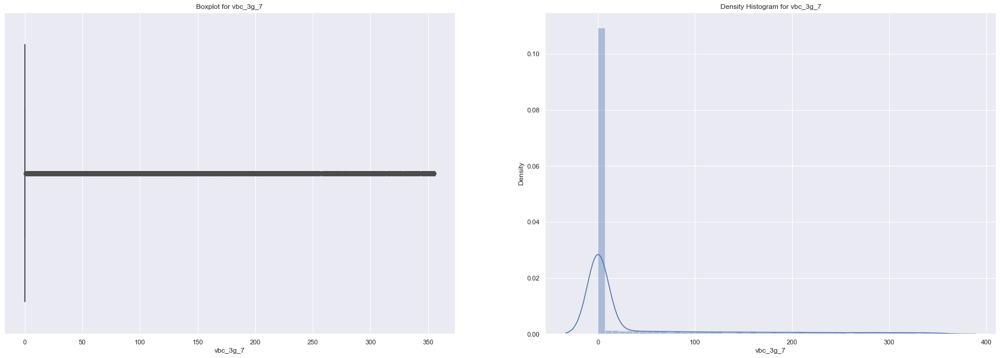

volume based cost  when no specific scheme is not purchased and paid as per usage_g network_7
count    17606.000000
mean        32.997720
std         78.023337
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        355.630000
Name: vbc_3g_7, dtype: float64
******************************************************************************************


In [38]:
for col in num_cols:
    if col[-1] == '7':
        univariate(remove_outliers_series(churn_filtered[col]))

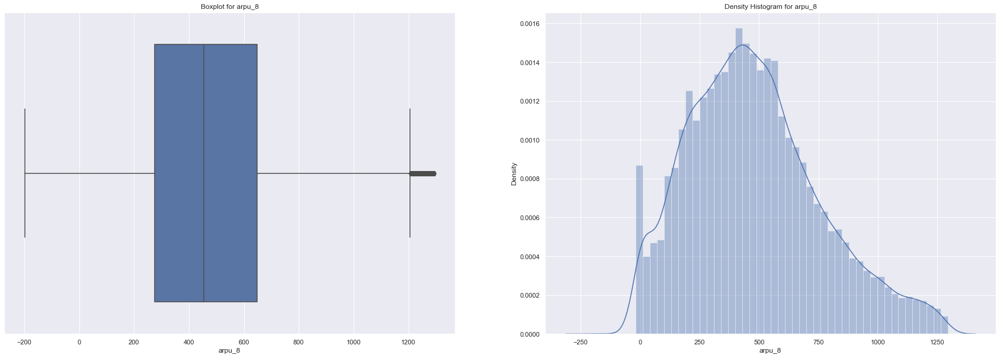

average revenue per user_8
count    19988.000000
mean       481.545227
std        278.129056
min       -197.957000
25%        276.069000
50%        453.601000
75%        647.850250
max       1295.006000
Name: arpu_8, dtype: float64
******************************************************************************************


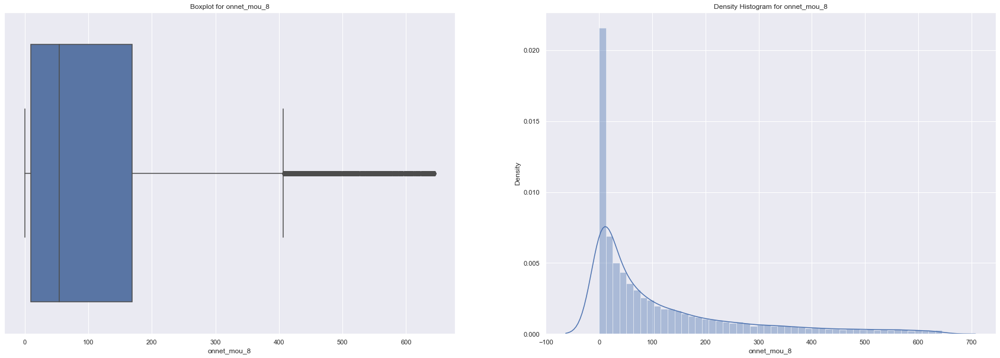

all kind of calls within the same operator network_minutes of usage  voice calls_8
count    18581.000000
mean       118.028082
std        149.110674
min          0.000000
25%          9.690000
50%         54.580000
75%        168.560000
max        644.860000
Name: onnet_mou_8, dtype: float64
******************************************************************************************


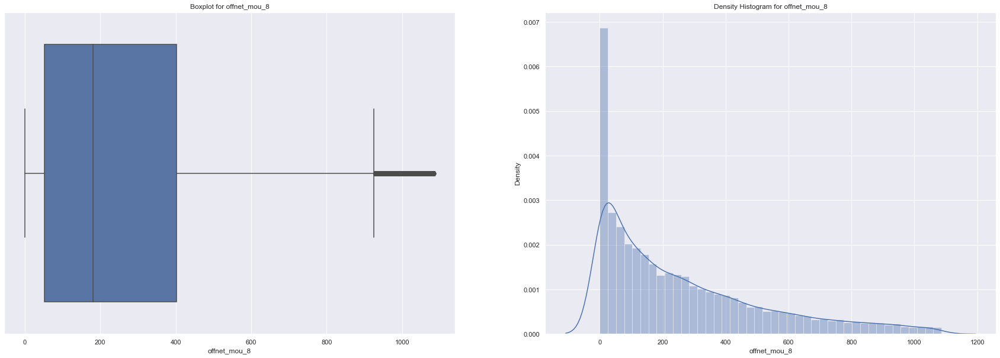

all kind of calls outside the operator t network_minutes of usage  voice calls_8
count    19634.000000
mean       263.850483
std        260.427207
min          0.000000
25%         52.567500
50%        181.500000
75%        401.812500
max       1085.940000
Name: offnet_mou_8, dtype: float64
******************************************************************************************


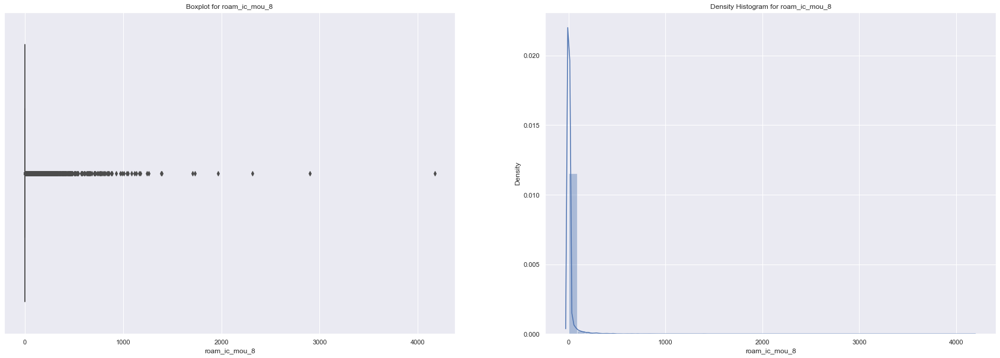

indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_8
count    21001.000000
mean        12.537461
std         75.056334
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4169.810000
Name: roam_ic_mou_8, dtype: float64
******************************************************************************************


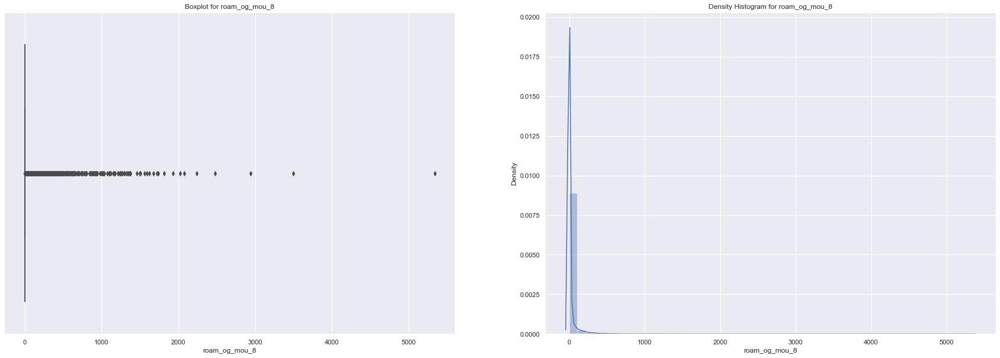

indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_8
count    21001.000000
mean        20.193852
std        107.908463
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5337.040000
Name: roam_og_mou_8, dtype: float64
******************************************************************************************


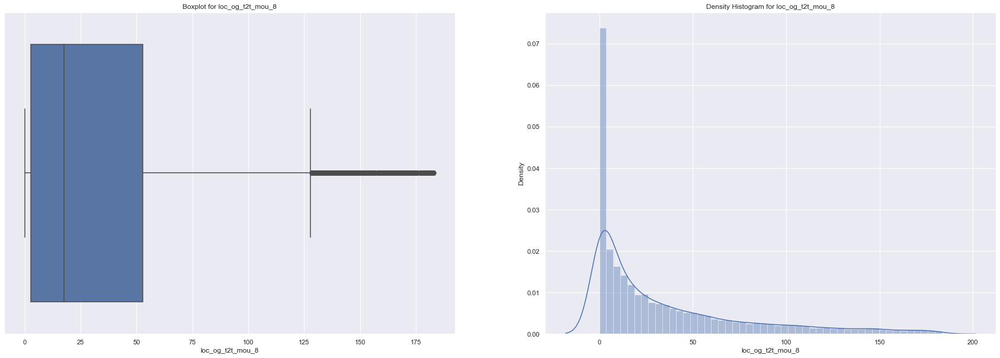

local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8
count    18883.000000
mean        35.437986
std         42.992156
min          0.000000
25%          2.700000
50%         17.590000
75%         52.760000
max        183.410000
Name: loc_og_t2t_mou_8, dtype: float64
******************************************************************************************


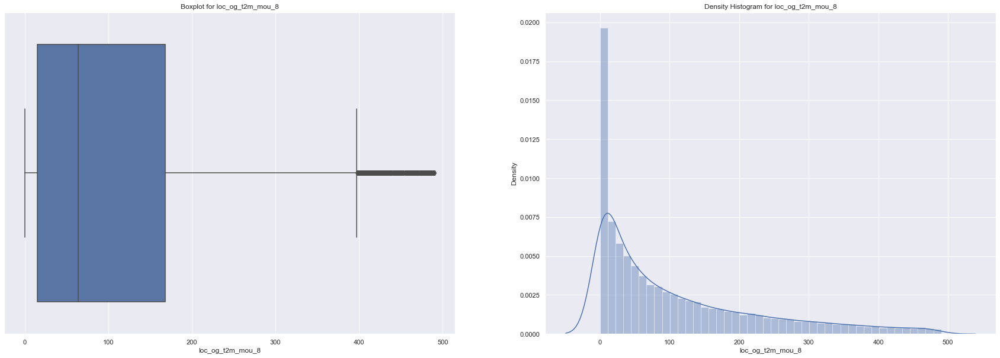

local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8
count    19534.000000
mean       108.856896
std        118.711744
min          0.000000
25%         15.160000
50%         63.780000
75%        167.930000
max        490.230000
Name: loc_og_t2m_mou_8, dtype: float64
******************************************************************************************


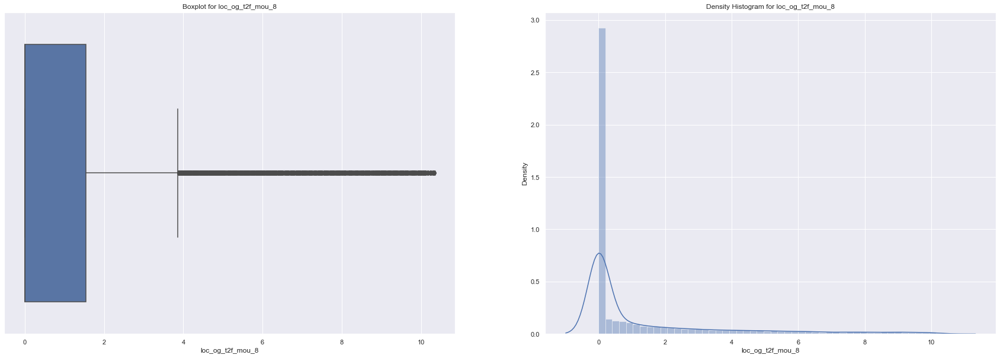

local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8
count    17977.000000
mean         1.284838
std          2.325081
min          0.000000
25%          0.000000
50%          0.000000
75%          1.550000
max         10.340000
Name: loc_og_t2f_mou_8, dtype: float64
******************************************************************************************


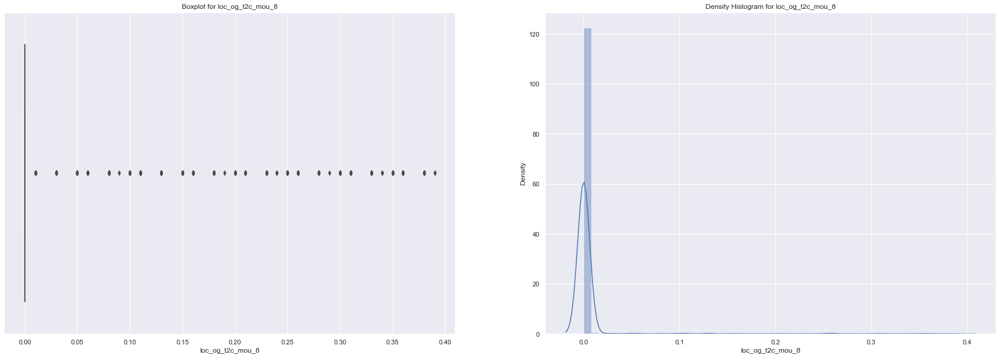

local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_8
count    16096.000000
mean         0.007858
std          0.043487
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.390000
Name: loc_og_t2c_mou_8, dtype: float64
******************************************************************************************


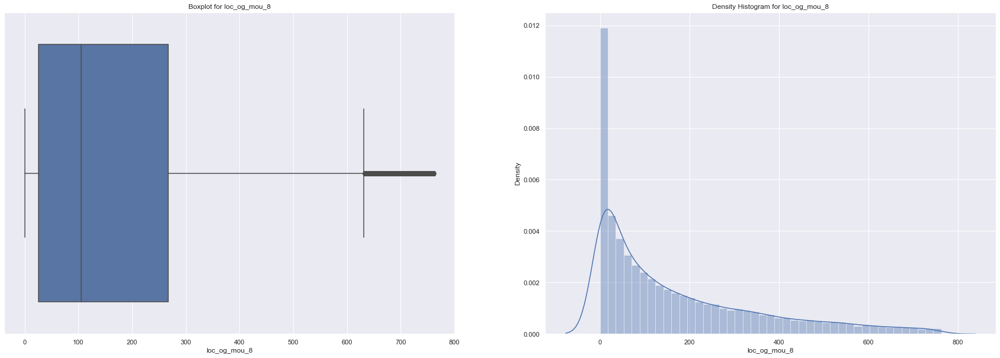

local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_8
count    19599.000000
mean       172.623037
std        184.239239
min          0.000000
25%         25.710000
50%        104.980000
75%        267.715000
max        763.080000
Name: loc_og_mou_8, dtype: float64
******************************************************************************************


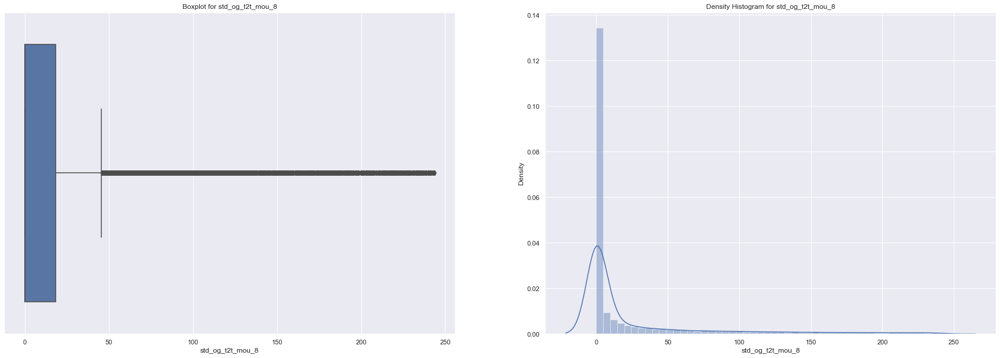

std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8
count    17425.000000
mean        24.112342
std         50.237264
min          0.000000
25%          0.000000
50%          0.000000
75%         18.280000
max        243.690000
Name: std_og_t2t_mou_8, dtype: float64
******************************************************************************************


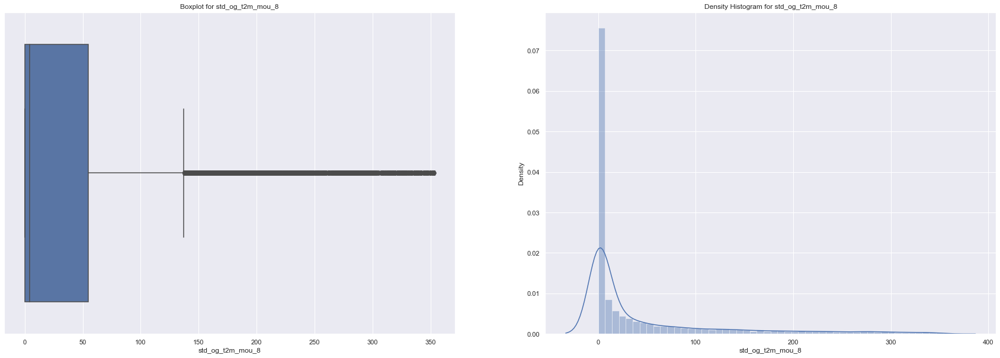

std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8
count    17960.000000
mean        45.948328
std         78.764447
min          0.000000
25%          0.000000
50%          4.310000
75%         54.780000
max        353.480000
Name: std_og_t2m_mou_8, dtype: float64
******************************************************************************************


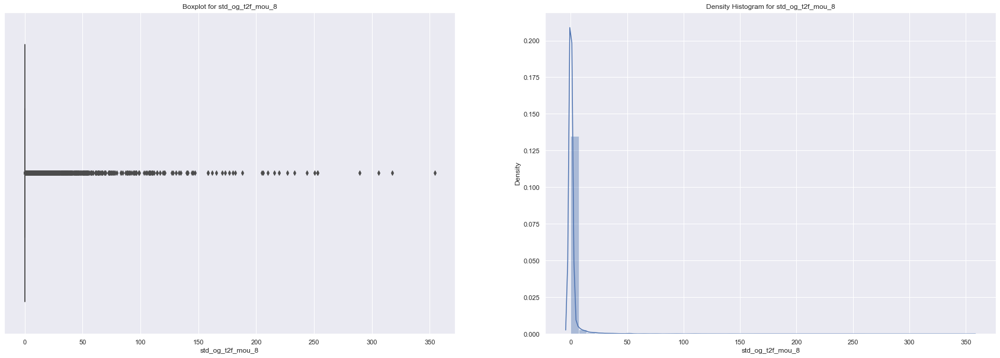

std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8
count    21001.000000
mean         1.634826
std         10.832720
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        354.160000
Name: std_og_t2f_mou_8, dtype: float64
******************************************************************************************


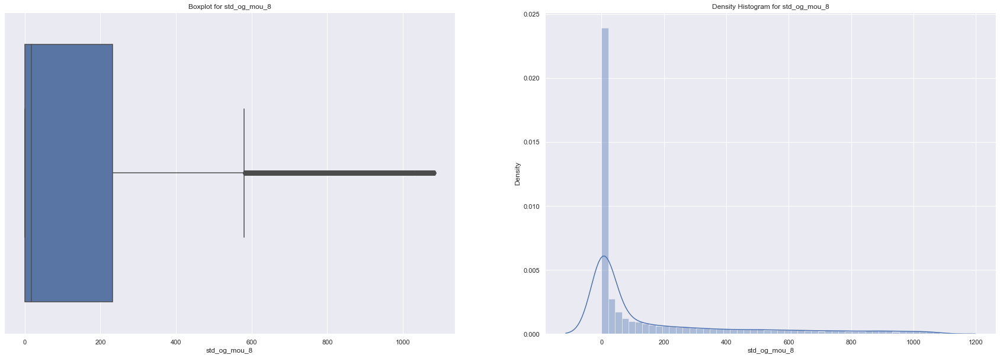

std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_8
count    18829.000000
mean       170.141448
std        273.698481
min          0.000000
25%          0.000000
50%         16.890000
75%        231.830000
max       1083.680000
Name: std_og_mou_8, dtype: float64
******************************************************************************************


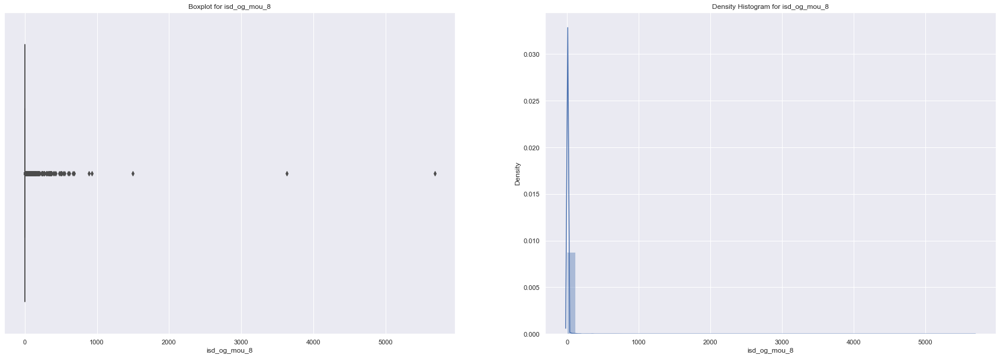

isd calls_outgoing calls_minutes of usage  voice calls_8
count    21001.000000
mean         2.310107
std         52.261919
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5681.540000
Name: isd_og_mou_8, dtype: float64
******************************************************************************************


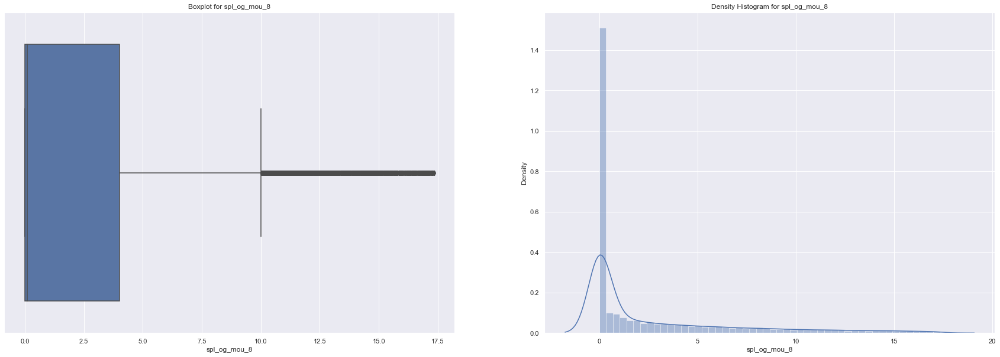

special calls_outgoing calls_minutes of usage  voice calls_8
count    18637.000000
mean         2.657772
std          4.154504
min          0.000000
25%          0.000000
50%          0.100000
75%          4.010000
max         17.340000
Name: spl_og_mou_8, dtype: float64
******************************************************************************************


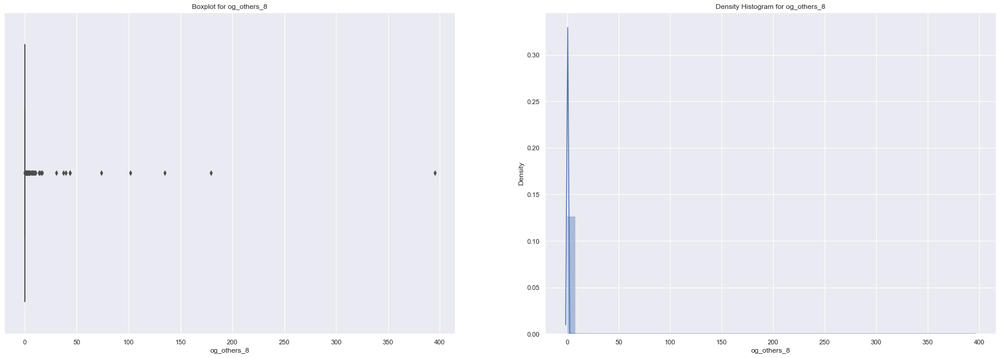

outgoing calls_others_8
count    21001.000000
mean         0.066631
std          3.323743
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        394.930000
Name: og_others_8, dtype: float64
******************************************************************************************


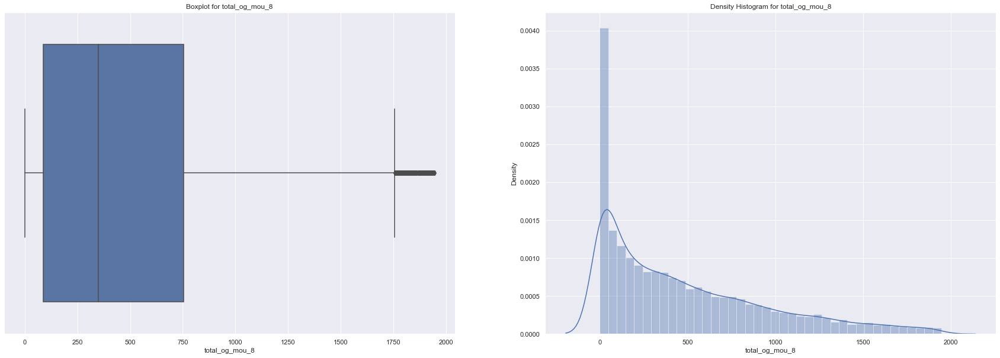

total_outgoing calls_minutes of usage  voice calls_8
count    19989.000000
mean       483.109268
std        469.602247
min          0.000000
25%         86.590000
50%        348.390000
75%        754.480000
max       1946.090000
Name: total_og_mou_8, dtype: float64
******************************************************************************************


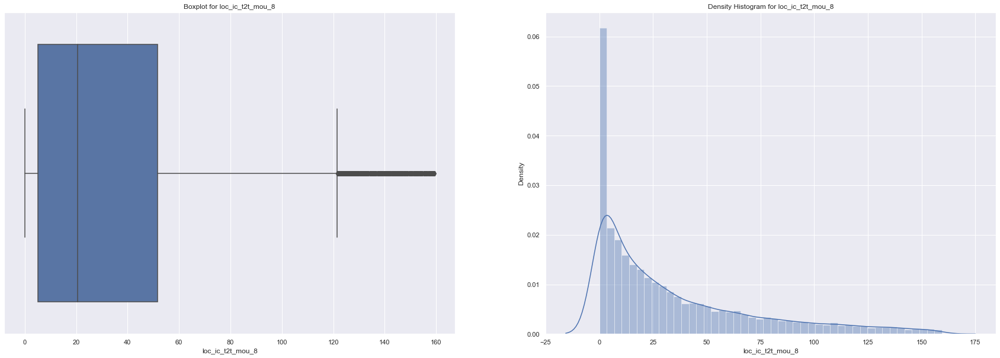

local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8
count    19166.000000
mean        34.358302
std         37.578382
min          0.000000
25%          5.092500
50%         20.530000
75%         51.640000
max        159.380000
Name: loc_ic_t2t_mou_8, dtype: float64
******************************************************************************************


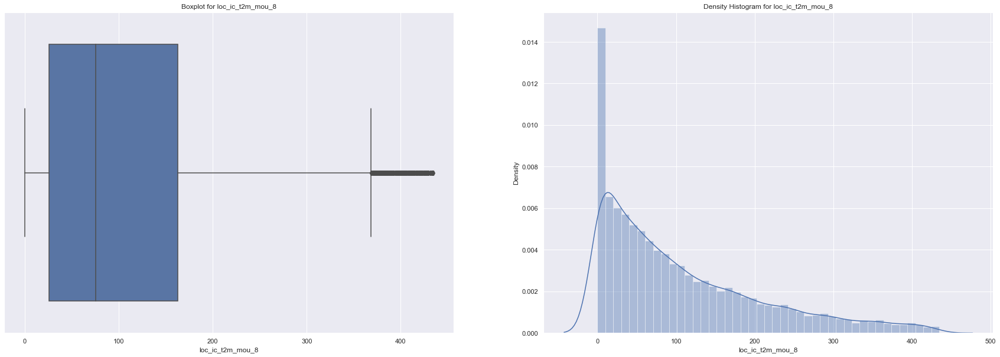

local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8
count    19546.000000
mean       107.199435
std        102.144852
min          0.000000
25%         25.940000
50%         75.540000
75%        162.805000
max        434.660000
Name: loc_ic_t2m_mou_8, dtype: float64
******************************************************************************************


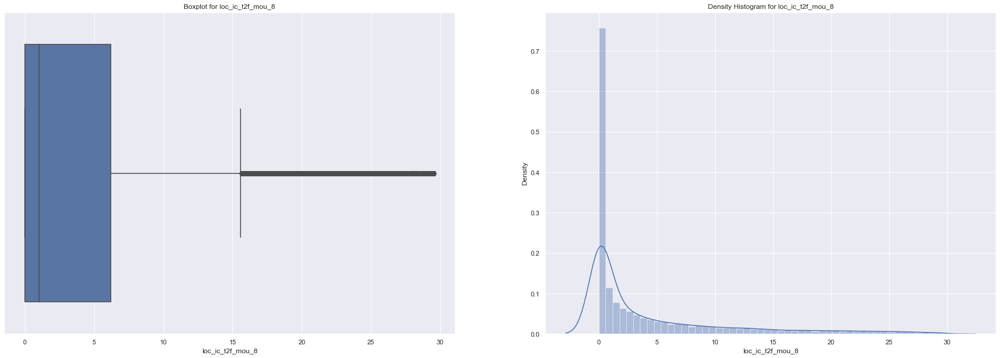

local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8
count    18328.000000
mean         4.451073
std          6.760878
min          0.000000
25%          0.000000
50%          1.030000
75%          6.230000
max         29.590000
Name: loc_ic_t2f_mou_8, dtype: float64
******************************************************************************************


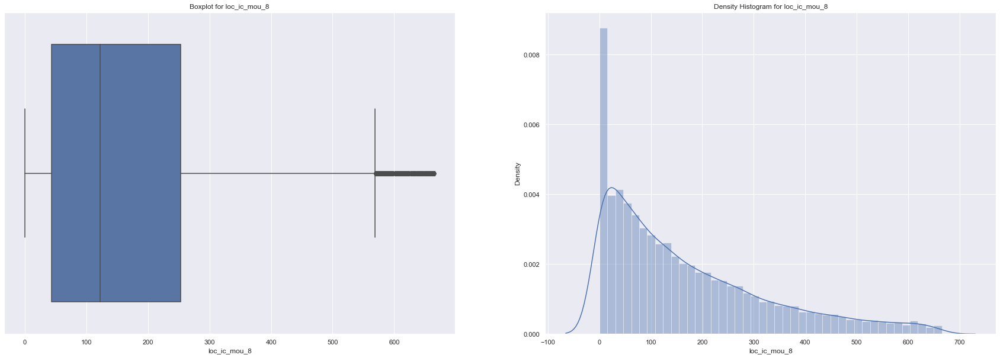

local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_8
count    19609.000000
mean       169.009436
std        157.537114
min          0.000000
25%         43.590000
50%        122.460000
75%        253.610000
max        665.530000
Name: loc_ic_mou_8, dtype: float64
******************************************************************************************


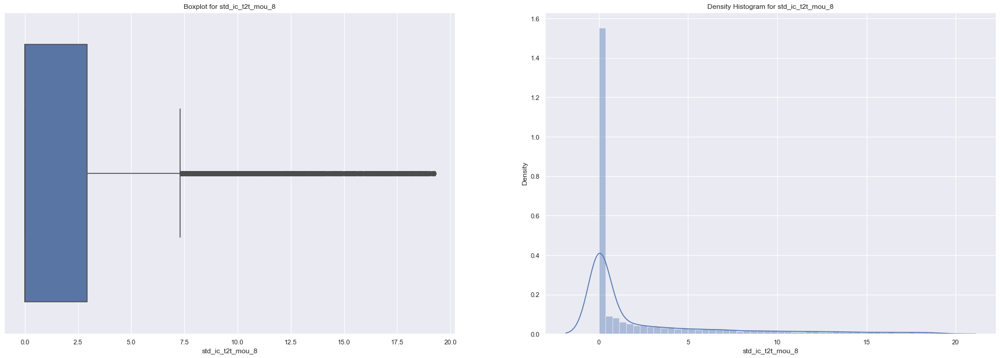

std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8
count    17990.000000
mean         2.435911
std          4.378920
min          0.000000
25%          0.000000
50%          0.000000
75%          2.930000
max         19.260000
Name: std_ic_t2t_mou_8, dtype: float64
******************************************************************************************


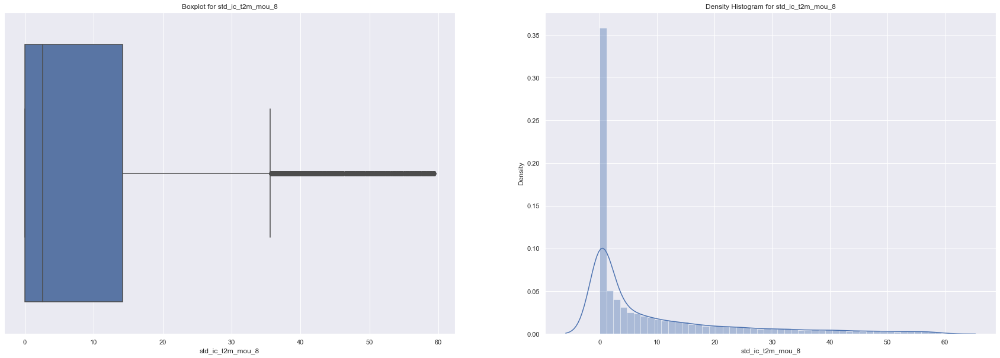

std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8
count    18624.000000
mean         9.723650
std         14.056141
min          0.000000
25%          0.000000
50%          2.630000
75%         14.230000
max         59.440000
Name: std_ic_t2m_mou_8, dtype: float64
******************************************************************************************


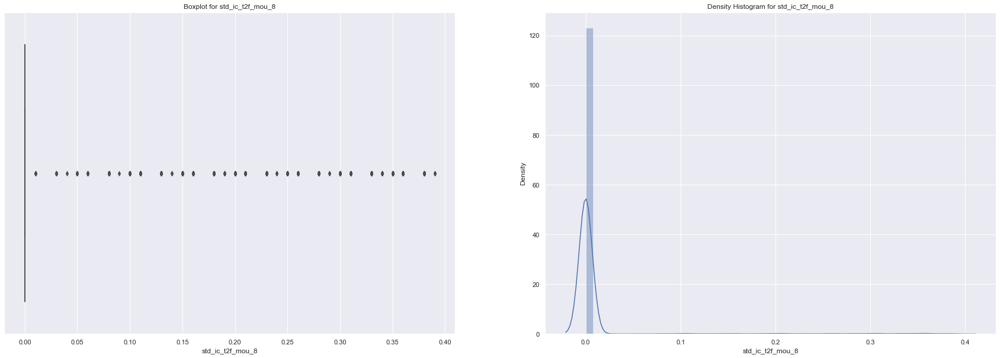

std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8
count    16206.000000
mean         0.009024
std          0.048877
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.390000
Name: std_ic_t2f_mou_8, dtype: float64
******************************************************************************************


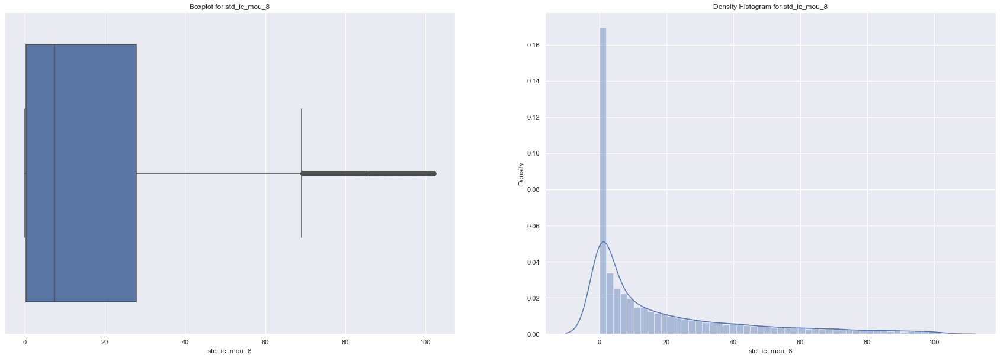

std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_8
count    18845.000000
mean        18.430964
std         24.074278
min          0.000000
25%          0.380000
50%          7.490000
75%         27.840000
max        102.230000
Name: std_ic_mou_8, dtype: float64
******************************************************************************************


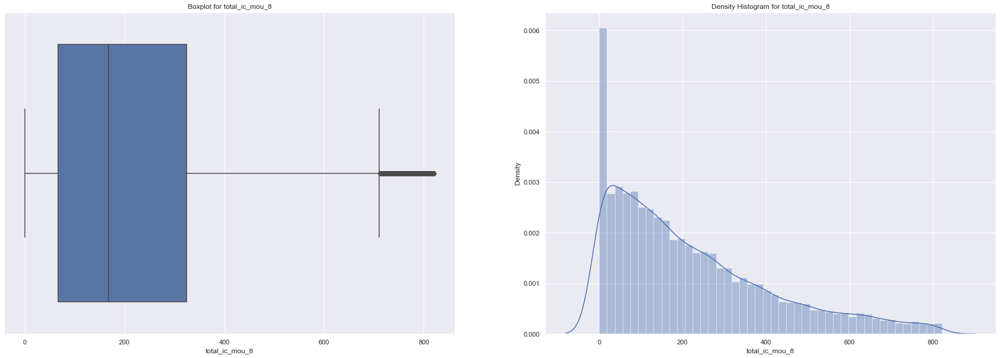

total_incoming calls_minutes of usage  voice calls_8
count    19662.000000
mean       219.395995
std        192.593716
min          0.000000
25%         66.860000
50%        167.180000
75%        324.290000
max        821.590000
Name: total_ic_mou_8, dtype: float64
******************************************************************************************


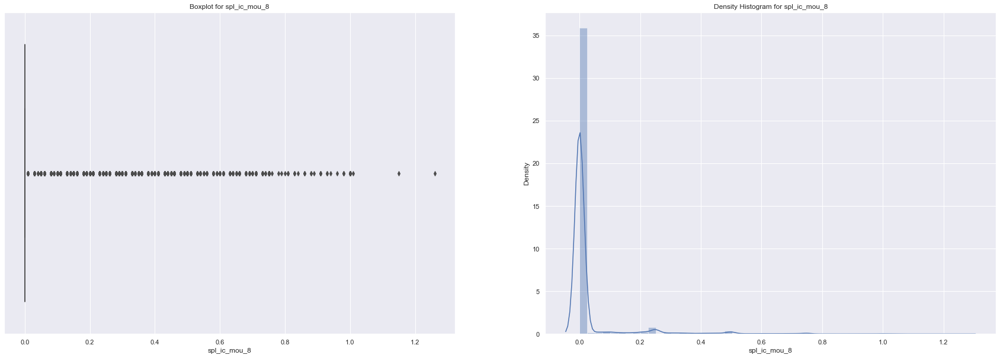

special calls_incoming calls_minutes of usage  voice calls_8
count    21001.000000
mean         0.029560
std          0.111026
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.260000
Name: spl_ic_mou_8, dtype: float64
******************************************************************************************


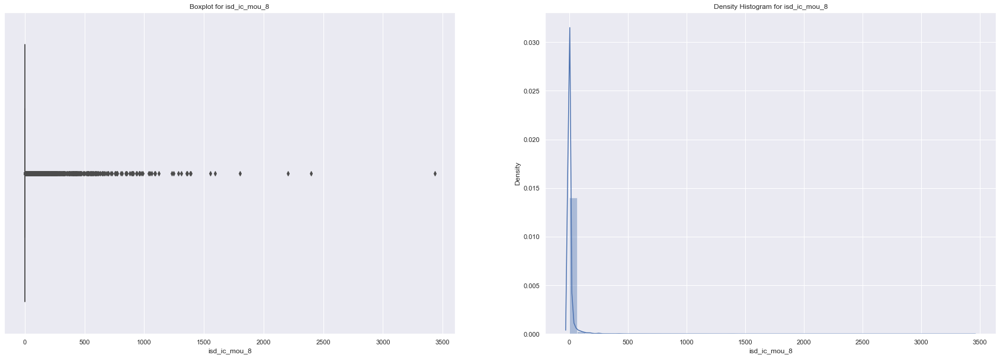

isd calls_incoming calls_minutes of usage  voice calls_8
count    21001.000000
mean        11.619447
std         71.460602
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       3432.880000
Name: isd_ic_mou_8, dtype: float64
******************************************************************************************


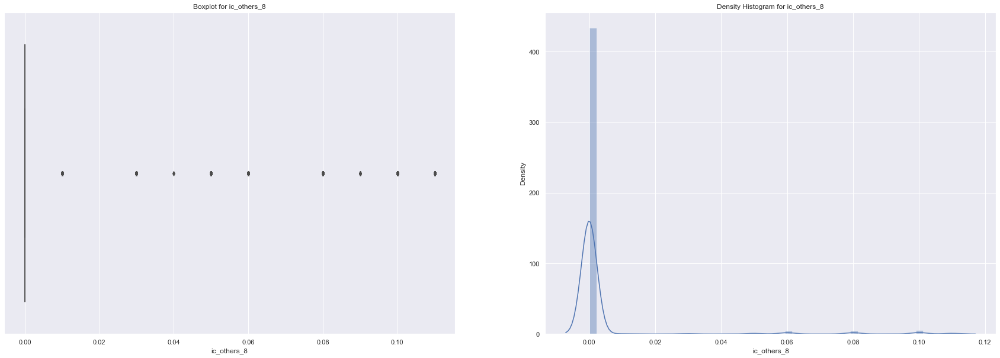

incoming calls_others_8
count    16342.000000
mean         0.003369
std          0.016529
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.110000
Name: ic_others_8, dtype: float64
******************************************************************************************


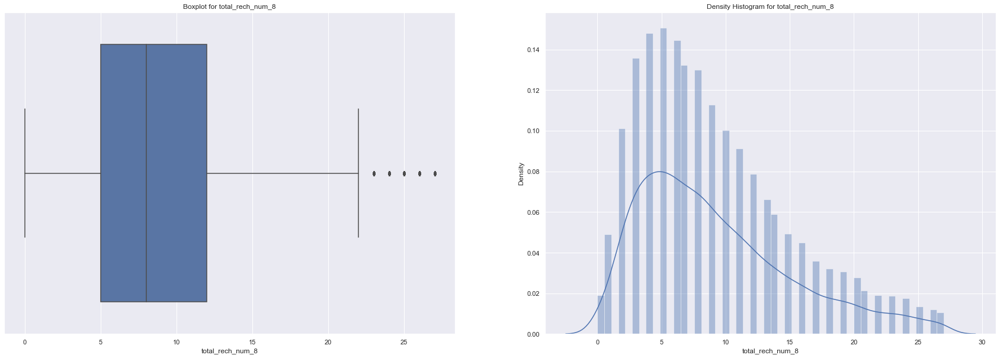

total_recharge_number_8
count    19774.000000
mean         9.138515
std          5.960590
min          0.000000
25%          5.000000
50%          8.000000
75%         12.000000
max         27.000000
Name: total_rech_num_8, dtype: float64
******************************************************************************************


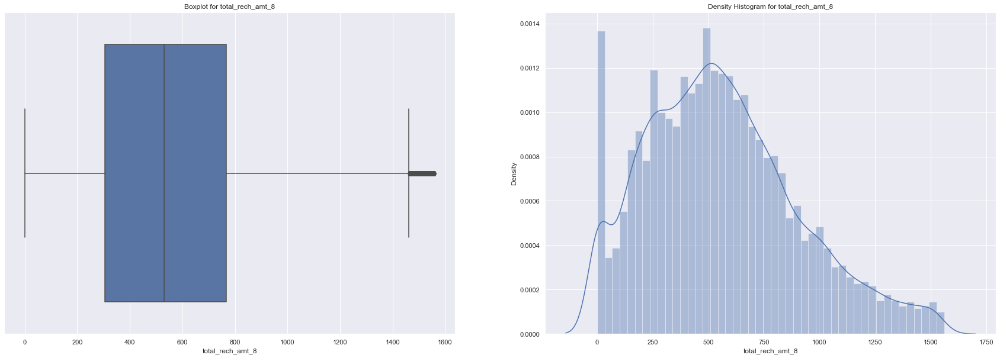

total_recharge_amount in local currency_8
count    20060.000000
mean       564.082602
std        341.967552
min          0.000000
25%        305.750000
50%        530.000000
75%        768.000000
max       1560.000000
Name: total_rech_amt_8, dtype: float64
******************************************************************************************


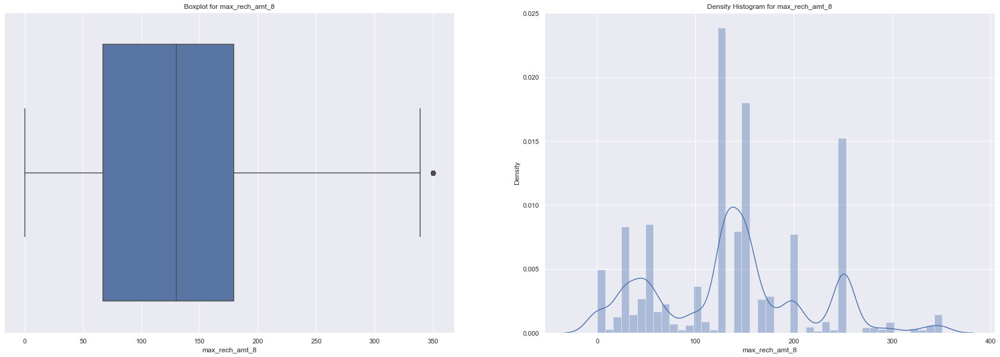

maximum_recharge_amount in local currency_8
count    19582.000000
mean       138.136350
std         78.681151
min          0.000000
25%         67.000000
50%        130.000000
75%        179.000000
max        351.000000
Name: max_rech_amt_8, dtype: float64
******************************************************************************************


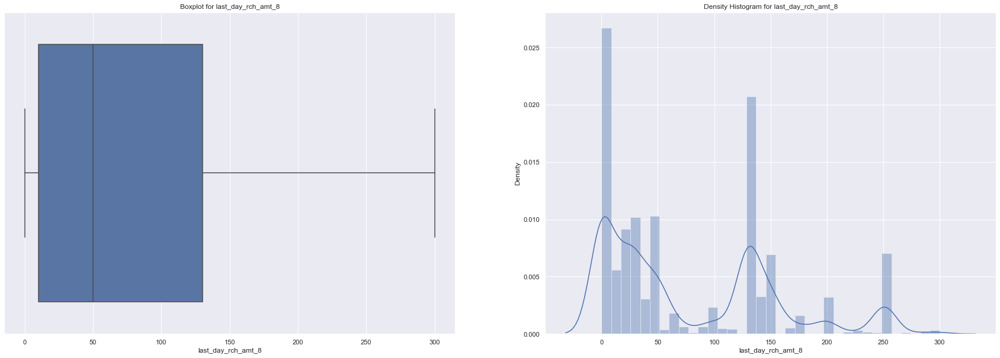

last_day_rch_amount in local currency_8
count    20144.000000
mean        78.714654
std         76.835394
min          0.000000
25%         10.000000
50%         50.000000
75%        130.000000
max        300.000000
Name: last_day_rch_amt_8, dtype: float64
******************************************************************************************


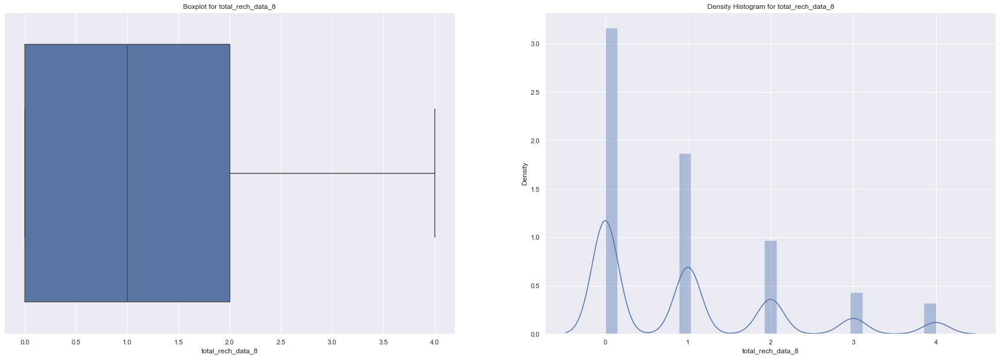

total_recharge_mobile internet_8
count    18359.000000
mean         0.944115
std          1.136665
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          4.000000
Name: total_rech_data_8, dtype: float64
******************************************************************************************


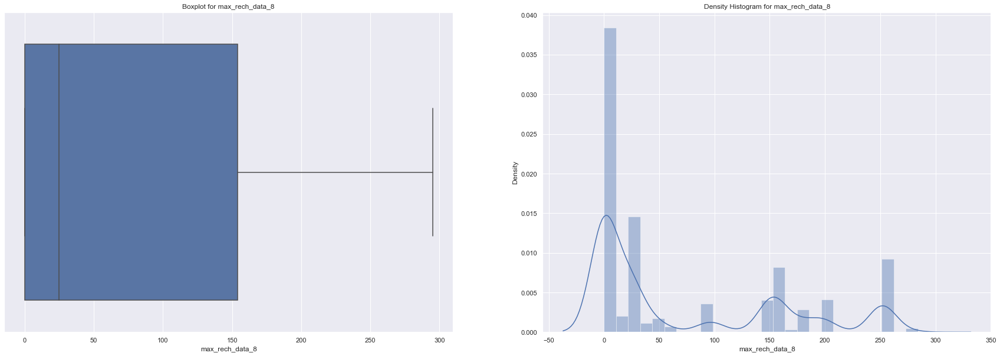

maximum_recharge_mobile internet_8
count    20644.000000
mean        72.359911
std         90.098314
min          0.000000
25%          0.000000
50%         25.000000
75%        154.000000
max        295.000000
Name: max_rech_data_8, dtype: float64
******************************************************************************************


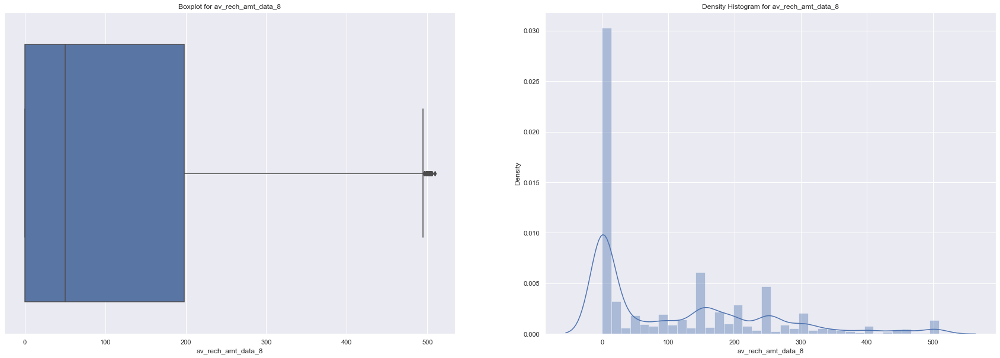

average_recharge_amount in local currency_mobile internet_8
count    20224.000000
mean       112.587427
std        133.443504
min          0.000000
25%          0.000000
50%         50.000000
75%        198.000000
max        509.000000
Name: av_rech_amt_data_8, dtype: float64
******************************************************************************************


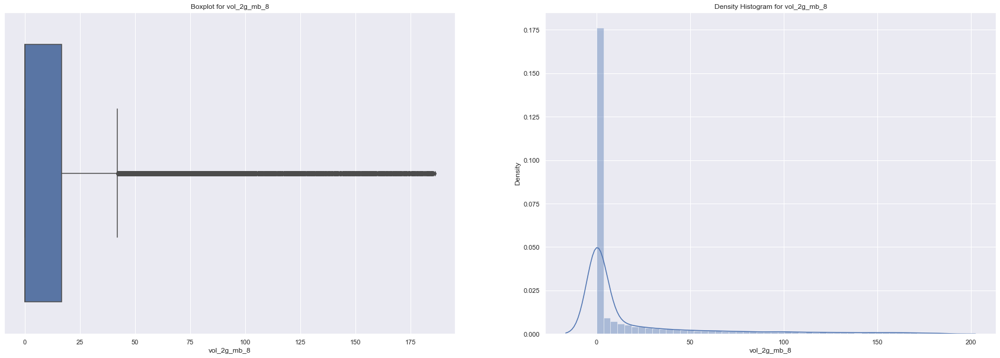

mobile internet usage volume in mb_g network_mb_8
count    17520.000000
mean        19.120584
std         38.696752
min          0.000000
25%          0.000000
50%          0.000000
75%         16.762500
max        185.980000
Name: vol_2g_mb_8, dtype: float64
******************************************************************************************


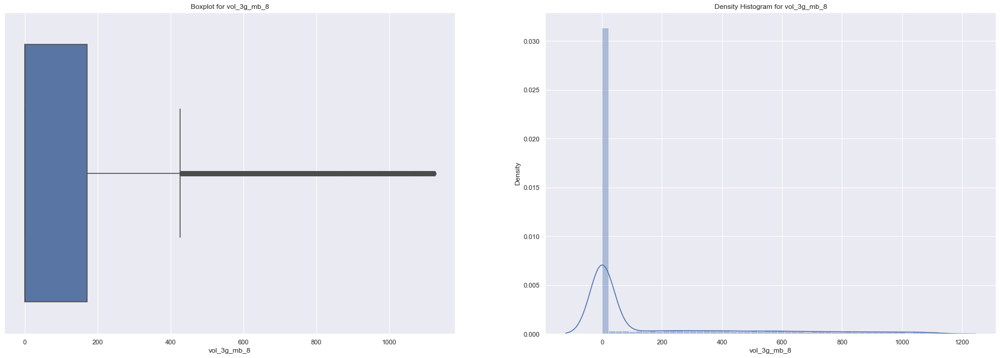

mobile internet usage volume in mb_g network_mb_8
count    18713.000000
mean       152.400234
std        288.024053
min          0.000000
25%          0.000000
50%          0.000000
75%        170.760000
max       1123.890000
Name: vol_3g_mb_8, dtype: float64
******************************************************************************************


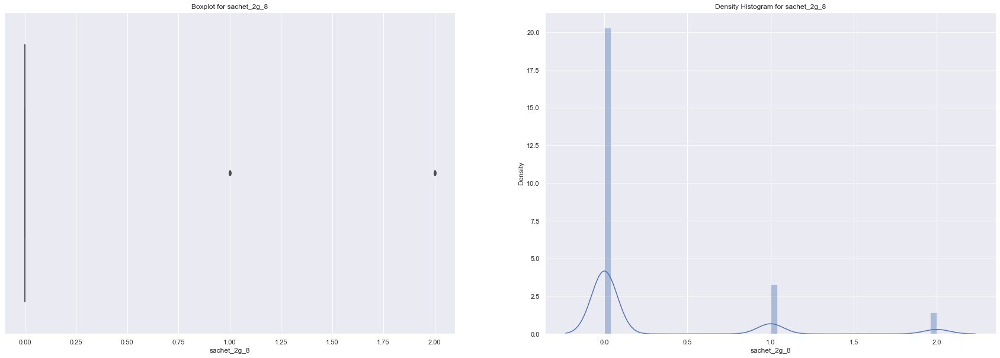

service schemes with validity smaller than a month_g network_8
count    17574.000000
mean         0.245590
std          0.548041
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: sachet_2g_8, dtype: float64
******************************************************************************************


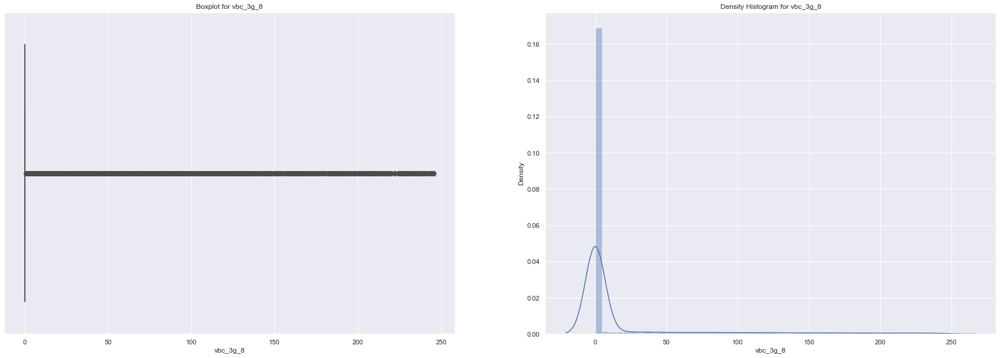

volume based cost  when no specific scheme is not purchased and paid as per usage_g network_8
count    17147.000000
mean        17.655547
std         48.461141
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        246.090000
Name: vbc_3g_8, dtype: float64
******************************************************************************************


In [39]:
for col in num_cols:
    if col[-1] == '8':
        univariate(remove_outliers_series(churn_filtered[col]))

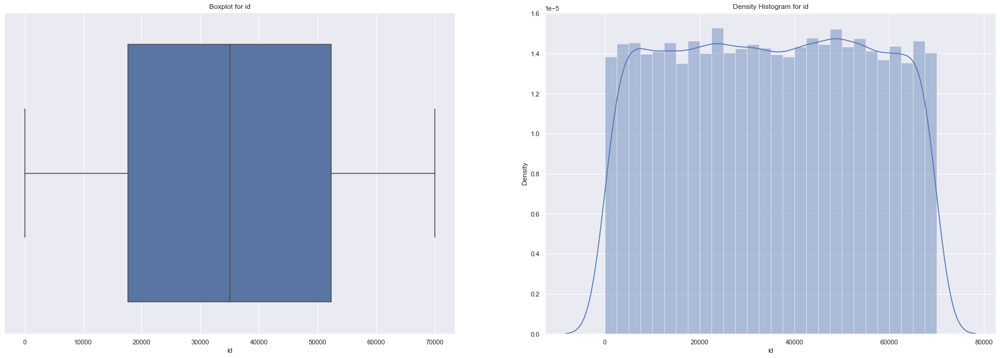

id
count    21001.000000
mean     35010.019475
std      20153.269989
min          4.000000
25%      17636.000000
50%      35014.000000
75%      52348.000000
max      69994.000000
Name: id, dtype: float64
******************************************************************************************


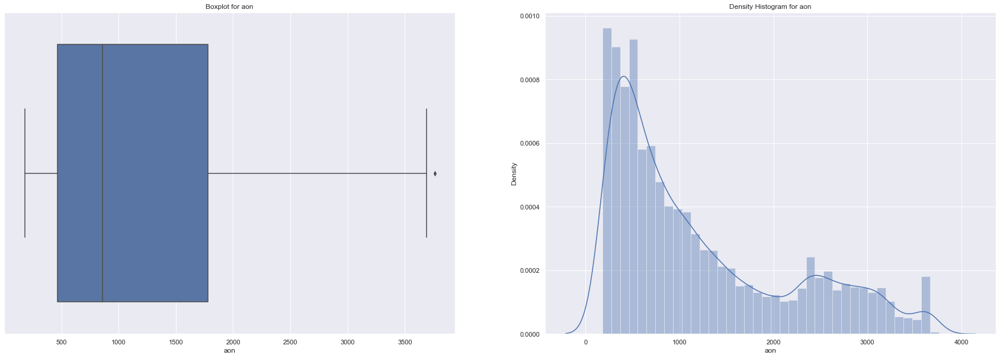

age on network  number of days the customer is using the operator t network
count    20971.000000
mean      1212.238949
std        950.165325
min        180.000000
25%        464.500000
50%        858.000000
75%       1778.000000
max       3760.000000
Name: aon, dtype: float64
******************************************************************************************


In [40]:
for col in num_cols:
    if col[-1] != '6' and col[-1] != '7' and col[-1] != '8':
        univariate(remove_outliers_series(churn_filtered[col]))

In [41]:
print("Findings")
#Univariate Analysis on Continuous Variable:
for col in num_cols:
    print(col,"Mean = ",round(remove_outliers_series(churn_filtered[col]).mean(),2),"Median = ",remove_outliers_series(churn_filtered[col]).median())

Findings
id Mean =  35010.02 Median =  35014.0
arpu_6 Mean =  477.89 Median =  444.5595
arpu_7 Mean =  492.78 Median =  461.694
arpu_8 Mean =  481.55 Median =  453.601
onnet_mou_6 Mean =  120.06 Median =  57.65
onnet_mou_7 Mean =  126.94 Median =  59.65
onnet_mou_8 Mean =  118.03 Median =  54.58
offnet_mou_6 Mean =  260.85 Median =  182.79
offnet_mou_7 Mean =  276.64 Median =  191.24
offnet_mou_8 Mean =  263.85 Median =  181.5
roam_ic_mou_6 Mean =  15.43 Median =  0.0
roam_ic_mou_7 Mean =  12.23 Median =  0.0
roam_ic_mou_8 Mean =  12.54 Median =  0.0
roam_og_mou_6 Mean =  26.4 Median =  0.0
roam_og_mou_7 Mean =  19.65 Median =  0.0
roam_og_mou_8 Mean =  20.19 Median =  0.0
loc_og_t2t_mou_6 Mean =  35.12 Median =  17.41
loc_og_t2t_mou_7 Mean =  36.55 Median =  18.88
loc_og_t2t_mou_8 Mean =  35.44 Median =  17.59
loc_og_t2m_mou_6 Mean =  105.21 Median =  61.78
loc_og_t2m_mou_7 Mean =  108.58 Median =  66.02000000000001
loc_og_t2m_mou_8 Mean =  108.86 Median =  63.78
loc_og_t2f_mou_6 Mean

### Bivariate Analysis

In [42]:
def default_percentage(df,col,col2):
    return df[df[col2] == True][col].value_counts()/df[col].value_counts()*100

In [43]:
def bivariate(var1, var2):
    if data_type(var1) == 'numerical':
        newdf = pd.DataFrame(var2)
        newdf[var2.name] = var2
        newdf[var1.name] = pd.cut(var1, 20)
        plt.figure(figsize=(20,4))
        graph = sns.barplot(y=default_percentage(newdf,var1.name,var2.name).values,x=default_percentage(newdf,var1.name,var2.name).index,orient="v")#Bar Plot
        graph.axhline(var2.mean()*100)
        plt.title("Barplot for percentage of Churn for "+var1.name)
        plt.ylabel("Churn Percent %")
        plt.xlabel(var1.name)
        plt.xticks(rotation=90)
        plt.show()
        print(eloborate(var1.name))
        print()
        print("*****************************************************************************************")
    elif data_type(var1) == 'categorical':
        plt.figure(figsize=(10,4))
        graph = sns.barplot(y=default_percentage(churn_filtered,var1.name,var2.name).values,x=default_percentage(churn_filtered,var1.name,var2.name).index,orient="v")
        graph.axhline(var2.mean()*100)
        plt.title("Barplot for percentage of Churn for "+var1.name)
        plt.xlabel(var1.name)
        plt.ylabel("Churn Percent %")
        plt.xticks(rotation=90)
        plt.show()
        print(eloborate(var1.name))
        print()
        print("*****************************************************************************************")

night_pck_user_6


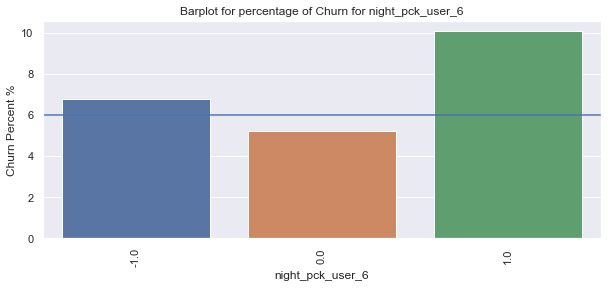

scheme to use during specific night hours only_prepaid service schemes called  packs_user_6

*****************************************************************************************
night_pck_user_7


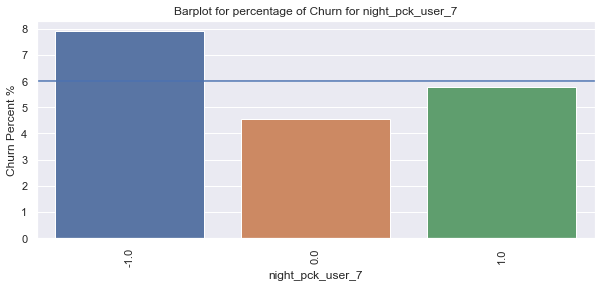

scheme to use during specific night hours only_prepaid service schemes called  packs_user_7

*****************************************************************************************
night_pck_user_8


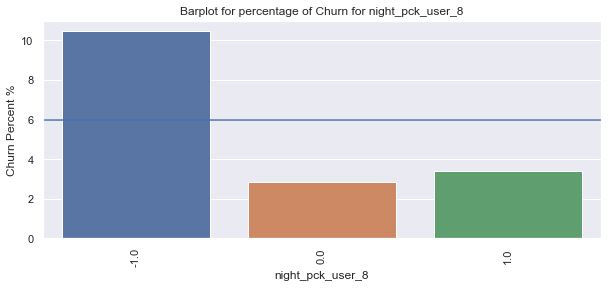

scheme to use during specific night hours only_prepaid service schemes called  packs_user_8

*****************************************************************************************
monthly_2g_6


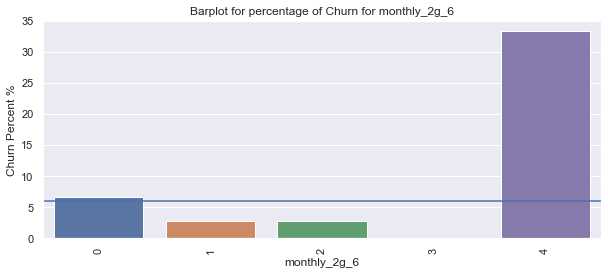

service schemes with validity equivalent to a month_g network_6

*****************************************************************************************
monthly_2g_7


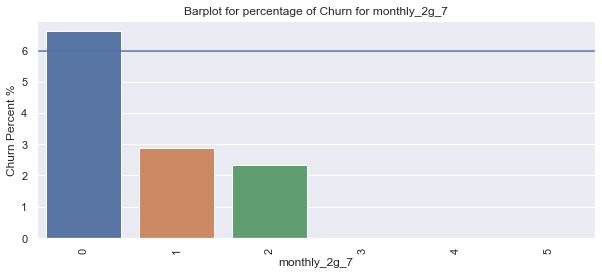

service schemes with validity equivalent to a month_g network_7

*****************************************************************************************
monthly_2g_8


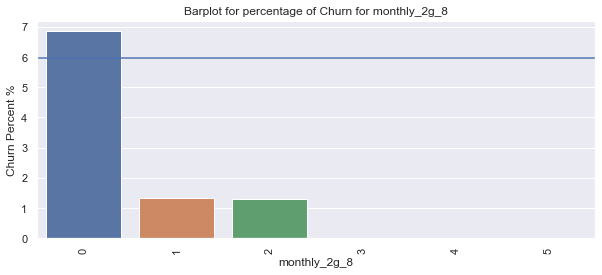

service schemes with validity equivalent to a month_g network_8

*****************************************************************************************
sachet_2g_6


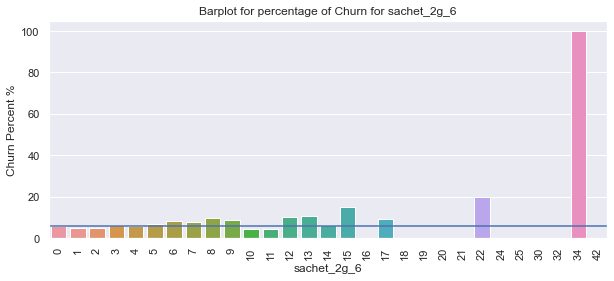

service schemes with validity smaller than a month_g network_6

*****************************************************************************************
monthly_3g_6


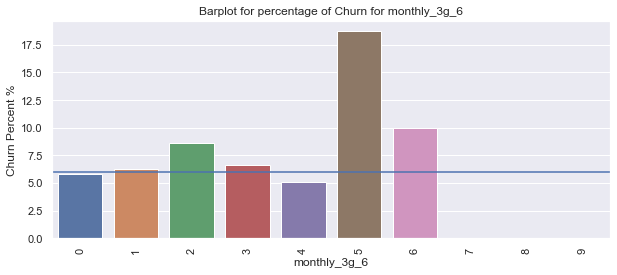

service schemes with validity equivalent to a month_g network_6

*****************************************************************************************
monthly_3g_7


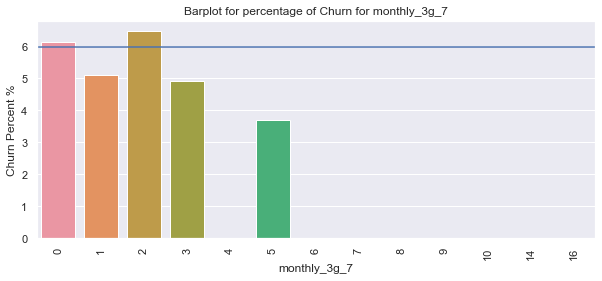

service schemes with validity equivalent to a month_g network_7

*****************************************************************************************
monthly_3g_8


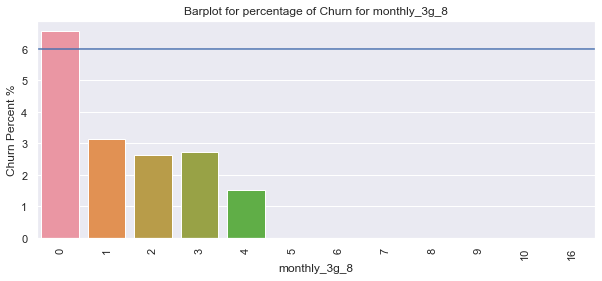

service schemes with validity equivalent to a month_g network_8

*****************************************************************************************
sachet_3g_6


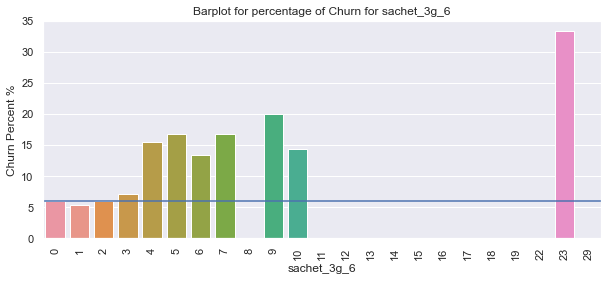

service schemes with validity smaller than a month_g network_6

*****************************************************************************************
sachet_3g_7


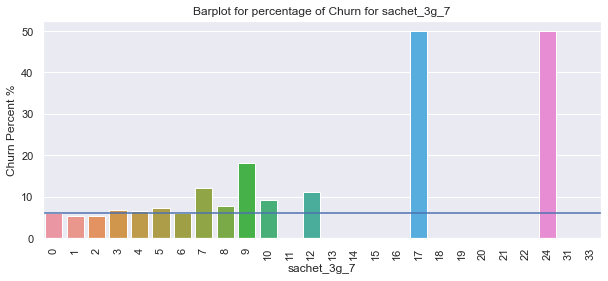

service schemes with validity smaller than a month_g network_7

*****************************************************************************************
sachet_3g_8


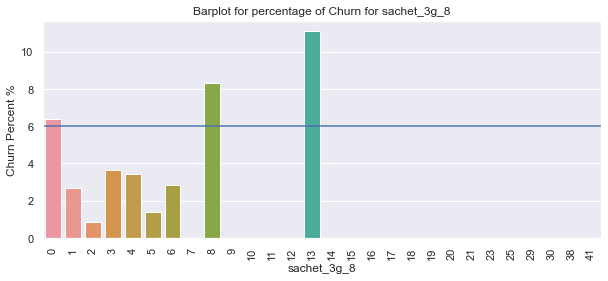

service schemes with validity smaller than a month_g network_8

*****************************************************************************************
fb_user_6


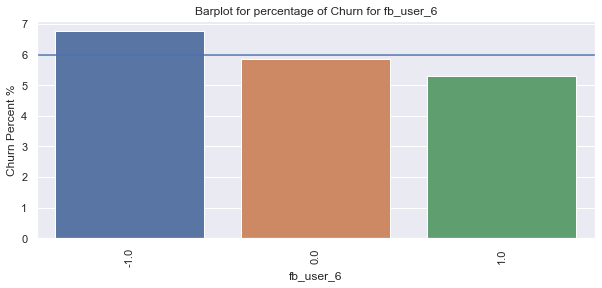

fb_user_6

*****************************************************************************************
fb_user_7


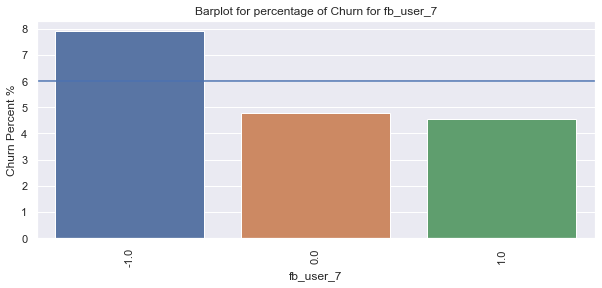

fb_user_7

*****************************************************************************************
fb_user_8


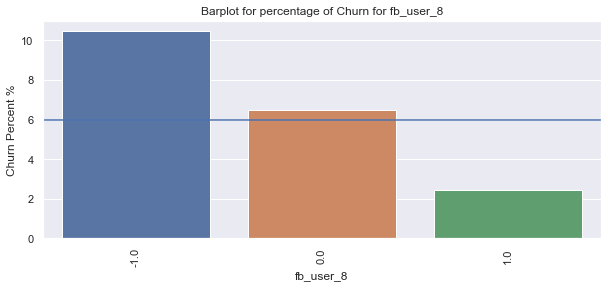

fb_user_8

*****************************************************************************************


In [44]:
for col in cat_cols:
    print(col)
    bivariate(churn_filtered[col],churn_filtered.churn_probability)

### Findings
Bivariate Analysis on Categorical columns for high value customers

* NIGHT_PCK_USER - churn rate increases from month 6 to 8 for night_pck_user with -1 value
* MONTHTLY_2g - churn rate increases from month 6 to 8 for monthly_2g with 0 value
* MONTHTLY_3g - churn rate increases from month 6 to 8 for monthly_3g with 0 value

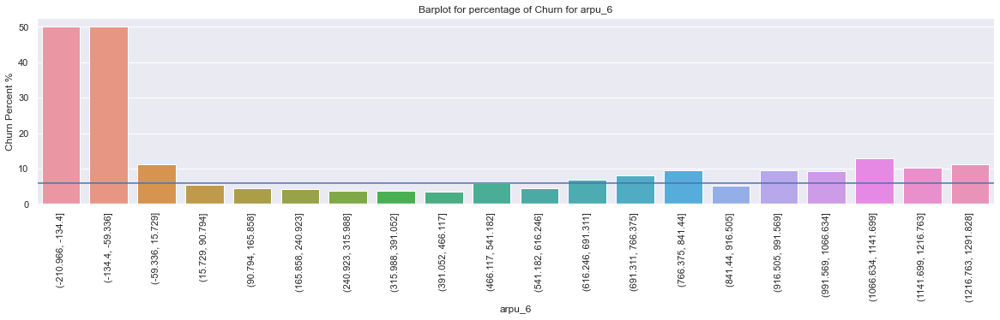

average revenue per user_6

*****************************************************************************************


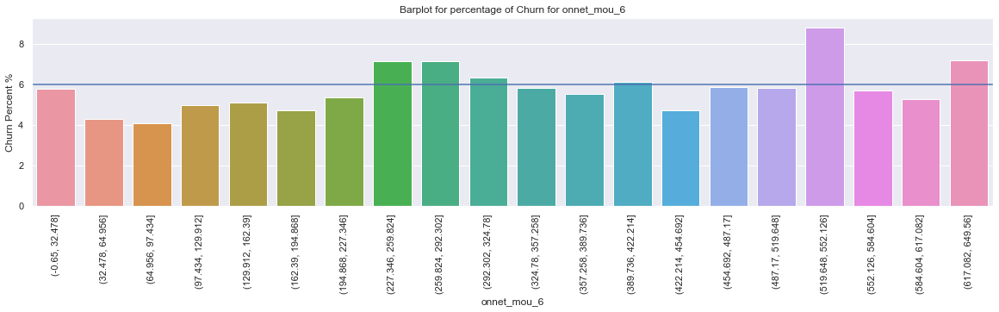

all kind of calls within the same operator network_minutes of usage  voice calls_6

*****************************************************************************************


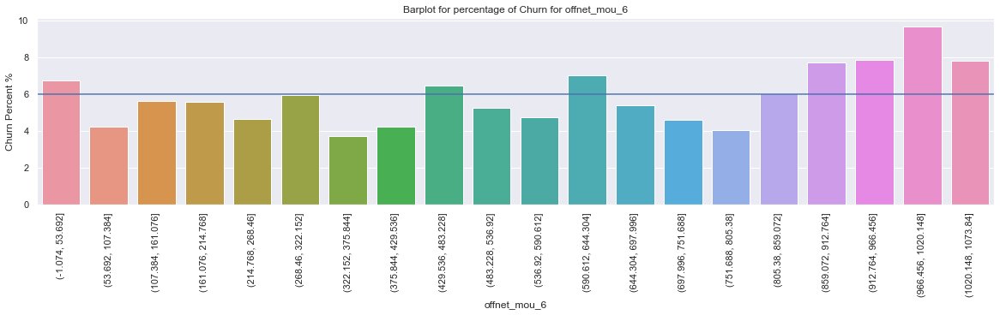

all kind of calls outside the operator t network_minutes of usage  voice calls_6

*****************************************************************************************


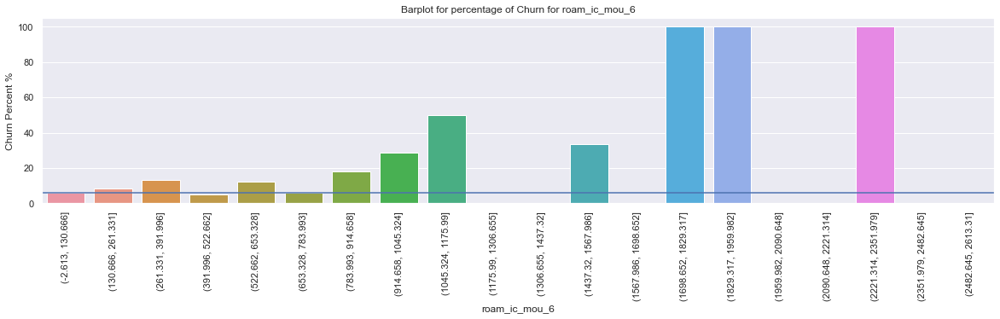

indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_6

*****************************************************************************************


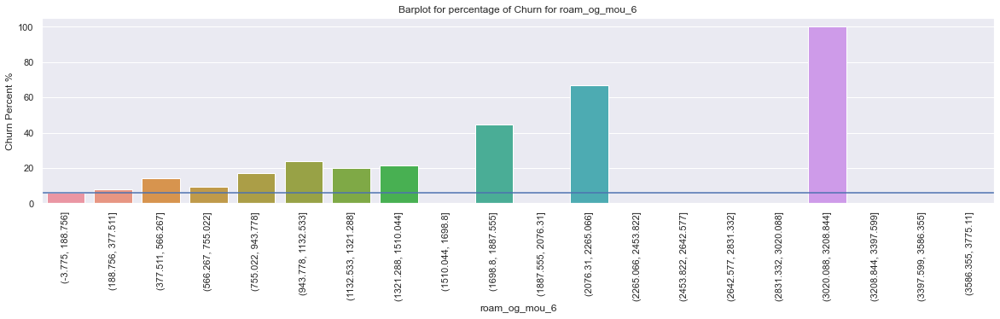

indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_6

*****************************************************************************************


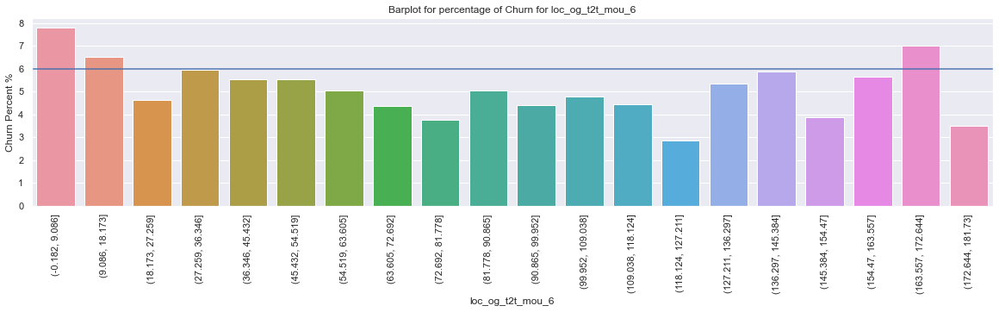

local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6

*****************************************************************************************


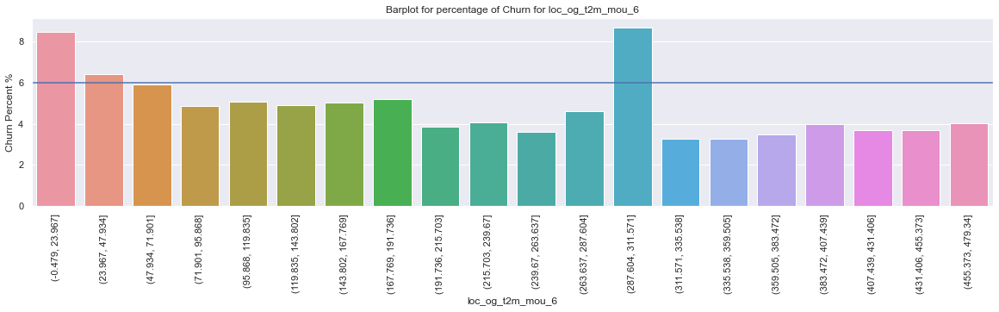

local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6

*****************************************************************************************


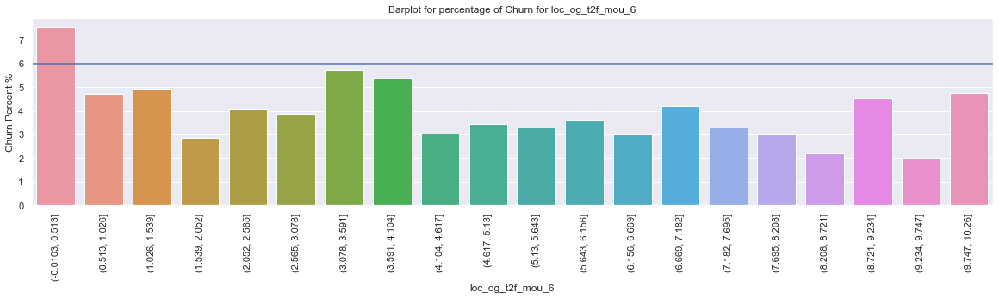

local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6

*****************************************************************************************


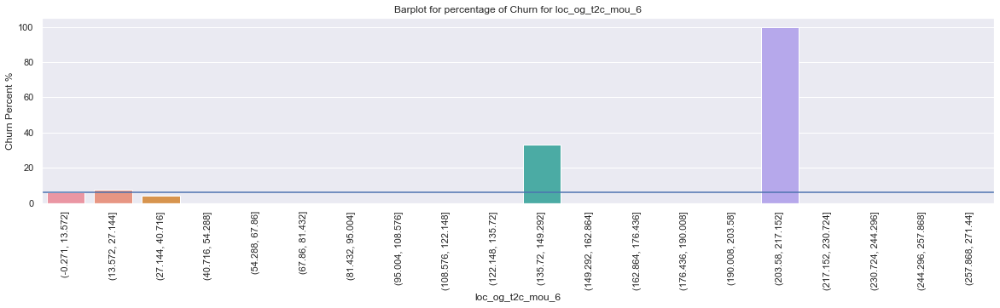

local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_6

*****************************************************************************************


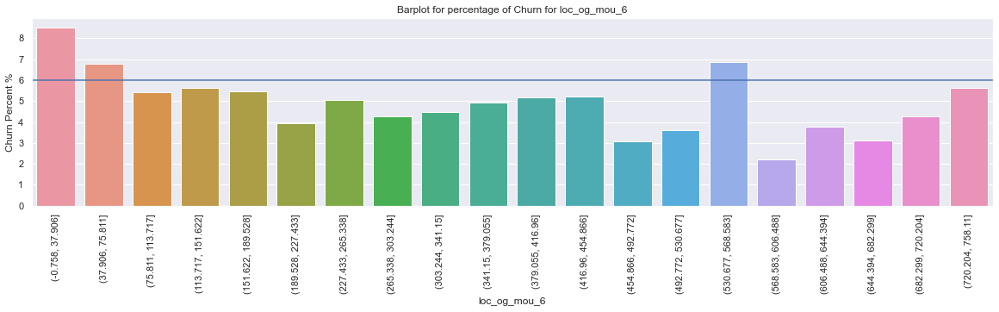

local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_6

*****************************************************************************************


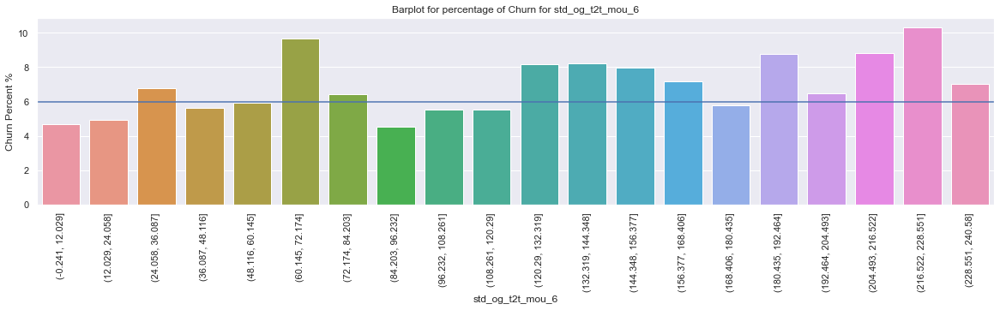

std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6

*****************************************************************************************


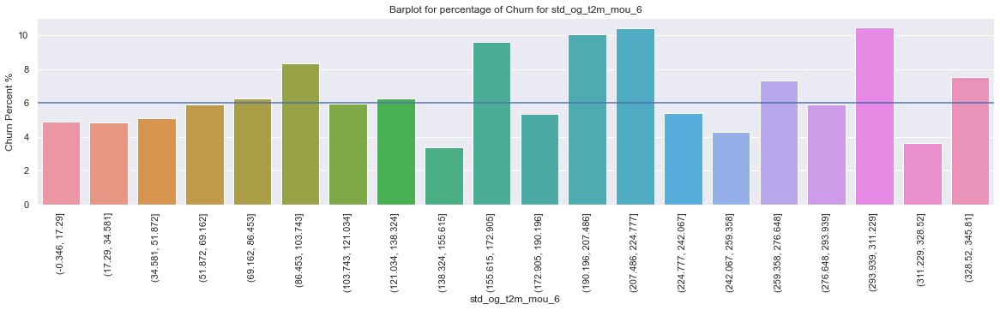

std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_6

*****************************************************************************************


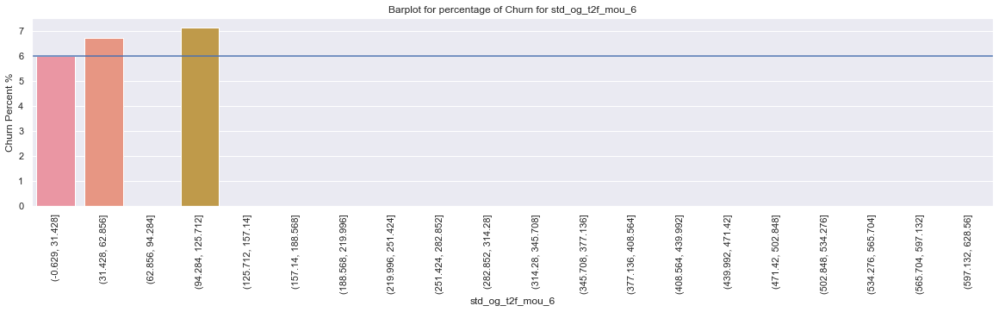

std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_6

*****************************************************************************************


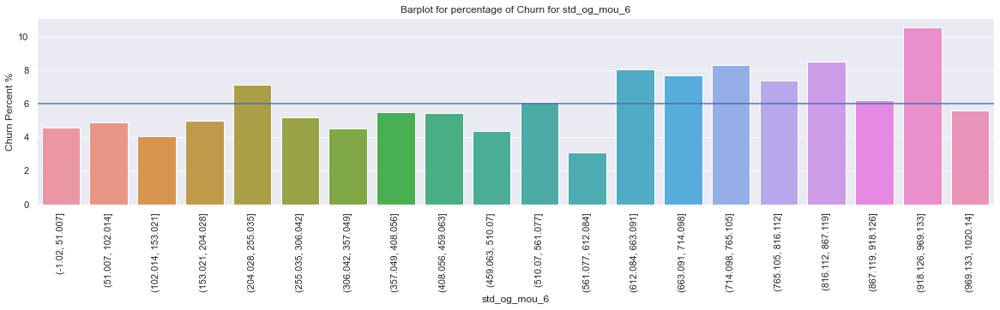

std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_6

*****************************************************************************************


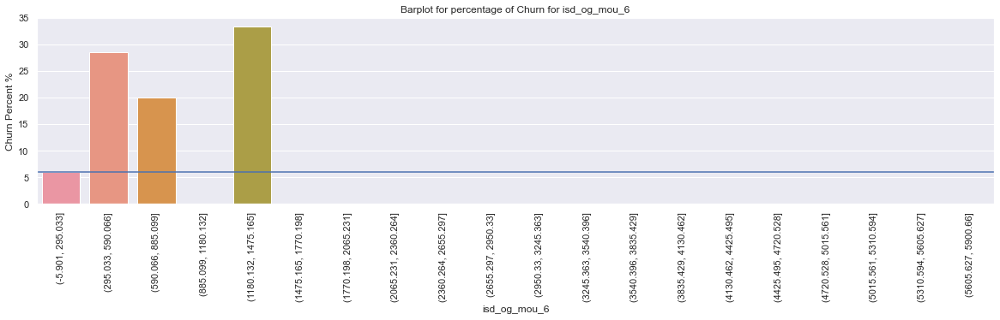

isd calls_outgoing calls_minutes of usage  voice calls_6

*****************************************************************************************


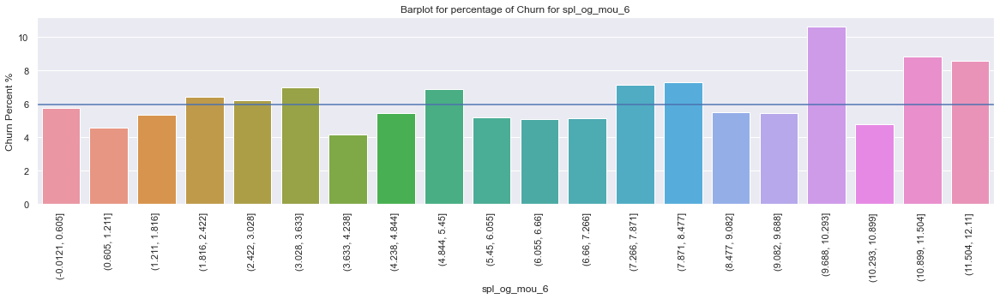

special calls_outgoing calls_minutes of usage  voice calls_6

*****************************************************************************************


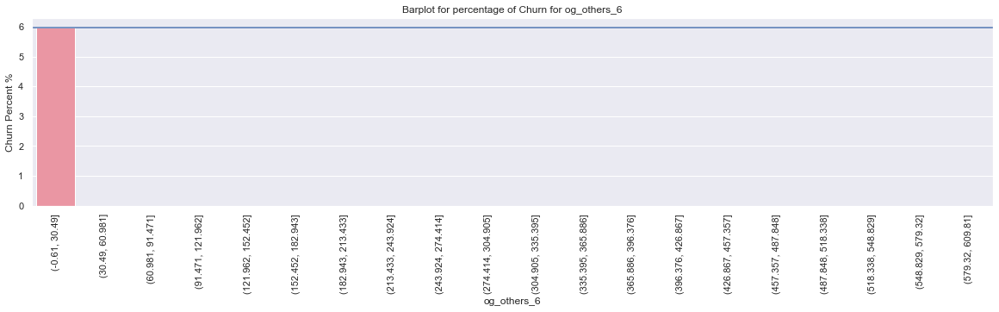

outgoing calls_others_6

*****************************************************************************************


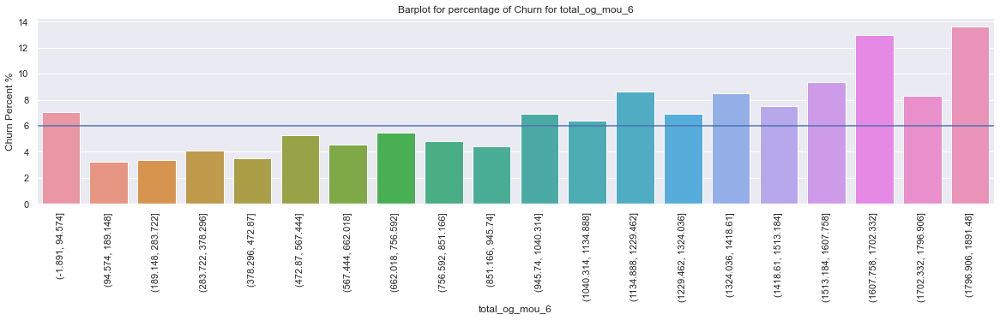

total_outgoing calls_minutes of usage  voice calls_6

*****************************************************************************************


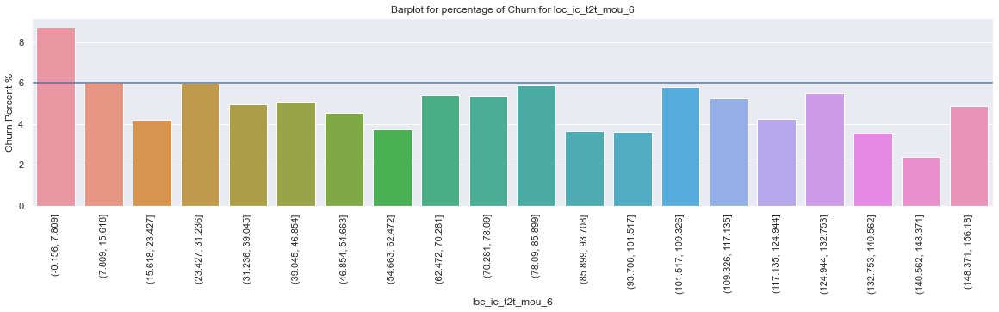

local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6

*****************************************************************************************


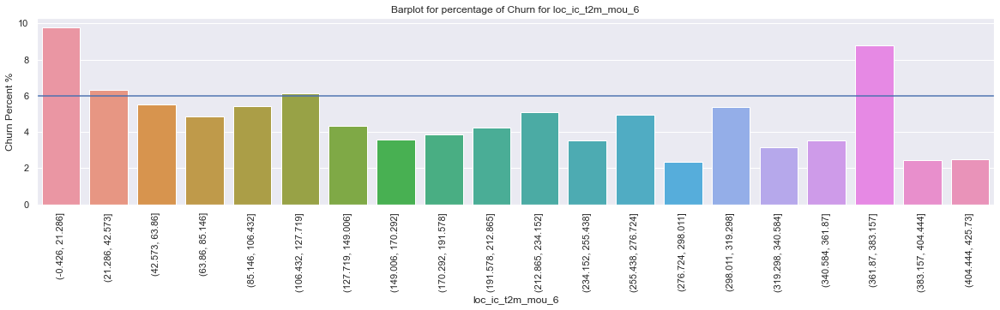

local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6

*****************************************************************************************


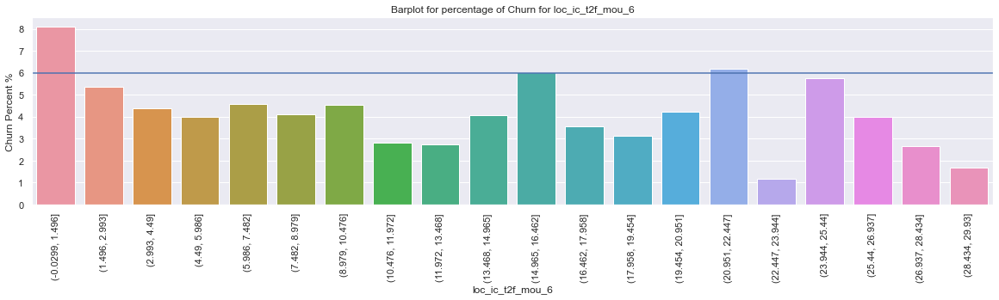

local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6

*****************************************************************************************


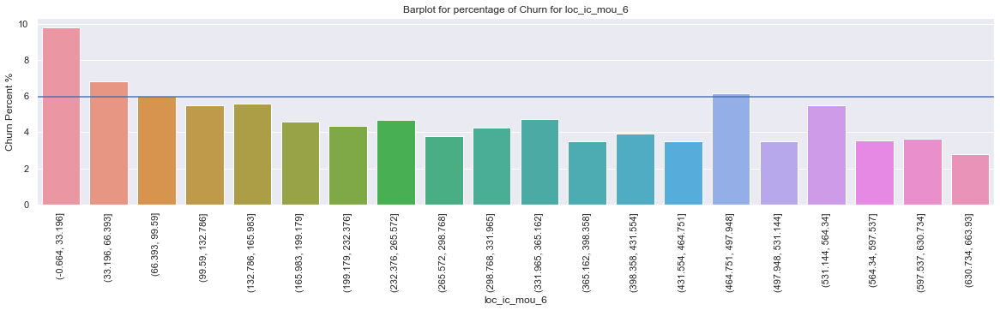

local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_6

*****************************************************************************************


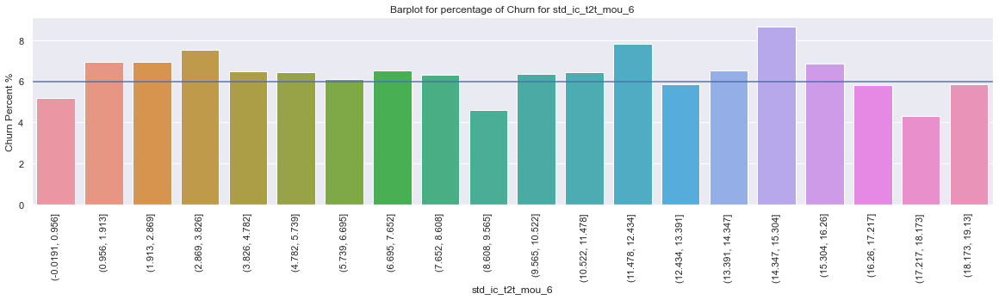

std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_6

*****************************************************************************************


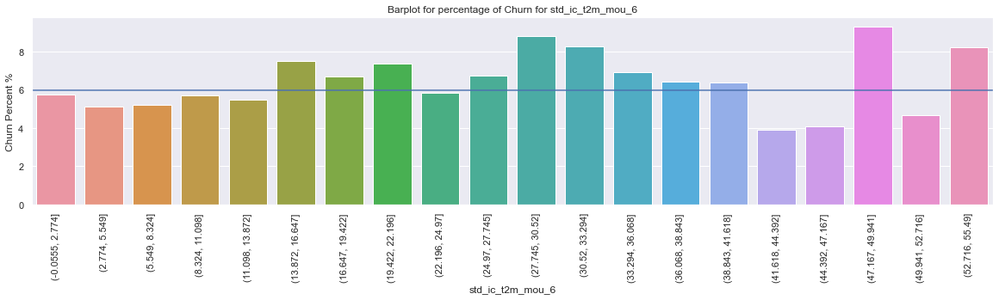

std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_6

*****************************************************************************************


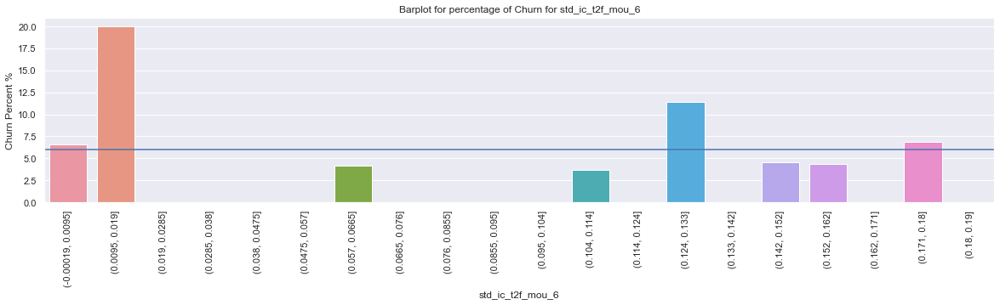

std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_6

*****************************************************************************************


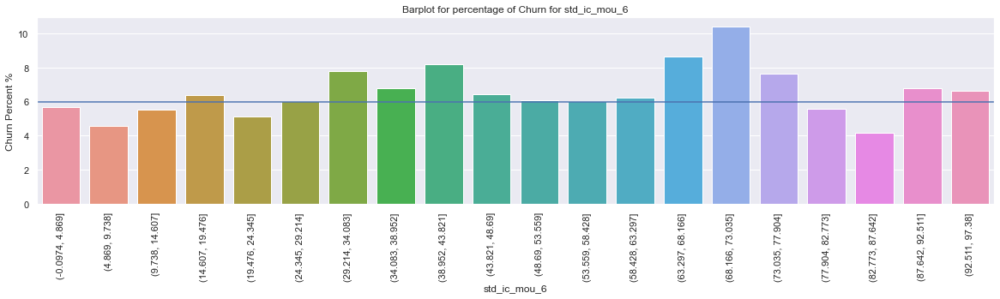

std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_6

*****************************************************************************************


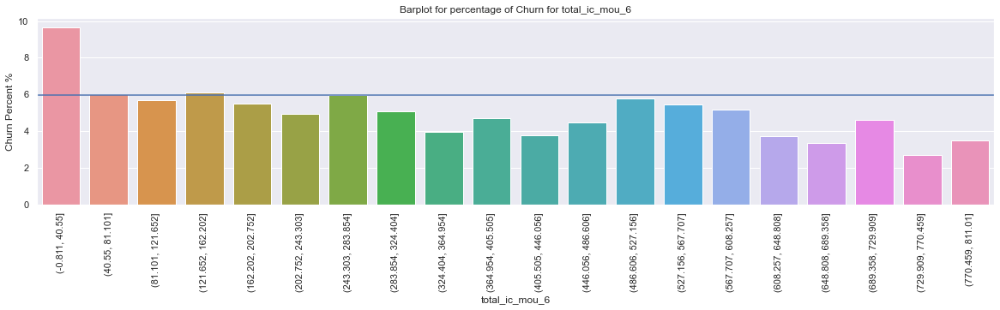

total_incoming calls_minutes of usage  voice calls_6

*****************************************************************************************


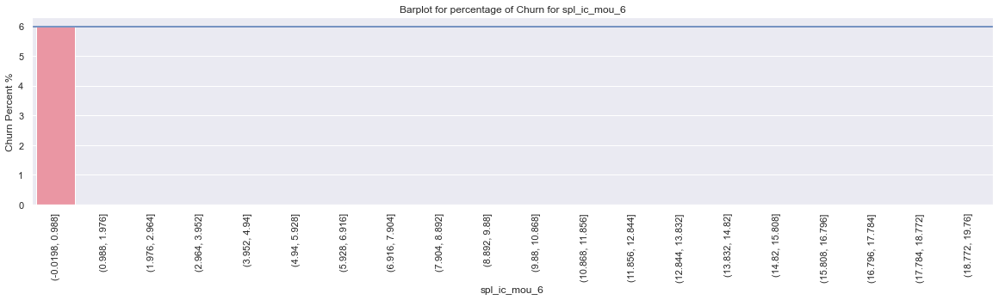

special calls_incoming calls_minutes of usage  voice calls_6

*****************************************************************************************


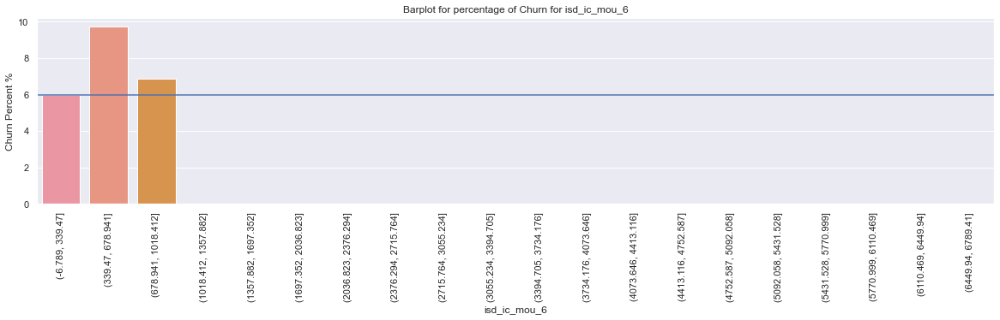

isd calls_incoming calls_minutes of usage  voice calls_6

*****************************************************************************************


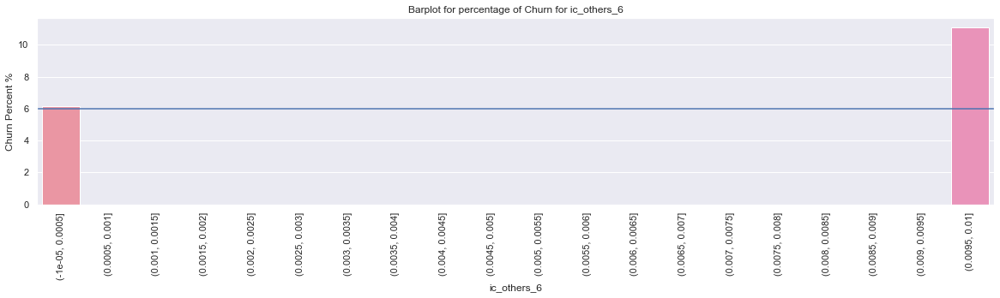

incoming calls_others_6

*****************************************************************************************


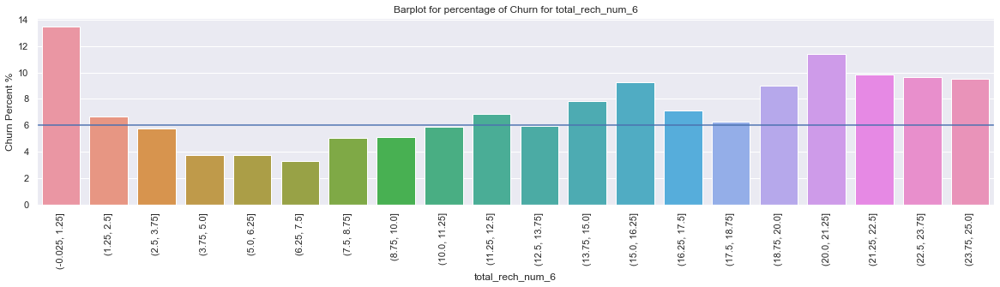

total_recharge_number_6

*****************************************************************************************


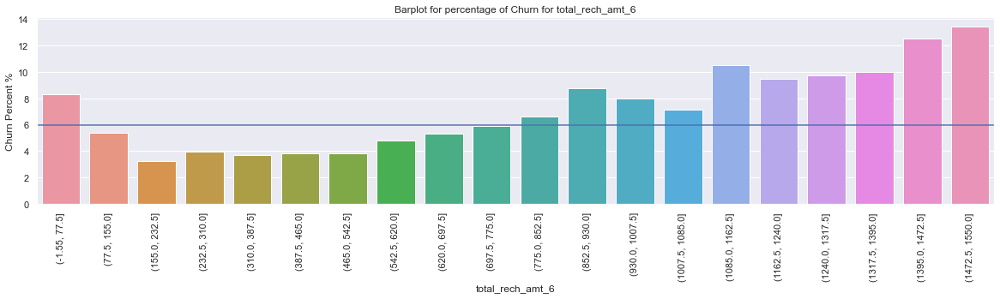

total_recharge_amount in local currency_6

*****************************************************************************************


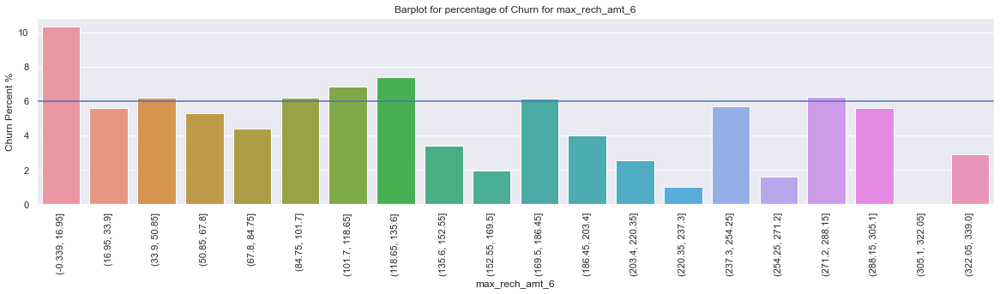

maximum_recharge_amount in local currency_6

*****************************************************************************************


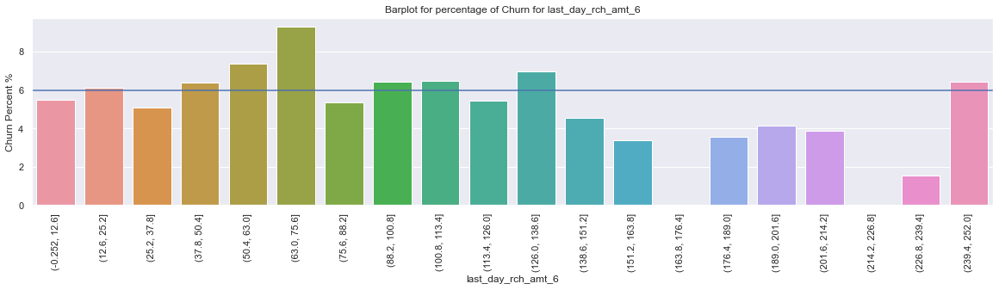

last_day_rch_amount in local currency_6

*****************************************************************************************


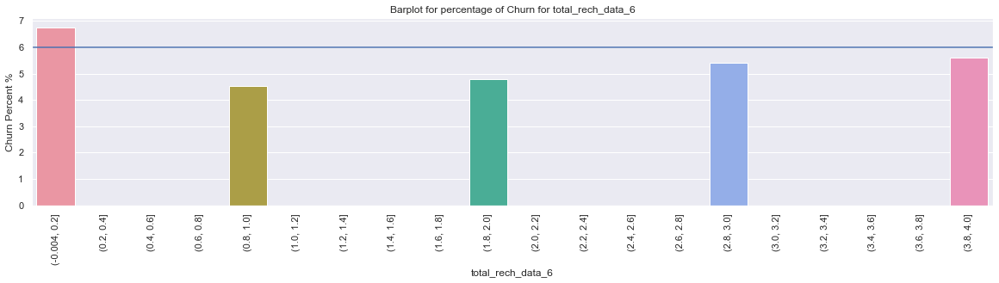

total_recharge_mobile internet_6

*****************************************************************************************


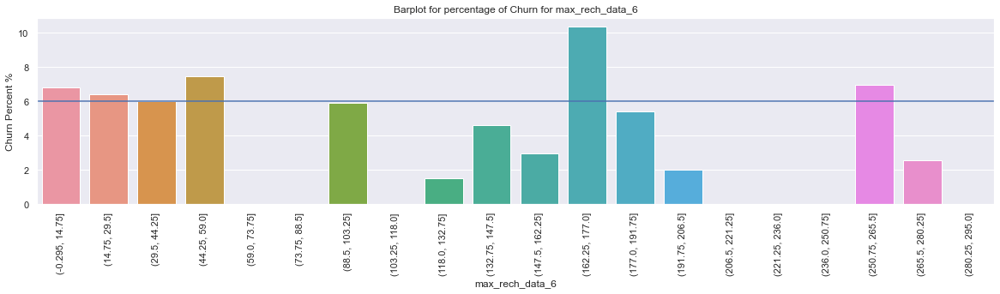

maximum_recharge_mobile internet_6

*****************************************************************************************


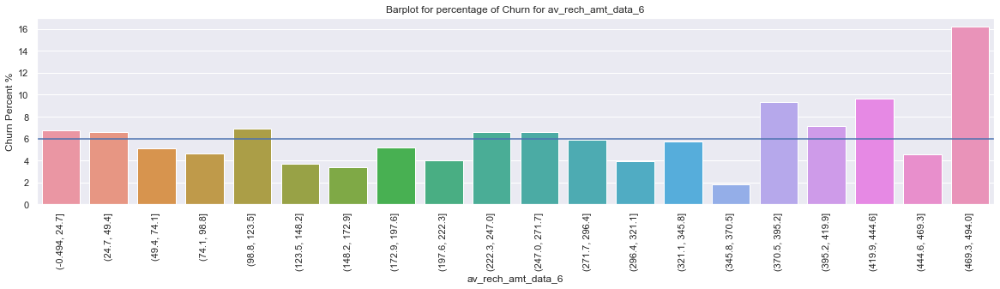

average_recharge_amount in local currency_mobile internet_6

*****************************************************************************************


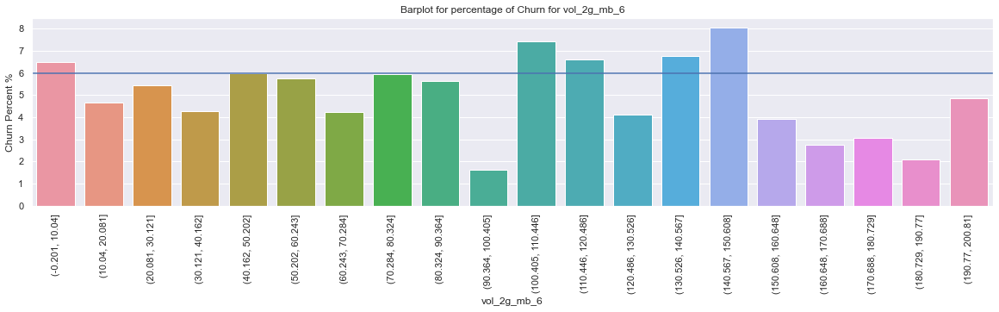

mobile internet usage volume in mb_g network_mb_6

*****************************************************************************************


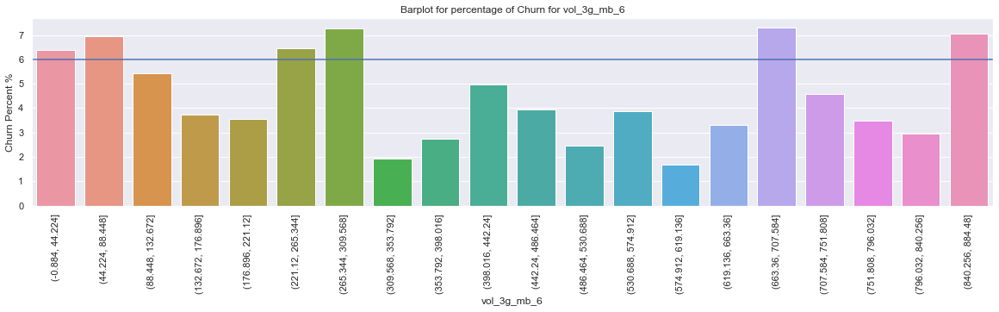

mobile internet usage volume in mb_g network_mb_6

*****************************************************************************************


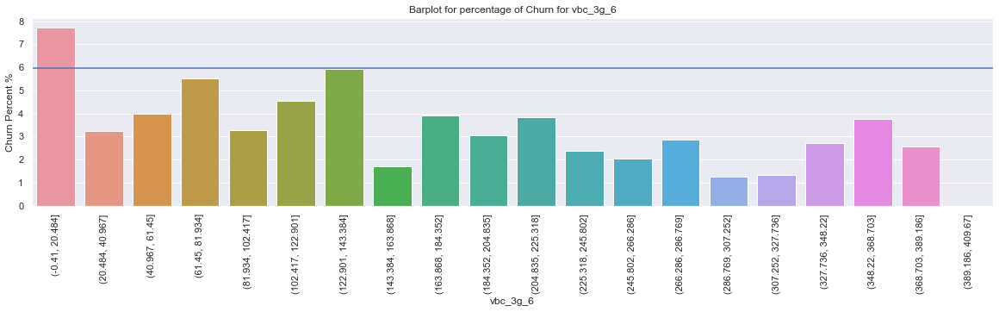

volume based cost  when no specific scheme is not purchased and paid as per usage_g network_6

*****************************************************************************************


In [45]:
for col in num_cols:
    if col[-1] == '6':
        bivariate(remove_outliers_series(churn_filtered[col]),churn_filtered.churn_probability)

### Findings
Bivariate Analysis on Categorical columns for high value customers

* arpu_6 - Values from -210 to 15 have higher churn rate than the average churn rate of 6%
* offnet_mou_6 - Values from -859 to 1073 have higher churn rate than the average churn rate of 6%
* roam_ic_mou_6 - As the values increases the churn rate increases
* loc_og_t2c_mou_6 - Values from 135 to 217 have higher churn rate than the average churn rate of 6%
* std_og_t2t_mou_6 - Values from 120 to 240 have higher churn rate than the average churn rate of 6%
* std_og_t2m_mou_6 - Values from 155 to 345 have higher churn rate than the average churn rate of 6%
* std_og_mou_6 - Values from 612 to 969 have higher churn rate than the average churn rate of 6%
* isd_og_mou_6 - Values from 295 to 1475 have higher churn rate than the average churn rate of 6%
* isd_og_mou_6 - Values from 295 to 1475 have higher churn rate than the average churn rate of 6%
* total_og_mou_6 - As the values increases the churn rate increases
* loc_ic_t2t_mou_6, loc_ic_t2m_mou_6, loc_ic_t2f_mou_6, loc_ic_mou_6, total_ic_mou_6 - As the values increases the churn rate decreases
* total_rech_num_6, total_rech_amt_6, av_rech_amt_data_6 - As the values increases the churn rate increases
* vbc_3g_6 - As the values increases the churn rate decreases

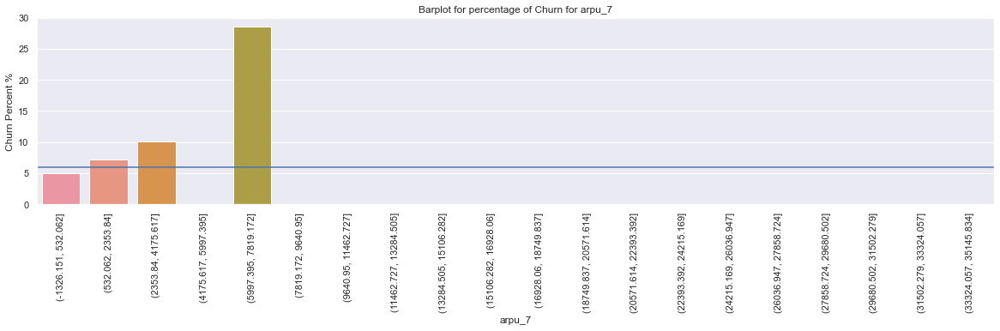

average revenue per user_7

*****************************************************************************************


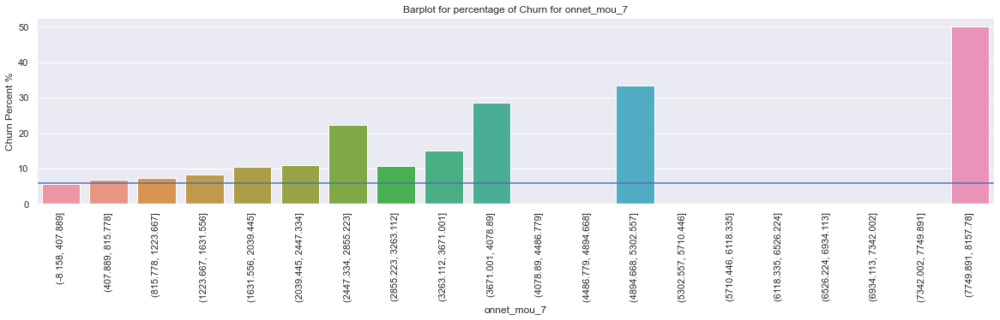

all kind of calls within the same operator network_minutes of usage  voice calls_7

*****************************************************************************************


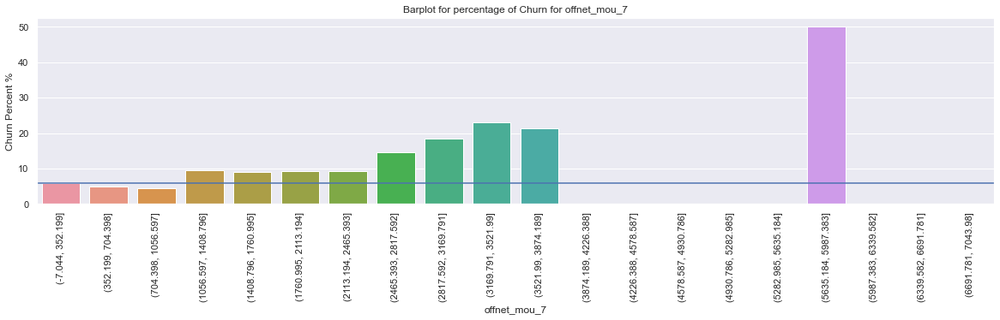

all kind of calls outside the operator t network_minutes of usage  voice calls_7

*****************************************************************************************


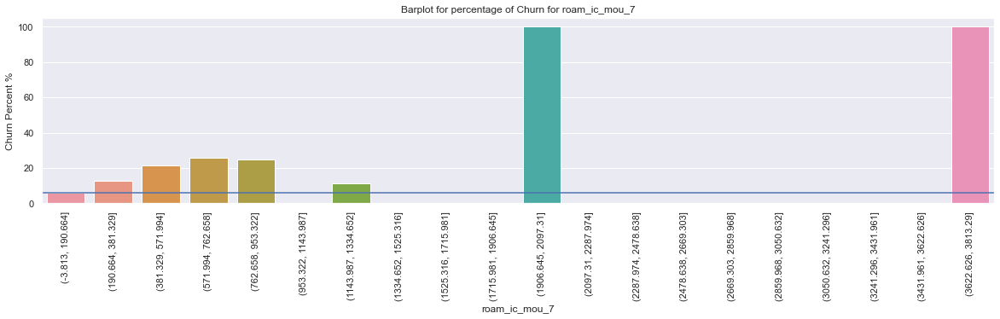

indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_7

*****************************************************************************************


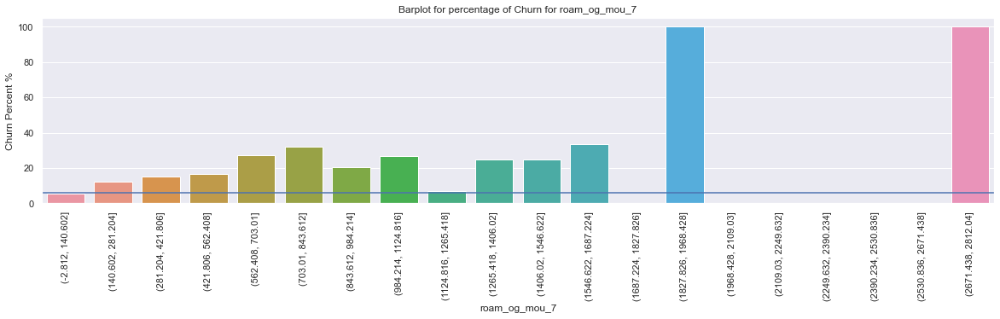

indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_7

*****************************************************************************************


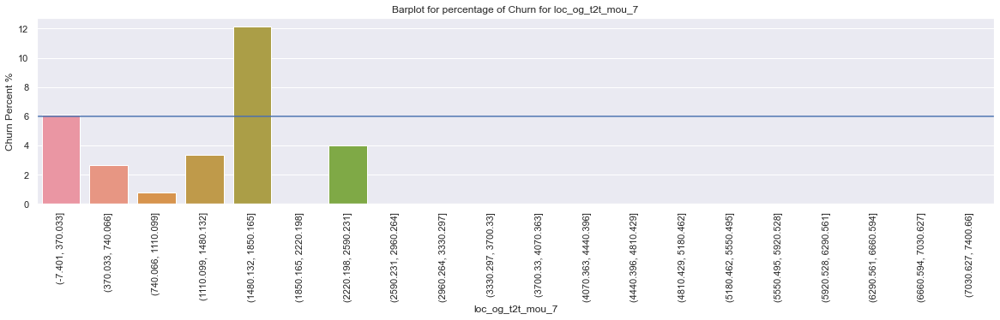

local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7

*****************************************************************************************


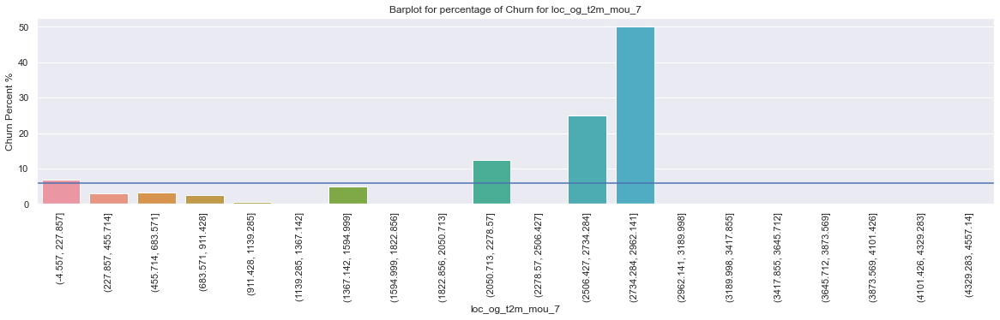

local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7

*****************************************************************************************


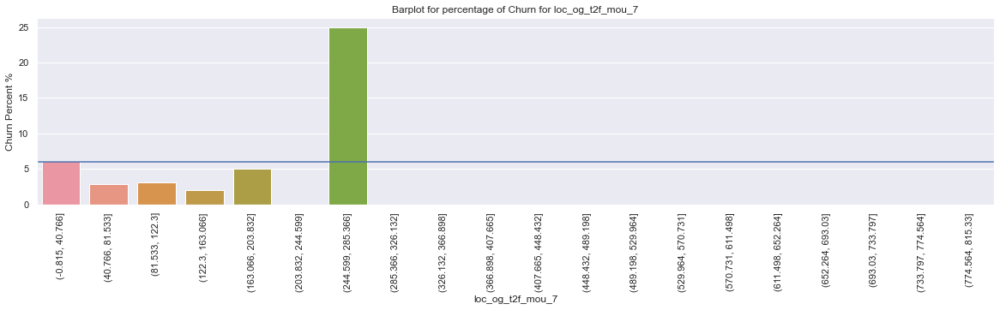

local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7

*****************************************************************************************


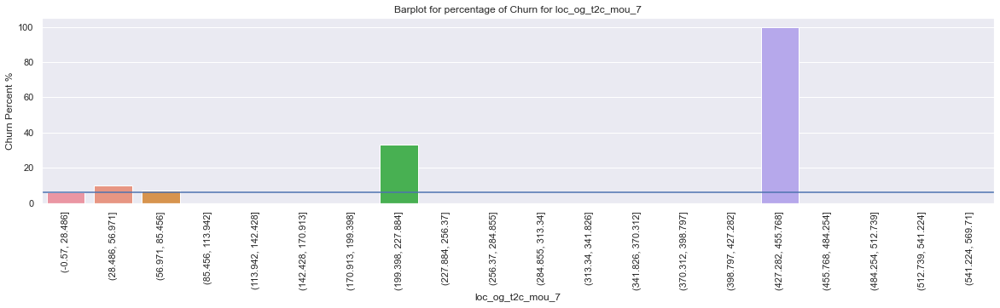

local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_7

*****************************************************************************************


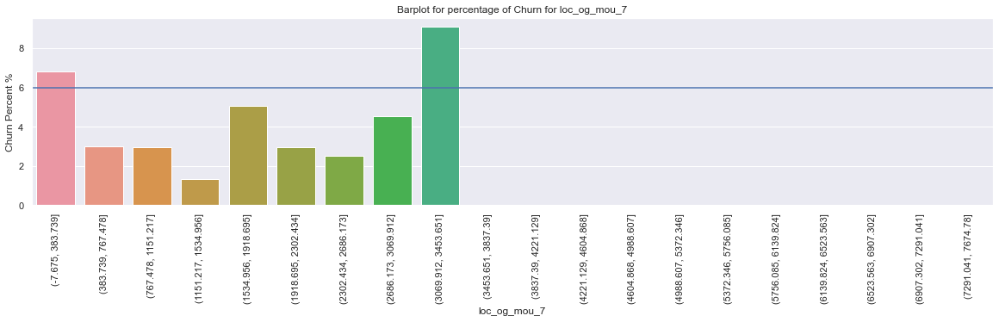

local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_7

*****************************************************************************************


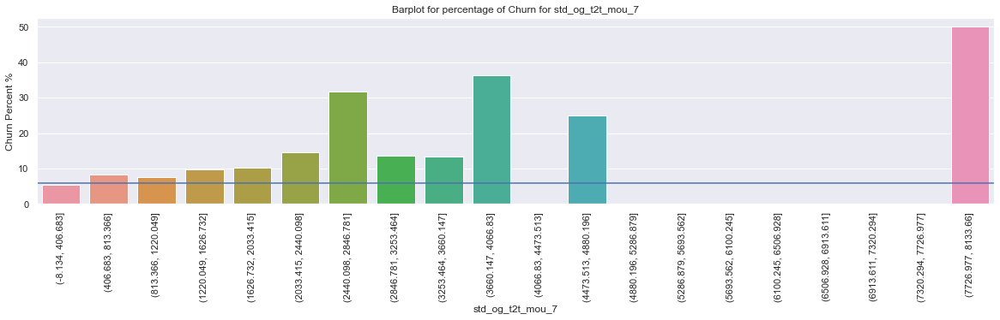

std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7

*****************************************************************************************


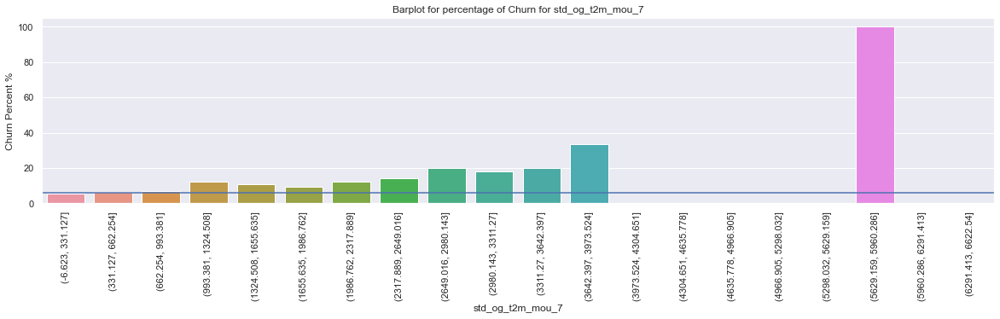

std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_7

*****************************************************************************************


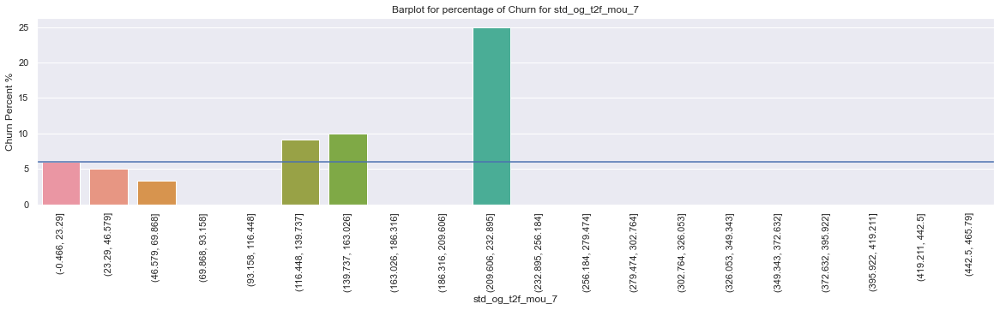

std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_7

*****************************************************************************************


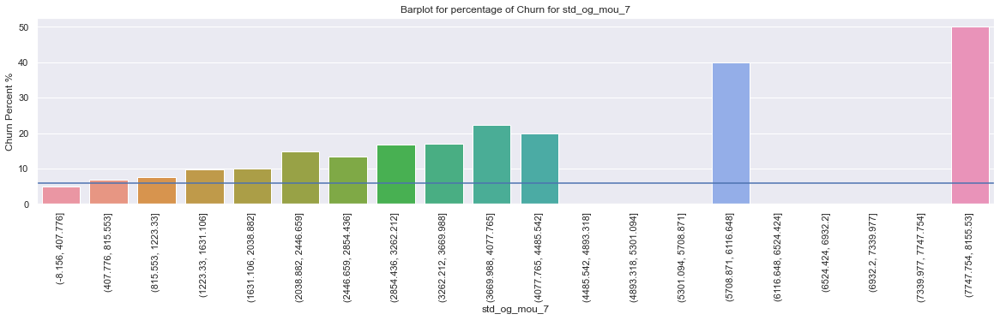

std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_7

*****************************************************************************************


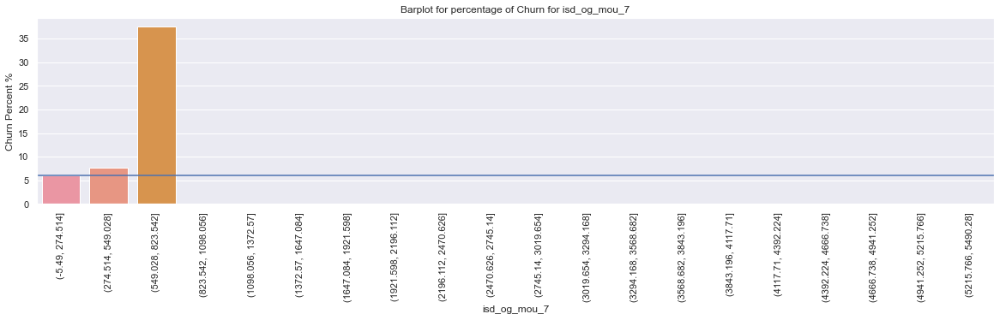

isd calls_outgoing calls_minutes of usage  voice calls_7

*****************************************************************************************


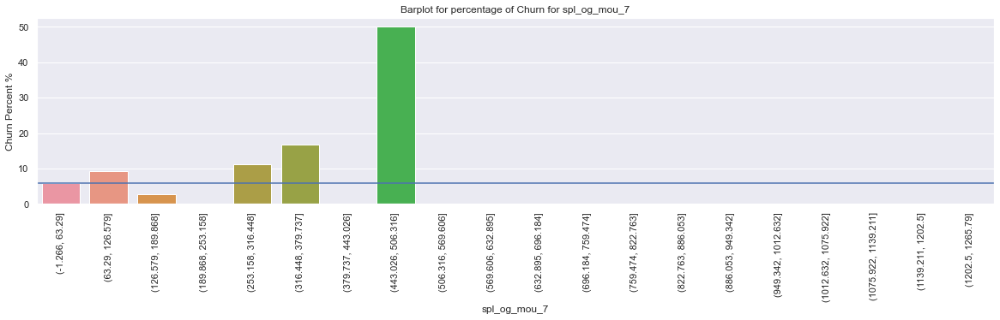

special calls_outgoing calls_minutes of usage  voice calls_7

*****************************************************************************************


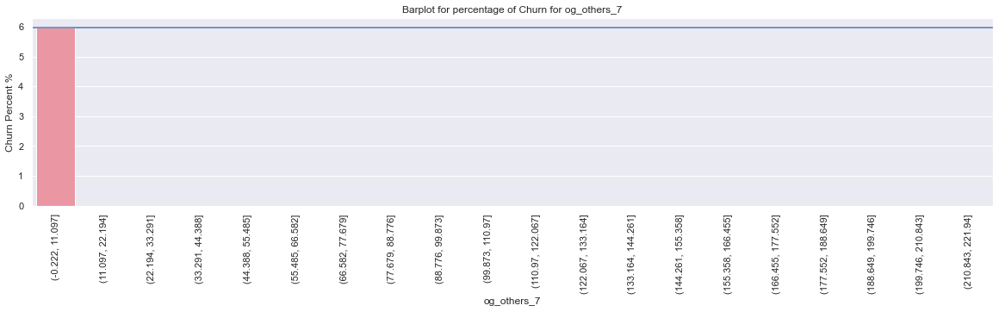

outgoing calls_others_7

*****************************************************************************************


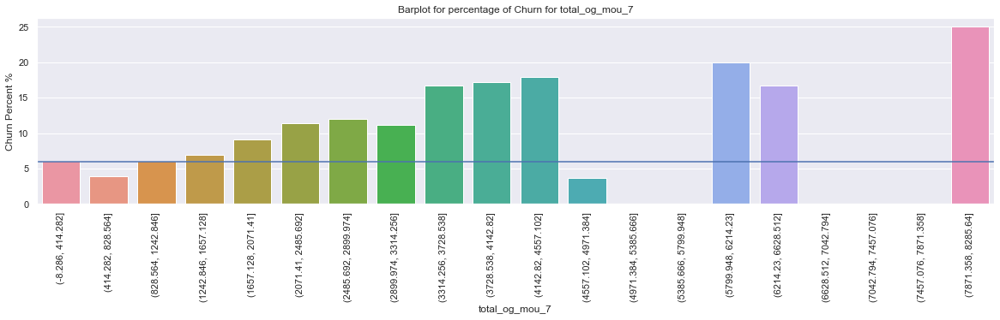

total_outgoing calls_minutes of usage  voice calls_7

*****************************************************************************************


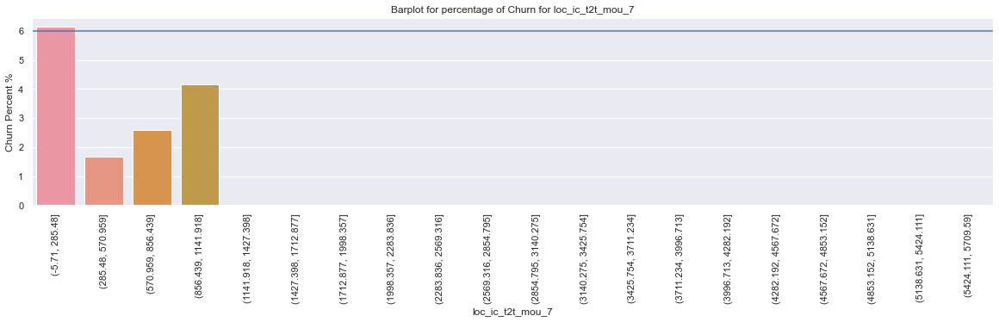

local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7

*****************************************************************************************


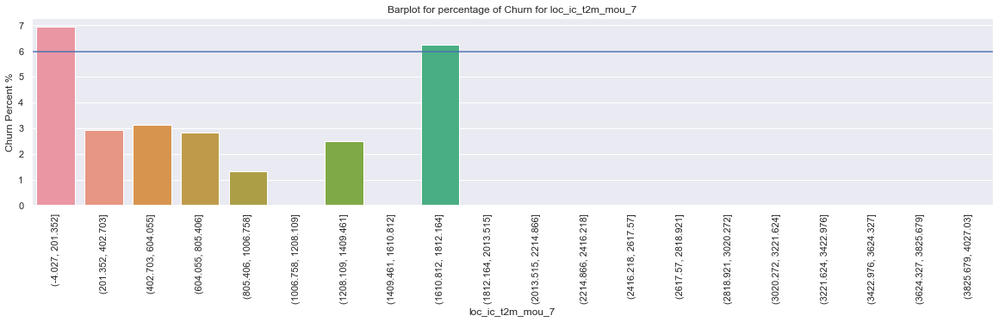

local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7

*****************************************************************************************


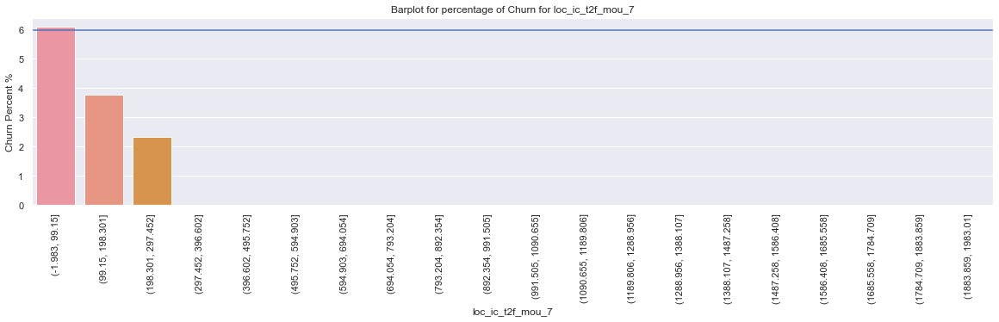

local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7

*****************************************************************************************


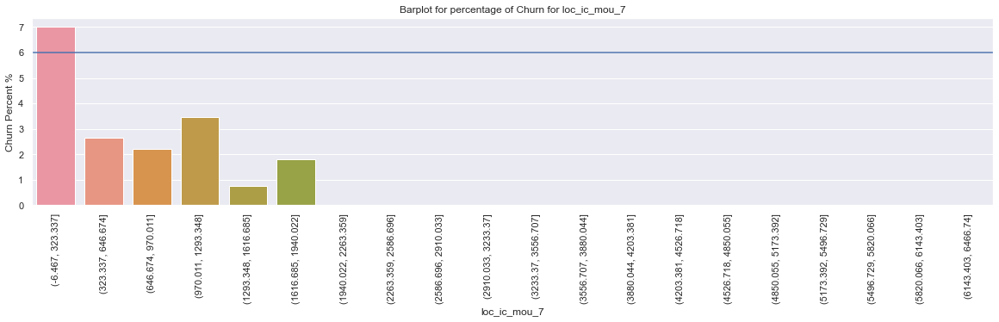

local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_7

*****************************************************************************************


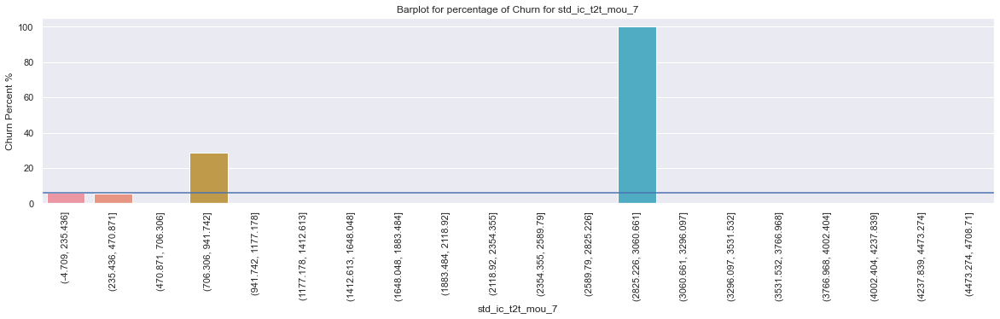

std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_7

*****************************************************************************************


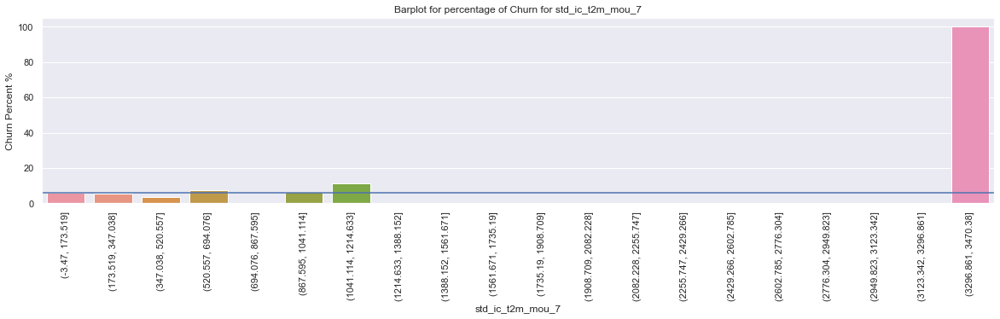

std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_7

*****************************************************************************************


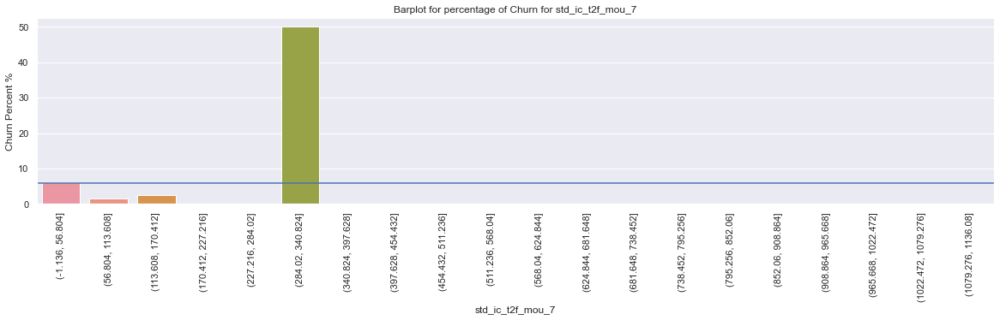

std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_7

*****************************************************************************************


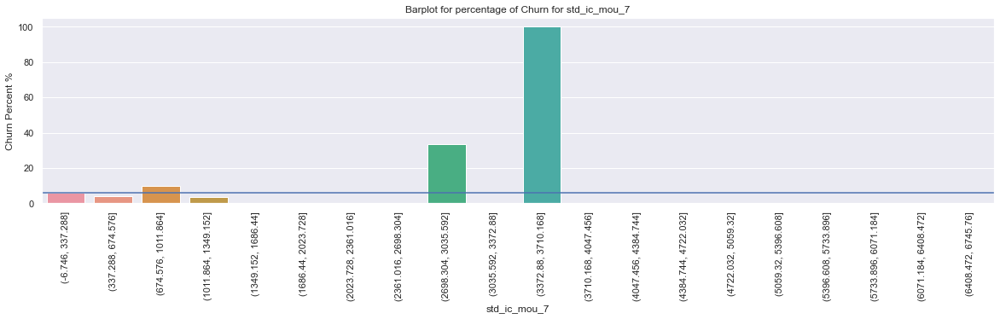

std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_7

*****************************************************************************************


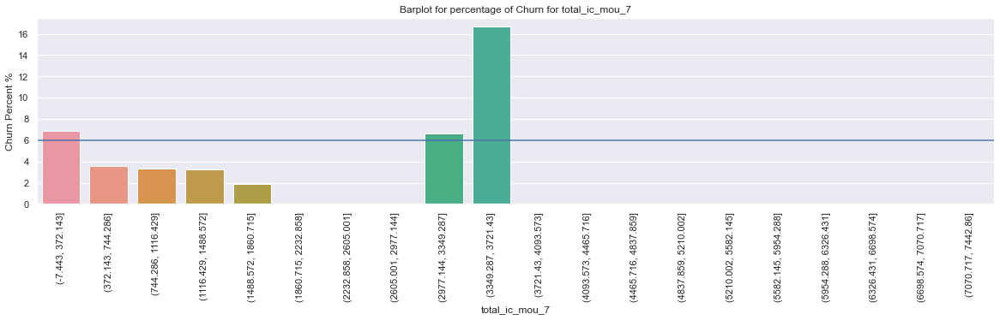

total_incoming calls_minutes of usage  voice calls_7

*****************************************************************************************


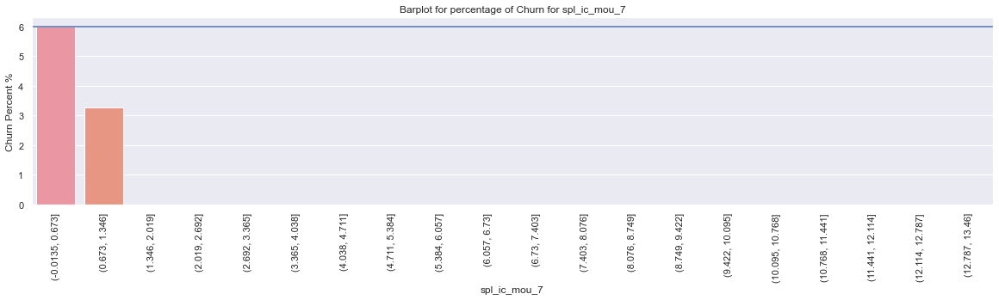

special calls_incoming calls_minutes of usage  voice calls_7

*****************************************************************************************


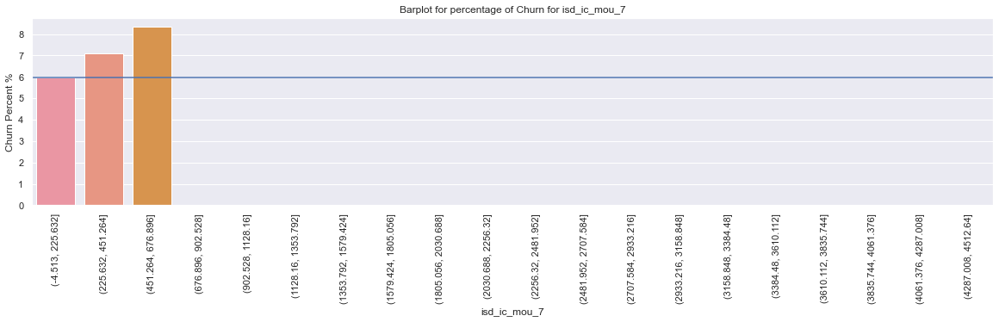

isd calls_incoming calls_minutes of usage  voice calls_7

*****************************************************************************************


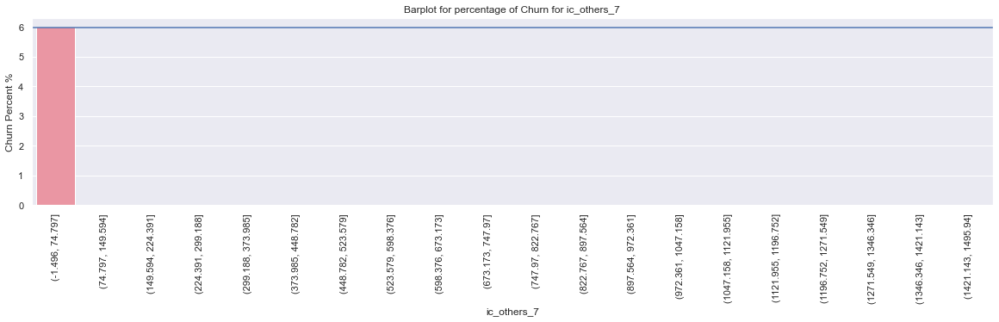

incoming calls_others_7

*****************************************************************************************


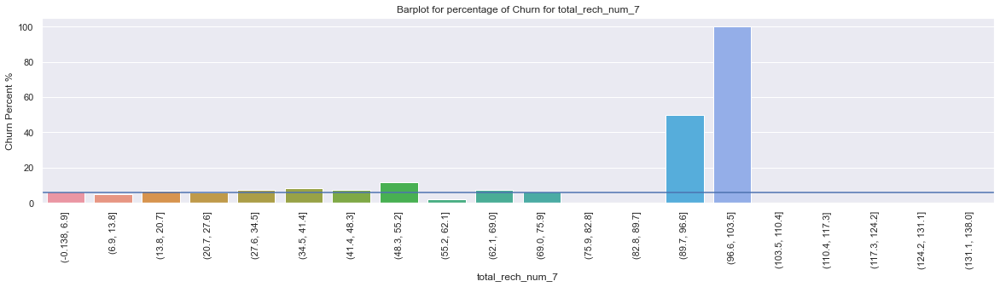

total_recharge_number_7

*****************************************************************************************


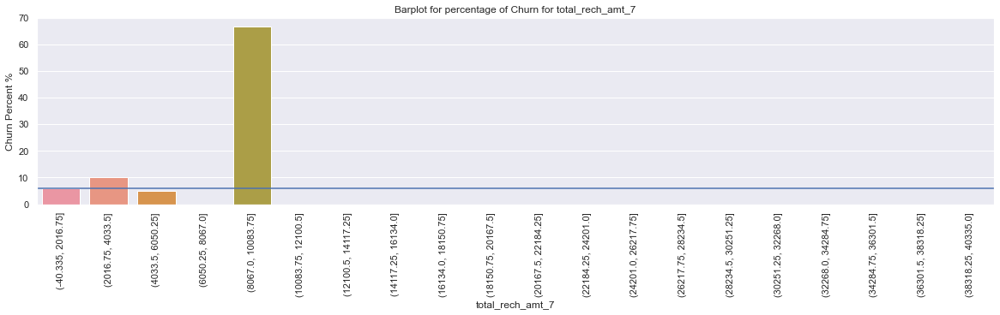

total_recharge_amount in local currency_7

*****************************************************************************************


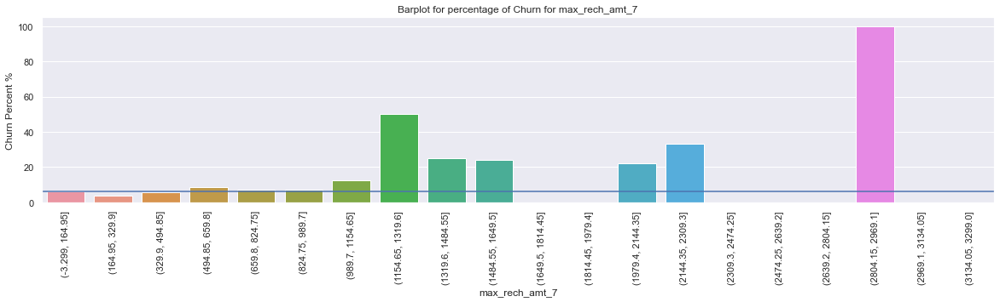

maximum_recharge_amount in local currency_7

*****************************************************************************************


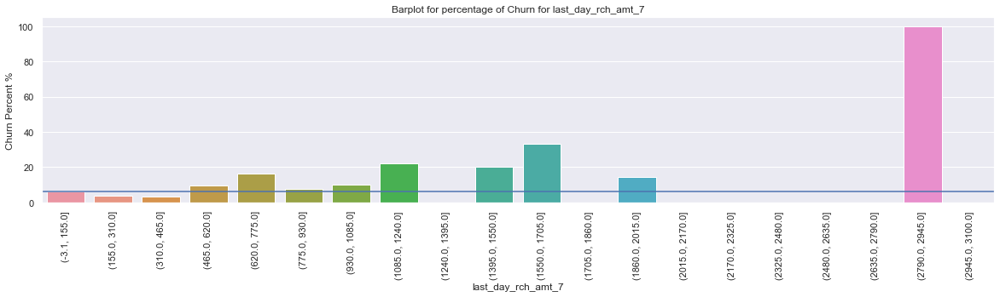

last_day_rch_amount in local currency_7

*****************************************************************************************


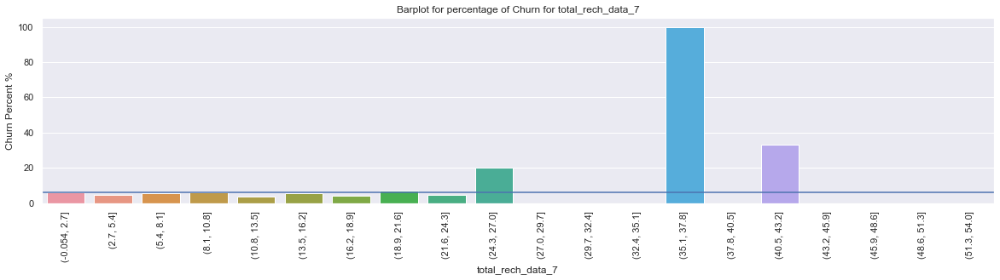

total_recharge_mobile internet_7

*****************************************************************************************


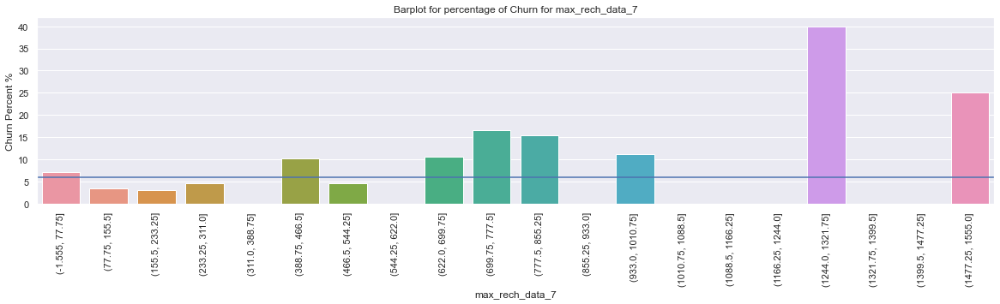

maximum_recharge_mobile internet_7

*****************************************************************************************


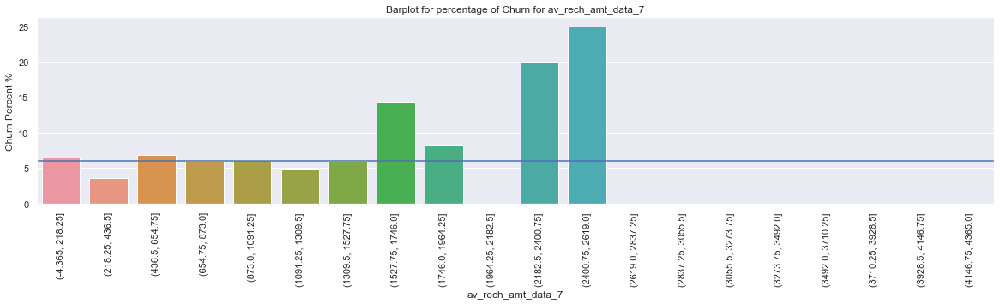

average_recharge_amount in local currency_mobile internet_7

*****************************************************************************************


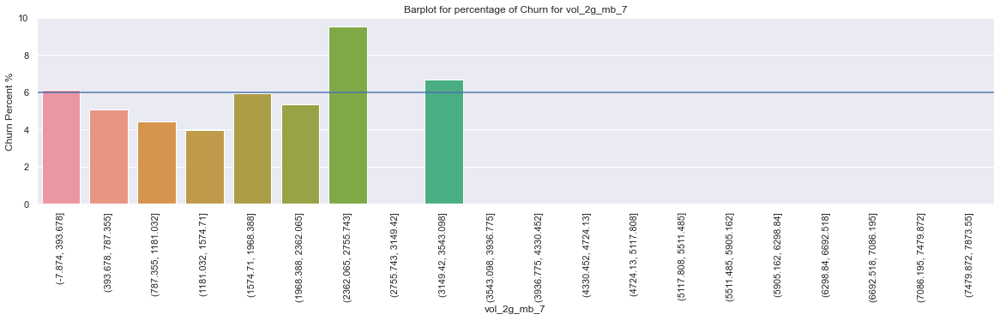

mobile internet usage volume in mb_g network_mb_7

*****************************************************************************************


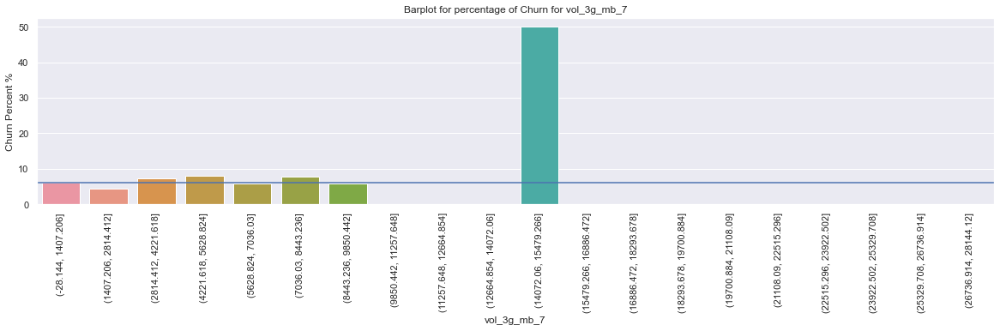

mobile internet usage volume in mb_g network_mb_7

*****************************************************************************************


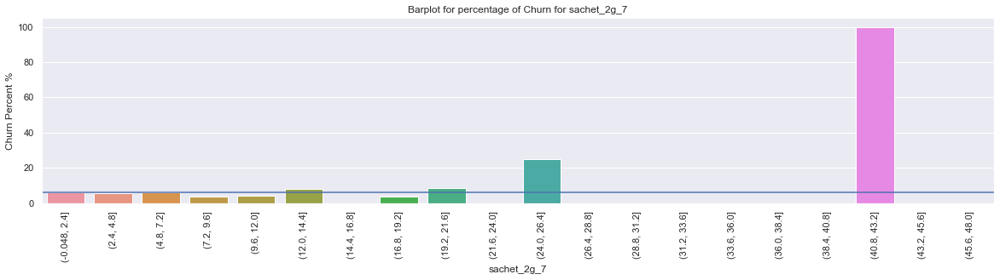

service schemes with validity smaller than a month_g network_7

*****************************************************************************************


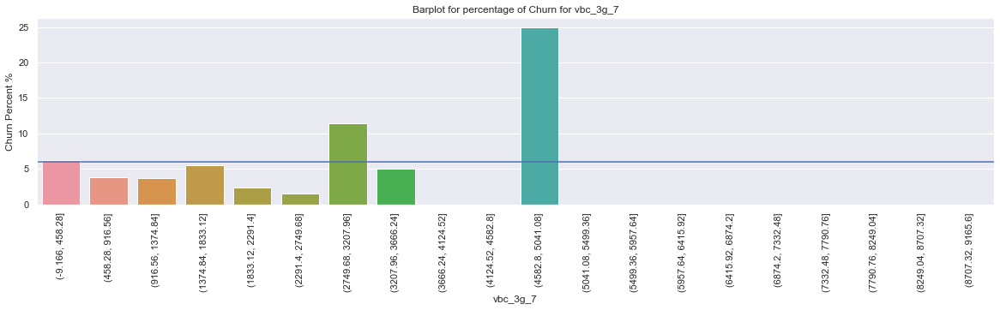

volume based cost  when no specific scheme is not purchased and paid as per usage_g network_7

*****************************************************************************************


In [46]:
for col in num_cols:
    if col[-1] == '7':
        bivariate(churn_filtered[col],churn_filtered.churn_probability)

### Findings
Bivariate Analysis on Categorical columns for high value customers

* arpu_7, offnet_mou_7 - As the values increases the churn rate increases
* offnet_mou_7 - Values from 1056 to 3874 have higher churn rate than the average churn rate of 6%
* std_og_t2t_mou_7 - As the values increases the churn rate increases
* std_og_t2m_mou_7 - As the values increases the churn rate increases
* std_og_mou_7 - As the values increases the churn rate increases
* total_og_mou_7- As the values increases the churn rate increases
* vbc_3g_7- Values from 4582 to 5041 have higher churn rate than the average churn rate of 6%

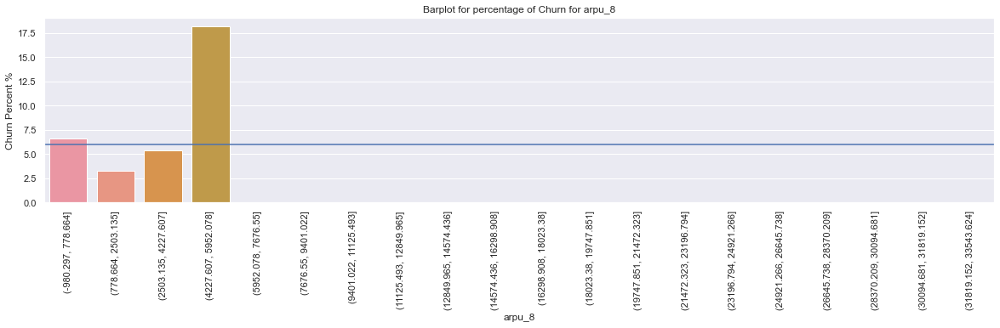

average revenue per user_8

*****************************************************************************************


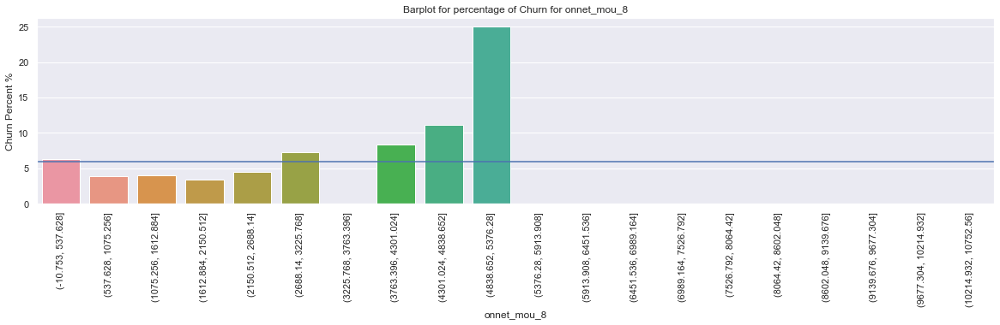

all kind of calls within the same operator network_minutes of usage  voice calls_8

*****************************************************************************************


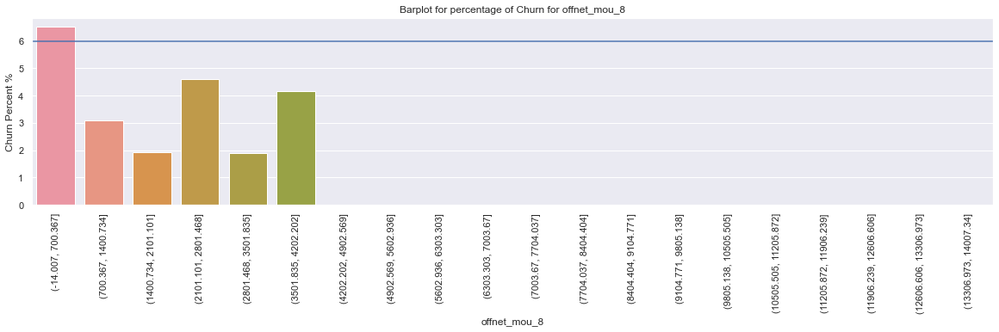

all kind of calls outside the operator t network_minutes of usage  voice calls_8

*****************************************************************************************


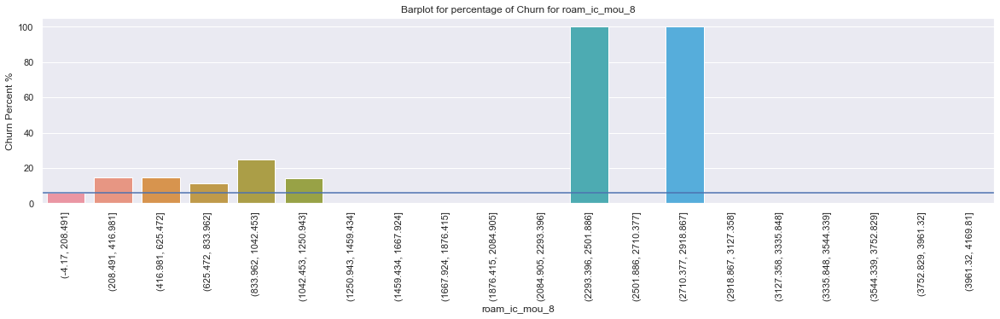

indicates that customer is in roaming zone during the call_incoming calls_minutes of usage  voice calls_8

*****************************************************************************************


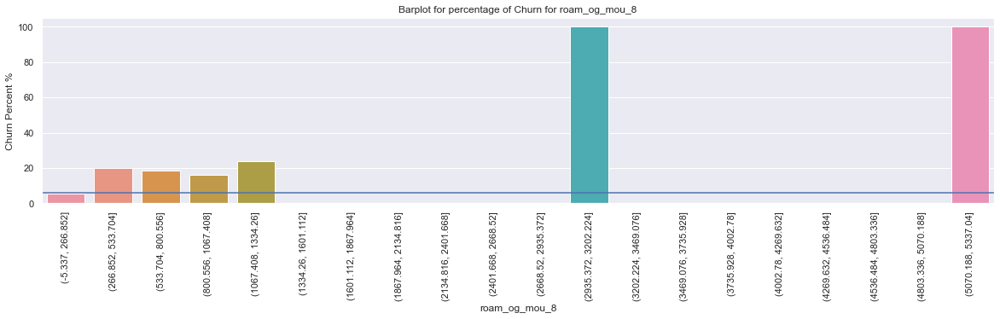

indicates that customer is in roaming zone during the call_outgoing calls_minutes of usage  voice calls_8

*****************************************************************************************


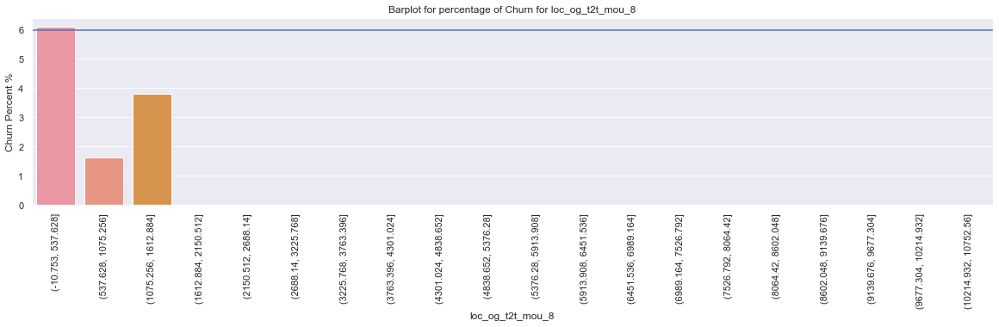

local calls  within same telecom circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8

*****************************************************************************************


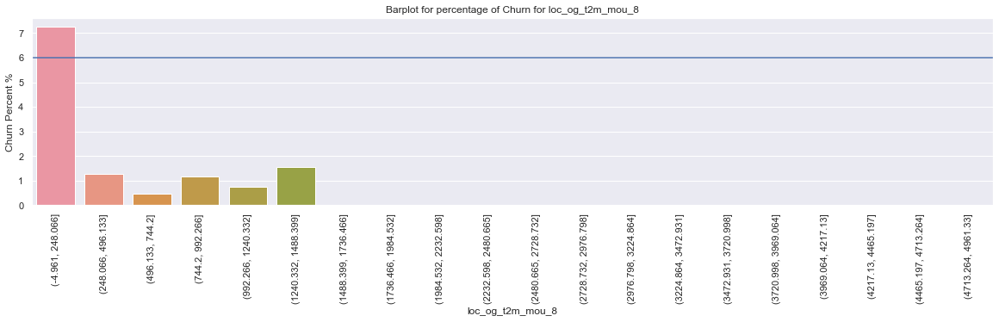

local calls  within same telecom circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8

*****************************************************************************************


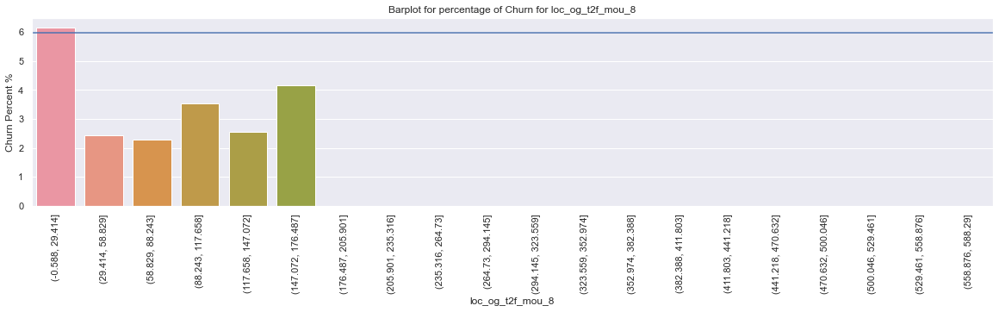

local calls  within same telecom circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8

*****************************************************************************************


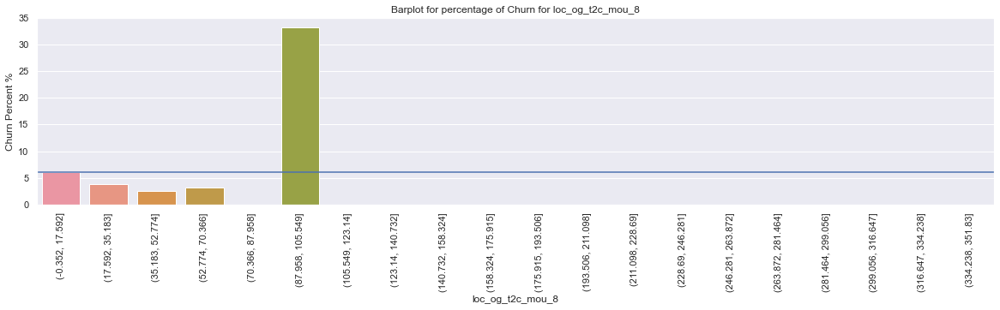

local calls  within same telecom circle_outgoing calls_operator t to its own call center_minutes of usage  voice calls_8

*****************************************************************************************


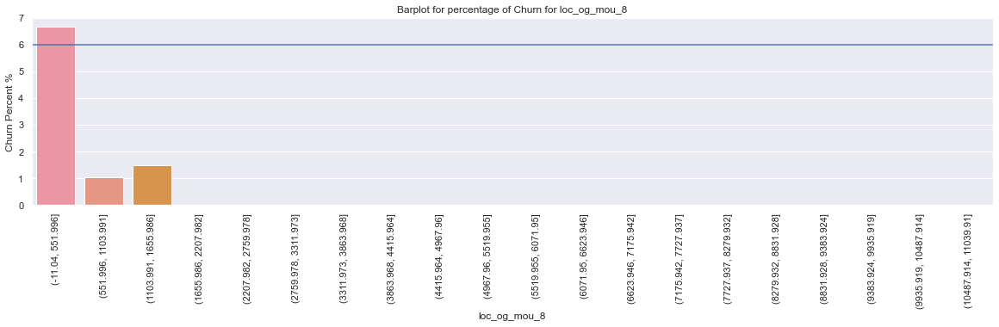

local calls  within same telecom circle_outgoing calls_minutes of usage  voice calls_8

*****************************************************************************************


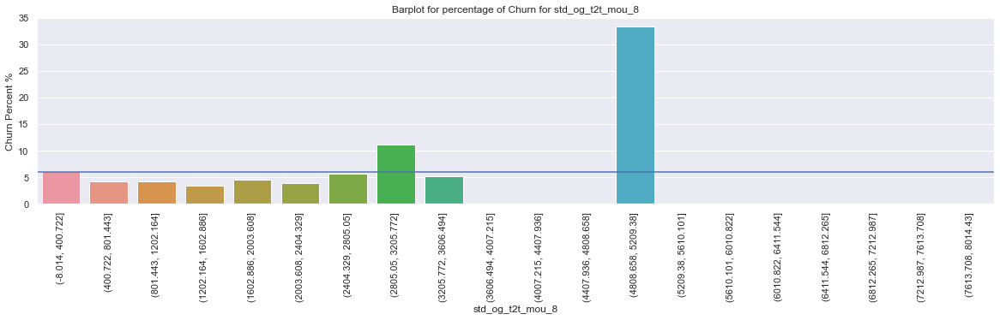

std calls  outside the calling circle_outgoing calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8

*****************************************************************************************


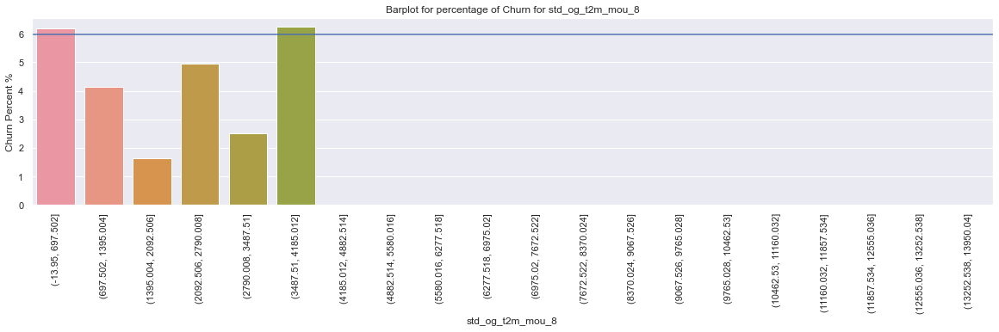

std calls  outside the calling circle_outgoing calls_operator t to other operator mobile_minutes of usage  voice calls_8

*****************************************************************************************


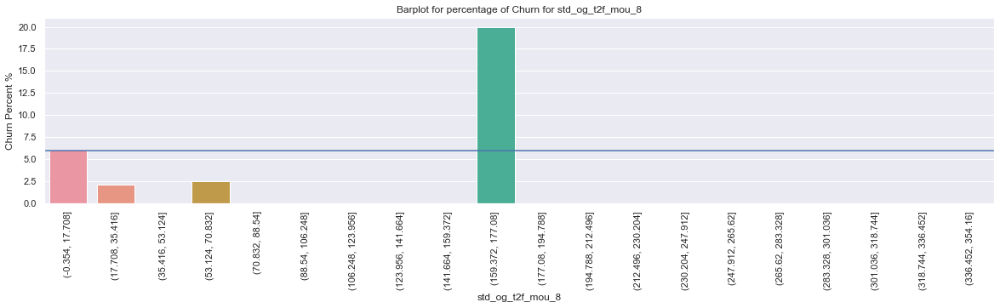

std calls  outside the calling circle_outgoing calls_operator t to fixed lines of t_minutes of usage  voice calls_8

*****************************************************************************************


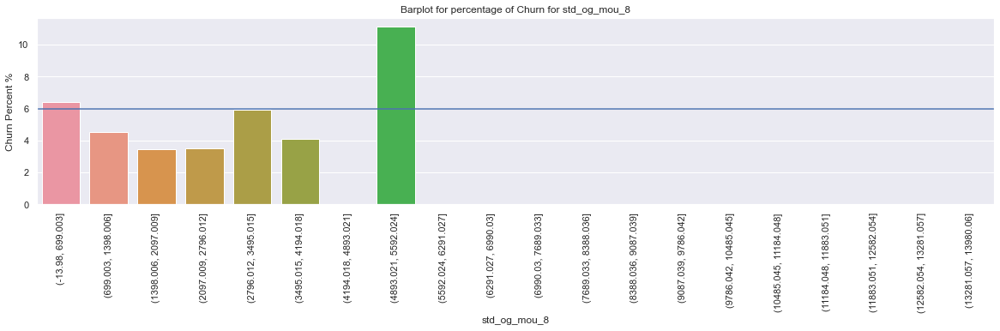

std calls  outside the calling circle_outgoing calls_minutes of usage  voice calls_8

*****************************************************************************************


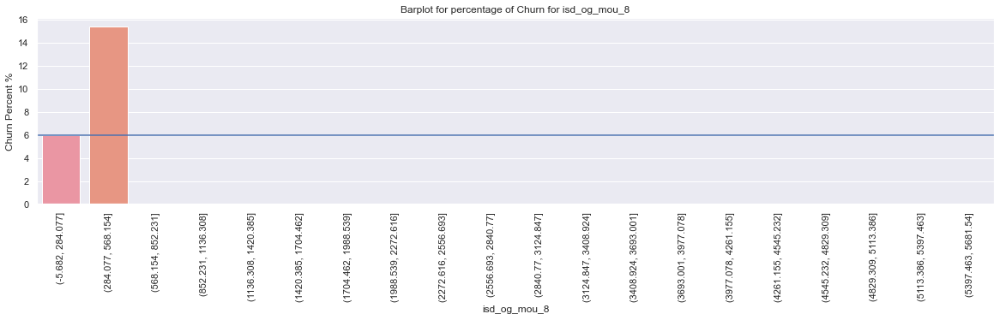

isd calls_outgoing calls_minutes of usage  voice calls_8

*****************************************************************************************


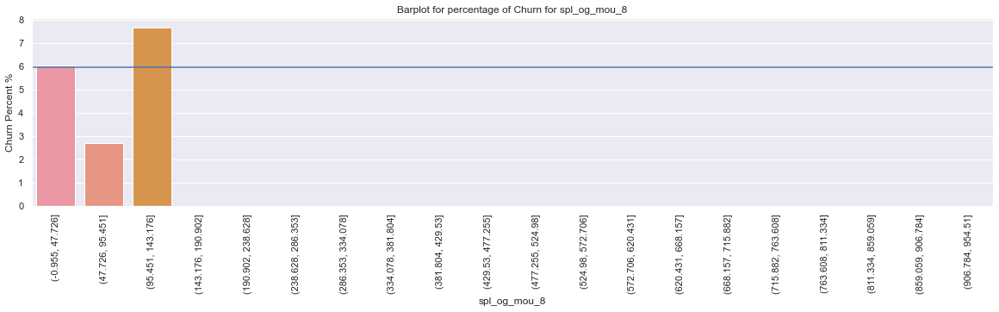

special calls_outgoing calls_minutes of usage  voice calls_8

*****************************************************************************************


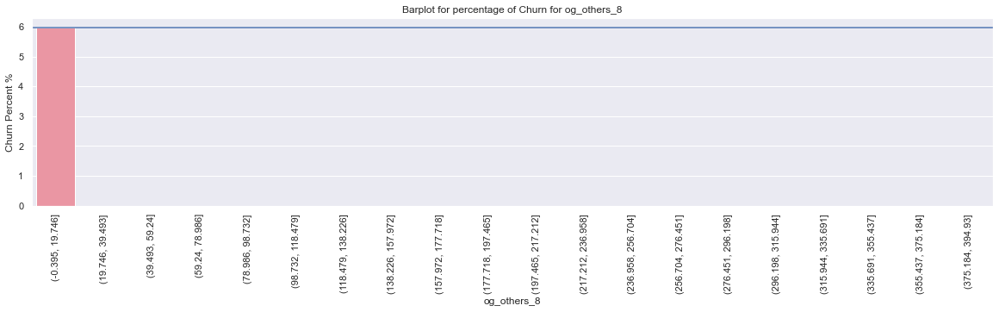

outgoing calls_others_8

*****************************************************************************************


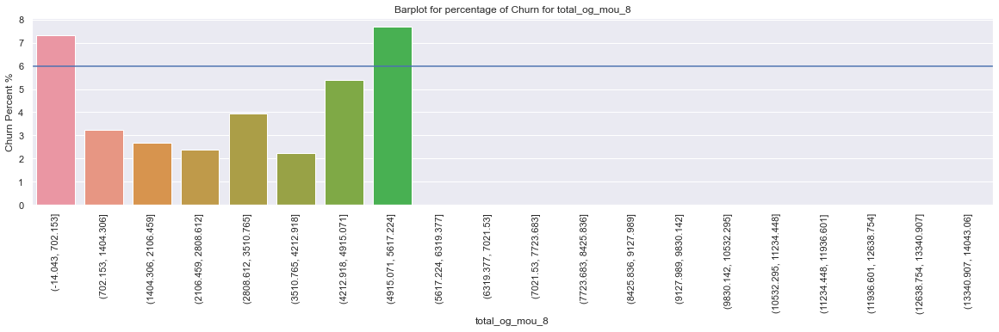

total_outgoing calls_minutes of usage  voice calls_8

*****************************************************************************************


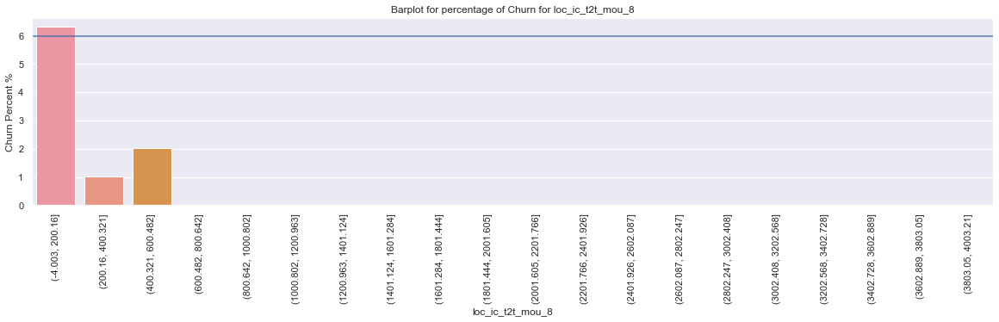

local calls  within same telecom circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8

*****************************************************************************************


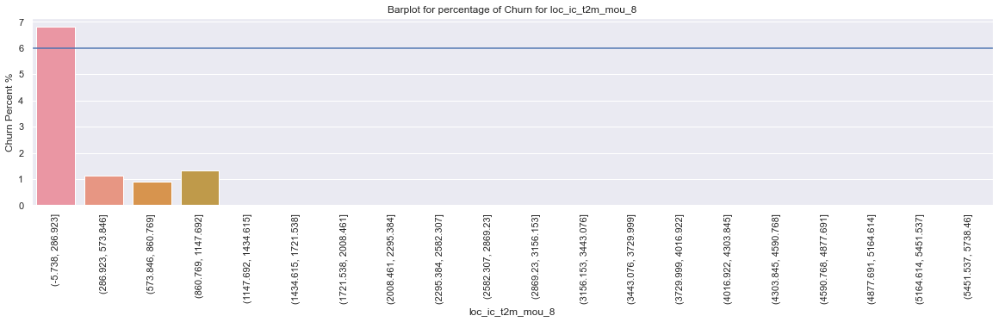

local calls  within same telecom circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8

*****************************************************************************************


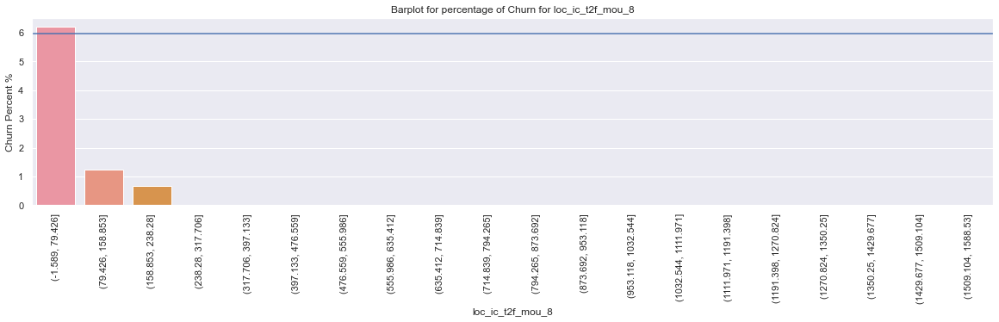

local calls  within same telecom circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8

*****************************************************************************************


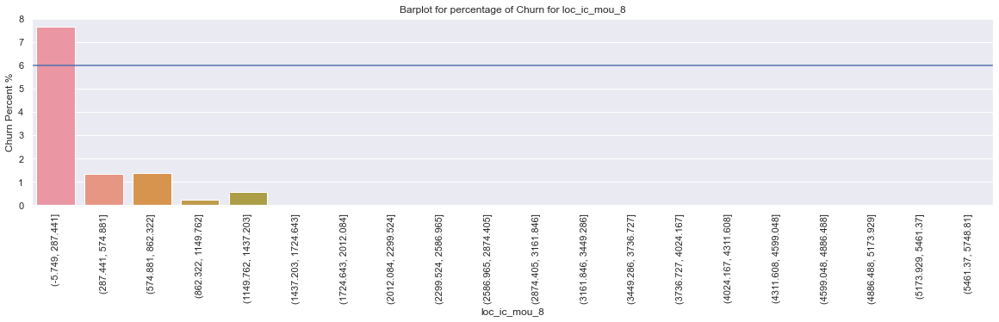

local calls  within same telecom circle_incoming calls_minutes of usage  voice calls_8

*****************************************************************************************


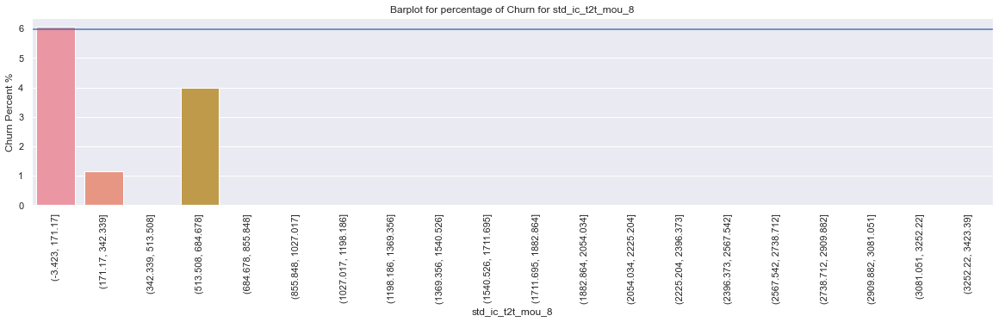

std calls  outside the calling circle_incoming calls_operator t to t ie within same operator mobile to mobile_minutes of usage  voice calls_8

*****************************************************************************************


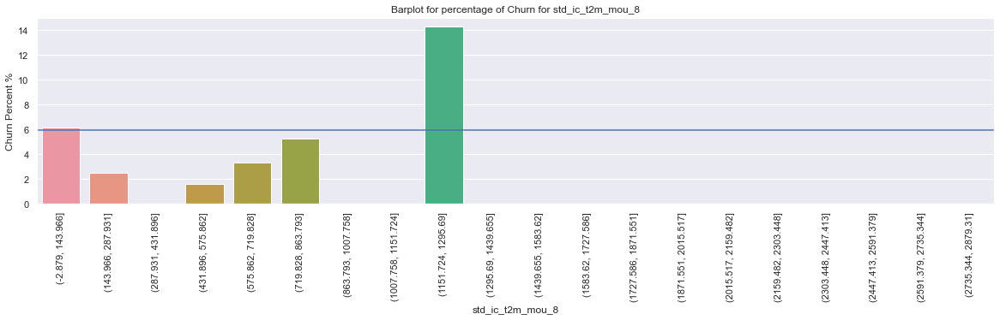

std calls  outside the calling circle_incoming calls_operator t to other operator mobile_minutes of usage  voice calls_8

*****************************************************************************************


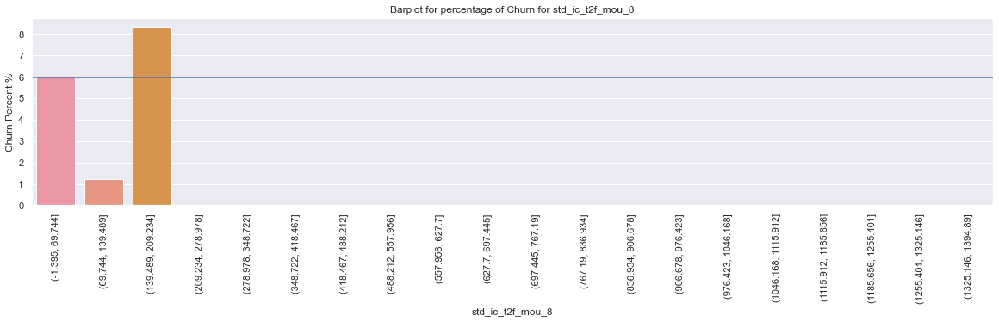

std calls  outside the calling circle_incoming calls_operator t to fixed lines of t_minutes of usage  voice calls_8

*****************************************************************************************


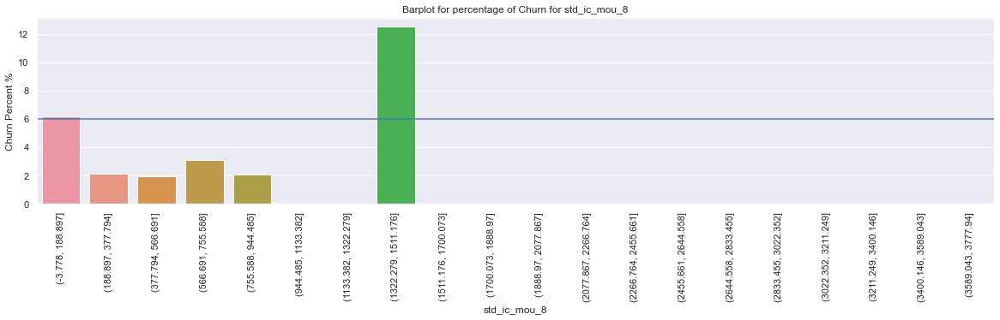

std calls  outside the calling circle_incoming calls_minutes of usage  voice calls_8

*****************************************************************************************


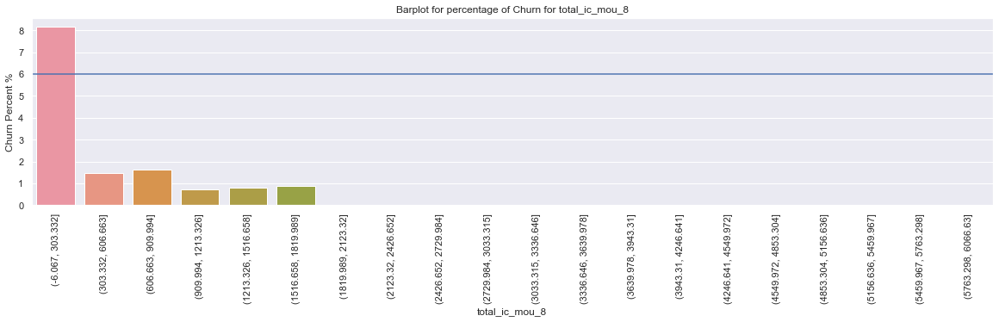

total_incoming calls_minutes of usage  voice calls_8

*****************************************************************************************


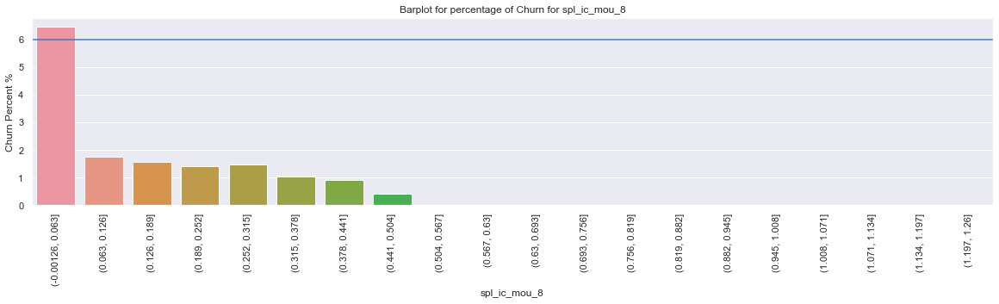

special calls_incoming calls_minutes of usage  voice calls_8

*****************************************************************************************


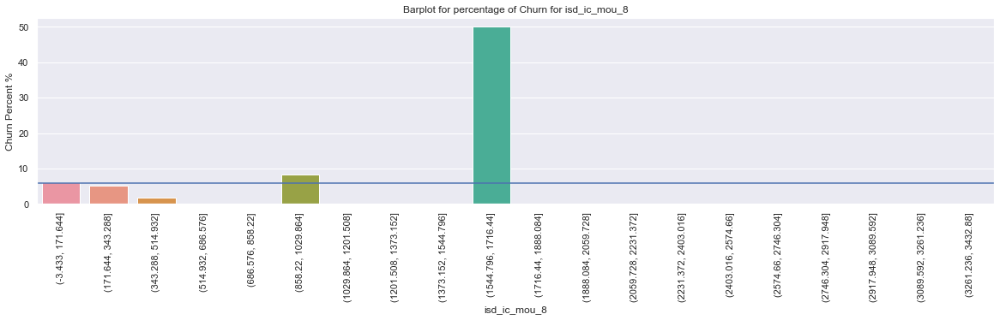

isd calls_incoming calls_minutes of usage  voice calls_8

*****************************************************************************************


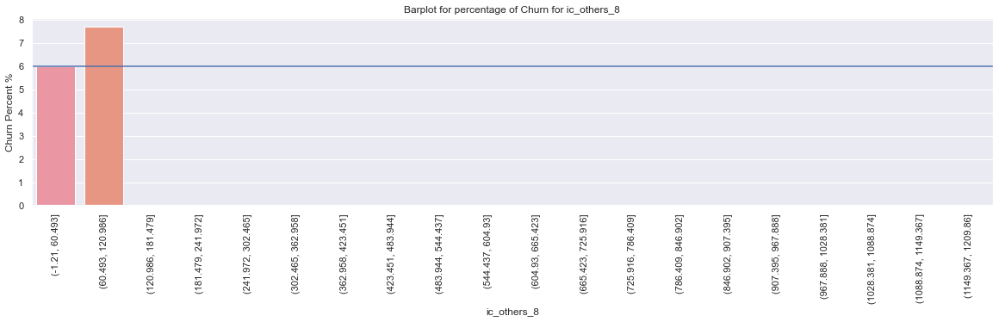

incoming calls_others_8

*****************************************************************************************


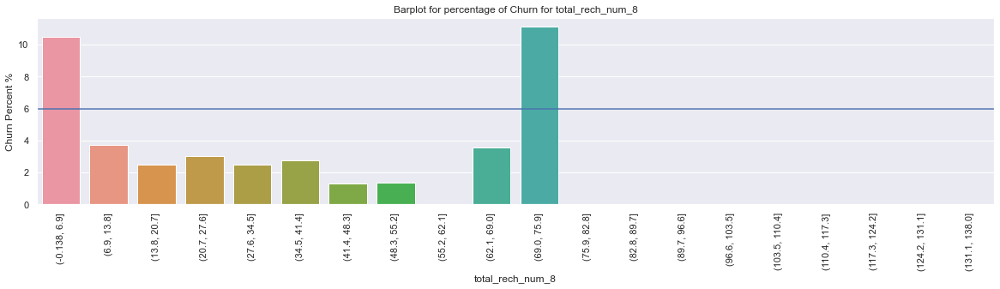

total_recharge_number_8

*****************************************************************************************


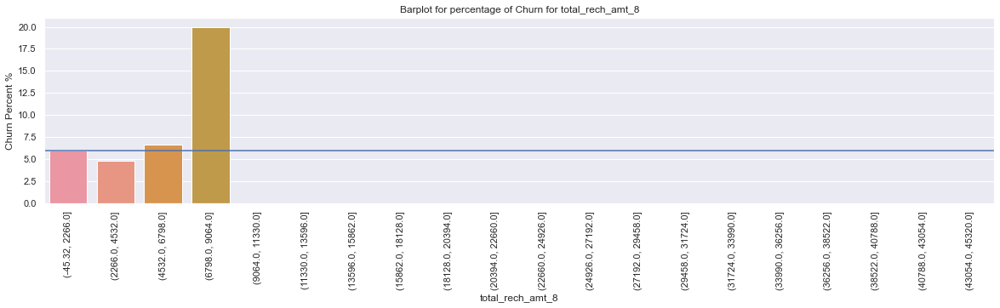

total_recharge_amount in local currency_8

*****************************************************************************************


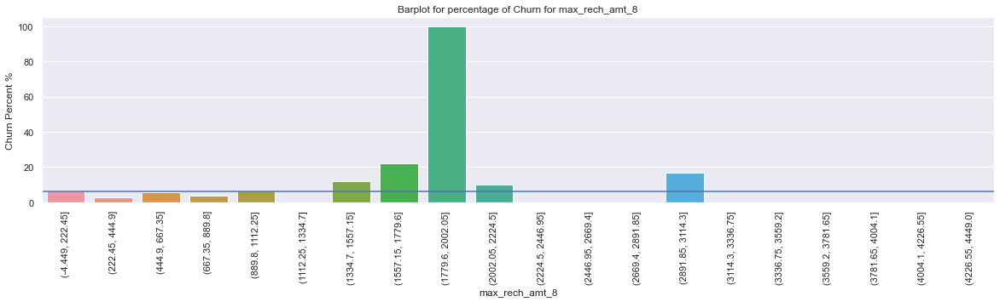

maximum_recharge_amount in local currency_8

*****************************************************************************************


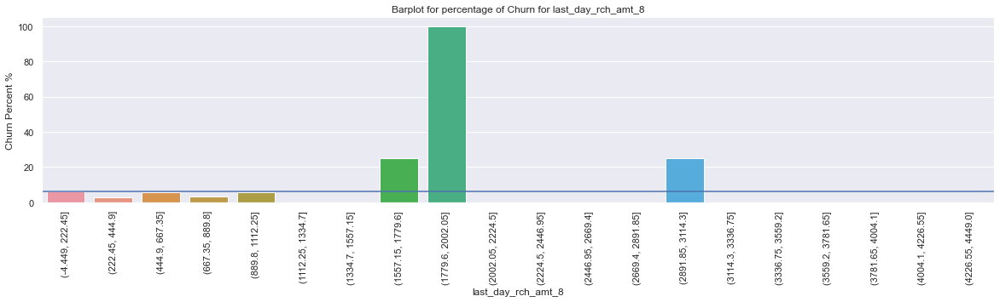

last_day_rch_amount in local currency_8

*****************************************************************************************


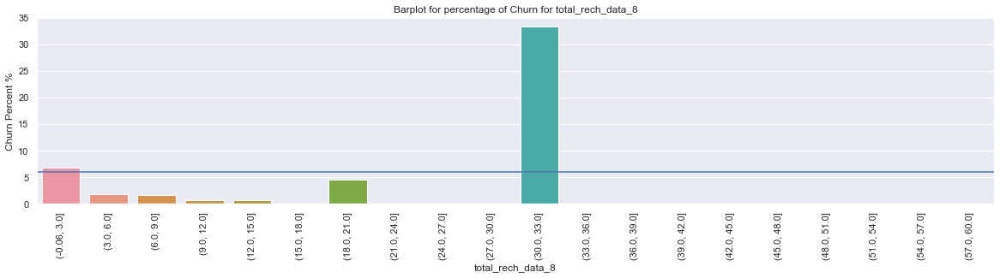

total_recharge_mobile internet_8

*****************************************************************************************


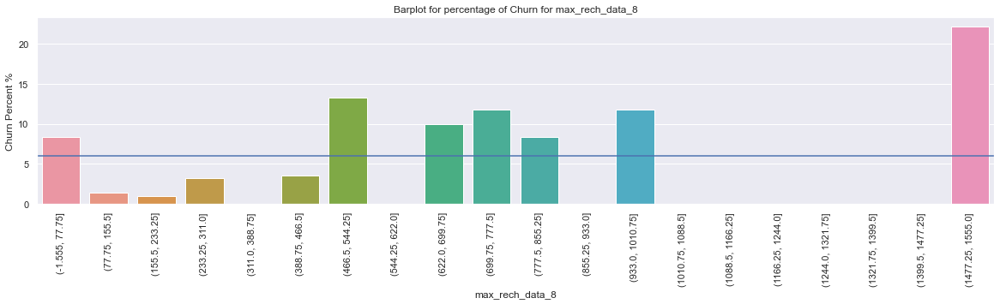

maximum_recharge_mobile internet_8

*****************************************************************************************


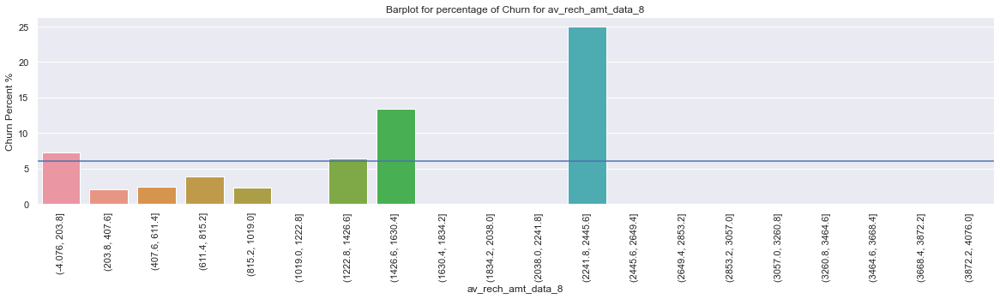

average_recharge_amount in local currency_mobile internet_8

*****************************************************************************************


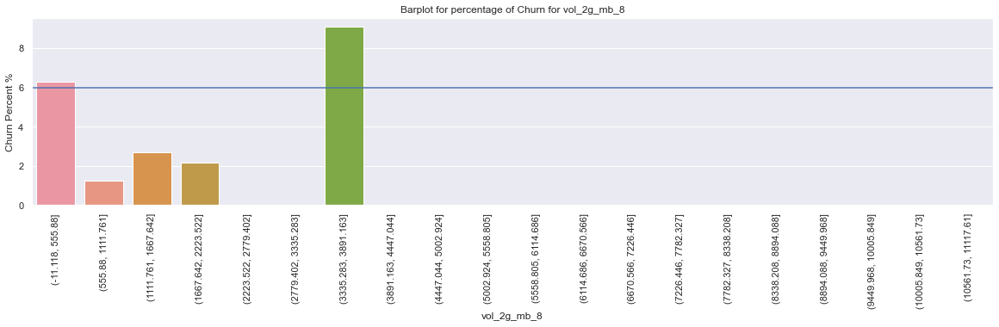

mobile internet usage volume in mb_g network_mb_8

*****************************************************************************************


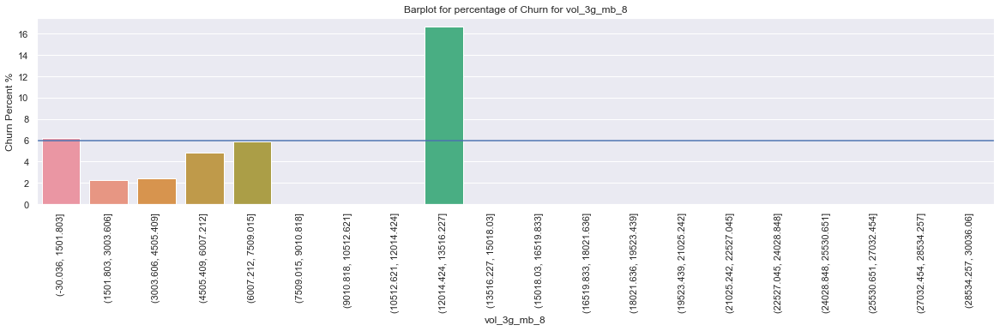

mobile internet usage volume in mb_g network_mb_8

*****************************************************************************************


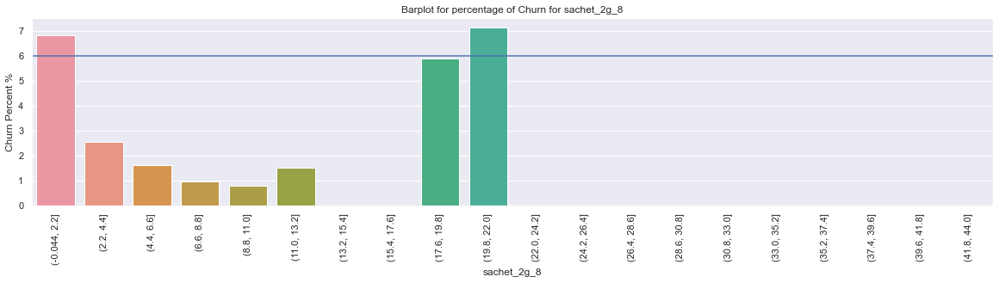

service schemes with validity smaller than a month_g network_8

*****************************************************************************************


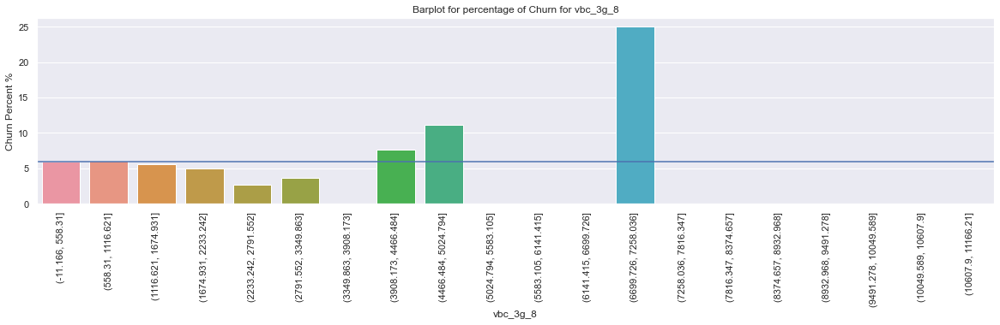

volume based cost  when no specific scheme is not purchased and paid as per usage_g network_8

*****************************************************************************************


In [47]:
for col in num_cols:
    if col[-1] == '8':
        bivariate(churn_filtered[col],churn_filtered.churn_probability)

### Findings
Bivariate Analysis on Categorical columns for high value customers

* arpu_8, onnet_mou_8 - As the values increases the churn rate increases
* total_rech_amt_8 - Values from 30 to 33 have higher churn rate than the average churn rate of 6%
* max_rech_data_8 - Values from 466 to 155 have higher churn rate than the average churn rate of 6%
* av_rech_amt_data_8, vol_3g_mb_8, vbc_3g_8- High values have higher churn rate than the average churn rate of 6%

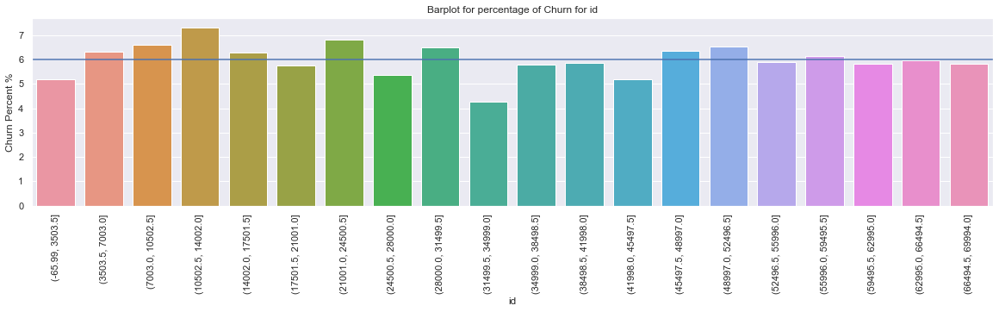

id

*****************************************************************************************


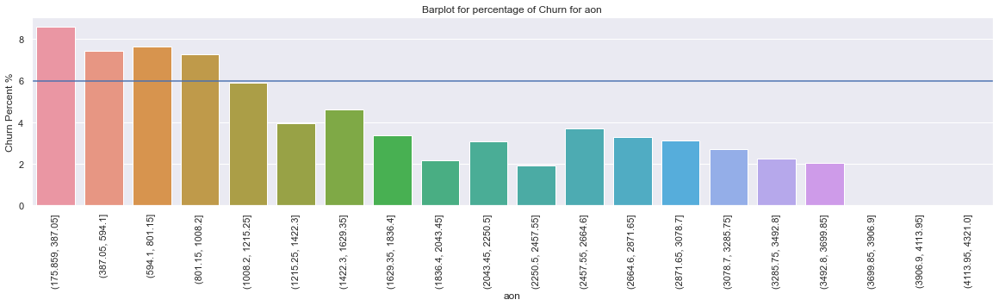

age on network  number of days the customer is using the operator t network

*****************************************************************************************


In [48]:
for col in num_cols:
    if col[-1] != '6' and col[-1] != '7' and col[-1] != '8':
        bivariate(churn_filtered[col],churn_filtered.churn_probability)

### Findings
Bivariate Analysis on Categorical columns for high value customers

* aon - As the values increases the churn rate decreases

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   vol_2g_mb_6  vol_2g_mb_7  vol_2g_mb_8
churn_probability                                       
0                   124.779279   127.845609   127.521324
1                   109.529435    97.998305    36.915036


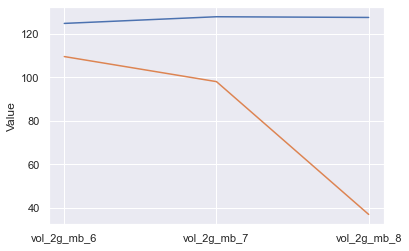

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_og_mou_6  std_og_mou_7  std_og_mou_8
churn_probability                                          
0                    308.667354    349.811808    348.020260
1                    631.962053    570.276778    231.279714


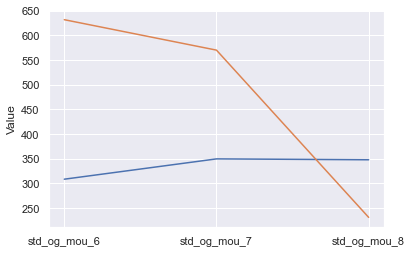

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_og_t2c_mou_6  loc_og_t2c_mou_7  loc_og_t2c_mou_8
churn_probability                                                      
0                          1.528357          1.820088          1.894295
1                          1.694185          2.409181          1.203405


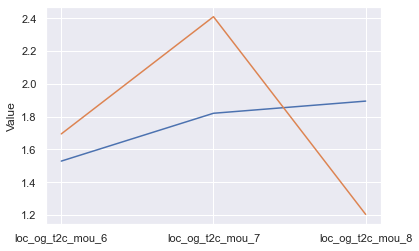

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   onnet_mou_6  onnet_mou_7  onnet_mou_8
churn_probability                                       
0                   239.625774   260.507365   258.639985
1                   396.772681   355.591575   169.755553


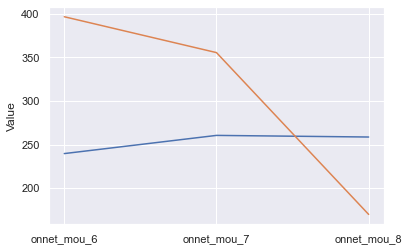

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   night_pck_user_6  night_pck_user_7  night_pck_user_8
churn_probability                                                      
0                         -0.436234         -0.404528         -0.377684
1                         -0.489260         -0.550517         -0.710422


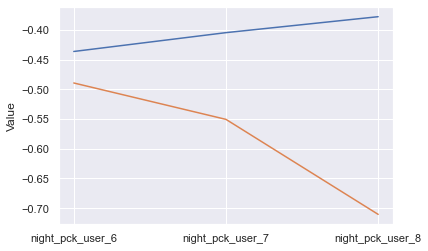

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_og_t2m_mou_6  std_og_t2m_mou_7  std_og_t2m_mou_8
churn_probability                                                      
0                        160.458327        181.710444        179.926546
1                        315.933047        286.713811        107.436778


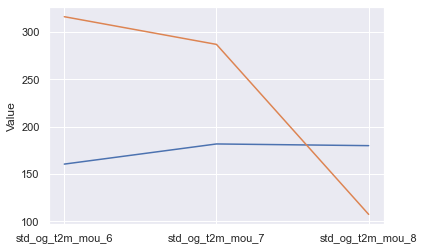

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_og_t2t_mou_6  std_og_t2t_mou_7  std_og_t2t_mou_8
churn_probability                                                      
0                        146.475979        166.367845        166.378211
1                        315.082148        282.441138        123.417399


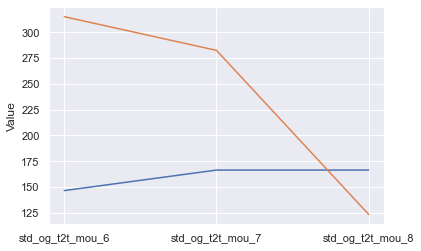

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   date_of_last_rech_6  date_of_last_rech_7  \
churn_probability                                             
0                             3.753191             3.564475   
1                             3.376293             5.085123   

                   date_of_last_rech_8  
churn_probability                       
0                             3.640701  
1                             6.491647  


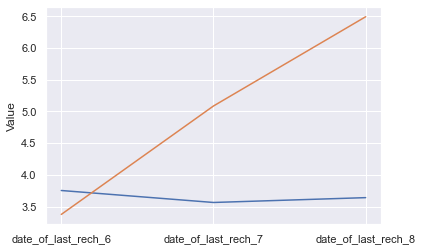

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_ic_t2f_mou_6  loc_ic_t2f_mou_7  loc_ic_t2f_mou_8
churn_probability                                                      
0                         15.758439         16.819237         15.683328
1                          7.904495          7.410111          3.359157


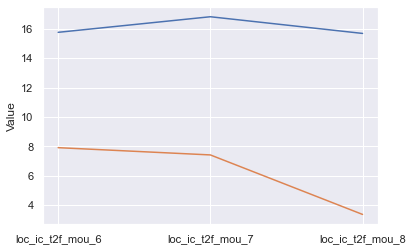

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   spl_og_mou_6  spl_og_mou_7  spl_og_mou_8
churn_probability                                          
0                      5.504404      7.020801      7.440264
1                      7.139905      8.274471      3.583429


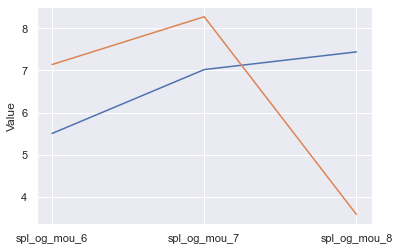

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   av_rech_amt_data_6  av_rech_amt_data_7  av_rech_amt_data_8
churn_probability                                                            
0                          128.023233          141.029459          144.715802
1                          127.968974          112.226523           55.027311


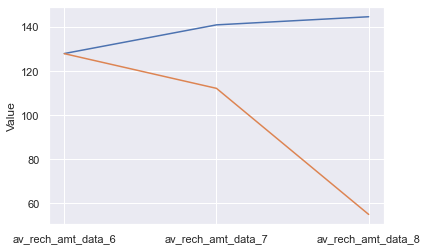

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   og_others_6  og_others_7  og_others_8
churn_probability                                       
0                     0.633752     0.033990     0.070818
1                     0.748656     0.006523     0.000851


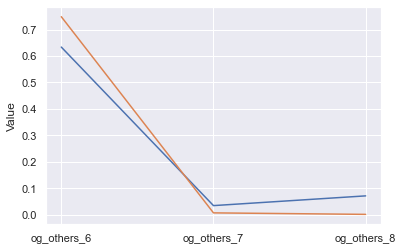

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_ic_t2f_mou_6  std_ic_t2f_mou_7  std_ic_t2f_mou_8
churn_probability                                                      
0                          2.701663          2.813931          2.614039
1                          1.399777          1.505068          0.671567


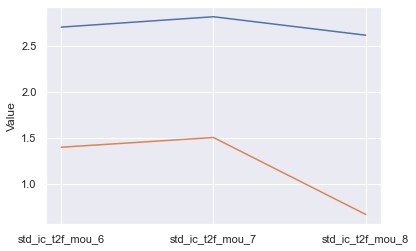

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   total_rech_amt_6  total_rech_amt_7  total_rech_amt_8
churn_probability                                                      
0                        622.258458        646.585241        657.860363
1                        830.226730        719.031026        373.770883


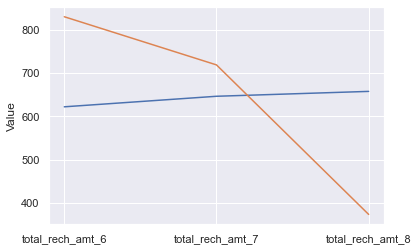

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   roam_og_mou_6  roam_og_mou_7  roam_og_mou_8
churn_probability                                             
0                      24.429375      17.272593      17.865520
1                      57.285426      56.910302      56.765521


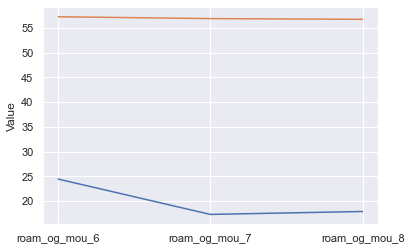

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_og_t2f_mou_6  std_og_t2f_mou_7  std_og_t2f_mou_8
churn_probability                                                      
0                          1.729443          1.729846          1.711952
1                          0.942745          1.117733          0.423397


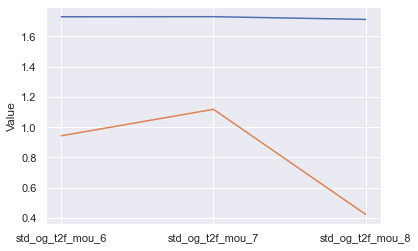

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   total_ic_mou_6  total_ic_mou_7  total_ic_mou_8
churn_probability                                                
0                      285.359836      298.344607      301.151779
1                      218.953262      186.360780       84.850621


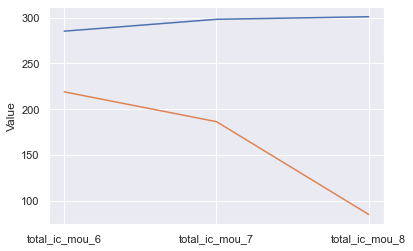

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_ic_mou_6  std_ic_mou_7  std_ic_mou_8
churn_probability                                          
0                     44.059047     47.983569     47.922321
1                     54.200509     47.557987     18.696126


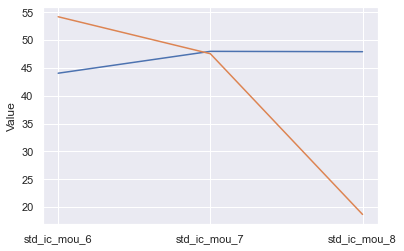

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   max_rech_amt_6  max_rech_amt_7  max_rech_amt_8
churn_probability                                                
0                      162.482222      167.504103      175.735312
1                      181.062053      180.969769      126.151949


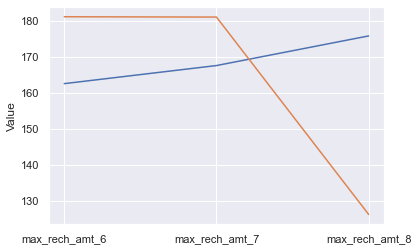

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   total_rech_num_6  total_rech_num_7  total_rech_num_8
churn_probability                                                      
0                         11.274868         11.655541         11.138371
1                         13.549722         12.194113          6.505967


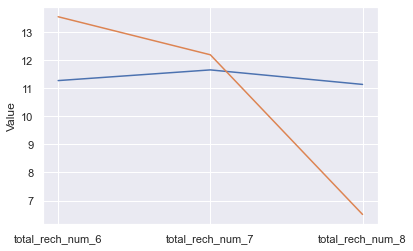

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   isd_og_mou_6  isd_og_mou_7  isd_og_mou_8
churn_probability                                          
0                      2.074086      2.136395      2.294143
1                      5.603660      3.990239      2.560859


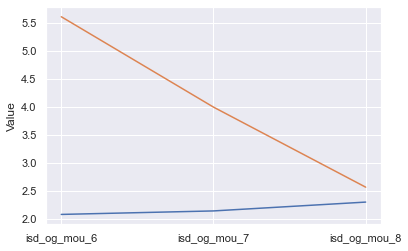

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   ic_others_6  ic_others_7  ic_others_8
churn_probability                                       
0                     1.211473     1.601223     1.357565
1                     0.805259     0.794487     0.538759


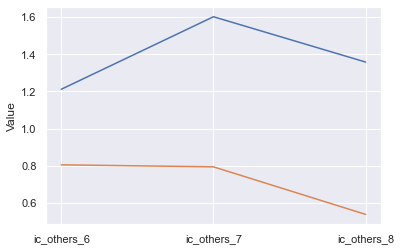

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   monthly_3g_6  monthly_3g_7  monthly_3g_8
churn_probability                                          
0                      0.211153      0.227462      0.241795
1                      0.249801      0.186953      0.105012


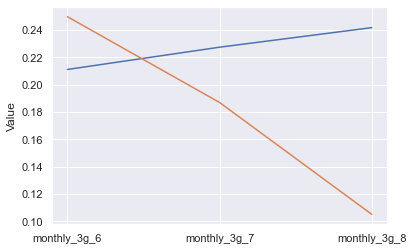

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   fb_user_6  fb_user_7  fb_user_8
churn_probability                                 
0                   0.065539     0.1211   0.158124
1                  -0.058075    -0.1607  -0.501193


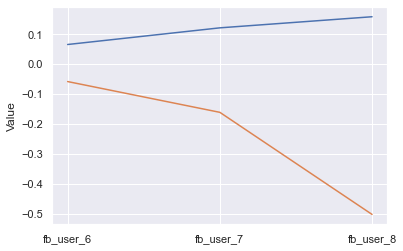

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   spl_ic_mou_6  spl_ic_mou_7  spl_ic_mou_8
churn_probability                                          
0                      0.060221      0.019615      0.031202
1                      0.057279      0.014224      0.003771


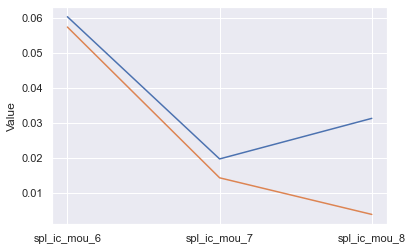

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   isd_ic_mou_6  isd_ic_mou_7  isd_ic_mou_8
churn_probability                                          
0                     10.502820     11.669674     11.875170
1                     11.193747     10.612132      7.602737


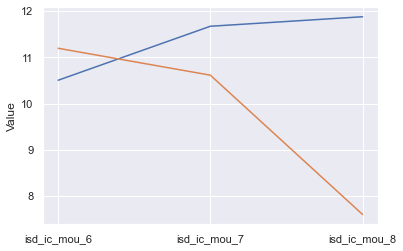

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   sachet_3g_6  sachet_3g_7  sachet_3g_8
churn_probability                                       
0                     0.202745     0.229234     0.247923
1                     0.280032     0.253779     0.089897


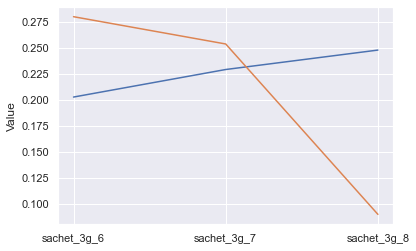

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_ic_t2t_mou_6  std_ic_t2t_mou_7  std_ic_t2t_mou_8
churn_probability                                                      
0                         13.557604         14.920817         15.167615
1                         21.226388         17.774765          5.834224


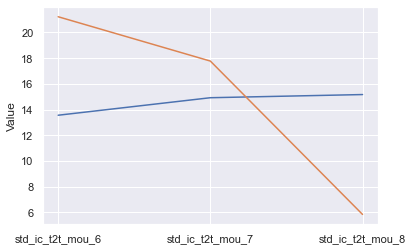

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                     vbc_3g_6    vbc_3g_7    vbc_3g_8
churn_probability                                    
0                  189.896643  182.211057  161.021666
1                   59.266611  120.827836  138.264399


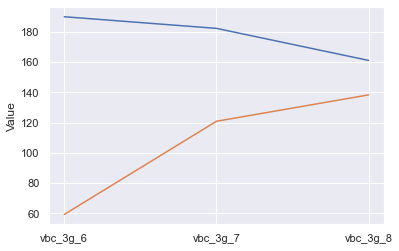

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   offnet_mou_6  offnet_mou_7  offnet_mou_8
churn_probability                                          
0                    351.244384    371.532899    370.420511
1                    471.237979    426.105426    187.379101


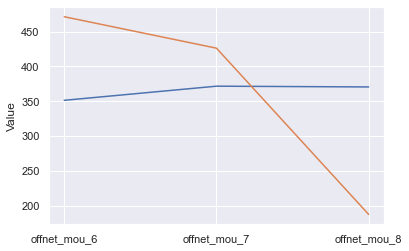

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   roam_ic_mou_6  roam_ic_mou_7  roam_ic_mou_8
churn_probability                                             
0                      14.513651      10.948797      11.291285
1                      29.774781      32.346531      32.111432


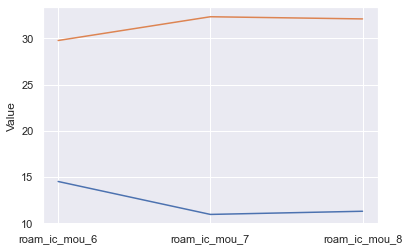

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   total_rech_data_6  total_rech_data_7  total_rech_data_8
churn_probability                                                         
0                           1.618011           1.871455           1.960596
1                           1.791567           1.585521           0.641209


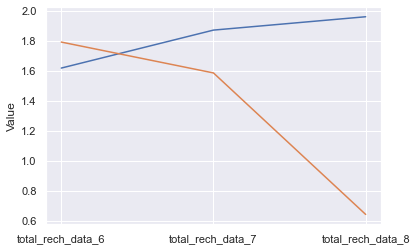

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_og_t2t_mou_6  loc_og_t2t_mou_7  loc_og_t2t_mou_8
churn_probability                                                      
0                         83.570848         87.393534         85.540302
1                         57.282291         48.848703         21.552562


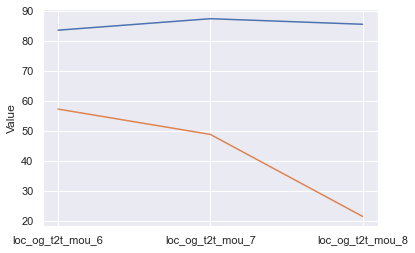

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   max_rech_data_6  max_rech_data_7  max_rech_data_8
churn_probability                                                   
0                        76.832303        80.504508        83.529933
1                        72.784407        65.249801        38.601432


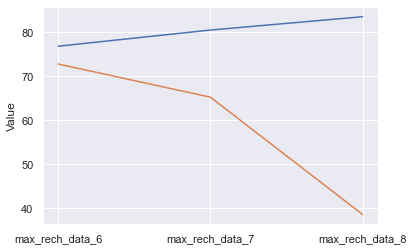

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_og_t2m_mou_6  loc_og_t2m_mou_7  loc_og_t2m_mou_8
churn_probability                                                      
0                        161.385334        164.241004        164.111623
1                        107.889817         93.782856         41.350915


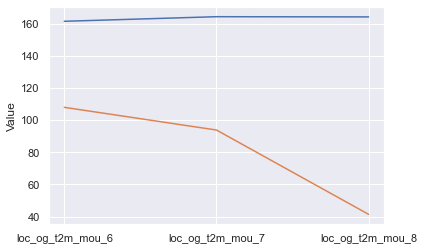

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_ic_mou_6  loc_ic_mou_7  loc_ic_mou_8
churn_probability                                          
0                    229.518305    237.062924    239.957731
1                    152.688751    127.375449     58.005131


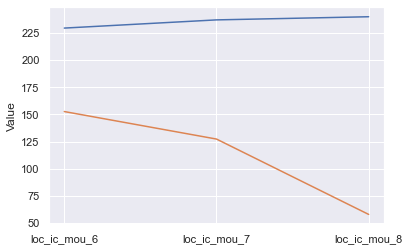

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   std_ic_t2m_mou_6  std_ic_t2m_mou_7  std_ic_t2m_mou_8
churn_probability                                                      
0                         27.796352         30.245200         30.137036
1                         31.570605         28.274598         12.188568


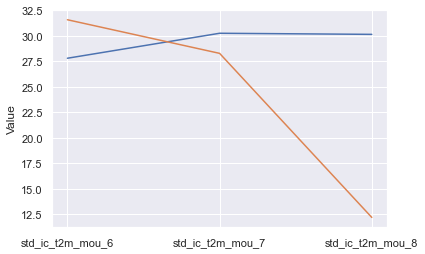

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   sachet_2g_6  sachet_2g_7  sachet_2g_8
churn_probability                                       
0                     1.026084     1.221485     1.282364
1                     1.178202     1.061257     0.408115


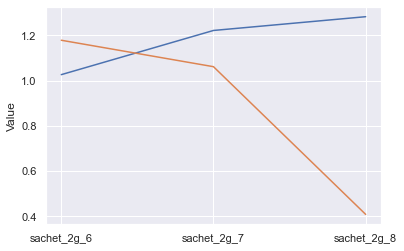

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_og_mou_6  loc_og_mou_7  loc_og_mou_8
churn_probability                                          
0                    251.318907    258.215370    256.009187
1                    168.992395    146.128982     65.109737


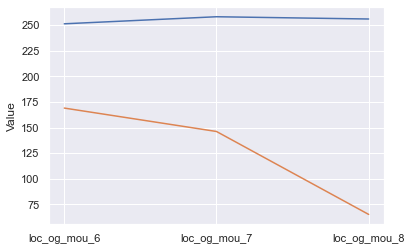

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   last_day_rch_amt_6  last_day_rch_amt_7  last_day_rch_amt_8
churn_probability                                                            
0                           96.967079           97.804700          102.746303
1                          117.535402           96.089101           54.294352


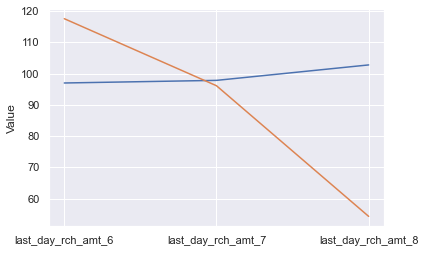

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_ic_t2t_mou_6  loc_ic_t2t_mou_7  loc_ic_t2t_mou_8
churn_probability                                                      
0                         64.631718         66.893337         67.381545
1                         42.269491         35.630955         15.719737


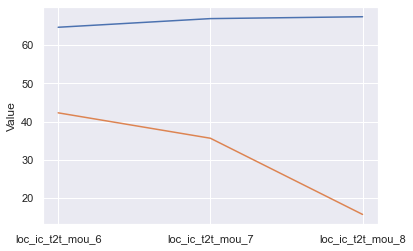

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                       arpu_6      arpu_7      arpu_8
churn_probability                                    
0                  527.878735  550.989781  561.650365
1                  700.872578  616.038068  340.153081


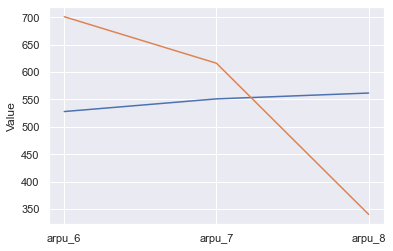

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_ic_t2m_mou_6  loc_ic_t2m_mou_7  loc_ic_t2m_mou_8
churn_probability                                                      
0                        149.118490         153.34045        156.882888
1                        102.507208          84.32743         38.921750


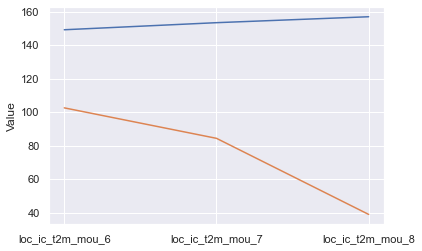

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   vol_3g_mb_6  vol_3g_mb_7  vol_3g_mb_8
churn_probability                                       
0                   343.450155   378.982308   403.194902
1                   363.743994   294.082100   152.064081


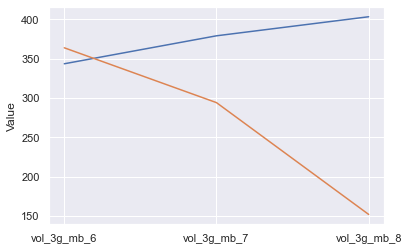

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   monthly_2g_6  monthly_2g_7  monthly_2g_8
churn_probability                                          
0                      0.178029      0.193274      0.188513
1                      0.083532      0.083532      0.038186


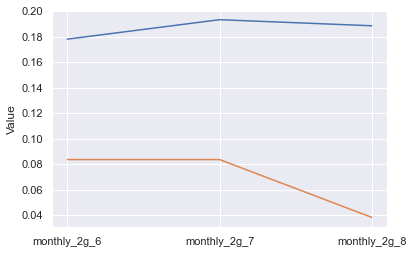

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   loc_og_t2f_mou_6  loc_og_t2f_mou_7  loc_og_t2f_mou_8
churn_probability                                                      
0                          6.354498          6.572383          6.348802
1                          3.813795          3.491082          2.202562


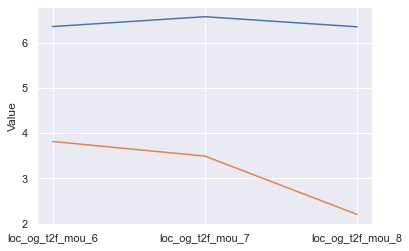

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   total_og_mou_6  total_og_mou_7  total_og_mou_8
churn_probability                                                
0                      568.207175      617.226288      613.842751
1                      814.456277      728.684614      302.539562


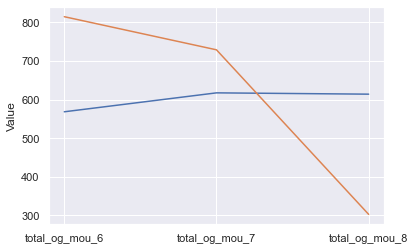

<AxesSubplot:ylabel='0'>

<AxesSubplot:ylabel='0'>

Text(0, 0.5, 'Value')

                   date_of_last_rech_data_6  date_of_last_rech_data_7  \
churn_probability                                                       
0                                  5.048825                  5.390752   
1                                  3.810660                  4.352426   

                   date_of_last_rech_data_8  
churn_probability                            
0                                   5.74453  
1                                   3.45187  


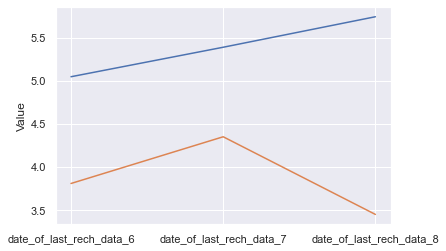

In [49]:
for col in col_group_name:
    df = churn_filtered.groupby('churn_probability')[[col+"_6",col+"_7",col+"_8"]].mean()
    sns.lineplot(data=df.iloc[0],legend=True)
    sns.lineplot(data=df.iloc[1])
    plt.ylabel("Value")
    print(df)
    plt.show()

### Findings
Bivariate Analysis on Categorical columns for high value customers

* <b>The mean value decreases steaply for churn customers and mean value doesn't change for non churn customers across months - </b><br>offnet_mou, total_rech_num, total_og_mou, std_ic_mou, arpu, onnet_mou, std_ic_t2m_mou, std_og_mou, std_ic_t2t_mou, loc_og_t2t_mou, isd_og_mou, total_rech_amt, loc_ic_mou, std_ic_t2f_mou, total_ic_mou, loc_og_t2m_mou, loc_ic_t2m_mou, vol_2g_mb, std_og_t2m_mou, loc_og_mou, std_og_t2t_mou, last_day_rch_amt


* <b>The mean value lower for churn customers and mean value higher for non churn customers across months -</b><br> loc_og_t2f_mou, ic_others, loc_ic_t2f_mou, monthly_2g, loc_ic_t2t_mou, loc_og_t2t_mou, date_of_last_rech_data, night_pck_user, loc_ic_mou, std_ic_t2f_mou, std_og_t2f_mou, roam_og_mou, roam_ic_mou, total_ic_mou, loc_og_t2m_mou, loc_ic_t2m_mou, loc_og_mou


* <b>The mean value decreases steaply for churn customers and mean value increases for non churn customers across months -</b><br>vol_3g_mb, max_rech_data, fb_user, sachet_2g, monthly_3g, night_pck_user, av_rech_amt_data, max_rech_amt, isd_ic_mou, sachet_3g, total_rech_data 


* <b>The mean value increases steaplly for churn customers and mean value decreases for non churn customers across months -</b><br>vbc_3g

* <b>The mean value increases steaplly for churn customers and mean value doesn't change for non churn customers across months -</b><br>date_of_last_rech

### Coorelation Matix

In [50]:
((churn_filtered.corr()>0.7).sum()-1).sort_values(ascending =False)

loc_ic_mou_8                6
loc_ic_mou_7                6
total_ic_mou_7              6
total_ic_mou_6              5
arpu_7                      5
total_ic_mou_8              5
loc_ic_mou_6                5
loc_ic_t2m_mou_7            5
total_og_mou_7              5
std_og_mou_7                5
std_og_mou_8                4
loc_og_mou_8                4
std_og_t2t_mou_7            4
std_og_t2m_mou_7            4
loc_ic_t2m_mou_6            4
total_og_mou_6              4
total_og_mou_8              4
loc_og_mou_6                4
loc_ic_t2m_mou_8            4
std_ic_mou_7                4
loc_og_mou_7                4
std_og_mou_6                4
onnet_mou_7                 4
offnet_mou_7                4
std_og_t2m_mou_6            3
av_rech_amt_data_6          3
av_rech_amt_data_7          3
loc_og_t2t_mou_6            3
total_rech_amt_8            3
total_rech_amt_7            3
onnet_mou_8                 3
std_og_t2m_mou_8            3
loc_og_t2t_mou_7            3
offnet_mou

In [51]:
churn_rate = (sum(churn_imputed['churn_probability'])/len(churn_imputed['churn_probability'].index))*100
churn_rate

10.188716981671167

## Slipting the data into train and test

In [52]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X = churn_imputed.drop(['churn_probability','id'],axis=1)

# Putting response variable to y
y = churn_imputed['churn_probability']

In [53]:
X

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.0,0.0,65.09,204.99,1.01,0.00,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.00,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.00,0.0,0.00,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,8,21,7,65,65,0,-1,-1,-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,1958,0.00,0.00,0.00
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.00,0.0,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,18,21,5,0,0,0,-1,23,-1,0.0,1.0,0.0,0.0,145.0,0.0,0.0,145.0,0.0,0.00,352.91,0.00,0.00,3.96,0.00,-1.0,0.0,-1.0,0,0,0,0,0,0,0,1,0,0,0,0,-1.0,1.0,-1.0,710,0.00,0.00,0.00
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.00,0.00,0.0,0.0,28.94,84.99,0.00,0.00,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.00,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,19,9,7,70,50,0,-1,-1,-1,0.0,0.0,0.0,0.0,0.0,0.0

In [54]:
y

0        0
1        0
2        0
3        0
4        0
        ..
69994    0
69995    0
69996    0
69997    0
69998    0
Name: churn_probability, Length: 69999, dtype: int64

In [55]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.8,test_size=0.2,random_state=100)

## Scaling the features using the StandardScaler

In [56]:
from sklearn.preprocessing import StandardScaler

In [57]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55999 entries, 59805 to 38408
Columns: 145 entries, arpu_6 to vbc_3g_8
dtypes: float64(114), int64(31)
memory usage: 62.4 MB


In [58]:
cols = X_train.columns

In [59]:
scaler = StandardScaler()

X_train[cols] = scaler.fit_transform(X_train[cols])

In [60]:
X_train

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
59805,-0.768898,0.507190,-0.769612,-0.432275,-0.232316,-0.410012,-0.614878,-0.180234,-0.580777,-0.164073,-0.122578,-0.126411,-0.188713,-0.162486,-0.143331,-0.299960,0.082106,-0.286321,-0.556160,0.293999,-0.574511,-0.276992,-0.277848,-0.271459,-0.198899,-0.168218,-0.212420,-0.550494,0.220581,-0.551481,-0.308050,-0.306378,-0.301178,-0.341697,-0.335962,-0.323522,-0.131497,-0.123071,-0.130952,-0.425383,-0.421120,-0.410786,-0.026971,-0.025406,-0.027141,-0.247816,-0.216212,-0.279964,-0.088010,-0.014111,-0.014358,-0.659638,-0.251981,-0.634036,-0.337947,-0.309467,-0.322314,-0.616727,-0.253067,-0.631570,-0.303131,-0.285386,-0.292489,-0.646795,-0.391769,-0.645050,-0.182617,-0.174680,-0.182640,-0.266992,-0.263018,-0.266435,-0.123425,-0.130348,-0.122739,-0.312680,-0.302569,-0.306608,-0.693072,-0.474795,-0.691403,-0.359433,-0.231931,-0.260437,-0.115305,-0.125885,-0.128254,-0.070572,-0.074598,-0.073130,-1.070327,-0.947629,-0.724537,-0.793292,-0.769220,-0.735347,-0.853311,-0.857460,-0.860033,-1.102151,-0.240962,-0.05238,-0.640040,-0.617387,-0.613925,-0.447825,-0.449512,-0.458690,-0.352579,-0.353930,-0.355083,-0.406864,-0.411383,-0.414802,-0.379001,-0.388028,-0.389927,-0.248675,-0.243972,-0.236860,-0.218024,-0.229730,-0.234240,-0.570942,-0.577755,-0.588103,-0.268239,-0.273015,-0.269532,-0.262939,-0.268468,-0.27573,-0.209883,-0.201927,-0.212607,-0.128093,-0.127708,-0.124883,-0.571648,-0.577412,-0.585055,-0.463407,-0.252737,-0.246090,-0.230440
32717,-0.365549,-0.285280,-0.557039,0.508870,0.154069,0.211406,0.305687,-0.138229,-0.148591,-0.164073,0.126349,-0.126411,-0.188713,-0.149115,-0.143331,1.249430,0.682948,0.923971,1.105095,0.184641,0.349501,-0.276992,-0.277848,-0.271459,4.037476,0.968474,1.907889,1.444343,0.529849,0.782479,-0.135106,-0.208641,-0.273085,-0.340685,-0.222722,-0.323522,-0.131497,-0.123071,-0.130952,-0.312022,-0.283662,-

In [61]:
X_test[cols] = scaler.transform(X_test[cols])

In [62]:
X_test

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_6,vbc_3g_7,vbc_3g_8
3425,-0.725879,0.808836,-0.783831,-0.343152,1.280236,-0.410012,-0.614685,1.990935,-0.575911,-0.150073,-0.119878,-0.126411,0.170921,0.259108,-0.143331,-0.299960,-0.132216,-0.286321,-0.556160,-0.270231,-0.574511,-0.276992,-0.277848,-0.271459,-0.198899,1.039196,-0.212420,-0.550494,-0.266934,-0.551481,-0.308050,1.564478,-0.301178,-0.341697,2.398089,-0.323522,-0.131497,-0.123071,-0.130952,-0.425383,2.580190,-0.410786,-0.026971,-0.025406,-0.027141,-0.247816,3.069444,-0.187701,-0.088010,-0.014111,-0.014358,-0.659638,2.166393,-0.630782,-0.337947,-0.183193,-0.322314,-0.616727,-0.396047,-0.622889,-0.303131,-0.285386,-0.292489,-0.646795,-0.411012,-0.639326,-0.182617,-0.014742,-0.182640,-0.266992,-0.200311,-0.266435,-0.123425,-0.130348,-0.122739,-0.312680,-0.175308,-0.306608,-0.693072,-0.395540,-0.678573,-0.359433,-0.231931,-0.260437,-0.115305,0.106372,-0.091081,-0.070572,-0.074598,-0.078220,-0.363473,1.593521,-0.724537,-0.696522,0.761432,-0.735347,-0.690220,-0.413342,-0.860033,-0.450878,-0.932518,-0.05238,-0.640040,-0.513433,-0.613925,-0.447825,-0.449512,-0.458690,-0.352579,-0.353930,-0.355083,-0.406864,-0.411383,-0.414802,-0.379001,-0.388028,-0.389927,-0.248675,-0.243972,-0.236860,-0.218024,-0.229730,-0.234240,-0.570942,-0.577755,-0.588103,-0.268239,-0.273015,-0.269532,-0.262939,-0.268468,-0.275730,-0.209883,-0.201927,-0.212607,-0.128093,-0.127708,-0.124883,-0.571648,-0.577412,-0.585055,-0.391951,-0.252737,-0.246090,-0.230440
33067,1.433047,0.826856,-0.082563,1.053530,0.495545,-0.326266,3.186176,0.666692,-0.277036,1.065296,1.376022,1.195482,1.215215,2.934900,1.742636,0.773804,0.279201,-0.286321,2.926417,-0.168844,-0.574511,-0.243774,-0.136464,-0.271459,-0.198899,0.761452,0.575394,2.324601,0.062557,-0.551481,0.645297,0.110118,-0.301178,1.903873,0.579225,-0.323522,-0.131497,-0.123071,-0.130952,1.653108,0.447338,-0.410786,-0.026971

In [63]:
# import required libraries
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [64]:
#methods to calculate metrics
def calculate_metrics(actual,predicted):
    print("Accuracy score :",metrics.accuracy_score(actual,predicted))
    print("Recall score :",metrics.recall_score(actual,predicted))
    print("F1 score :",metrics.f1_score(actual,predicted))
    #print("Confusion matrix : ")
    confusion_matrix = metrics.confusion_matrix(actual,predicted)
    #print(confusion_matrix)
    TP = confusion_matrix[1,1] # true positive 
    TN = confusion_matrix[0,0] # true negatives
    FP = confusion_matrix[0,1] # false positives
    FN = confusion_matrix[1,0] # false negatives
    
def calculate_metrics_prob(actual,predicted_prob):
    print("AUC score :",metrics.roc_auc_score(actual,predicted_prob))
    
def plot_metrics(model,X,y):
    metrics.plot_confusion_matrix(model,X,y)
    plt.show()
    metrics.plot_roc_curve(model,X,y)
    plt.show()

In [65]:
#common method to predict on train and test data
def predict(model,X_train,X_test,y_train,y_test):
    print("MODEL REPORT :")
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    y_pred_prob_train = model.predict_proba(X_train)[:,1]
    y_pred_prob_test = model.predict_proba(X_test)[:,1]
    
    print("TRAIN METRICS")
    calculate_metrics(y_train, y_pred_train)
    calculate_metrics_prob(y_train, y_pred_prob_train)
    print("TEST METRICS")
    calculate_metrics(y_test, y_pred_test)
    calculate_metrics_prob(y_test, y_pred_prob_test)
    
    print("TRAIN PLOTS")
    plot_metrics(model,X_train,y_train)
    print("TEST PLOTS")
    plot_metrics(model,X_test,y_test)

## We can look at recall metric to see the correct number of churn customers and accuracy for the overall performance

## Logistic Regression (1st Model)

In [66]:
# Logistic regression model
logreg = LogisticRegression(class_weight='balanced')
logreg = logreg.fit(X_train,y_train)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.7927284415793139
Recall score : 0.8662020905923344
F1 score : 0.4614171036146814
AUC score : 0.8981583411863828
TEST METRICS
Accuracy score : 0.7956428571428571
Recall score : 0.8563218390804598
F1 score : 0.4545281220209723
AUC score : 0.8938130871112666
TRAIN PLOTS


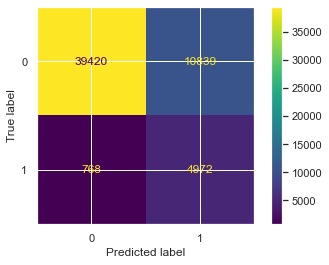

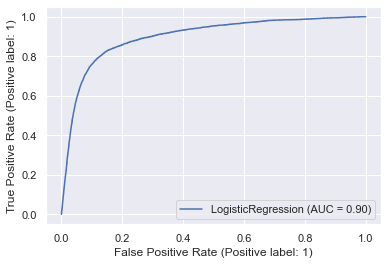

TEST PLOTS


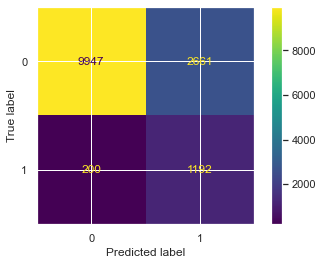

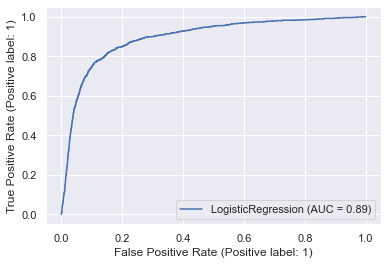

In [67]:
predict(logreg,X_train,X_test,y_train,y_test)

## RFE + Logistic Regression (2nd Model)

In [68]:
#rfelogreg = LogisticRegression(class_weight='balanced')

#rfe = RFE(rfelogreg, n_features_to_select= 15)             # running RFE with 30 variables as output
#rfe = rfe.fit(X_train, y_train)

#col_top15 = X_train.columns[rfe.support_]

In [69]:
col_top15 = ['arpu_6', 'offnet_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8',
       'std_og_t2m_mou_8', 'og_others_8', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'total_ic_mou_7', 'total_ic_mou_8',
       'spl_ic_mou_8', 'total_rech_num_8', 'last_day_rch_amt_8', 'fb_user_8']

In [70]:
# Logistic regression model
logreg_top15 = LogisticRegression(class_weight='balanced')
logreg_top15 = logreg_top15.fit(X_train[col_top15],y_train)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.7757281380024643
Recall score : 0.8611498257839721
F1 score : 0.4404544441969258
AUC score : 0.8922219453752211
TEST METRICS
Accuracy score : 0.78
Recall score : 0.8577586206896551
F1 score : 0.4367227505486467
AUC score : 0.8915944686187205
TRAIN PLOTS


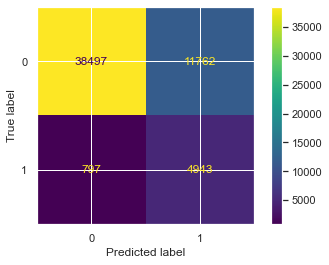

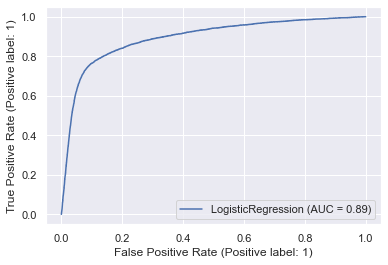

TEST PLOTS


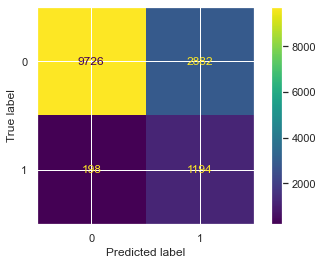

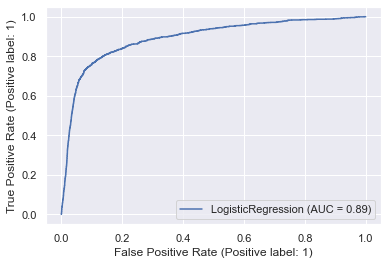

In [71]:
predict(logreg_top15,X_train[col_top15],X_test[col_top15],y_train,y_test)

## RFE + Logistic Regression + Manual Threshold Tunning (3rd Model)

In [72]:
y_train_pred_df = pd.DataFrame()

In [73]:
logreg_top15.predict_proba(X_train[col_top15])

array([[2.34417084e-01, 7.65582916e-01],
       [9.65590128e-01, 3.44098723e-02],
       [9.45859468e-01, 5.41405323e-02],
       ...,
       [4.87200918e-01, 5.12799082e-01],
       [7.51644164e-01, 2.48355836e-01],
       [9.99966864e-01, 3.31359798e-05]])

In [74]:
y_train_pred_df["y_train"] = y_train
y_train_pred_df["y_pred_train"] = logreg_top15.predict(X_train[col_top15])
y_train_pred_df["y_prob_train"] = logreg_top15.predict_proba(X_train[col_top15])[:,1]

# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.y_prob_train.map(lambda x: 1 if x > i else 0)

In [75]:
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
59805,1,1,0.765583,1,1,1,1,1,1,1,1,0,0
32717,0,0,0.034410,1,0,0,0,0,0,0,0,0,0
5964,0,0,0.054141,1,0,0,0,0,0,0,0,0,0
47623,0,0,0.002587,1,0,0,0,0,0,0,0,0,0
31881,0,0,0.038070,1,0,0,0,0,0,0,0,0,0


In [76]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame(columns = ['prob','accuracy','sensi','speci'])
# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_df.y_train, y_train_pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.102502  1.000000  0.000000
0.1   0.1  0.402436  0.968467  0.337790
0.2   0.2  0.515670  0.947909  0.466305
0.3   0.3  0.611332  0.923693  0.575658
0.4   0.4  0.697816  0.894948  0.675302
0.5   0.5  0.775728  0.861150  0.765972
0.6   0.6  0.844140  0.810976  0.847928
0.7   0.7  0.898695  0.739547  0.916871
0.8   0.8  0.915481  0.414460  0.972701
0.9   0.9  0.900802  0.076481  0.994946


<AxesSubplot:xlabel='prob'>

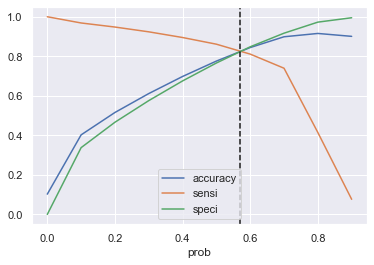

In [77]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.axvline(x = 0.57, color='k', linestyle='--')
plt.show()

In [78]:
y_train_pred_df['final_predicted'] = y_train_pred_df.y_prob_train.map(lambda x: 1 if x > 0.6 else 0)
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
59805,1,1,0.765583,1,1,1,1,1,1,1,1,0,0,1
32717,0,0,0.034410,1,0,0,0,0,0,0,0,0,0,0
5964,0,0,0.054141,1,0,0,0,0,0,0,0,0,0,0
47623,0,0,0.002587,1,0,0,0,0,0,0,0,0,0,0
31881,0,0,0.038070,1,0,0,0,0,0,0,0,0,0,0


In [79]:
calculate_metrics(y_train, y_train_pred_df.final_predicted)
calculate_metrics_prob(y_train, y_train_pred_df.y_prob_train)

Accuracy score : 0.8441400739298917
Recall score : 0.8109756097560976
F1 score : 0.5161326089366892
AUC score : 0.8922219453752211


In [80]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df["y_test"] = y_test
y_test_pred_df["y_prob_test"] = logreg_top15.predict_proba(X_test[col_top15])[:,1]
y_test_pred_df["final_predicted"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_test, y_test_pred_df.final_predicted)
calculate_metrics_prob(y_test, y_test_pred_df.y_prob_test)

Accuracy score : 0.849
Recall score : 0.8081896551724138
F1 score : 0.5155820348304309
AUC score : 0.8915944686187205


## Decision Tree (4rd Model)

In [81]:
#dt = DecisionTreeClassifier(random_state=42,class_weight='balanced')

# Create the parameter grid based on the results of random search 
#params = {
#    'max_depth': [2, 3, 5, 10, 20],
#    'min_samples_leaf': [20, 50, 100, 200],
#    'criterion': ["gini", "entropy"]
#}

# Instantiate the grid search model
#grid_search = GridSearchCV(estimator=dt, 
#                           param_grid=params, 
#                           cv=5, n_jobs=-1, verbose=1, scoring = "accuracy")

In [82]:
#grid_search.fit(X_train, y_train)

In [83]:
#grid_search.best_estimator_

In [84]:
#dt_best = grid_search.best_estimator_
dt_best = DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, min_samples_leaf=100, random_state=42)
dt_best.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, min_samples_leaf=100, random_state=42)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.9009268022643262
Recall score : 0.7682926829268293
F1 score : 0.6138641425389755
AUC score : 0.9041094950456288
TEST METRICS
Accuracy score : 0.9021428571428571
Recall score : 0.757183908045977
F1 score : 0.6060954571592868
AUC score : 0.9012620328180613
TRAIN PLOTS


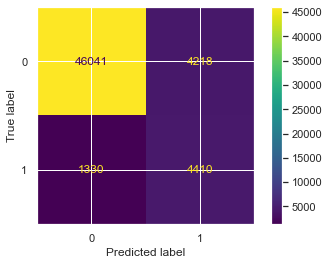

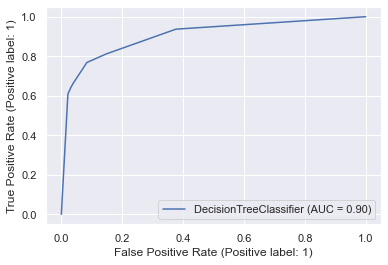

TEST PLOTS


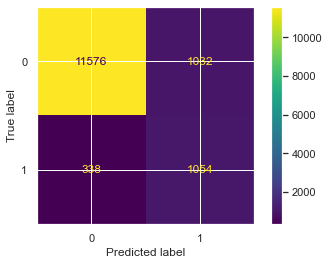

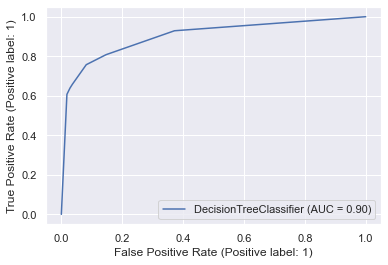

In [85]:
predict(dt_best,X_train,X_test,y_train,y_test)

## GradientBoosting (5th Model)

In [86]:
gb = GradientBoostingClassifier(random_state=100) # default 

In [87]:
# Fit the model to our train and target
gb.fit(X_train, y_train)

GradientBoostingClassifier(random_state=100)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.944570438757835
Recall score : 0.6508710801393728
F1 score : 0.7065052950075641
AUC score : 0.9556253103696372
TEST METRICS
Accuracy score : 0.9445
Recall score : 0.625
F1 score : 0.6912991656734206
AUC score : 0.9508820229994457
TRAIN PLOTS


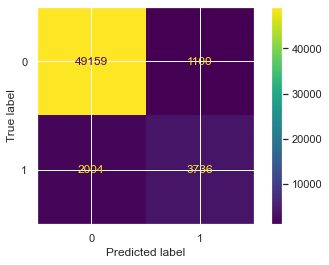

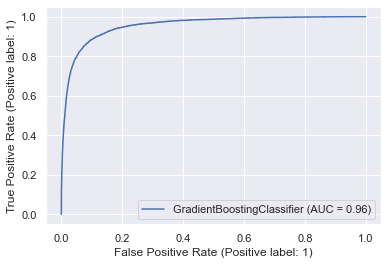

TEST PLOTS


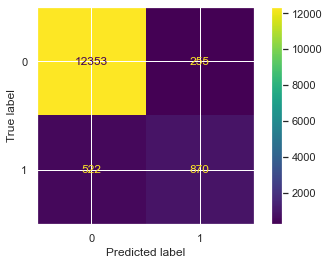

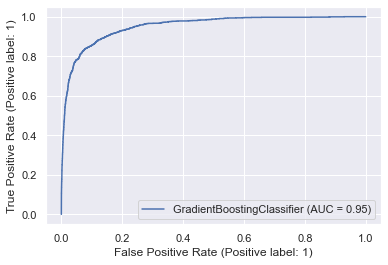

In [88]:
predict(gb,X_train,X_test,y_train,y_test)

## PCA 

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'Cumulative Explained Variance as a Function of the Number of Components')

Text(0, 0.5, 'Cumulative Explained variance')

Text(0.5, 0, 'Principal components')

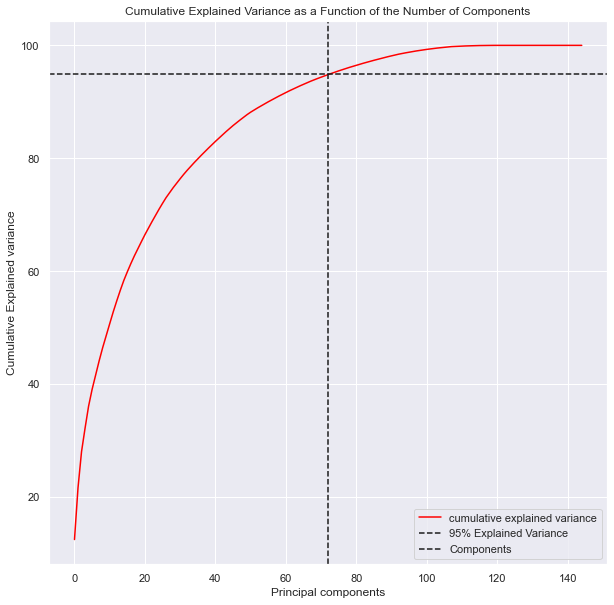

In [89]:
pca = PCA()
pca = pca.fit(X_train)
cumsum = np.cumsum(pca.explained_variance_ratio_)*100
d = [n for n in range(len(cumsum))]
plt.figure(figsize=(10, 10))
plt.plot(d,cumsum, color = 'red',label='cumulative explained variance')
plt.title('Cumulative Explained Variance as a Function of the Number of Components')
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal components')
plt.axhline(y = 95, color='k', linestyle='--', label = '95% Explained Variance')
plt.axvline(x = 72, color='k', linestyle='--', label = 'Components')
plt.legend(loc='best')
plt.show()

In [90]:
from sklearn.decomposition import PCA
pca = PCA(0.95) 
pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

PCA(n_components=0.95)

<Figure size 1080x1080 with 0 Axes>

<AxesSubplot:>

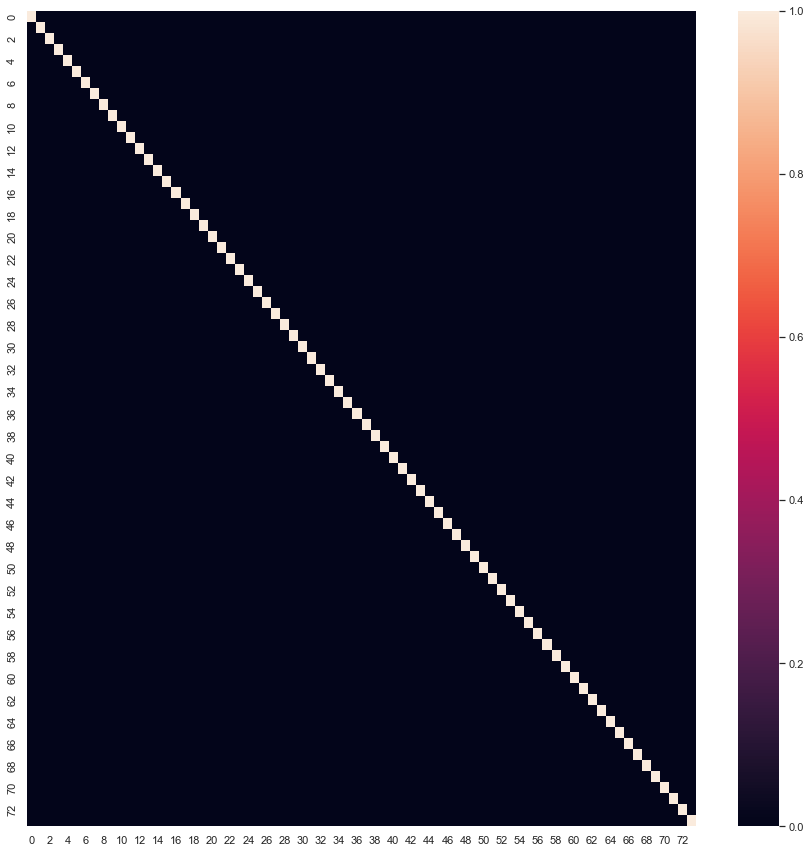

In [91]:
plt.figure(figsize=[15,15])
sns.heatmap(np.corrcoef(X_train_pca.transpose()))

In [92]:
X_train_pca.shape

(55999, 74)

In [93]:
X_test_pca.shape

(14000, 74)

## PCA + Logistic Regression (6th Model)

In [94]:
# Logistic regression model
logreg_pca = LogisticRegression(class_weight='balanced')
logreg_pca = logreg_pca.fit(X_train_pca,y_train)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.7877283522920052
Recall score : 0.8655052264808363
F1 score : 0.4552994547037529
AUC score : 0.8944762125222706
TEST METRICS
Accuracy score : 0.7932857142857143
Recall score : 0.8577586206896551
F1 score : 0.4521014767133662
AUC score : 0.891912211823181
TRAIN PLOTS


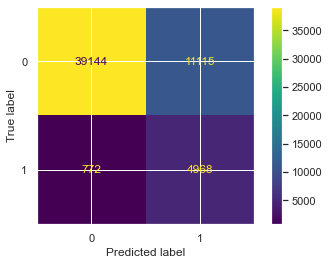

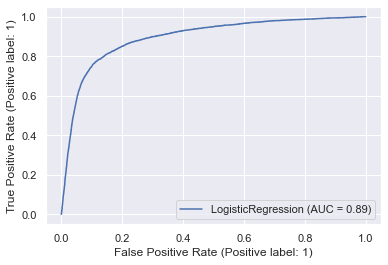

TEST PLOTS


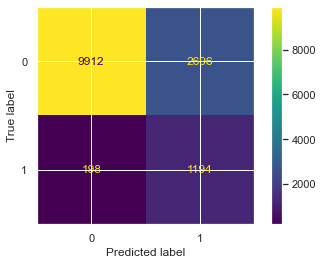

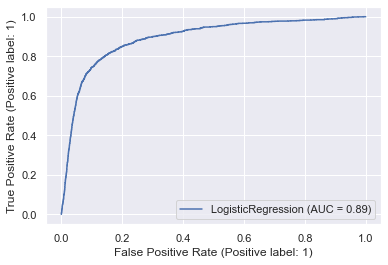

In [95]:
predict(logreg_pca,X_train_pca,X_test_pca,y_train,y_test)

In [96]:
y_train_pred_df = pd.DataFrame()

In [97]:
logreg_pca.predict_proba(X_train_pca)

array([[2.00934169e-01, 7.99065831e-01],
       [9.45140371e-01, 5.48596288e-02],
       [9.80641910e-01, 1.93580895e-02],
       ...,
       [7.77924409e-01, 2.22075591e-01],
       [6.15695819e-01, 3.84304181e-01],
       [9.99855634e-01, 1.44365808e-04]])

In [98]:
y_train_pred_df["y_train"] = y_train
y_train_pred_df["y_pred_train"] = logreg_pca.predict(X_train_pca)
y_train_pred_df["y_prob_train"] = logreg_pca.predict_proba(X_train_pca)[:,1]

# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.y_prob_train.map(lambda x: 1 if x > i else 0)

In [99]:
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
59805,1,1,0.799066,1,1,1,1,1,1,1,1,0,0
32717,0,0,0.054860,1,0,0,0,0,0,0,0,0,0
5964,0,0,0.019358,1,0,0,0,0,0,0,0,0,0
47623,0,0,0.007135,1,0,0,0,0,0,0,0,0,0
31881,0,0,0.031863,1,0,0,0,0,0,0,0,0,0


In [100]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame(columns = ['prob','accuracy','sensi','speci'])
# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_df.y_train, y_train_pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.102502  1.000000  0.000000
0.1   0.1  0.427258  0.971254  0.365129
0.2   0.2  0.545045  0.950000  0.498796
0.3   0.3  0.637029  0.928049  0.603792
0.4   0.4  0.717566  0.899477  0.696791
0.5   0.5  0.787728  0.865505  0.778846
0.6   0.6  0.847140  0.809930  0.851390
0.7   0.7  0.893909  0.720035  0.913767
0.8   0.8  0.913552  0.482404  0.962793
0.9   0.9  0.901927  0.119512  0.991285


<AxesSubplot:xlabel='prob'>

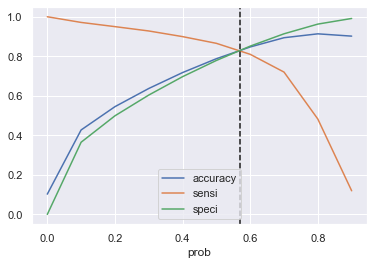

In [101]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.axvline(x = 0.57, color='k', linestyle='--')
plt.show()

In [102]:
y_train_pred_df['final_predicted'] = y_train_pred_df.y_prob_train.map(lambda x: 1 if x > 0.6 else 0)
y_train_pred_df.head()

,y_train,y_pred_train,y_prob_train,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
59805,1,1,0.799066,1,1,1,1,1,1,1,1,0,0,1
32717,0,0,0.054860,1,0,0,0,0,0,0,0,0,0,0
5964,0,0,0.019358,1,0,0,0,0,0,0,0,0,0,0
47623,0,0,0.007135,1,0,0,0,0,0,0,0,0,0,0
31881,0,0,0.031863,1,0,0,0,0,0,0,0,0,0,0


In [103]:
calculate_metrics(y_train, y_train_pred_df.final_predicted)
calculate_metrics_prob(y_train, y_train_pred_df.y_prob_train)

Accuracy score : 0.8471401275022769
Recall score : 0.8099303135888501
F1 score : 0.5206630081756075
AUC score : 0.8944762125222706


In [104]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df["y_test"] = y_test
y_test_pred_df["y_prob_test"] = logreg_pca.predict_proba(X_test_pca)[:,1]
y_test_pred_df["final_predicted"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_test, y_test_pred_df.final_predicted)
calculate_metrics_prob(y_test, y_test_pred_df.y_prob_test)

Accuracy score : 0.8508571428571429
Recall score : 0.8010057471264368
F1 score : 0.5164427975914776
AUC score : 0.891912211823181


## PCA + Decision Tree (7th Model)

In [105]:
#dt_pca = DecisionTreeClassifier(random_state=42,class_weight='balanced')

# Create the parameter grid based on the results of random search 
#params = {
#    'max_depth': [2, 3, 5, 10, 20, 30, 40],
#    'min_samples_leaf': [20, 50, 100, 200, 350, 500],
#    'criterion': ["gini", "entropy"]
#}

# Instantiate the grid search model
#grid_search = GridSearchCV(estimator=dt_pca, param_grid=params, cv=5, n_jobs=-1, verbose=1, scoring = "accuracy")

In [106]:
#%%time
#grid_search.fit(X_train_pca, y_train)

In [107]:
#dt_pca_best = grid_search.best_estimator_
dt_pca_best = DecisionTreeClassifier(class_weight='balanced', criterion='entropy',max_depth=3, min_samples_leaf=20, random_state=42)
dt_pca_best.fit(X_train_pca, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, min_samples_leaf=20, random_state=42)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.8411757352809872
Recall score : 0.6627177700348432
F1 score : 0.46103502605744756
AUC score : 0.816784413878964
TEST METRICS
Accuracy score : 0.8440714285714286
Recall score : 0.6616379310344828
F1 score : 0.45763975155279507
AUC score : 0.820423409557515
TRAIN PLOTS


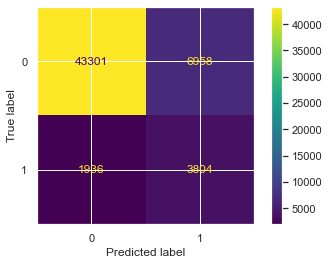

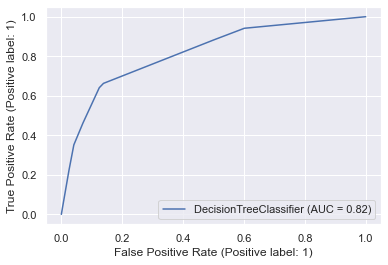

TEST PLOTS


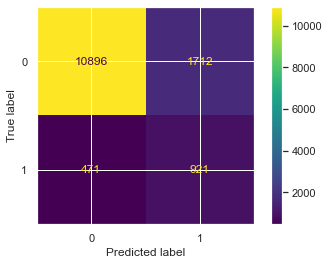

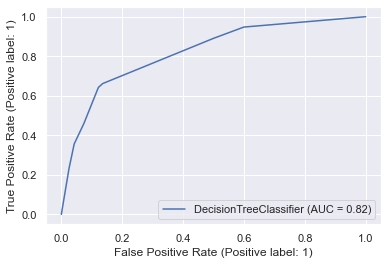

In [108]:
predict(dt_pca_best,X_train_pca,X_test_pca,y_train,y_test)

## PCA + Gradient Boosting (8th Model)

In [109]:
gb_pca = GradientBoostingClassifier(random_state=100) # default 

In [110]:
# Fit the model to our train and target
gb_pca.fit(X_train_pca, y_train)

GradientBoostingClassifier(random_state=100)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.9262486830121966
Recall score : 0.4337979094076655
F1 score : 0.5466520307354555
AUC score : 0.9179312658685846
TEST METRICS
Accuracy score : 0.922
Recall score : 0.40086206896551724
F1 score : 0.5054347826086957
AUC score : 0.9128882774665968
TRAIN PLOTS


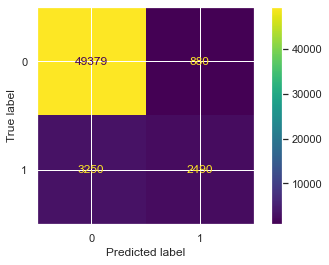

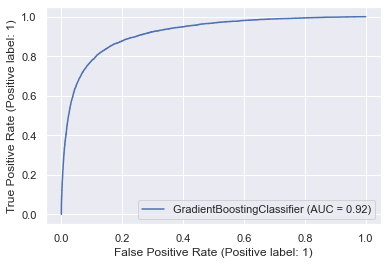

TEST PLOTS


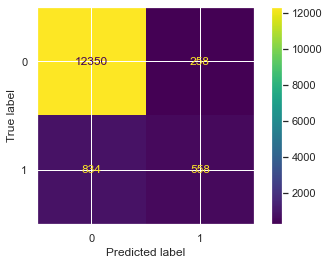

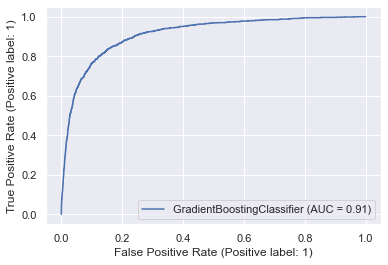

In [111]:
predict(gb_pca,X_train_pca,X_test_pca,y_train,y_test)

## PCA + RandomForest (9th Model)

In [112]:
#rf = RandomForestClassifier(random_state=42, n_jobs=-1,class_weight='balanced')

#params = {
#    'max_depth': [2,5,10,20,30],
#    'min_samples_leaf': [20,40,80,150,200,300,500]
#}

#grid_search = GridSearchCV(estimator=rf,param_grid=params,cv = 5,n_jobs=-1, verbose=4, scoring="accuracy")

#%%time
#grid_search.fit(X_train_pca, y_train)

#grid_search.best_score_

In [113]:
#rf_pca_best = grid_search.best_estimator_
rf_pca_best = RandomForestClassifier(class_weight='balanced', max_depth=20,min_samples_leaf=20, n_jobs=-1, random_state=42)
rf_pca_best.fit(X_train_pca, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=20,
                       min_samples_leaf=20, n_jobs=-1, random_state=42)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.9291237343523991
Recall score : 0.8939024390243903
F1 score : 0.721101819970487
AUC score : 0.9759233962499341
TEST METRICS
Accuracy score : 0.9007142857142857
Recall score : 0.6738505747126436
F1 score : 0.5744029393753827
AUC score : 0.9085215804415367
TRAIN PLOTS


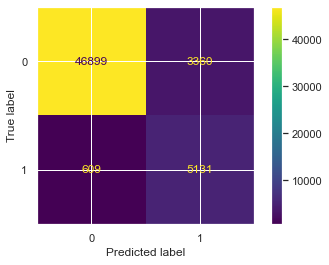

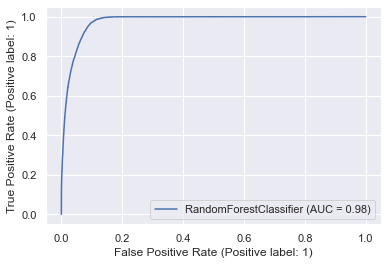

TEST PLOTS


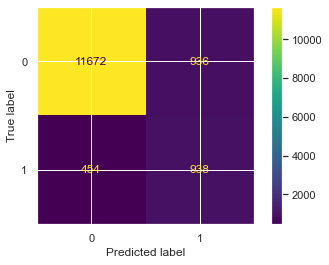

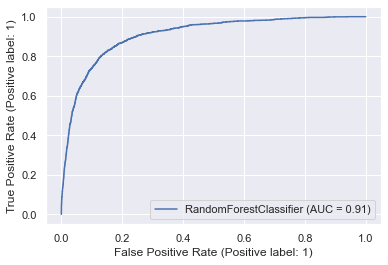

In [114]:
predict(rf_pca_best,X_train_pca,X_test_pca,y_train,y_test)

## Evaluating the model on the final test data

In [115]:
churn_test = pd.read_csv("test.csv")
churn_test

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.00,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.00,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.00,0.00,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.00,0.00,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.00,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.00,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.00,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.00,0.00,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.00,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/201

In [116]:
churn_test_imputed = impute_churn_data(churn_test)

Imputing data with 0
Imputing data with -1
Converting date columns to days from last date of the month
Dropping columns with more than 70% missing data
Droping  count_rech_2g_6
count_rech_2g_6  not present
Droping  count_rech_2g_7
count_rech_2g_7  not present
Droping  count_rech_2g_8
count_rech_2g_8  not present
Droping  count_rech_3g_6
count_rech_3g_6  not present
Droping  count_rech_3g_7
count_rech_3g_7  not present
Droping  count_rech_3g_8
count_rech_3g_8  not present
Droping  arpu_3g_6
arpu_3g_6  not present
Droping  arpu_3g_7
arpu_3g_7  not present
Droping  arpu_3g_8
arpu_3g_8  not present
Droping  arpu_2g_6
arpu_2g_6  not present
Droping  arpu_2g_7
arpu_2g_7  not present
Droping  arpu_2g_8
arpu_2g_8  not present
Dropping columns with only one unique value in the column
Droping  circle_id
circle_id  not present
Droping  loc_og_t2o_mou
loc_og_t2o_mou  not present
Droping  std_og_t2o_mou
std_og_t2o_mou  not present
Droping  loc_ic_t2o_mou
loc_ic_t2o_mou  not present
Droping  last_da

In [117]:
churn_solution = pd.read_csv("solution.csv")
churn_solution.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,1
3,70002,0
4,70003,0


In [118]:
# Putting feature variable to X
X_finaltest = churn_test_imputed.drop('id',axis=1)

# Putting response variable to y
y_finaltest = churn_solution['churn_probability']

In [119]:
X_finaltest_pca = pca.transform(X_finaltest)

## Prediction churn using all the models and checking performance

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.7927284415793139
Recall score : 0.8662020905923344
F1 score : 0.4614171036146814
AUC score : 0.8981583411863828
TEST METRICS
Accuracy score : 0.8960666666666667
Recall score : 0.16541353383458646
F1 score : 0.24503631961259076
AUC score : 0.7926437608344431
TRAIN PLOTS


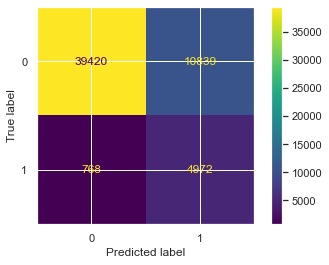

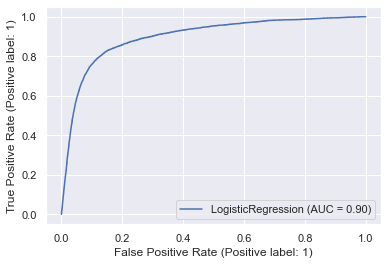

TEST PLOTS


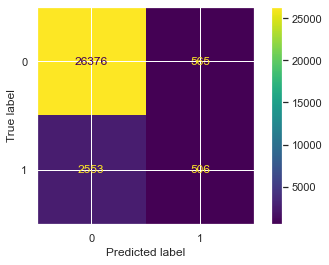

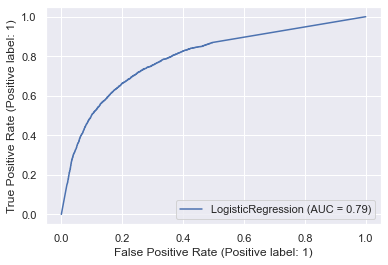

In [120]:
predict(logreg,X_train,X_finaltest,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.7757281380024643
Recall score : 0.8611498257839721
F1 score : 0.4404544441969258
AUC score : 0.8922219453752211
TEST METRICS
Accuracy score : 0.8406666666666667
Recall score : 0.7335730630925139
F1 score : 0.4842468709538197
AUC score : 0.8515532876746553
TRAIN PLOTS


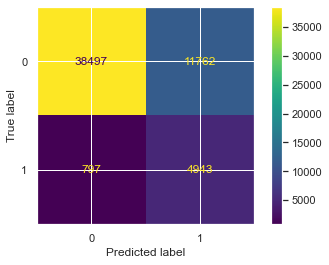

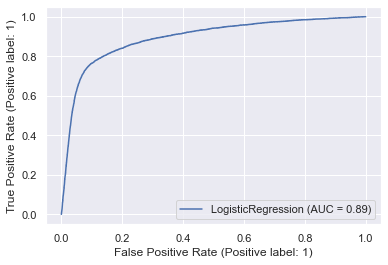

TEST PLOTS


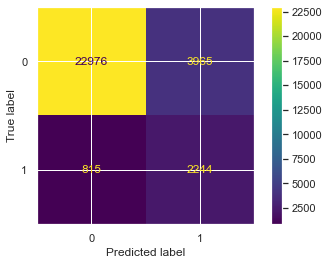

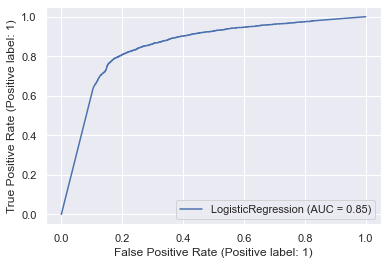

In [121]:
predict(logreg_top15,X_train[col_top15],X_finaltest[col_top15],y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.9009268022643262
Recall score : 0.7682926829268293
F1 score : 0.6138641425389755
AUC score : 0.9041094950456288
TEST METRICS
Accuracy score : 0.8980333333333334
Recall score : 0.0
F1 score : 0.0
AUC score : 0.5
TRAIN PLOTS


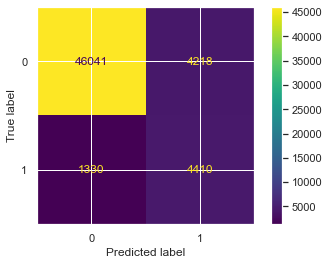

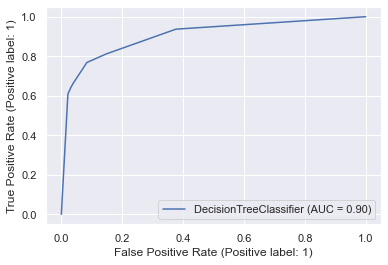

TEST PLOTS


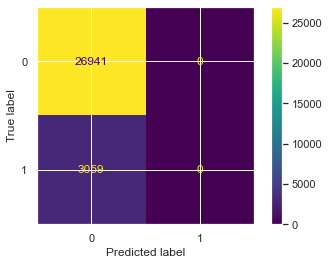

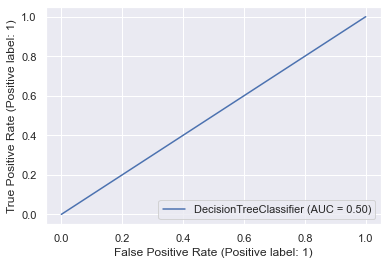

In [122]:
predict(dt_best,X_train,X_finaltest,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.944570438757835
Recall score : 0.6508710801393728
F1 score : 0.7065052950075641
AUC score : 0.9556253103696372
TEST METRICS
Accuracy score : 0.14666666666666667
Recall score : 0.6410591696632887
F1 score : 0.13285007790800082
AUC score : 0.363754825889984
TRAIN PLOTS


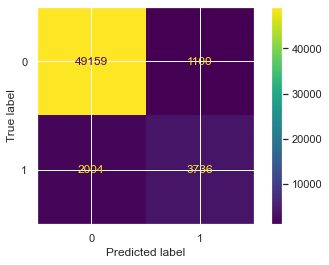

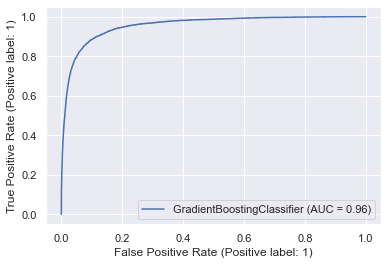

TEST PLOTS


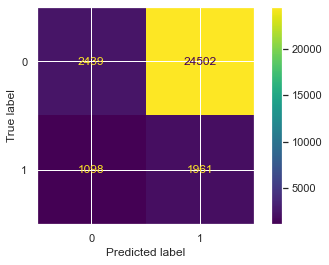

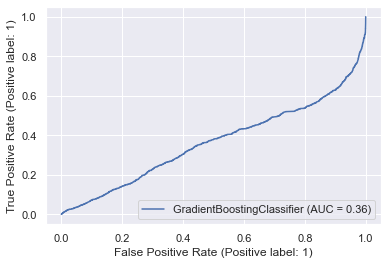

In [123]:
predict(gb,X_train,X_finaltest,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.8411757352809872
Recall score : 0.6627177700348432
F1 score : 0.46103502605744756
AUC score : 0.816784413878964
TEST METRICS
Accuracy score : 0.6224333333333333
Recall score : 0.7234390323635175
F1 score : 0.2809623563765632
AUC score : 0.6772269878075199
TRAIN PLOTS


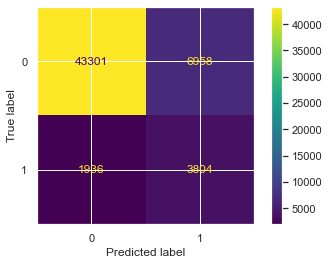

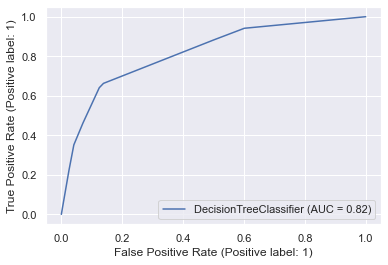

TEST PLOTS


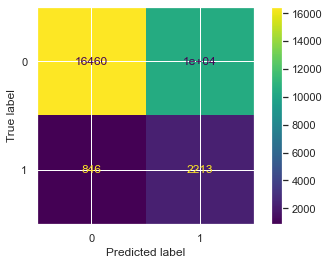

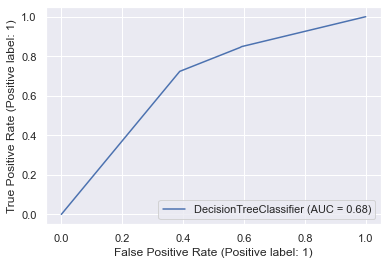

In [124]:
predict(dt_pca_best,X_train_pca,X_finaltest_pca,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.9262486830121966
Recall score : 0.4337979094076655
F1 score : 0.5466520307354555
AUC score : 0.9179312658685846
TEST METRICS
Accuracy score : 0.4177666666666667
Recall score : 0.6319058515854854
F1 score : 0.18122158158721233
AUC score : 0.5047647433274063
TRAIN PLOTS


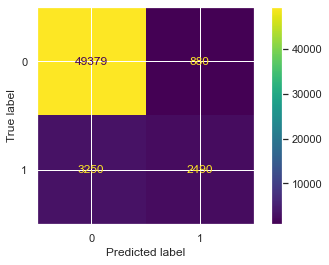

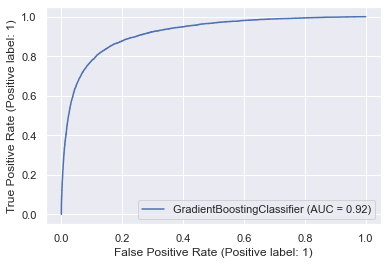

TEST PLOTS


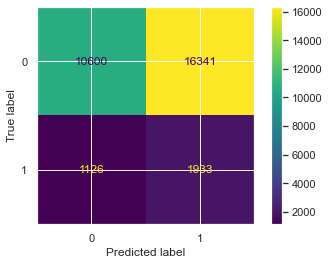

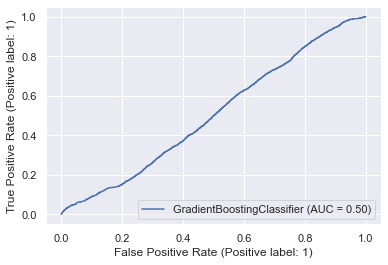

In [125]:
predict(gb_pca,X_train_pca,X_finaltest_pca,y_train,y_finaltest)

MODEL REPORT :
TRAIN METRICS
Accuracy score : 0.9291237343523991
Recall score : 0.8939024390243903
F1 score : 0.721101819970487
AUC score : 0.9759233962499341
TEST METRICS
Accuracy score : 0.8968
Recall score : 0.07093821510297482
F1 score : 0.12294617563739377
AUC score : 0.7796071795839659
TRAIN PLOTS


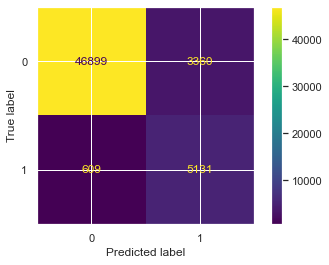

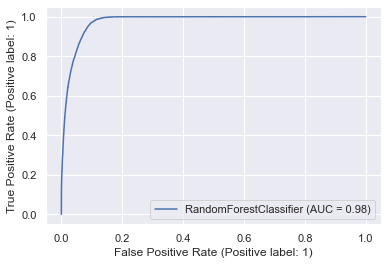

TEST PLOTS


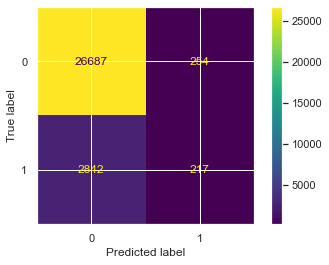

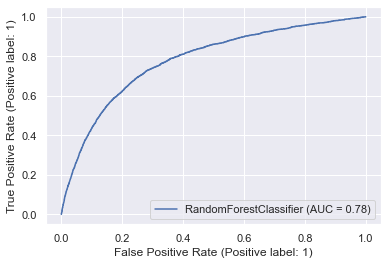

In [126]:
predict(rf_pca_best,X_train_pca,X_finaltest_pca,y_train,y_finaltest)

In [127]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df["y_test"] = y_finaltest
y_test_pred_df["y_prob_test"] = logreg_pca.predict_proba(X_finaltest_pca)[:,1]
y_test_pred_df["final_predicted"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_finaltest, y_test_pred_df.final_predicted)
calculate_metrics_prob(y_finaltest, y_test_pred_df.y_prob_test)

Accuracy score : 0.8941666666666667
Recall score : 0.2392938868911409
F1 score : 0.3155852554429834
AUC score : 0.7966474183370127


In [128]:
y_finaltest_pred_df = pd.DataFrame()
y_finaltest_pred_df["y_test"] = y_finaltest
y_finaltest_pred_df["y_prob_test"] = logreg_top15.predict_proba(X_finaltest[col_top15])[:,1]
y_finaltest_pred_df["final_predicted"] = y_finaltest_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)
calculate_metrics(y_finaltest, y_finaltest_pred_df.final_predicted)
calculate_metrics_prob(y_finaltest, y_finaltest_pred_df.y_prob_test)

Accuracy score : 0.8411
Recall score : 0.7322654462242563
F1 score : 0.48448145344436033
AUC score : 0.8515532876746553


## Final Model we can select the model with highest Recall value as we need to detect more number churn customers

In [129]:
churn_submission = churn_solution.copy()
churn_submission["churn_probability"] = y_finaltest_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)

In [130]:
churn_submission.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,1
3,70002,0
4,70003,0


In [131]:
filename = 'Submission.csv'
churn_submission.to_csv(filename, index=False)
print('Internal submission file generated:' + filename)

Internal submission file generated:Submission.csv


## For Kaggle competetion we can chosse the model with highest accuracy

In [132]:
Kaggle_submission = churn_solution.copy()
Kaggle_submission["churn_probability"] = y_test_pred_df.y_prob_test.map(lambda x: 1 if x > 0.6 else 0)

In [133]:
filename = 'Darshil_Ajay_Parekh.csv'
churn_submission.to_csv(filename, index=False)
print('Kaggle submission file generated:' + filename)

Kaggle submission file generated:Darshil_Ajay_Parekh.csv


## Feature Importance

In [134]:
col_top15

['arpu_6',
 'offnet_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'std_og_t2m_mou_8',
 'og_others_8',
 'loc_ic_t2m_mou_8',
 'loc_ic_t2f_mou_8',
 'loc_ic_mou_8',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'spl_ic_mou_8',
 'total_rech_num_8',
 'last_day_rch_amt_8',
 'fb_user_8']

In [135]:
# create dataframe
feature_importance = pd.DataFrame({'variables': X.columns, 'importance_percentage': dt_best.feature_importances_*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance.head(15)

Sum of importance= 100.0


,variables,importance_percentage
0,loc_ic_mou_8,76.546699
1,roam_og_mou_8,11.499488
2,last_day_rch_amt_8,7.851847
3,fb_user_8,2.281235
4,total_og_mou_8,1.570954
5,total_ic_mou_8,0.249777
6,date_of_last_rech_6,0.000000
7,total_rech_amt_7,0.000000
8,total_rech_amt_8,0.000000
9,max_rech_amt_6,0.000000


In [136]:
# create dataframe
feature_importance = pd.DataFrame({'variables': X.columns, 'importance_percentage': gb.feature_importances_*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance.head(15)

Sum of importance= 100.0


,variables,importance_percentage
0,total_ic_mou_8,61.766516
1,loc_ic_mou_8,14.882013
2,fb_user_8,3.925812
3,roam_og_mou_8,2.997392
4,last_day_rch_amt_8,2.760176
5,arpu_8,1.875953
6,date_of_last_rech_8,1.476014
7,total_rech_num_7,1.184279
8,total_og_mou_8,0.909323
9,std_og_mou_7,0.591212


## Conclusion

<div class="alert alert-block alert-danger">
    <span style='font-family:Georgia'>
        <b>EDA on Continuous Variable: </b>
        <ol>
            <li>NIGHT_PCK_USER - churn rate increases from month 6 to 8 for night_pck_user with -1 value</li>
            <li>MONTHTLY_2g - churn rate increases from month 6 to 8 for monthly_2g with 0 value</li>
            <li>MONTHTLY_3g - churn rate increases from month 6 to 8 for monthly_3g with 0 value</li>
        </ol>
        <b>EDA on Categorical Variable: </b>
        <ol>
            <li>arpu_6 - Values from -210 to 15 have higher churn rate than the average churn rate of 6%</li>
            <li>offnet_mou_6 - Values from -859 to 1073 have higher churn rate than the average churn rate of 6%</li>
            <li>roam_ic_mou_6 - As the values increases the churn rate increases</li>
            <li>loc_og_t2c_mou_6 - Values from 135 to 217 have higher churn rate than the average churn rate of 6%</li>
            <li>std_og_t2t_mou_6 - Values from 120 to 240 have higher churn rate than the average churn rate of 6%</li>
            <li>std_og_t2m_mou_6 - Values from 155 to 345 have higher churn rate than the average churn rate of 6%</li>
            <li>std_og_mou_6 - Values from 612 to 969 have higher churn rate than the average churn rate of 6%</li>
            <li>isd_og_mou_6 - Values from 295 to 1475 have higher churn rate than the average churn rate of 6%</li>
            <li>isd_og_mou_6 - Values from 295 to 1475 have higher churn rate than the average churn rate of 6%</li>
            <li>total_og_mou_6 - As the values increases the churn rate increases</li>
            <li>loc_ic_t2t_mou_6, loc_ic_t2m_mou_6, loc_ic_t2f_mou_6, loc_ic_mou_6, total_ic_mou_6 - As the values increases the churn rate decreases</li>
            <li>total_rech_num_6, total_rech_amt_6, av_rech_amt_data_6 - As the values increases the churn rate increases</li>
            <li>vbc_3g_6 - As the values increases the churn rate decreases</li>
            <li>arpu_7, offnet_mou_7 - As the values increases the churn rate increases</li>
            <li>offnet_mou_7 - Values from 1056 to 3874 have higher churn rate than the average churn rate of 6%</li>
            <li>std_og_t2t_mou_7 - As the values increases the churn rate increases</li>
            <li>std_og_t2m_mou_7 - As the values increases the churn rate increases</li>
            <li>std_og_mou_7 - As the values increases the churn rate increases</li>
            <li>total_og_mou_7- As the values increases the churn rate increases</li>
            <li>vbc_3g_7- Values from 4582 to 5041 have higher churn rate than the average churn rate of 6%</li>
            <li>arpu_8, onnet_mou_8 - As the values increases the churn rate increases</li>
            <li>total_rech_amt_8 - Values from 30 to 33 have higher churn rate than the average churn rate of 6%</li>
            <li>max_rech_data_8 - Values from 466 to 155 have higher churn rate than the average churn rate of 6%</li>
            <li>av_rech_amt_data_8, vol_3g_mb_8, vbc_3g_8- High values have higher churn rate than the average churn rate of 6%</li>
            <li>aon - As the values increases the churn rate decreases</li>
        </ol>
    </span>  
</div>


<div class="alert alert-block alert-warning">
    
* <b>The mean value decreases steaply for churn customers and mean value doesn't change for non churn customers across months for the following- </b><br>offnet_mou, total_rech_num, total_og_mou, std_ic_mou, arpu, onnet_mou, std_ic_t2m_mou, std_og_mou, std_ic_t2t_mou, loc_og_t2t_mou, isd_og_mou, total_rech_amt, loc_ic_mou, std_ic_t2f_mou, total_ic_mou, loc_og_t2m_mou, loc_ic_t2m_mou, vol_2g_mb, std_og_t2m_mou, loc_og_mou, std_og_t2t_mou, last_day_rch_amt</li>


* <b>The mean value lower for churn customers and mean value higher for non churn customers across months for the following-</b><br> loc_og_t2f_mou, ic_others, loc_ic_t2f_mou, monthly_2g, loc_ic_t2t_mou, loc_og_t2t_mou, date_of_last_rech_data, night_pck_user, loc_ic_mou, std_ic_t2f_mou, std_og_t2f_mou, roam_og_mou, roam_ic_mou, total_ic_mou, loc_og_t2m_mou, loc_ic_t2m_mou, loc_og_mou</li>


* <b>The mean value decreases steaply for churn customers and mean value increases for non churn customers across months for the following-</b><br>vol_3g_mb, max_rech_data, fb_user, sachet_2g, monthly_3g, night_pck_user, av_rech_amt_data, max_rech_amt, isd_ic_mou, sachet_3g, total_rech_data </li>


* <b>The mean value increases steaplly for churn customers and mean value decreases for non churn customers across months for the following-</b><br>vbc_3g</li>

* <b>The mean value increases steaplly for churn customers and mean value doesn't change for non churn customers across months for the following-</b><br>date_of_last_rech</li>
<div>

<div class="alert alert-block alert-success">
    <span style='font-family:Georgia'>
        <b>Final Model :</b> 
        <p>Chossing the RFE + Logistic Regression with threshold tuning as the final model to predict the customer churn because of the following reasons</p>
        <ul>
            <li>RFE More Feature elimination which would lead to making the model simple, robust and generalized model</li>
            <li>High Recall value sue to which we can detect more accurate churn customer predictions</li>
        </ul>
    </span>    
</div>

In [137]:
for i,col in enumerate(col_top15): 
    print(col+' '+str(logreg_top15.coef_[0][i]))

arpu_6 0.4510090438468603
offnet_mou_8 -1.4084074338590955
roam_og_mou_8 0.40844952255694655
loc_og_t2t_mou_8 -0.4838927910010538
std_og_t2m_mou_8 1.1494625474132567
og_others_8 -2.0856926684321317
loc_ic_t2m_mou_8 -0.6770440286918188
loc_ic_t2f_mou_8 -0.7124106661864528
loc_ic_mou_8 -0.869201241067758
total_ic_mou_7 0.49678546242966326
total_ic_mou_8 -0.6905745005739872
spl_ic_mou_8 -0.917798933901672
total_rech_num_8 -0.5637642079845415
last_day_rch_amt_8 -0.514343160202524
fb_user_8 -0.38836500116090195
